In [1]:
import os
#os.environ["JAVA_HOME"] = "C:\Program Files\Java\jdk-21"

import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
from dateutil import rrule

In [2]:
#File_Names = ['A','B','C','D','E','F']
File_Names = ['Modelling_A']

In [14]:
x=pd.read_parquet("./final_modelling_data_la 9.parquet").columns
print(x)

Index(['Reference', 'Country', 'Site', 'ProductLine', 'Division',
       'Shipment_month', 'Quantity', 'Forecast_Hierarchy', 'qty_lag_4',
       'qty_lag_5', 'moving_avg_3_lag_4', 'moving_avg_6_lag_4',
       'MonthlyAvgSales_Reference', 'MonthlyAvgSales_Site_Country',
       'QtrlyAvgSales_Reference', 'QtrlyAvgSales_Site_Country', 'MRP',
       'price_change_Decrease', 'price_change_Increase'],
      dtype='object')


In [51]:
modelling_data=pd.read_parquet("./final_modelling_data_la 9.parquet")

In [52]:
modelling_data["ProductLine"].unique()

array([' PPCTR ', ' SP3PH ', ' HDCFD ', ' PPACB ', ' SPBPP ', ' SPPPP '],
      dtype=object)

# Get the ProductLine is HDCFD and Forecast_Hierarchy is '04041|AU_DC_Sydney|AU'

In [53]:
pl = modelling_data.groupby("ProductLine").nunique()["Forecast_Hierarchy"]

In [54]:
print(pl)

ProductLine
 HDCFD      3477
 PPACB      5006
 PPCTR     45196
 SP3PH      6516
 SPBPP     10387
 SPPPP       195
Name: Forecast_Hierarchy, dtype: int64


In [55]:
modelling_data_HDCFD = modelling_data[modelling_data["ProductLine"].isin([' HDCFD '])]

In [56]:
modelling_data_HDCFD.head(3)

,Reference,Country,Site,ProductLine,Division,Shipment_month,Quantity,Forecast_Hierarchy,qty_lag_4,qty_lag_5,moving_avg_3_lag_4,moving_avg_6_lag_4,MonthlyAvgSales_Reference,MonthlyAvgSales_Site_Country,QtrlyAvgSales_Reference,QtrlyAvgSales_Site_Country,MRP,price_change_Decrease,price_change_Increase
34,04041,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2022-01,1.0,04041|AU_DC_Sydney|AU,0.0,0.0,0.0,0.0,1.0,72.617061,0.333333,115.594248,125.0,0,1
35,04041,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2022-02,0.0,04041|AU_DC_Sydney|AU,0.0,0.0,0.0,0.0,0.0,92.402032,0.333333,115.594248,125.0,0,0
36,04041,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2022-03,0.0,04041|AU_DC_Sydney|AU,0.0,0.0,0.0,0.0,0.0,179.712304,0.333333,115.594248,125.0,0,0


In [58]:
modelling_data_HDCFD["Forecast_Hierarchy"].unique()

array(['04041|AU_DC_Sydney|AU', '10200|AU_DC_Sydney|AU',
       '110PDT|AU_DC_Melbourne|AU', ..., 'VDIM189412|AU_DC_Sydney|AU',
       'VDIM33174|AU_DC_Sydney|AU', 'VDIR580021|AU_DC_Sydney|AU'],
      dtype=object)

In [78]:
len(modelling_data_HDCFD["Forecast_Hierarchy"])

100686

In [59]:
modelling_data_HDCFD["Forecast_Hierarchy"]

34              04041|AU_DC_Sydney|AU
35              04041|AU_DC_Sydney|AU
36              04041|AU_DC_Sydney|AU
37              04041|AU_DC_Sydney|AU
38              04041|AU_DC_Sydney|AU
                      ...            
1897369    VDIR580021|AU_DC_Sydney|AU
1897370    VDIR580021|AU_DC_Sydney|AU
1897371    VDIR580021|AU_DC_Sydney|AU
1897372    VDIR580021|AU_DC_Sydney|AU
1897373    VDIR580021|AU_DC_Sydney|AU
Name: Forecast_Hierarchy, Length: 100686, dtype: object

In [60]:
modelling_data_HDCFD_hierarchy = modelling_data_HDCFD[modelling_data_HDCFD["Forecast_Hierarchy"].isin(['04041|AU_DC_Sydney|AU'])]

In [62]:
modelling_data_HDCFD_hierarchy.head()

,Reference,Country,Site,ProductLine,Division,Shipment_month,Quantity,Forecast_Hierarchy,qty_lag_4,qty_lag_5,moving_avg_3_lag_4,moving_avg_6_lag_4,MonthlyAvgSales_Reference,MonthlyAvgSales_Site_Country,QtrlyAvgSales_Reference,QtrlyAvgSales_Site_Country,MRP,price_change_Decrease,price_change_Increase
34,04041,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2022-01,1.0,04041|AU_DC_Sydney|AU,0.0,0.0,0.0,0.0,1.0,72.617061,0.333333,115.594248,125.0,0,1
35,04041,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2022-02,0.0,04041|AU_DC_Sydney|AU,0.0,0.0,0.0,0.0,0.0,92.402032,0.333333,115.594248,125.0,0,0
36,04041,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2022-03,0.0,04041|AU_DC_Sydney|AU,0.0,0.0,0.0,0.0,0.0,179.712304,0.333333,115.594248,125.0,0,0
37,04041,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2022-04,0.0,04041|AU_DC_Sydney|AU,0.0,0.0,0.0,0.0,0.0,89.305895,0.000000,106.882915,125.0,0,0
38,04041,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2022-05,0.0,04041|AU_DC_Sydney|AU,1.0,0.0,1.0,1.0,0.0,105.880138,0.000000,106.882915,125.0,0,0


In [63]:
modelling_data_HDCFD_hierarchy.tail()

,Reference,Country,Site,ProductLine,Division,Shipment_month,Quantity,Forecast_Hierarchy,qty_lag_4,qty_lag_5,moving_avg_3_lag_4,moving_avg_6_lag_4,MonthlyAvgSales_Reference,MonthlyAvgSales_Site_Country,QtrlyAvgSales_Reference,QtrlyAvgSales_Site_Country,MRP,price_change_Decrease,price_change_Increase
48,04041,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2023-03,0.0,04041|AU_DC_Sydney|AU,0.0,0.0,0.0,0.0,0.0,179.712304,0.333333,115.594248,125.0,0,0
49,04041,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2023-04,0.0,04041|AU_DC_Sydney|AU,0.0,0.0,0.0,0.0,0.0,89.305895,0.000000,106.882915,125.0,0,0
50,04041,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2023-05,0.0,04041|AU_DC_Sydney|AU,0.0,0.0,0.0,0.0,0.0,105.880138,0.000000,106.882915,125.0,0,0
51,04041,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2023-06,0.0,04041|AU_DC_Sydney|AU,0.0,0.0,0.0,0.0,0.0,125.110123,0.000000,106.882915,125.0,0,0
52,04041,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2023-07,0.0,04041|AU_DC_Sydney|AU,0.0,0.0,0.0,0.0,0.0,105.988192,0.000000,127.820790,125.0,0,0


In [66]:
modelling_data_HDCFD_hierarchy.columns

Index(['Reference', 'Country', 'Site', 'ProductLine', 'Division',
       'Shipment_month', 'Quantity', 'Forecast_Hierarchy', 'qty_lag_4',
       'qty_lag_5', 'moving_avg_3_lag_4', 'moving_avg_6_lag_4',
       'MonthlyAvgSales_Reference', 'MonthlyAvgSales_Site_Country',
       'QtrlyAvgSales_Reference', 'QtrlyAvgSales_Site_Country', 'MRP',
       'price_change_Decrease', 'price_change_Increase'],
      dtype='object')

In [64]:
len(modelling_data_HDCFD_hierarchy)

19

In [67]:
modelling_data_HDCFD_hierarchy['Quantity']

34    1.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
44    0.0
45    0.0
46    0.0
47    0.0
48    0.0
49    0.0
50    0.0
51    0.0
52    0.0
Name: Quantity, dtype: float64

# Get the ProductLine is HDCFD and Forecast_Hierarchy is '10200|AU_DC_Sydney|AU'

In [69]:
modelling_data_HDCFD_hierarchy1 = modelling_data_HDCFD[modelling_data_HDCFD["Forecast_Hierarchy"].isin(['10200|AU_DC_Sydney|AU'])]

In [70]:
modelling_data_HDCFD_hierarchy1

,Reference,Country,Site,ProductLine,Division,Shipment_month,Quantity,Forecast_Hierarchy,qty_lag_4,qty_lag_5,moving_avg_3_lag_4,moving_avg_6_lag_4,MonthlyAvgSales_Reference,MonthlyAvgSales_Site_Country,QtrlyAvgSales_Reference,QtrlyAvgSales_Site_Country,MRP,price_change_Decrease,price_change_Increase
3650,10200,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2023-02,1.0,10200|AU_DC_Sydney|AU,0.0,0.0,0.0,0.0,0.0,92.402032,0.0,115.594248,7.0,1,0
3651,10200,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2023-03,0.0,10200|AU_DC_Sydney|AU,0.0,0.0,0.0,0.0,0.0,179.712304,0.0,115.594248,7.0,0,0
3652,10200,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2023-04,0.0,10200|AU_DC_Sydney|AU,0.0,0.0,0.0,0.0,0.0,89.305895,0.0,106.882915,7.0,0,0
3653,10200,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2023-05,0.0,10200|AU_DC_Sydney|AU,0.0,0.0,0.0,0.0,0.0,105.880138,0.0,106.882915,7.0,0,0
3654,10200,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2023-06,0.0,10200|AU_DC_Sydney|AU,1.0,0.0,1.0,1.0,0.0,125.110123,0.0,106.882915,7.0,0,0
3655,10200,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2023-07,0.0,10200|AU_DC_Sydney|AU,0.0,1.0,0.5,0.5,0.0,105.988192,0.0,127.820790,7.0,0,0


In [ ]:
#'VDIR580021|AU_DC_Sydney|AU'

In [71]:
modelling_data_HDCFD_hierarchy2 = modelling_data_HDCFD[modelling_data_HDCFD["Forecast_Hierarchy"].isin(['VDIR580021|AU_DC_Sydney|AU'])]

In [73]:
modelling_data_HDCFD_hierarchy2.head()

,Reference,Country,Site,ProductLine,Division,Shipment_month,Quantity,Forecast_Hierarchy,qty_lag_4,qty_lag_5,moving_avg_3_lag_4,moving_avg_6_lag_4,MonthlyAvgSales_Reference,MonthlyAvgSales_Site_Country,QtrlyAvgSales_Reference,QtrlyAvgSales_Site_Country,MRP,price_change_Decrease,price_change_Increase
1897340,VDIR580021,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2020-10,5.0,VDIR580021|AU_DC_Sydney|AU,0.0,0.0,0.0,0.0,2.0,104.459538,0.666667,115.000622,37.0,0,0
1897341,VDIR580021,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2020-11,0.0,VDIR580021|AU_DC_Sydney|AU,0.0,0.0,0.0,0.0,0.0,118.115626,0.666667,115.000622,37.0,0,0
1897342,VDIR580021,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2020-12,0.0,VDIR580021|AU_DC_Sydney|AU,0.0,0.0,0.0,0.0,0.0,121.889015,0.666667,115.000622,37.0,0,0
1897343,VDIR580021,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2021-01,0.0,VDIR580021|AU_DC_Sydney|AU,0.0,0.0,0.0,0.0,0.0,72.617061,0.000000,115.594248,37.0,0,0
1897344,VDIR580021,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2021-02,0.0,VDIR580021|AU_DC_Sydney|AU,5.0,0.0,5.0,5.0,0.0,92.402032,0.000000,115.594248,37.0,0,0


In [74]:
modelling_data_HDCFD_hierarchy2.tail()

,Reference,Country,Site,ProductLine,Division,Shipment_month,Quantity,Forecast_Hierarchy,qty_lag_4,qty_lag_5,moving_avg_3_lag_4,moving_avg_6_lag_4,MonthlyAvgSales_Reference,MonthlyAvgSales_Site_Country,QtrlyAvgSales_Reference,QtrlyAvgSales_Site_Country,MRP,price_change_Decrease,price_change_Increase
1897369,VDIR580021,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2023-03,0.0,VDIR580021|AU_DC_Sydney|AU,0.0,1.0,0.666667,0.333333,0.0,179.712304,0.000000,115.594248,19.0,0,0
1897370,VDIR580021,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2023-04,0.0,VDIR580021|AU_DC_Sydney|AU,0.0,0.0,0.333333,0.333333,1.5,89.305895,0.500000,106.882915,19.0,0,0
1897371,VDIR580021,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2023-05,0.0,VDIR580021|AU_DC_Sydney|AU,0.0,0.0,0.000000,0.333333,0.0,105.880138,0.500000,106.882915,19.0,0,0
1897372,VDIR580021,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2023-06,0.0,VDIR580021|AU_DC_Sydney|AU,0.0,0.0,0.000000,0.333333,0.0,125.110123,0.500000,106.882915,19.0,0,0
1897373,VDIR580021,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2023-07,0.0,VDIR580021|AU_DC_Sydney|AU,0.0,0.0,0.000000,0.166667,0.0,105.988192,0.166667,127.820790,19.0,0,0


In [75]:
len(modelling_data_HDCFD_hierarchy2)

34

In [76]:
modelling_data_HDCFD_hierarchy2["Shipment_month"] = pd.to_datetime(modelling_data_HDCFD_hierarchy2["Shipment_month"])

C:\Users\WF692YP\AppData\Local\Temp\ipykernel_16396\1125859435.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  modelling_data_HDCFD_hierarchy2["Shipment_month"] = pd.to_datetime(modelling_data_HDCFD_hierarchy2["Shipment_month"])


In [77]:
modelling_data_HDCFD_hierarchy2.head()

,Reference,Country,Site,ProductLine,Division,Shipment_month,Quantity,Forecast_Hierarchy,qty_lag_4,qty_lag_5,moving_avg_3_lag_4,moving_avg_6_lag_4,MonthlyAvgSales_Reference,MonthlyAvgSales_Site_Country,QtrlyAvgSales_Reference,QtrlyAvgSales_Site_Country,MRP,price_change_Decrease,price_change_Increase
1897340,VDIR580021,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2020-10-01,5.0,VDIR580021|AU_DC_Sydney|AU,0.0,0.0,0.0,0.0,2.0,104.459538,0.666667,115.000622,37.0,0,0
1897341,VDIR580021,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2020-11-01,0.0,VDIR580021|AU_DC_Sydney|AU,0.0,0.0,0.0,0.0,0.0,118.115626,0.666667,115.000622,37.0,0,0
1897342,VDIR580021,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2020-12-01,0.0,VDIR580021|AU_DC_Sydney|AU,0.0,0.0,0.0,0.0,0.0,121.889015,0.666667,115.000622,37.0,0,0
1897343,VDIR580021,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2021-01-01,0.0,VDIR580021|AU_DC_Sydney|AU,0.0,0.0,0.0,0.0,0.0,72.617061,0.000000,115.594248,37.0,0,0
1897344,VDIR580021,AU,AU_DC_Sydney,HDCFD,Home & Distribution,2021-02-01,0.0,VDIR580021|AU_DC_Sydney|AU,5.0,0.0,5.0,5.0,0.0,92.402032,0.000000,115.594248,37.0,0,0


In [79]:
modelling_data_HDCFD_hierarchy2.columns

Index(['Reference', 'Country', 'Site', 'ProductLine', 'Division',
       'Shipment_month', 'Quantity', 'Forecast_Hierarchy', 'qty_lag_4',
       'qty_lag_5', 'moving_avg_3_lag_4', 'moving_avg_6_lag_4',
       'MonthlyAvgSales_Reference', 'MonthlyAvgSales_Site_Country',
       'QtrlyAvgSales_Reference', 'QtrlyAvgSales_Site_Country', 'MRP',
       'price_change_Decrease', 'price_change_Increase'],
      dtype='object')

In [85]:
relevant_columns = ['Shipment_month','Quantity', 'qty_lag_4', 'qty_lag_5', 'moving_avg_3_lag_4', 'moving_avg_6_lag_4', 'MRP','price_change_Decrease', 'price_change_Increase']

In [87]:
modelling_data_HDCFD_hierarchy2_final = modelling_data_HDCFD_hierarchy2[relevant_columns]

In [100]:
modelling_data_HDCFD_hierarchy2_final.dtypes

Shipment_month           datetime64[ns]
Quantity                        float64
qty_lag_4                       float64
qty_lag_5                       float64
moving_avg_3_lag_4              float64
moving_avg_6_lag_4              float64
MRP                             float64
price_change_Decrease             uint8
price_change_Increase             uint8
dtype: object

In [102]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from sklearn.metrics import mean_absolute_error, mean_squared_error


relevant_columns = ['Quantity', 'qty_lag_4', 'qty_lag_5', 'moving_avg_3_lag_4', 'moving_avg_6_lag_4', 'MRP','price_change_Decrease', 'price_change_Increase']

# Splitting data into training and testing data sets
split_point = int(0.9 * len(modelling_data_HDCFD_hierarchy2_final))
product_training = modelling_data_HDCFD_hierarchy2_final.iloc[:split_point]
product_testing = modelling_data_HDCFD_hierarchy2_final.iloc[split_point:]

# Multivariate Regression model
X = sm.add_constant(product_training[['qty_lag_4', 'qty_lag_5', 'moving_avg_3_lag_4', 'moving_avg_6_lag_4', 'MRP','price_change_Decrease', 'price_change_Increase']])
y = product_training['Quantity']
fit_product_shipment = sm.OLS(y, X).fit()

print(fit_product_shipment.summary())

# Prediction
# X_test = sm.add_constant(product_testing[['qty_lag_4', 'qty_lag_5', 'moving_avg_3_lag_4', 'moving_avg_6_lag_4', 'MRP','price_change_Decrease', 'price_change_Increase']])
# forecast = fit_product_shipment.predict(X_test)

# Evaluation
# mape = mean_absolute_error(product_testing['Quantity'], forecast) / np.mean(product_testing['Quantity'])
# mse = mean_squared_error(product_testing['Quantity'], forecast)
# rmse = np.sqrt(mse)

# print("MAPE:", mape)
# print("MSE:", mse)
# print("RMSE:", rmse)


                            OLS Regression Results                            
Dep. Variable:               Quantity   R-squared:                       0.059
Model:                            OLS   Adj. R-squared:                 -0.187
Method:                 Least Squares   F-statistic:                    0.2389
Date:                Sun, 11 Feb 2024   Prob (F-statistic):              0.959
Time:                        19:23:24   Log-Likelihood:                -42.939
No. Observations:                  30   AIC:                             99.88
Df Residuals:                      23   BIC:                             109.7
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.04

C:\Users\WF692YP\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\linear_model.py:1965: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])


In [103]:
import numpy as np
import statsmodels.api as sm
from sklearn.metrics import mean_absolute_error, mean_squared_error


relevant_columns = ['Quantity', 'qty_lag_4', 'moving_avg_3_lag_4', 'MRP','price_change_Decrease', 'price_change_Increase']

# Splitting data into training and testing data sets
split_point = int(0.9 * len(modelling_data_HDCFD_hierarchy2_final))
product_training = modelling_data_HDCFD_hierarchy2_final.iloc[:split_point]
product_testing = modelling_data_HDCFD_hierarchy2_final.iloc[split_point:]

# Multivariate Regression model
X = sm.add_constant(product_training[['qty_lag_4', 'moving_avg_3_lag_4', 'MRP','price_change_Decrease', 'price_change_Increase']])
y = product_training['Quantity']
fit_product_shipment = sm.OLS(y, X).fit()

print(fit_product_shipment.summary())

                            OLS Regression Results                            
Dep. Variable:               Quantity   R-squared:                       0.029
Model:                            OLS   Adj. R-squared:                 -0.126
Method:                 Least Squares   F-statistic:                    0.1862
Date:                Sun, 11 Feb 2024   Prob (F-statistic):              0.943
Time:                        19:25:24   Log-Likelihood:                -43.405
No. Observations:                  30   AIC:                             96.81
Df Residuals:                      25   BIC:                             103.8
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.01

C:\Users\WF692YP\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\linear_model.py:1965: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])


In [89]:
modelling_data_HDCFD_hierarchy2_final.head()

,Shipment_month,Quantity,qty_lag_4,qty_lag_5,moving_avg_3_lag_4,moving_avg_6_lag_4,MRP,price_change_Decrease,price_change_Increase
1897340,2020-10-01,5.0,0.0,0.0,0.0,0.0,37.0,0,0
1897341,2020-11-01,0.0,0.0,0.0,0.0,0.0,37.0,0,0
1897342,2020-12-01,0.0,0.0,0.0,0.0,0.0,37.0,0,0
1897343,2021-01-01,0.0,0.0,0.0,0.0,0.0,37.0,0,0
1897344,2021-02-01,0.0,5.0,0.0,5.0,5.0,37.0,0,0


In [90]:
modelling_data_HDCFD_hierarchy2_final_quantity = modelling_data_HDCFD_hierarchy2_final[['Shipment_month','Quantity']]

In [91]:
modelling_data_HDCFD_hierarchy2_final_quantity.head()

,Shipment_month,Quantity
1897340,2020-10-01,5.0
1897341,2020-11-01,0.0
1897342,2020-12-01,0.0
1897343,2021-01-01,0.0
1897344,2021-02-01,0.0


In [92]:
modelling_data_HDCFD_hierarchy2_final_quantity_index = modelling_data_HDCFD_hierarchy2_final_quantity.set_index('Shipment_month')

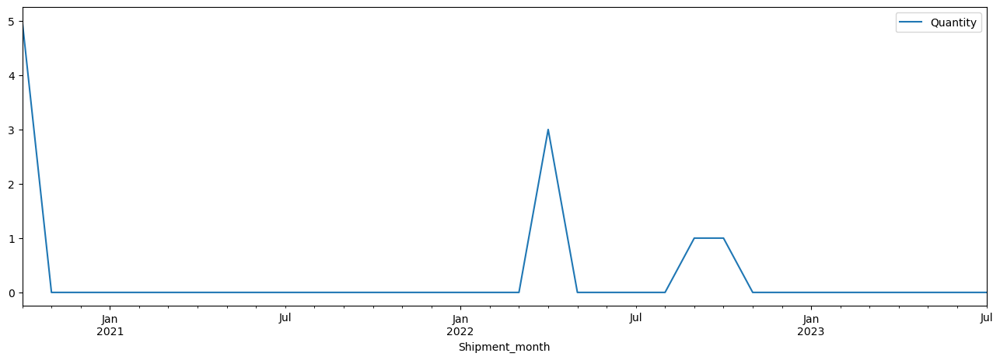

In [96]:
modelling_data_HDCFD_hierarchy2_final_quantity_index.plot(grid = False,figsize = (16,5))
plt.show()

In [97]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss

def obtain_adf_kpss_results(timeseries, max_d):
    """ Build dataframe with ADF statistics and p-value for time series after applying difference on time series
    
    Args:
        time_series (df): Dataframe of univariate time series  
        max_d (int): Max value of how many times apply difference
        
    Return:
        Dataframe showing values of ADF statistics and p when applying ADF test after applying d times 
        differencing on a time-series.
    
    """
    
    results=[]

    for idx in range(max_d):
        adf_result = adfuller(timeseries, autolag='AIC')
        kpss_result = kpss(timeseries, regression='c', nlags="auto")
        timeseries = timeseries.diff().dropna()
        if adf_result[1] <=0.05:
            adf_stationary = True
        else:
            adf_stationary = False
        if kpss_result[1] <=0.05:
            kpss_stationary = False
        else:
            kpss_stationary = True
            
        stationary = adf_stationary & kpss_stationary
            
        results.append((idx,adf_result[1], kpss_result[1],adf_stationary,kpss_stationary, stationary))
    
    # Construct DataFrame 
    results_df = pd.DataFrame(results, columns=['d','adf_stats','p-value', 'is_adf_stationary','is_kpss_stationary','is_stationary' ])
    
    return results_df


In [98]:
obtain_adf_kpss_results(modelling_data_HDCFD_hierarchy2_final_quantity_index,3)

C:\Users\WF692YP\AppData\Local\Temp\ipykernel_16396\1271217870.py:21: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(timeseries, regression='c', nlags="auto")
C:\Users\WF692YP\AppData\Local\Temp\ipykernel_16396\1271217870.py:21: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(timeseries, regression='c', nlags="auto")
C:\Users\WF692YP\AppData\Local\Temp\ipykernel_16396\1271217870.py:21: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(timeseries, regression='c', nlags="auto")


,d,adf_stats,p-value,is_adf_stationary,is_kpss_stationary,is_stationary
0,0,8.024377e-18,0.1,True,True,True
1,1,4.119150e-05,0.1,True,True,True
2,2,2.070881e-05,0.1,True,True,True


In [104]:
modelling_data["Forecast_Hierarchy"].unique()

array(['0009200301003000|US_DC_Athens|US', '038-000007-0001|PH_DC_PHL|PH',
       '04041|AU_DC_Sydney|AU', ..., 'ZC4GM2|NL_DC_Venray|DE',
       'ZC4GM2|NL_DC_Venray|NL', 'ZC4GM2|PL_FO_Northern|PL'], dtype=object)

In [105]:
modelling_data["price_change_Increase"].unique()

array([0, 1], dtype=uint8)

In [106]:
modelling_data["price_change_Decrease"].unique()

array([0, 1], dtype=uint8)

In [107]:
len(modelling_data["Forecast_Hierarchy"].unique())

70777

In [108]:
modelling_data["ProductLine"].unique()

array([' PPCTR ', ' SP3PH ', ' HDCFD ', ' PPACB ', ' SPBPP ', ' SPPPP '],
      dtype=object)

In [109]:
modelling_data=modelling_data[modelling_data["ProductLine"].isin([' PPCTR '])]

In [110]:
rca_sppp=modelling_data[modelling_data['Forecast_Hierarchy'].isin(['HUA11397|CN_DC_Shanghai|CN'])]
#rca_sppp.to_csv("C:/Users/Rahul.Bhattacharyya/Downloads/schneider/rca_sppp.csv",index=False)

In [111]:
rca_sppp.head()

,Reference,Country,Site,ProductLine,Division,Shipment_month,Quantity,Forecast_Hierarchy,qty_lag_4,qty_lag_5,moving_avg_3_lag_4,moving_avg_6_lag_4,MonthlyAvgSales_Reference,MonthlyAvgSales_Site_Country,QtrlyAvgSales_Reference,QtrlyAvgSales_Site_Country,MRP,price_change_Decrease,price_change_Increase
621013,HUA11397,CN,CN_DC_Shanghai,PPCTR,Power Products,2020-09,68000.0,HUA11397|CN_DC_Shanghai|CN,0.0,0.0,0.0,0.0,82666.666667,1787.098356,104285.714286,1365.015240,0.0,1,0
621014,HUA11397,CN,CN_DC_Shanghai,PPCTR,Power Products,2020-10,88000.0,HUA11397|CN_DC_Shanghai|CN,0.0,0.0,0.0,0.0,45333.333333,735.362199,126444.444444,903.458838,0.0,0,0
621015,HUA11397,CN,CN_DC_Shanghai,PPCTR,Power Products,2020-11,126000.0,HUA11397|CN_DC_Shanghai|CN,0.0,0.0,0.0,0.0,148000.000000,996.602105,126444.444444,903.458838,0.0,0,0
621016,HUA11397,CN,CN_DC_Shanghai,PPCTR,Power Products,2020-12,278000.0,HUA11397|CN_DC_Shanghai|CN,0.0,0.0,0.0,0.0,186000.000000,971.770415,126444.444444,903.458838,0.0,0,0
621017,HUA11397,CN,CN_DC_Shanghai,PPCTR,Power Products,2021-01,274000.0,HUA11397|CN_DC_Shanghai|CN,68000.0,0.0,68000.0,68000.0,252000.000000,1323.291358,161000.000000,1404.142722,0.0,0,0


In [112]:
modelling_data_ = modelling_data[['Forecast_Hierarchy', 'Shipment_month','Quantity', 
        'qty_lag_5',
       'moving_avg_6_lag_4', 'price_change_Decrease', 'price_change_Increase',
       'MRP',"ProductLine"]]
modelling_data_["abs_price_change_percent"] = abs(modelling_data_['MRP'] - modelling_data_['MRP'].shift(1))*100

C:\Users\WF692YP\AppData\Local\Temp\ipykernel_16396\295720503.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  modelling_data_["abs_price_change_percent"] = abs(modelling_data_['MRP'] - modelling_data_['MRP'].shift(1))*100


In [113]:
modelling_data_['Forecast_Hierarchy'].nunique()

45196

In [114]:
modelling_data_['Quantity'] = pd.to_numeric(modelling_data_['Quantity'], errors='coerce').astype(float)
modelling_data_.fillna(0,inplace=True)

C:\Users\WF692YP\AppData\Local\Temp\ipykernel_16396\836844004.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  modelling_data_['Quantity'] = pd.to_numeric(modelling_data_['Quantity'], errors='coerce').astype(float)
C:\Users\WF692YP\AppData\Local\Temp\ipykernel_16396\836844004.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  modelling_data_.fillna(0,inplace=True)


In [115]:
modelling_data_.head()

,Forecast_Hierarchy,Shipment_month,Quantity,qty_lag_5,moving_avg_6_lag_4,price_change_Decrease,price_change_Increase,MRP,ProductLine,abs_price_change_percent
0,0009200301003000|US_DC_Athens|US,2021-01,16.0,0.0,0.0,0,0,2482.0,PPCTR,0.0
1,0009200301003000|US_DC_Athens|US,2021-02,4.0,0.0,0.0,0,0,2482.0,PPCTR,0.0
2,0009200301003000|US_DC_Athens|US,2021-03,12.0,0.0,0.0,0,0,2482.0,PPCTR,0.0
3,0009200301003000|US_DC_Athens|US,2021-04,8.0,0.0,0.0,1,0,2068.0,PPCTR,41400.0
4,0009200301003000|US_DC_Athens|US,2021-05,1.0,0.0,16.0,1,0,1356.0,PPCTR,71200.0


In [116]:
modelling_data_.isnull().any()

Forecast_Hierarchy          False
Shipment_month              False
Quantity                    False
qty_lag_5                   False
moving_avg_6_lag_4          False
price_change_Decrease       False
price_change_Increase       False
MRP                         False
ProductLine                 False
abs_price_change_percent    False
dtype: bool

In [117]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

In [118]:
modelling_data_.columns

Index(['Forecast_Hierarchy', 'Shipment_month', 'Quantity', 'qty_lag_5',
       'moving_avg_6_lag_4', 'price_change_Decrease', 'price_change_Increase',
       'MRP', 'ProductLine', 'abs_price_change_percent'],
      dtype='object')

In [119]:
from datetime import datetime, timedelta

In [120]:
def get_year_month_four_months_before(input_date_str,number_of_lags):
    # Parse the input string to a datetime object
    input_date = datetime.strptime(input_date_str, "%Y-%m")

    
    # Calculate the date 4 months before
    four_months_before = input_date - timedelta(days=(number_of_lags+1) * 30)  # Assuming an average of 30 days per month

    # Get the Year and Week for the calculated date
    year_month = four_months_before.strftime("%Y-%m")

    return year_month

In [121]:
def get_year_month_one_months_after(input_date):
    # Convert input string to datetime object
    date_object = datetime.strptime(input_date, '%Y-%m')

    # Calculate the first day of the next month
    next_month = date_object.replace(day=1) + timedelta(days=32)

    # Format the result as YYYY-MM string
    result = next_month.strftime('%Y-%m')
    
    return result


In [122]:
input_date = datetime.strptime('2023-01', "%Y-%m")

    # Calculate the date 4 months before
four_months_before = input_date + timedelta(days=1*30)  # Assuming an average of 30 days per month
four_months_before
    # Get the Year and Week for the calculated date
year_month = four_months_before.strftime("%Y-%m")
year_month 

'2023-01'

In [123]:
get_year_month_one_months_after("2023-01")

'2023-02'

In [124]:
import warnings
warnings.filterwarnings("ignore")

In [125]:
df=modelling_data_

In [30]:
df

,Forecast_Hierarchy,Shipment_month,Quantity,qty_lag_5,moving_avg_6_lag_4,price_change_Decrease,price_change_Increase,MRP,ProductLine,abs_price_change_percent
0,0009200301003000|US_DC_Athens|US,2021-01,16.0,0.0,0.0,0,0,2482.0,PPCTR,NaN
1,0009200301003000|US_DC_Athens|US,2021-02,4.0,0.0,0.0,0,0,2482.0,PPCTR,0.0
2,0009200301003000|US_DC_Athens|US,2021-03,12.0,0.0,0.0,0,0,2482.0,PPCTR,0.0
3,0009200301003000|US_DC_Athens|US,2021-04,8.0,0.0,0.0,1,0,2068.0,PPCTR,41400.0
4,0009200301003000|US_DC_Athens|US,2021-05,1.0,0.0,16.0,1,0,1356.0,PPCTR,71200.0
...,...,...,...,...,...,...,...,...,...,...
1930875,ZC4GM2|PL_FO_Northern|PL,2023-03,0.0,0.0,0.0,0,0,114.0,PPCTR,0.0
1930876,ZC4GM2|PL_FO_Northern|PL,2023-04,0.0,0.0,0.0,0,0,114.0,PPCTR,0.0
1930877,ZC4GM2|PL_FO_Northern|PL,2023-05,0.0,0.0,0.0,0,0,114.0,PPCTR,0.0
1930878,ZC4GM2|PL_FO_Northern|PL,2023-06,0.0,0.0,0.0,0,0,114.0,PPCTR,0.0


dt_clean

In [127]:
df["Forecast_Hierarchy"].unique()

array(['0009200301003000|US_DC_Athens|US',
       '06717030|ES_DC_IberiaSantBoi|ES',
       '06728060|ES_DC_IberiaSantBoi|ES', ..., 'ZC4GM2|NL_DC_Venray|DE',
       'ZC4GM2|NL_DC_Venray|NL', 'ZC4GM2|PL_FO_Northern|PL'], dtype=object)

In [128]:
#import xgboost
scope1=["BE425M|US_DC_LAD|US"]

In [129]:
df.columns


Index(['Forecast_Hierarchy', 'Shipment_month', 'Quantity', 'qty_lag_5',
       'moving_avg_6_lag_4', 'price_change_Decrease', 'price_change_Increase',
       'MRP', 'ProductLine', 'abs_price_change_percent'],
      dtype='object')

In [130]:
#df=df.drop(['QtrlyAvgSales_Reference', 'QtrlyAvgSales_Site_Country', 'qty_lag_5',
#       'qty_lag_6', 'qty_lag_7', 'moving_avg_3_lag_5', 'moving_avg_6_lag_5'],axis=1)
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso

In [131]:
#####################Periodic code: willl take higher time#######################################################################

number_of_lags=3
apo_fcast=pd.DataFrame()
fcast_months=['2023-01', '2023-02', '2023-03', '2023-04', '2023-05', '2023-06']
scope=df["Forecast_Hierarchy"].unique()
scope1=scope[0:1]
for fu in scope[30000:len(scope)]:
    dt_clean=df[df["Forecast_Hierarchy"]==fu]
    productline=dt_clean["ProductLine"].unique()[0]
    dt_clean=dt_clean.drop(["Forecast_Hierarchy","ProductLine"],axis=1)
    dt_clean=dt_clean.sort_values(('Shipment_month'),ascending=True).reset_index(drop=True)
    


    for f_months in fcast_months:
        print('Forecast month: ',f_months)
        lookup_month=get_year_month_four_months_before(f_months,number_of_lags)
        one_forward_month=get_year_month_one_months_after(lookup_month)
        if lookup_month in dt_clean["Shipment_month"].unique():
            while one_forward_month<=f_months:
                #print("one_forward_month:",one_forward_month)
                #print("lookup_month:",lookup_month)
                train_data=dt_clean[dt_clean["Shipment_month"]<=lookup_month]

                test_data=dt_clean[dt_clean["Shipment_month"]==one_forward_month]
                del train_data['Shipment_month']
                del test_data['Shipment_month']
                features = np.array(train_data.drop(['Quantity'], axis = 1))
                target = np.array(train_data['Quantity'])
                rf = RandomForestRegressor(bootstrap=True, criterion='friedman_mse',
                  max_depth=5, max_leaf_nodes=None, min_samples_leaf=2,
                  min_samples_split=2, min_weight_fraction_leaf=0.0, n_jobs=2, oob_score=False, random_state=0,
                  verbose=0, warm_start=False)
                
                #sc_X = StandardScaler()
                #sc_y = StandardScaler()
                model_rf = rf.fit(features,target)

                #xgb = Lasso(alpha=0.9)
                #model_xgb=xgb.fit((features),(target))


                toFcst_features = test_data.drop("Quantity",axis=1).values
                fcst_list_rf = list(model_rf.predict(toFcst_features))
                #train_data=dt_clean[dt_clean["Shipment_month"]<=one_forward_month]
                
                #fcst_xgb = list((model_xgb.predict(toFcst_features)))
                pred_rf=dt_clean[dt_clean["Shipment_month"]==f_months].copy(deep=True)
                dt_clean["Quantity"]=np.where(dt_clean["Shipment_month"]=="one_forward_month", fcst_list_rf, dt_clean["Quantity"])
                lookup_month=get_year_month_one_months_after(lookup_month)
                one_forward_month=get_year_month_one_months_after(one_forward_month)
                lags = [5]
                for lag in lags:
                    dt_clean[f'qty_lag_{lag}'] = dt_clean['Quantity'].shift(lag)
                windows = [6]
                for window in windows:
                    dt_clean[f'moving_avg_{window}'] = dt_clean['Quantity'].rolling(window=window, min_periods=1).mean().reset_index(level=0, drop=True)

                lags_moving = [4]
                for lag in lags_moving:
                    for window in windows:
                        dt_clean[f'moving_avg_{window}_lag_{lag}'] = dt_clean[f'moving_avg_{window}'].shift(lag)
                dt_clean=dt_clean.fillna(0)
            #print("one_forward_month:",one_forward_month)
            #print("lookup_month:",lookup_month)
            pred_rf['FORECAST_rf']=fcst_list_rf
            pred_rf['FORECAST_xgb']=0
            pred_rf['Shipment_month'] = f_months
            pred_rf['Forecast_Hierarchy']=fu
            pred_rf = pred_rf[['Forecast_Hierarchy','Shipment_month','Quantity','FORECAST_rf','FORECAST_xgb']]
            pred_rf["ProductLine"]=productline
            Predicted_Lag4=pd.DataFrame()
            Predicted_Lag4 = pd.concat([Predicted_Lag4, pred_rf])
            apo_fcast=pd.concat([apo_fcast, Predicted_Lag4])
    print("Completed:",fu)
    print ("completed",int(list(scope).index(fu)),"of",len(scope))


        

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N0610Q5N|CN_DC_Shanghai|CN
completed 30000 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N0610Q5N|CN_DC_Wuhan|CN
completed 30001 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N0610Q7N|CN_DC_Wuhan|CN
completed 30002 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N09004M7N|CN_DC_Wuhan|CN
completed 30003 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  20

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N0910E5N|CN_DC_Wuhan|CN
completed 30038 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N0910E7N|CN_DC_Wuhan|CN
completed 30039 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N0910F5N|CN_DC_Beijing|CN
completed 30040 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N0910F5N|CN_DC_GuangZhou|CN
completed 30041 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N0910F5N|CN_DC_Shanghai|CN
c

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N1201F5N|CN_DC_Shanghai|CN
completed 30076 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N1201F5N|CN_DC_Wuhan|CN
completed 30077 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N1201F7N|CN_DC_Wuhan|CN
completed 30078 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N1201M5N|CN_DC_Beijing|CN
completed 30079 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N1201M5N|CN_DC_GuangZhou|CN
completed 30080 of 45196
Forecast month:  2023-01
F

Completed: LC1N1210Q5N|CN_DC_Shanghai|CN
completed 30114 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N1210Q5N|CN_DC_Wuhan|CN
completed 30115 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N1210Q7N|CN_DC_Wuhan|CN
completed 30116 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N18004M7N|CN_DC_Wuhan|CN
completed 30117 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N1801B5N|CN_DC_Beijing|CN
completed 30118 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Fore

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N1810F5N|CN_DC_Beijing|CN
completed 30153 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N1810F5N|CN_DC_Shanghai|CN
completed 30154 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N1810F5N|CN_DC_Wuhan|CN
completed 30155 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N1810F7N|CN_DC_Wuhan|CN
completed 30156 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N181

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N2501Q5N|CN_DC_Beijing|CN
completed 30191 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N2501Q5N|CN_DC_Shanghai|CN
completed 30192 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N2501Q5N|CN_DC_Wuhan|CN
completed 30193 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N2501Q7N|CN_DC_Wuhan|CN
completed 30194 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N2510B5N|CN_DC_Shanghai|CN
completed 30195 of 45196
Fo

Forecast month:  2023-06
Completed: LC1N3201F5N|CN_DC_Wuhan|CN
completed 30229 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N3201F7N|CN_DC_Wuhan|CN
completed 30230 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N3201M5N|CN_DC_Beijing|CN
completed 30231 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N3201M5N|CN_DC_GuangZhou|CN
completed 30232 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N3201M5N|CN_DC_Shanghai|CN
completed 30233 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
F

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N38008E7N|CN_DC_Wuhan|CN
completed 30268 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N3801B5N|CN_DC_Wuhan|CN
completed 30269 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N3801B7N|CN_DC_Wuhan|CN
completed 30270 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N3801CC5N|CN_DC_Wuhan|CN
completed 30271 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N3801E5

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N40B5N|CN_DC_Shanghai|CN
completed 30306 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N40B5N|CN_DC_Wuhan|CN
completed 30307 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N40B7N|CN_DC_Wuhan|CN
completed 30308 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N40CC5N|CN_DC_Shanghai|CN
completed 30309 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N40CC5N|CN_DC_Wuhan|CN
completed 30310 of 45196
Forecast month:  2023-01
Forecast mon

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N50M7N|CN_DC_Wuhan|CN
completed 30345 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N50Q5N|CN_DC_Beijing|CN
completed 30346 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N50Q5N|CN_DC_GuangZhou|CN
completed 30347 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N50Q5N|CN_DC_Shanghai|CN
completed 30348 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N50Q5N|C

Forecast month:  2023-06
Completed: LC1N80CC5N|CN_DC_Shanghai|CN
completed 30383 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N80E5N|CN_DC_Shanghai|CN
completed 30384 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N80E7N|CN_DC_Shanghai|CN
completed 30385 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N80F5N|CN_DC_Shanghai|CN
completed 30386 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N80F6N|CN_DC_Shanghai|CN
completed 30387 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Fore

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1R0610B5N|CN_DC_Wuhan|CN
completed 30422 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1R0610F5N|CN_DC_Wuhan|CN
completed 30423 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1R0610M5N|CN_DC_Shanghai|CN
completed 30424 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1R0610M5N|CN_DC_Wuhan|CN
completed 30425 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1R0610Q

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1R1810Q5N|CN_DC_ChengDu|CN
completed 30460 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1R1810Q5N|CN_DC_Wuhan|CN
completed 30461 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1R2501M5N|CN_DC_GuangZhou|CN
completed 30462 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1R2501M5N|CN_DC_Shanghai|CN
completed 30463 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1R2501M5N|CN_DC_Wuhan|CN
completed 30464 of 45196
Forecast month:  2023-01
F

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1R65Q5N|CN_DC_Wuhan|CN
completed 30499 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1R80M5N|CN_DC_Beijing|CN
completed 30500 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1R80M5N|CN_DC_GuangZhou|CN
completed 30501 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1R80M5N|CN_DC_Shanghai|CN
completed 30502 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1R80Q5N|C

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SK0600M7|IT_DC_Venaria|IT
completed 30537 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SK0600M7|NL_DC_Venray|DE
completed 30538 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SK0600M7|PL_FO_Northern|PL
completed 30539 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SK0600M7|US_DC_Mechanicsburg|US
completed 30540 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SKGC200B7|US_DC_Mechanicsburg|US
completed 30575 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SKGC200E7|DE_FO_BNDch|DE
completed 30576 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SKGC200E7|ES_DC_IberiaSantBoi|ES
completed 30577 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SKGC200E7|FR_DC_Evreux|NL
completed 30578 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Co

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SKGC200U7|FR_DC_Evreux|FR
completed 30613 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SKGC200U7|FR_DC_Evreux|NL
completed 30614 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SKGC200U7|GB_DC_Telford|GB
completed 30615 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SKGC200U7|IT_DC_Venaria|IT
completed 30616 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1V610P7|PL_FO_Northern|PL
completed 30653 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D093BDS149-B|FR_DC_Evreux|FR
completed 30654 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D093BDS149|BE_FO_BNDch|BE
completed 30655 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D093BDS149|FR_DC_Evreux|FR
completed 30656 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: L

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D099B7|US_DC_Mechanicsburg|US
completed 30691 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09B7-B|FR_DC_Evreux|FR
completed 30692 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09B7-B|FR_DC_Evreux|SE
completed 30693 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09B7C|CN_DC_Wuhan|CN
completed 30694 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09B7V|FR_DC_Evreux|FR
completed 30695 of 45196
Forecas

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09BD|SE_DC_Orebro|SE
completed 30730 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09BD|US_DC_Athens|US
completed 30731 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09BD|US_DC_Mechanicsburg|US
completed 30732 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09BL-B|FR_DC_Evreux|FR
completed 30733 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09BLV-B

Completed: LC2D09E7C|CN_DC_Wuhan|CN
completed 30768 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09E7|BE_FO_BNDch|BE
completed 30769 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09E7|DE_FO_BNDch|DE
completed 30770 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09E7|FR_DC_Evreux|FR
completed 30771 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09E7|FR_DC_Evreux|NL
completed 30772 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09F7|US_DC_Mechanicsburg|US
completed 30807 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09FE7-B|FR_DC_Evreux|FR
completed 30808 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09FE7|FR_DC_Evreux|FR
completed 30809 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09FE7|IT_DC_Venaria|IT
completed 30810 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09FE7|NL_DC_Venray|BE
completed 30811 of 45196
Forecast month:  2023-01
Foreca

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09M7|IT_DC_Venaria|IT
completed 30846 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09M7|NL_DC_Venray|DE
completed 30847 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09M7|PL_FO_Northern|PL
completed 30848 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09M7|US_DC_Mechanicsburg|US
completed 30849 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09MD|F

Completed: LC2D09V7|NL_DC_Venray|NL
completed 30884 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09V7|SE_DC_Orebro|DK
completed 30885 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09V7|SE_DC_Orebro|SE
completed 30886 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D115004EM7|HK_DC_HongKong|HK
completed 30887 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D115004M7|HK_DC_HongKong|HK
completed 30888 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecas

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D115P7|NL_DC_Venray|DE
completed 30923 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D115P7|NL_DC_Venray|NL
completed 30924 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D115P7|PL_FO_Northern|PL
completed 30925 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D115P7|SE_DC_Orebro|DK
completed 30926 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D115P7|SE_D

Completed: LC2D12BD|FR_DC_Evreux|FR
completed 30961 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12BD|GB_DC_Telford|GB
completed 30962 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12BD|IT_DC_Venaria|IT
completed 30963 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12BD|NL_DC_Venray|BE
completed 30964 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12BD|NL_DC_Venray|DE
completed 30965 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12D7|NL_DC_Venray|DE
completed 31000 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12D7|NL_DC_Venray|NL
completed 31001 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12D7|NL_FO_BNDch|NL
completed 31002 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12D7|PL_FO_Northern|PL
completed 31003 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12E7-B|FR_DC_Evreux|FR
completed 31004 of 45196
Forecast month:  

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12F7|OOS_DRP|US
completed 31039 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12F7|PL_FO_Northern|PL
completed 31040 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12F7|SE_DC_Orebro|SE
completed 31041 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12F7|US_DC_Mechanicsburg|US
completed 31042 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12FD|GB_DC_T

Completed: LC2D12P7|NL_DC_Venray|DE
completed 31077 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12P7|NL_DC_Venray|NL
completed 31078 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12P7|PL_FO_Northern|PL
completed 31079 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12P7|SE_DC_Orebro|DK
completed 31080 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12P7|SE_DC_Orebro|SE
completed 31081 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D183BD|IT_DC_Venaria|IT
completed 31116 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D183BD|NL_DC_Venray|DE
completed 31117 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18B7-B|FR_DC_Evreux|FR
completed 31118 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18B7C|CN_DC_Wuhan|CN
completed 31119 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18B7V|IT_DC_Venaria|IT
completed 311

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18BL-B|FR_DC_Evreux|FR
completed 31155 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18BL|FR_DC_Evreux|FR
completed 31156 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18BL|FR_DC_Evreux|NL
completed 31157 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18BL|GB_DC_Telford|GB
completed 31158 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18BL|HU_DC_CE

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18ED|FR_DC_Evreux|FR
completed 31194 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18ED|GB_DC_Telford|GB
completed 31195 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18ED|NL_DC_Venray|BE
completed 31196 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18EHE|GB_DC_Telford|GB
completed 31197 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18F7-B|FR_DC_

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18M7|IT_DC_Venaria|IT
completed 31233 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18M7|PL_FO_Northern|PL
completed 31234 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18M7|US_DC_Mechanicsburg|US
completed 31235 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18P7-B|FR_DC_Evreux|FR
completed 31236 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18P7

Completed: LC2D25BD|ES_DC_IberiaSantBoi_AS90|ES
completed 31271 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25BD|FR_DC_Evreux|FR
completed 31272 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25BD|FR_DC_Evreux|NL
completed 31273 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25BD|GB_DC_Telford|GB
completed 31274 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25BD|IT_DC_Venaria|IT
completed 31275 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Foreca

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25D7|NL_FO_BNDch|NL
completed 31310 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25D7|PL_FO_Northern|PL
completed 31311 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25D7|SE_DC_Orebro|DK
completed 31312 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25D7|SE_DC_Orebro|SE
completed 31313 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25D7|US_DC_Mechanicsburg|US
completed 31314 of 45196
Forecast mon

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25FE7|CN_DC_Shanghai|CN
completed 31349 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25FE7|FR_DC_Evreux|FR
completed 31350 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25FE7|IT_DC_Venaria|IT
completed 31351 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25FE7|NL_DC_Venray|BE
completed 31352 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25FE7|NL_

Completed: LC2D25Q7C|CN_DC_Wuhan|CN
completed 31387 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25U7|GB_DC_Telford|GB
completed 31388 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25U7|IT_DC_Venaria|IT
completed 31389 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25U7|NL_DC_Venray|DE
completed 31390 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25U7|US_DC_Mechanicsburg|US
completed 31391 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mo

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D32BNE|NL_DC_Venray|NL
completed 31426 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D32D7|FR_DC_Evreux|FR
completed 31427 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D32D7|GB_DC_Telford|GB
completed 31428 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D32D7|NL_DC_Venray|BE
completed 31429 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D32D7|NL_DC_Venray|DE
completed 31430 of 45196
Forecast month:  2023-01
Forecast month:  2

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D32G7|US_DC_Chino|US
completed 31465 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D32G7|US_DC_Mechanicsburg|US
completed 31466 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D32JL|US_DC_Mechanicsburg|US
completed 31467 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D32KUEA|FR_DC_Evreux|FR
completed 31468 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D3

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D38B7|NL_DC_Venray|BE
completed 31504 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D38B7|NL_DC_Venray|DE
completed 31505 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D38B7|NL_DC_Venray|NL
completed 31506 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D38B7|NL_FO_BNDch|NL
completed 31507 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D38B7|PL_FO_Northe

Completed: LC2D38P7|FR_DC_Evreux|FR
completed 31542 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D38P7|NL_DC_Venray|BE
completed 31543 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D38P7|NL_DC_Venray|DE
completed 31544 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D38P7|NL_DC_Venray|NL
completed 31545 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D38P7|PL_FO_Northern|PL
completed 31546 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D40AE7-B|FR_DC_Evreux|FR
completed 31581 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D40AE7|FR_DC_Evreux|FR
completed 31582 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D40AE7|GB_DC_Telford|GB
completed 31583 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D40AE7|IT_DC_Venaria|IT
completed 31584 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D40AE7|NL

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D40AM7|IT_DC_Venaria|IT
completed 31619 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D40AM7|US_DC_Mechanicsburg|US
completed 31620 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D40AP7-B|FR_DC_Evreux|FR
completed 31621 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D40AP7|FR_DC_Evreux|FR
completed 31622 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D40AP7|GB_DC_Telford|GB
completed 31623 of 45196
Forecast month:  2023-01
Fore

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D50ABNE|US_DC_Mechanicsburg|US
completed 31658 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D50AE7-B|FR_DC_Evreux|FR
completed 31659 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D50AE7|FR_DC_Evreux|FR
completed 31660 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D50AE7|GB_DC_Telford|GB
completed 31661 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D5

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D50AP7|NL_DC_Venray|DE
completed 31696 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D50AP7|NL_DC_Venray|NL
completed 31697 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D50AP7|PL_FO_Northern|PL
completed 31698 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D50AP7|SE_DC_Orebro|DK
completed 31699 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D50AP7|SE_DC_Orebro|SE
completed 31700 of 45196
Forecast month:  2023-01
Forecast mont

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D65AE7|PL_FO_Northern|PL
completed 31735 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D65AE7|US_DC_Mechanicsburg|US
completed 31736 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D65AED|IT_DC_Venaria|IT
completed 31737 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D65AED|NL_DC_Venray|DE
completed 31738 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D65

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D65AP7|GB_DC_Telford|GB
completed 31773 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D65AP7|HU_DC_CEELog_Budapest|PL
completed 31774 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D65AP7|NL_DC_Venray|BE
completed 31775 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D65AP7|NL_DC_Venray|DE
completed 31776 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D65AP7|NL_DC_Venray|NL
completed 31777 of 45196
Forecast month:  2023-01
Forec

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D80E7|FR_DC_Evreux|FR
completed 31812 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D80E7|GB_DC_Telford|GB
completed 31813 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D80E7|IT_DC_Venaria|IT
completed 31814 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D80E7|NL_DC_Venray|BE
completed 31815 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D80E7|NL_DC_Ven

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D95B7|FR_DC_Evreux|FR
completed 31851 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D95B7|NL_DC_Venray|DE
completed 31852 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D95B7|PL_FO_Northern|PL
completed 31853 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D95E7|FR_DC_Evreux|FR
completed 31854 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D95E7|IT_DC_Ven

Completed: LC2DT25BD|NL_DC_Venray|DE
completed 31889 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT25BD|NL_DC_Venray|NL
completed 31890 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT25BD|US_DC_Mechanicsburg|US
completed 31891 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT25E7-B|FR_DC_Evreux|FR
completed 31892 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT25E7|FR_DC_Evreux|FR
completed 31893 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Foreca

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT32F7|NL_DC_Venray|BE
completed 31928 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT32G7|US_DC_Mechanicsburg|US
completed 31929 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT32P7-B|FR_DC_Evreux|FR
completed 31930 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT32P7|DE_FO_BNDch|DE
completed 31931 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT32P

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT40G7|NL_DC_Venray|DE
completed 31966 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT40G7|US_DC_Mechanicsburg|US
completed 31967 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT40GD|US_DC_Mechanicsburg|US
completed 31968 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT40M7|FR_DC_Evreux|FR
completed 31969 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT40M7|IT_DC_Venaria|IT
completed 31970 of 45196
Forecast month:  2023-01


Completed: LC2K0601B7|DE_FO_BNDch|DE
completed 32004 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0601B7|FR_DC_Evreux|FR
completed 32005 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0601B7|GB_DC_Telford|GB
completed 32006 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0601B7|HU_DC_CEELog_Budapest|PL
completed 32007 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0601B7|IT_DC_Venaria|IT
completed 32008 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03


Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0601M7|IT_DC_Venaria|IT
completed 32044 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0601M7|NL_DC_Venray|BE
completed 32045 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0601M7|NL_DC_Venray|DE
completed 32046 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0601M7|PL_FO_Northern|PL
completed 32047 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0601M

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0610B7|FR_DC_Evreux|NL
completed 32082 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0610B7|GB_DC_Telford|GB
completed 32083 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0610B7|IT_DC_Venaria|IT
completed 32084 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0610B7|NL_DC_Venray|BE
completed 32085 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0610B7|NL_DC_Venray|DE
completed 32086 of 45196
Forecast

Forecast month:  2023-06
Completed: LC2K0610P7|DE_FO_BNDch|DE
completed 32120 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0610P7|FR_DC_Evreux|FR
completed 32121 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0610P7|GB_DC_Telford|GB
completed 32122 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0610P7|HU_DC_CEELog_Budapest|PL
completed 32123 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0610P7|IT_DC_Venaria|IT
completed 32124 of 45196
Forecast month:  2023-01
Forecast month:  2023-02


Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K09004M7|IT_DC_Venaria|IT
completed 32159 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K09004M7|NL_DC_Venray|BE
completed 32160 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K09004M7|NL_DC_Venray|DE
completed 32161 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K09013P7|HU_DC_CEELog_Budapest|PL
completed 32162 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0901B7|NL_DC_Venray|NL
completed 32197 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0901B7|OOS_DRP|US
completed 32198 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0901B7|PL_FO_Northern|PL
completed 32199 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0901B7|SE_DC_Orebro|DK
completed 32200 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0901B7|SE_DC_Orebro|SE
completed 322

Forecast month:  2023-06
Completed: LC2K0901F7|US_DC_Athens|US
completed 32235 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0901F7|US_DC_Mechanicsburg|US
completed 32236 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0901G7|FR_DC_Evreux|FR
completed 32237 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0901G7|GB_DC_Telford|GB
completed 32238 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0901G7|IT_DC_Venaria|IT
completed 32239 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
F

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K09103B7|FR_DC_Evreux|FR
completed 32274 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K09103B7|NL_DC_Venray|BE
completed 32275 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K09103E7|FR_DC_Evreux|FR
completed 32276 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K09103E7|GB_DC_Telford|GB
completed 32277 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K091

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0910B7|US_DC_Athens|US
completed 32312 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0910B7|US_DC_Mechanicsburg|US
completed 32313 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0910D72|NL_DC_Venray|DE
completed 32314 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0910D7|DE_FO_BNDch|DE
completed 32315 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0910D7|FR_DC_Evreux|FR
completed 32316 of 45196
For

Forecast month:  2023-06
Completed: LC2K0910M7|NL_DC_Venray|NL
completed 32350 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0910M7|PL_FO_Northern|PL
completed 32351 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0910M7|SE_DC_Orebro|SE
completed 32352 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0910M7|US_DC_Mechanicsburg|US
completed 32353 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0910P7|BE_FO_BNDch|BE
completed 32354 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Fo

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K1201E7|FR_DC_Evreux|FR
completed 32389 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K1201E7|GB_DC_Telford|GB
completed 32390 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K1201E7|IT_DC_Venaria|IT
completed 32391 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K1201E7|NL_DC_Venray|BE
completed 32392 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K1201E7

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K12107B7|US_DC_Mechanicsburg|US
completed 32427 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K1210B7|CN_DC_Shanghai|CN
completed 32428 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K1210B7|ES_DC_IberiaSantBoi_AS90|ES
completed 32429 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K1210B7|FR_DC_Evreux|FR
completed 32430 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K1210B7|GB_DC_Telford|GB
completed 32

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K1210M7|IT_DC_Venaria|IT
completed 32465 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K1210M7|NL_DC_Venray|DE
completed 32466 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K1210M7|NL_DC_Venray|NL
completed 32467 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K1210P7|DE_FO_BNDch|DE
completed 32468 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K1210P7|FR_DC_Evreux|FR
completed 32469 of 45196
Forecast month:  2023-01
Forecast m

Forecast month:  2023-06
Completed: LC3D090AP7|NL_DC_Venray|BE
completed 32503 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D090AP7|NL_DC_Venray|DE
completed 32504 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D090AP7|NL_DC_Venray|NL
completed 32505 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D09AB7|FR_DC_Evreux|FR
completed 32506 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D09AB7|GB_DC_Telford|GB
completed 32507 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast mo

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D12AB7|NL_FO_BNDch|NL
completed 32542 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D12AP7-B|FR_DC_Evreux|FR
completed 32543 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D12AP7-B|FR_DC_Evreux|SE
completed 32544 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D12AP7|DK_DC_Ringsted|DK
completed 32545 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D12AP7|F

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D18AB7-B|FR_DC_Evreux|FR
completed 32580 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D18AB7|ES_DC_IberiaSantBoi_AS90|ES
completed 32581 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D18AB7|FR_DC_Evreux|FR
completed 32582 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D18AB7|GB_DC_Telford|GB
completed 32583 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D18AB7|IT_DC_Venaria|IT
completed 32584 of 45196
Forecast month:  2023-01

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D32AB7-B|FR_DC_Evreux|FR
completed 32620 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D32AB7|FR_DC_Evreux|FR
completed 32621 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D32AB7|GB_DC_Telford|GB
completed 32622 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D32AB7|HU_DC_CEELog_Budapest|PL
completed 32623 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D

Forecast month:  2023-06
Completed: LC3D80F7|ES_DC_IberiaSantBoi|ES
completed 32658 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D80F7|NL_DC_Venray|BE
completed 32659 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D80M7|ES_DC_IberiaSantBoi|ES
completed 32660 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D80M7|NL_DC_Venray|BE
completed 32661 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D80P7A64|ES_DC_IberiaSantBoi|ES
completed 32662 of 45196
Forecast month:  2023-01
Forecast month:  2023

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC7K09004B7|NL_DC_Venray|NL
completed 32697 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC7K09004B7|US_DC_Mechanicsburg|US
completed 32698 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC7K09004M7|FR_DC_Evreux|FR
completed 32699 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC7K09004M7|GB_DC_Telford|GB
completed 32700 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC7K1201F7PKX|ES_DC_IberiaSantBoi|ES
completed 32735 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC7K1201F7PK|ES_DC_IberiaSantBoi|ES
completed 32736 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC7K1201M7PKX|ES_DC_IberiaSantBoi|ES
completed 32737 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC7K1201M7PK|ES_DC_IberiaSantBoi|ES
completed 32738 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC7K1201M7|FR_DC_Evreux|

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09F7|IT_DC_Venaria|IT
completed 32773 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09F7|NL_DC_Venray|BE
completed 32774 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09F7|NL_DC_Venray|DE
completed 32775 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09F7|SE_DC_Orebro|SE
completed 32776 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09F7|US_DC_Mech

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09P7A09|NL_DC_Venray|BE
completed 32811 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09P7A09|NL_DC_Venray|DE
completed 32812 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09P7A09|NL_DC_Venray|NL
completed 32813 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09P7A09|NL_FO_BNDch|NL
completed 32814 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09P7A09|SE_DC_Orebro|DK
completed 32815 of 45196
Forecast month:  2023-01
Foreca

Forecast month:  2023-06
Completed: LE1D09P7|ES_DC_IberiaSantBoi|ES
completed 32849 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09P7|FR_DC_Evreux|FR
completed 32850 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09P7|FR_DC_Evreux|NL
completed 32851 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09P7|GB_DC_Telford|GB
completed 32852 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09P7|HU_DC_CEELog_Budapest|PL
completed 32853 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
For

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09U7|GB_DC_Telford|GB
completed 32888 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09U7|NL_DC_Venray|DE
completed 32889 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09V7A04|FR_DC_Evreux|FR
completed 32890 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09V7A04|NL_DC_Venray|DE
completed 32891 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09V7A04|S

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09V7|US_DC_Mechanicsburg|US
completed 32926 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D1235P7S10NSE|SE_DC_Orebro|SE
completed 32927 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D1235P7S10SE|SE_DC_Orebro|SE
completed 32928 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D1235V7S10NSE|SE_DC_Orebro|SE
completed 32929 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D1235V7S10SE|SE_DC_Orebro|SE
completed 32930 of 45196
Forecast

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D12P7|ES_DC_IberiaSantBoi|ES
completed 32964 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D12P7|FR_DC_Evreux|FR
completed 32965 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D12P7|FR_DC_Evreux|NL
completed 32966 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D12P7|GB_DC_Telford|GB
completed 32967 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D12P7|IT_DC_Venaria|IT
completed 32968 of 45196
Forecast month:  2023-01
Forecast mo

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D12V7|SE_DC_Orebro|DK
completed 33003 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D12V7|SE_DC_Orebro|SE
completed 33004 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D12V7|US_DC_Mechanicsburg|US
completed 33005 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D1835P7S10NSE|SE_DC_Orebro|SE
completed 33006 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D1

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D18P7A13|SE_DC_Orebro|DK
completed 33041 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D18P7A2421SE|SE_DC_Orebro|SE
completed 33042 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D18P7|ES_DC_IberiaSantBoi|ES
completed 33043 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D18P7|FR_DC_Evreux|FR
completed 33044 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1

Forecast month:  2023-06
Completed: LE1D18V7|SE_DC_Orebro|DK
completed 33079 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D18V7|SE_DC_Orebro|SE
completed 33080 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D2535P7S10NSE|SE_DC_Orebro|SE
completed 33081 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D2535P7S10SE|SE_DC_Orebro|SE
completed 33082 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D2535V7S10SE|SE_DC_Orebro|SE
completed 33083 of 45196
Forecast month:  2023-01
Forecast month:  2023-0

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D25U7|NL_DC_Venray|NL
completed 33118 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D25V7A04|SE_DC_Orebro|SE
completed 33119 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D25V7|ES_DC_IberiaSantBoi|ES
completed 33120 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D25V7|FR_DC_Evreux|FR
completed 33121 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D25V7|G

Forecast month:  2023-06
Completed: LE1D35V7|NL_DC_Venray|DE
completed 33156 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D35V7|NL_DC_Venray|NL
completed 33157 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D35V7|SE_DC_Orebro|SE
completed 33158 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D403A62OG70|US_DC_Mechanicsburg|US
completed 33159 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D408C62OG70|MX_MF_Monterrey3|US
completed 33160 of 45196
Forecast month:  2023-01
Forecast month:  2023-

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1GVMEK|PL_FO_Northern|PL
completed 33195 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1GVMEK|SE_DC_Orebro|DK
completed 33196 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1GVMEK|SE_DC_Orebro|SE
completed 33197 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35B707|NL_DC_Venray|BE
completed 33198 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35B710|FR_DC

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35M708|SE_DC_Orebro|SE
completed 33233 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35M710|DE_FO_BNDch|DE
completed 33234 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35M710|ES_DC_IberiaSantBoi|ES
completed 33235 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35M710|FR_DC_Evreux|FR
completed 33236 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35M710|HK_DC_HongKong|HK
co

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35M716|SE_DC_Orebro|SE
completed 33271 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35M721|ES_DC_IberiaSantBoi|ES
completed 33272 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35M721|HK_DC_HongKong|HK
completed 33273 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35M721|HU_DC_CEELog_Budapest|PL
completed 33274 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35M721|NL_DC_Venray|NL
completed 33275 o

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35N712|FR_DC_Evreux|NL
completed 33309 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35N712|GB_DC_Telford|GB
completed 33310 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35N712|HU_DC_CEELog_Budapest|PL
completed 33311 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35N712|NL_DC_Venray|DE
completed 33312 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35N712|NL_DC_Venray|NL
completed 33313 of 45196


Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35P707|FR_DC_Evreux|FR
completed 33347 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35P707|IT_DC_Venaria|IT
completed 33348 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35P707|NL_DC_Venray|DE
completed 33349 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35P707|SE_DC_Orebro|DK
completed 33350 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35P708|ES_DC_IberiaSantBoi|ES
completed 33351 of 45196
Forecast month:  2023-01
Fo

Completed: LE1M35P716|NL_DC_Venray|DE
completed 33385 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35P721|ES_DC_IberiaSantBoi|ES
completed 33386 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35P721|FR_DC_Evreux|FR
completed 33387 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35P721|NL_DC_Venray|DE
completed 33388 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35P722|ES_DC_IberiaSantBoi|ES
completed 33389 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q707|NL_DC_Venray|BE
completed 33424 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q707|NL_DC_Venray|DE
completed 33425 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q707|NL_DC_Venray|NL
completed 33426 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q707|PL_FO_Northern|PL
completed 33427 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q707

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q712|IT_DC_Venaria|IT
completed 33462 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q712|NL_DC_Venray|BE
completed 33463 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q712|NL_DC_Venray|DE
completed 33464 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q712|NL_DC_Venray|NL
completed 33465 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q712|NL_FO_BNDch|NL
completed 33466 of 45196
Forecast m

Forecast month:  2023-06
Completed: LE1M35Q721|NL_DC_Venray|BE
completed 33500 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q721|NL_DC_Venray|DE
completed 33501 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q721|PL_FO_Northern|PL
completed 33502 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q721|SE_DC_Orebro|DK
completed 33503 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q721|SE_DC_Orebro|SE
completed 33504 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35U714|NL_DC_Venray|NL
completed 33539 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35U714|PL_FO_Northern|PL
completed 33540 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35U716|FR_DC_Evreux|FR
completed 33541 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35U716|GB_DC_Telford|GB
completed 33542 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35U71

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35V712|IT_DC_Venaria|IT
completed 33577 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35V712|NL_DC_Venray|DE
completed 33578 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35V714|ES_DC_IberiaSantBoi|ES
completed 33579 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35V714|FR_DC_Evreux|FR
completed 33580 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35V714|FR_DC_Evreux|NL
completed 33581 of 45196
Fo

Forecast month:  2023-06
Completed: LE2D09V7|IT_DC_Venaria|IT
completed 33615 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE2D09V7|NL_DC_Venray|BE
completed 33616 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE2D09V7|NL_DC_Venray|DE
completed 33617 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE2D09V7|SE_DC_Orebro|SE
completed 33618 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE2D12N7|FR_DC_Evreux|FR
completed 33619 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  20

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D09N7|NL_DC_Venray|NL
completed 33654 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D09N7|NL_FO_BNDch|NL
completed 33655 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D09P7A04|NL_DC_Venray|DE
completed 33656 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D09P7A04|SE_DC_Orebro|SE
completed 33657 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D09P7|ES_DC_IberiaSantBoi|ES
complete

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D12U7|ES_DC_IberiaSantBoi|ES
completed 33693 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D12V7|ES_DC_IberiaSantBoi|ES
completed 33694 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D12V7|FR_DC_Evreux|FR
completed 33695 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D12V7|FR_DC_Evreux|NL
completed 33696 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D12

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D35P7|NL_DC_Venray|BE
completed 33732 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D35P7|NL_DC_Venray|DE
completed 33733 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D35P7|SE_DC_Orebro|DK
completed 33734 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D35P7|SE_DC_Orebro|SE
completed 33735 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D35U7|NL_DC_Venra

Completed: LE4D12P7|FR_DC_Evreux|FR
completed 33770 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE4D12P7|GB_DC_Telford|GB
completed 33771 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE4D12P7|NL_DC_Venray|BE
completed 33772 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE4D12P7|NL_DC_Venray|DE
completed 33773 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE4D12Q7|FR_DC_Evreux|FR
completed 33774 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  20

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE4D35V7|FR_DC_Evreux|FR
completed 33809 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE4D35V7|GB_DC_Telford|GB
completed 33810 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE4D35V7|NL_DC_Venray|BE
completed 33811 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE4D35V7|NL_DC_Venray|DE
completed 33812 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE4K065P7|FR_DC_Evreux|FR
completed 33813 of 45196
Forecast month:  2

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LEECDKIT1600S|IT_DC_Venaria|IT
completed 33848 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LEECDKIT161L|IT_DC_Venaria|IT
completed 33849 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LEECDKIT161S|IT_DC_Venaria|IT
completed 33850 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LEECDKIT2000L|IT_DC_Venaria|IT
completed 33851 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1D182M720|FR_DC_Evreux|FR
completed 33886 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1D182M720|NL_DC_Venray|BE
completed 33887 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1D182M720|NL_DC_Venray|DE
completed 33888 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1D182M720|NL_DC_Venray|NL
completed 33889 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1D182M

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065M707|SE_DC_Orebro|SE
completed 33924 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065M708|ES_DC_IberiaSantBoi|ES
completed 33925 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065M708|FR_DC_Evreux|FR
completed 33926 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065M708|GB_DC_Telford|GB
completed 33927 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065M708|NL_DC_Venray|

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065Q705|FR_DC_Evreux|FR
completed 33962 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065Q705|IT_DC_Venaria|IT
completed 33963 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065Q705|NL_DC_Venray|BE
completed 33964 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065Q705|NL_DC_Venray|DE
completed 33965 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065Q706A37|ES_DC_IberiaSantBoi|ES
completed 33966 of 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065Q708|NL_DC_Venray|BE
completed 34000 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065Q708|NL_DC_Venray|DE
completed 34001 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065Q708|NL_DC_Venray|NL
completed 34002 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065Q708|PL_FO_Northern|PL
completed 34003 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065Q710A37|FR_DC_Evreux|FR


Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K095Q714A37|ES_DC_IberiaSantBoi|ES
completed 34038 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K095Q714A37|FR_DC_Evreux|FR
completed 34039 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K095Q714A37|IT_DC_Venaria|IT
completed 34040 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K095Q714A37|NL_DC_Venray|BE
completed 34041 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K095Q714A37|NL_DC_Venray|NL
complet

Forecast month:  2023-06
Completed: LG7D12V716|ES_DC_IberiaSantBoi|ES
completed 34076 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7D12V716|FR_DC_Evreux|FR
completed 34077 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7D12V716|NL_DC_Venray|DE
completed 34078 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7D18M720|ES_DC_IberiaSantBoi|ES
completed 34079 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7D18M720|FR_DC_Evreux|FR
completed 34080 of 45196
Forecast month:  2023-01
Forecast month:  2023

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06B710|FR_DC_Evreux|FR
completed 34116 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06B710|IT_DC_Venaria|IT
completed 34117 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06B710|NL_DC_Venray|BE
completed 34118 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06B710|NL_DC_Venray|NL
completed 34119 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06M702|

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06M708|ES_DC_IberiaSantBoi|ES
completed 34154 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06M708|FR_DC_Evreux|FR
completed 34155 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06M708|FR_DC_Evreux|NL
completed 34156 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06M708|GB_DC_Telford|GB
completed 34157 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06M708|IT_DC_Venaria|IT
completed 34158 of 45196
F

Completed: LG7K06P708|NL_DC_Venray|BE
completed 34192 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06P708|NL_DC_Venray|DE
completed 34193 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06P708|PL_FO_Northern|PL
completed 34194 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06P708|SE_DC_Orebro|DK
completed 34195 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06P710|ES_DC_IberiaSantBoi|ES
completed 34196 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
F

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06Q707|FR_DC_Evreux|NL
completed 34231 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06Q707|GB_DC_Telford|GB
completed 34232 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06Q707|IT_DC_Venaria|IT
completed 34233 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06Q707|NL_DC_Venray|BE
completed 34234 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06Q707

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06V707|FR_DC_Evreux|FR
completed 34269 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06V707|NL_DC_Venray|BE
completed 34270 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06V707|NL_DC_Venray|DE
completed 34271 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06V707|SE_DC_Orebro|SE
completed 34272 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06V708|ES_DC_IberiaSantBoi|ES
completed 34273 of 45196
Forecast month:  2023-01
For

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K09Q714|SE_DC_Orebro|SE
completed 34308 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K09V714|FR_DC_Evreux|FR
completed 34309 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K09V714|NL_DC_Venray|DE
completed 34310 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K09V714|NL_DC_Venray|NL
completed 34311 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K09V714|S

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG8K06Q706|ES_DC_IberiaSantBoi_AS90|ES
completed 34346 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG8K06Q706|ES_DC_IberiaSantBoi|ES
completed 34347 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG8K06Q706|FR_DC_Evreux|FR
completed 34348 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG8K06Q706|IT_DC_Venaria|IT
completed 34349 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG8K06Q706|NL_DC_Venray|BE
completed 34350 of 45196
Forecast month:

Completed: LG8K09N714|NL_DC_Venray|DE
completed 34384 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG8K09Q714|ES_DC_IberiaSantBoi|ES
completed 34385 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG8K09Q714|FR_DC_Evreux|FR
completed 34386 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG8K09Q714|GB_DC_Telford|GB
completed 34387 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG8K09Q714|NL_DC_Venray|BE
completed 34388 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Fo

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LJ7K06Q707|SE_DC_Orebro|DK
completed 34423 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LJ7K06Q707|SE_DC_Orebro|SE
completed 34424 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LJ7K06Q708A29|GB_DC_Telford|GB
completed 34425 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LJ7K06Q708A29|IT_DC_Venaria|IT
completed 34426 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LJ7K

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LJ8K06Q704|IT_DC_Venaria|IT
completed 34461 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LJ8K06Q704|NL_DC_Venray|NL
completed 34462 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LJ8K06Q705|FR_DC_Evreux|FR
completed 34463 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LJ8K06Q705|IT_DC_Venaria|IT
completed 34464 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LJ8K06Q705|NL_DC_Venray|BE
completed 34465 of 45196
Forecast

Forecast month:  2023-06
Completed: LK4AP33TN|IT_DC_Venaria|IT
completed 34499 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LK4AP33TN|US_DC_Mechanicsburg|US
completed 34500 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LK4AP3CN|FR_DC_Evreux|FR
completed 34501 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LK4AP3CN|IT_DC_Venaria|IT
completed 34502 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LK4AP3CN|US_DC_Mechanicsburg|US
completed 34503 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Fo

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D40008BD|NL_DC_Venray|DE
completed 34538 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D40008BD|NL_DC_Venray|NL
completed 34539 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D40008BD|PL_FO_Northern|PL
completed 34540 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D40008BD|SE_DC_Orebro|DK
completed 34541 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D40

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D65008FD|FR_DC_Evreux|FR
completed 34576 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D65008FD|GB_DC_Telford|GB
completed 34577 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D800046SW|PL_FO_Northern|PL
completed 34578 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D80004BD|CN_DC_Shanghai|CN
completed 34579 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D80004BD|DE_FO_BNDch|DE


Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D80008BD|IT_DC_Venaria|IT
completed 34614 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D80008BD|NL_DC_Venray|BE
completed 34615 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D80008BD|NL_DC_Venray|DE
completed 34616 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D80008BD|NL_DC_Venray|NL
completed 34617 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D80008BD|PL_FO_Northern|PL
completed 34618 of 45196
Fo

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K06013BD|NL_DC_Venray|NL
completed 34652 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K06013BD|NL_FO_BNDch|NL
completed 34653 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K06013BD|PL_FO_Northern|PL
completed 34654 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K06013BD|SE_DC_Orebro|SE
completed 34655 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K06013BD|US_DC_Mechanicsburg|US
completed 34656 of 45196
Forecast month:  2023-

Forecast month:  2023-06
Completed: LP1K0601BD|HU_DC_CEELog_Budapest|PL
completed 34690 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0601BD|IT_DC_Venaria|IT
completed 34691 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0601BD|NL_DC_Venray|BE
completed 34692 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0601BD|NL_DC_Venray|DE
completed 34693 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0601BD|NL_DC_Venray|NL
completed 34694 of 45196
Forecast month:  2023-01
Forecast month:  2023-02


Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K06103BD3|FR_DC_Evreux|FR
completed 34729 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K06103BD3|GB_DC_Telford|GB
completed 34730 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K06103BD3|IT_DC_Venaria|IT
completed 34731 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K06103BD3|NL_DC_Venray|BE
completed 34732 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0610BD3|NL_DC_Venray|BE
completed 34767 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0610BD3|NL_DC_Venray|DE
completed 34768 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0610BD3|NL_DC_Venray|NL
completed 34769 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0610BD3|PL_FO_Northern|PL
completed 34770 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0610BD3|SE_DC_Orebro|SE
com

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0610FD|HU_DC_CEELog_Budapest|PL
completed 34805 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0610FD|IT_DC_Venaria|IT
completed 34806 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0610FD|NL_DC_Venray|DE
completed 34807 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0610FD|PL_FO_Northern|PL
completed 34808 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0610JD|FR_DC_Evreux|FR
completed 34809 of 45196
Forecast month:  2023-0

Forecast month:  2023-06
Completed: LP1K090045BD|PL_FO_Northern|PL
completed 34843 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K090045BD|US_DC_Athens|US
completed 34844 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09004BD3|CN_DC_Shanghai|CN
completed 34845 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09004BD3|DE_FO_BNDch|DE
completed 34846 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09004BD3|FR_DC_Evreux|FR
completed 34847 of 45196
Forecast month:  2023-01
Forecast month:  2023-

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09004JD|FR_DC_Evreux|FR
completed 34882 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09004JD|GB_DC_Telford|GB
completed 34883 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09004JD|IT_DC_Venaria|IT
completed 34884 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09004JD|NL_DC_Venray|BE
completed 34885 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09008BD3|PL_FO_Northern|PL
completed 34920 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09008BD3|US_DC_Athens|US
completed 34921 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09008BD|CN_DC_Shanghai|CN
completed 34922 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09008BD|DE_FO_BNDch|DE
completed 34923 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09008JD|GB_DC_Telford|GB
completed 34958 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09008JD|IT_DC_Venaria|IT
completed 34959 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09008JD|NL_DC_Venray|DE
completed 34960 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09008JD|PL_FO_Northern|PL
completed 34961 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09008MD|CN_DC_Shanghai|CN

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09015BD|FR_DC_Evreux|FR
completed 34996 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09015BD|GB_DC_Telford|GB
completed 34997 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09015BD|IT_DC_Venaria|IT
completed 34998 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09015BD|NL_DC_Venray|DE
completed 34999 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09015BD|NL_DC_Venray|NL
completed 35000 of 45196
For

Forecast month:  2023-06
Completed: LP1K0901BD|SE_DC_Orebro|SE
completed 35034 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0901BD|US_DC_Athens|US
completed 35035 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0901BD|US_DC_Mechanicsburg|US
completed 35036 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0901ED3|GB_DC_Telford|GB
completed 35037 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0901ED3|NL_DC_Venray|DE
completed 35038 of 45196
Forecast month:  2023-01
Forecast month:  2023-02


Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0901MD|HU_DC_CEELog_Budapest|PL
completed 35073 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0901MD|NL_DC_Venray|DE
completed 35074 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0901MD|NL_DC_Venray|NL
completed 35075 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0901MD|PL_FO_Northern|PL
completed 35076 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: L

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09105BD|NL_DC_Venray|DE
completed 35111 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09105BD|NL_DC_Venray|NL
completed 35112 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09105BD|PL_FO_Northern|PL
completed 35113 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0910BD3|CN_DC_GuangZhou|CN
completed 35114 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0910BD3|CN_DC_Shanghai|C

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0910BD|US_DC_Mechanicsburg|US
completed 35149 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0910ED3|IT_DC_Venaria|IT
completed 35150 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0910ED3|NL_DC_Venray|BE
completed 35151 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0910ED|FR_DC_Evreux|FR
completed 35152 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0910ED|FR_DC_Evreux|NL
completed 35153 of 45196
Forecast month:  2023-01


Forecast month:  2023-06
Completed: LP1K0910MD|HU_DC_CEELog_Budapest|PL
completed 35187 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0910MD|IT_DC_Venaria|IT
completed 35188 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0910MD|NL_DC_Venray|BE
completed 35189 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0910MD|NL_DC_Venray|DE
completed 35190 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0910MD|NL_DC_Venray|NL
completed 35191 of 45196
Forecast month:  2023-01
Forecast month:  2023-02


Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K12015BD|IT_DC_Venaria|IT
completed 35226 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K12015BD|NL_DC_Venray|BE
completed 35227 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K12015BD|NL_DC_Venray|DE
completed 35228 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K12015BD|SE_DC_Orebro|DK
completed 35229 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K120

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1201ED|IT_DC_Venaria|IT
completed 35264 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1201ED|NL_DC_Venray|BE
completed 35265 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1201ED|NL_DC_Venray|DE
completed 35266 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1201FD|GB_DC_Telford|GB
completed 35267 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1201MD|CN_DC_Shanghai|CN
comple

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1210BD3|SE_DC_Orebro|SE
completed 35302 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1210BD3|US_DC_Mechanicsburg|US
completed 35303 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1210BD|BE_FO_BNDch|BE
completed 35304 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1210BD|CN_DC_Shanghai|CN
completed 35305 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1210BD|DE_FO_BNDch|DE
completed 35306 of 45196
F

Completed: LP1K1210JD|FR_DC_Evreux|FR
completed 35340 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1210JD|GB_DC_Telford|GB
completed 35341 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1210JD|HU_DC_CEELog_Budapest|PL
completed 35342 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1210JD|IT_DC_Venaria|IT
completed 35343 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1210JD|NL_DC_Venray|BE
completed 35344 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K06013BD|FR_DC_Evreux|FR
completed 35379 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K06013BD|IT_DC_Venaria|IT
completed 35380 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K06013BD|NL_DC_Venray|DE
completed 35381 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K06013BD|PL_FO_Northern|PL
completed 35382 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0601BD|PL_FO_Northern|PL
completed 35417 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0601BD|SE_DC_Orebro|DK
completed 35418 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0601BD|SE_DC_Orebro|SE
completed 35419 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0601BD|US_DC_Mechanicsburg|US
completed 35420 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0601ED|FR_DC_Evreux|FR
completed 35421 of 45196
F

Forecast month:  2023-06
Completed: LP2K09004BD3|FR_DC_Evreux|FR
completed 35455 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K09004BD3|GB_DC_Telford|GB
completed 35456 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K09004BD3|IT_DC_Venaria|IT
completed 35457 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K09004BD3|NL_DC_Venray|BE
completed 35458 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K09004BD3|NL_DC_Venray|DE
completed 35459 of 45196
Forecast month:  2023-01
Forecast month:  2023-0

Completed: LP2K0901BD|NL_DC_Venray|BE
completed 35493 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0901BD|NL_DC_Venray|DE
completed 35494 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0901BD|NL_DC_Venray|NL
completed 35495 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0901BD|NL_FO_BNDch|NL
completed 35496 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0901BD|OOS_DRP|US
completed 35497 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month: 

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0910BD|DE_FO_BNDch|DE
completed 35532 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0910BD|FR_DC_Evreux|FR
completed 35533 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0910BD|FR_DC_Evreux|NL
completed 35534 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0910BD|GB_DC_Telford|GB
completed 35535 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0910BD|H

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K1201BD|SE_DC_Orebro|DK
completed 35570 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K1201BD|SE_DC_Orebro|SE
completed 35571 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K1201BD|US_DC_Athens|US
completed 35572 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K1210BD3|FR_DC_Evreux|FR
completed 35573 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K1210BD3|GB_DC_Telford|GB
completed 35574 of 45196
Forecast month:  2023-01
Forecas

Forecast month:  2023-06
Completed: LP4K0601BW3|NL_DC_Venray|BE
completed 35608 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0601BW3|NL_DC_Venray|DE
completed 35609 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0601BW3|NL_DC_Venray|NL
completed 35610 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0601BW3|PL_FO_Northern|PL
completed 35611 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0601BW3|SE_DC_Orebro|DK
completed 35612 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
For

Forecast month:  2023-06
Completed: LP4K0610FW3|SE_DC_Orebro|SE
completed 35646 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0610JW3|ES_DC_IberiaSantBoi|ES
completed 35647 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0610JW3|FR_DC_Evreux|FR
completed 35648 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K090045BW3|FR_DC_Evreux|FR
completed 35649 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K090045BW3|US_DC_Mechanicsburg|US
completed 35650 of 45196
Forecast month:  2023-01
Forecast mon

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K09008EW3|CN_DC_Shanghai|CN
completed 35684 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K09008EW3|FR_DC_Evreux|FR
completed 35685 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K09008EW3|GB_DC_Telford|GB
completed 35686 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K09008EW3|HU_DC_CEELog_Budapest|PL
completed 35687 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K09008EW3|IT_DC_Venaria|IT
completed 35

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0901BW3|NL_DC_Venray|NL
completed 35722 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0901BW3|NL_FO_BNDch|NL
completed 35723 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0901BW3|PL_FO_Northern|PL
completed 35724 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0901BW3|SE_DC_Orebro|DK
completed 35725 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0901BW3|SE_DC_Orebro|SE
completed 35726 of 45196
Fore

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0910BW3|US_DC_Athens|US
completed 35760 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0910BW3|US_DC_Mechanicsburg|US
completed 35761 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0910FW3|CN_DC_Shanghai|CN
completed 35762 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0910FW3|GB_DC_Telford|GB
completed 35763 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0910FW3|NL_DC_Venray|DE
completed 35764 of 45196
Forecast month:  202

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K1201BW3|CN_DC_Shanghai|CN
completed 35798 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K1201BW3|DE_FO_BNDch|DE
completed 35799 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K1201BW3|FR_DC_Evreux|FR
completed 35800 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K1201BW3|GB_DC_Telford|GB
completed 35801 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K1201BW3|HU_DC_CEELog_Budapest|PL
completed 35802 of 45196
Forecast month:  20

Forecast month:  2023-06
Completed: LP4K1210BW3|NL_FO_BNDch|NL
completed 35836 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K1210BW3|OOS_DRP|US
completed 35837 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K1210BW3|PL_FO_Northern|PL
completed 35838 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K1210BW3|SE_DC_Orebro|DK
completed 35839 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K1210BW3|SE_DC_Orebro|SE
completed 35840 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast 

Forecast month:  2023-06
Completed: LP5K09004BW3|IT_DC_Venaria|IT
completed 35874 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP5K09004BW3|NL_DC_Venray|BE
completed 35875 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP5K09004BW3|NL_DC_Venray|DE
completed 35876 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP5K09004BW3|NL_DC_Venray|NL
completed 35877 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP5K09013BW3|FR_DC_Evreux|FR
completed 35878 of 45196
Forecast month:  2023-01
Forecast month:  2023-02

Completed: LP5K12004BW3|NL_DC_Venray|DE
completed 35912 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP5K12015BW3|US_DC_Mechanicsburg|US
completed 35913 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP5K1201BW3|CN_DC_Shanghai|CN
completed 35914 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP5K1201BW3|ES_DC_IberiaSantBoi_AS90|ES
completed 35915 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP5K1201BW3|FR_DC_Evreux|FR
completed 35916 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecas

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2D3555|IT_DC_Venaria|IT
completed 35951 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2D3555|NL_DC_Venray|BE
completed 35952 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2D3555|NL_DC_Venray|DE
completed 35953 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2D3555|OOS_DRP|US
completed 35954 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2D3555|PL_FO_Northern|

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2D3561|OOS_DRP|US
completed 35990 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2D3561|PL_FO_Northern|PL
completed 35991 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2D3561|SE_DC_Orebro|DK
completed 35992 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2D3561|SE_DC_Orebro|SE
completed 35993 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2D3561|US_DC_Athens|U

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0302|PL_FO_Northern|PL
completed 36029 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0302|SE_DC_Orebro|DK
completed 36030 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0302|SE_DC_Orebro|SE
completed 36031 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0302|US_DC_Mechanicsburg|US
completed 36032 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0303|CN

Completed: LR2K0305|FR_DC_Evreux|FR
completed 36067 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0305|GB_DC_Telford|GB
completed 36068 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0305|HK_DC_HongKong|HK
completed 36069 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0305|HU_DC_CEELog_Budapest|PL
completed 36070 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0305|IT_DC_Venaria|IT
completed 36071 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecas

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0307|IT_DC_Venaria|IT
completed 36106 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0307|NL_DC_Venray|BE
completed 36107 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0307|NL_DC_Venray|DE
completed 36108 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0307|NL_DC_Venray|NL
completed 36109 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0307|NL_FO_BNDch|NL
completed 36110 of 45196
Forecast month:  202

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0310|NL_FO_BNDch|NL
completed 36145 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0310|OOS_DRP|US
completed 36146 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0310|PL_FO_Northern|PL
completed 36147 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0310|SE_DC_Orebro|DK
completed 36148 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0310|SE_DC_Orebro|SE

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0314|US_DC_Athens|US
completed 36184 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0314|US_DC_Chino|US
completed 36185 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0314|US_DC_Mechanicsburg|US
completed 36186 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0316|CN_DC_Shanghai|CN
completed 36187 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0316|DE_

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0322|IT_DC_Venaria|IT
completed 36223 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0322|NL_DC_Venray|BE
completed 36224 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0322|NL_DC_Venray|DE
completed 36225 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0322|NL_DC_Venray|NL
completed 36226 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0322|OOS_DRP|US

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D05|IT_DC_Venaria|IT
completed 36262 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D05|NL_DC_Venray|BE
completed 36263 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D05|NL_DC_Venray|DE
completed 36264 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D05|NL_DC_Venray|NL
completed 36265 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D05|PL_FO_Northern|PL
co

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D07|US_DC_Mechanicsburg|US
completed 36301 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D08-B|FR_DC_Evreux|FR
completed 36302 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D086|FR_DC_Evreux|FR
completed 36303 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D086|IT_DC_Venaria|IT
completed 36304 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D086|NL_DC_Ve

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D126|IT_DC_Venaria|IT
completed 36340 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D126|NL_DC_Venray|DE
completed 36341 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D126|US_DC_Mechanicsburg|US
completed 36342 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D12L|FR_DC_Evreux|FR
completed 36343 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D12L|OOS_DRP|

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D16L|OOS_DRP|US
completed 36379 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D16L|US_DC_Mechanicsburg|US
completed 36380 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D16|FR_DC_Evreux|FR
completed 36381 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D16|GB_DC_Telford|GB
completed 36382 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D16|IT_DC_Venaria|IT

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D22L|OOS_DRP|US
completed 36418 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D22L|US_DC_Mechanicsburg|US
completed 36419 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D22|FR_DC_Evreux|FR
completed 36420 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D22|GB_DC_Telford|GB
completed 36421 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D22|HU_DC_CEELog_Bud

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D3353|IT_DC_Venaria|IT
completed 36457 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D3353|SE_DC_Orebro|SE
completed 36458 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D3353|US_DC_Mechanicsburg|US
completed 36459 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D3355|US_DC_Mechanicsburg|US
completed 36460 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D3

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D3557|FR_DC_Evreux|FR
completed 36496 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D3557|US_DC_Mechanicsburg|US
completed 36497 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D3559|FR_DC_Evreux|FR
completed 36498 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D3559|US_DC_Mechanicsburg|US
completed 36499 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D35

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR7K0312|FR_DC_Evreux|FR
completed 36535 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR7K0312|IT_DC_Venaria|IT
completed 36536 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR7K0312|PL_FO_Northern|PL
completed 36537 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR7K0314|CN_DC_Shanghai|CN
completed 36538 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR7K0314|FR_DC_

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D07B|GB_DC_Telford|GB
completed 36573 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D07B|HU_DC_CEELog_Budapest|PL
completed 36574 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D07B|IT_DC_Venaria|IT
completed 36575 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D07B|NL_DC_Venray|BE
completed 36576 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D07B|NL_DC_Venray|DE
completed 36577 of 45196
Forecast month:  2023-01
Forecast 

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D25B|PL_FO_Northern|PL
completed 36612 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D25B|SE_DC_Orebro|DK
completed 36613 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D25B|SE_DC_Orebro|SE
completed 36614 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D25B|US_DC_Mechanicsburg|US
completed 36615 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D25E|CN

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D38M7|ES_DC_IberiaSantBoi|ES
completed 36650 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D38M7|FR_DC_Evreux|FR
completed 36651 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D38M7|GB_DC_Telford|GB
completed 36652 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D38M7|IT_DC_Venaria|IT
completed 36653 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D38M7|NL_DC_Venray|BE
completed 36654 of 45196
Forecast month:  2023-01
Foreca

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D02|SE_DC_Orebro|SE
completed 36689 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D02|US_DC_Mechanicsburg|US
completed 36690 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D08KITD09BD|US_DC_Mechanicsburg|US
completed 36691 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D08KITD09G7|US_DC_Mechanicsburg|US
completed 36692 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D08|CN_DC_Sha

Completed: LR9D32|NL_DC_Venray|NL
completed 36727 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D32|OOS_DRP|US
completed 36728 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D32|SE_DC_Orebro|DK
completed 36729 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D32|SE_DC_Orebro|SE
completed 36730 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D32|US_DC_Chino|US
completed 36731 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast mo

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D5567|ES_DC_IberiaSantBoi|ES
completed 36766 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D5567|FR_DC_Evreux|FR
completed 36767 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D5567|GB_DC_Telford|GB
completed 36768 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D5567|HU_DC_CEELog_Budapest|PL
completed 36769 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D5567|IT_DC_Venaria|IT
completed 36770 of 45196
Fo

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9F5367|OOS_DRP|US
completed 36805 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9F5369|CN_DC_Shanghai|CN
completed 36806 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9F5369|OOS_DRP|US
completed 36807 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9F5371|CN_DC_Shanghai|CN
completed 36808 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9F5371|DE_FO_BNDch|DE
co

Completed: LR9G500|CN_DC_Shanghai|CN
completed 36844 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9G500|HK_DC_HongKong|HK
completed 36845 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9G500|NL_DC_Venray|NL
completed 36846 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9G500|PL_FO_Northern|PL
completed 36847 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9G500|SE_DC_Orebro|DK
completed 36848 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  20

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD02|HK_DC_HongKong|HK
completed 36884 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD02|HU_DC_CEELog_Budapest|PL
completed 36885 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD02|IT_DC_Venaria|IT
completed 36886 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD02|NL_DC_Venray|BE
completed 36887 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD02|NL_DC_Venray|D

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD04C|CN_DC_Beijing|CN
completed 36923 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD04C|CN_DC_Shanghai|CN
completed 36924 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD04C|CN_DC_Wuhan|CN
completed 36925 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD04|CN_DC_Shanghai|CN
completed 36926 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD04|DE_FO_BNDch|DE
completed 36927 of 45196
Fore

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD05|FR_DC_Evreux|FR
completed 36962 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD05|GB_DC_NOC_Telford|GB
completed 36963 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD05|GB_DC_Telford|GB
completed 36964 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD05|HK_DC_HongKong|HK
completed 36965 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD05|HU_DC_CEELog_Budapest|PL
completed 36966 of 45196
Forecast month:  2

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD06C|CN_DC_Wuhan|CN
completed 37001 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD06C|CN_DC_Xinjiang|CN
completed 37002 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD06L|FR_DC_Evreux|FR
completed 37003 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD06L|GB_DC_Telford|GB
completed 37004 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD06L|IT_DC_Venaria|IT
completed 37005 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Fo

Forecast month:  2023-06
Completed: LRD076|NL_DC_Venray|NL
completed 37040 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD076|PL_FO_Northern|PL
completed 37041 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD076|US_DC_Mechanicsburg|US
completed 37042 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD07CP|GB_DC_Telford|GB
completed 37043 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD07C|CN_DC_Beijing|CN
completed 37044 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2

Forecast month:  2023-06
Completed: LRD083|GB_DC_Telford|GB
completed 37079 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD083|IT_DC_Venaria|IT
completed 37080 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD083|NL_DC_Venray|BE
completed 37081 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD083|NL_DC_Venray|DE
completed 37082 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD083|NL_DC_Venray|NL
completed 37083 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
For

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD08|CN_DC_Wuhan|CN
completed 37118 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD08|DE_FO_BNDch|DE
completed 37119 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD08|FR_DC_Evreux|FR
completed 37120 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD08|GB_DC_Telford|GB
completed 37121 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD08|HK_DC_HongKong|HK
completed 37122 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast 

Forecast month:  2023-06
Completed: LRD10C|CN_DC_GuangZhou|CN
completed 37157 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD10C|CN_DC_Shanghai|CN
completed 37158 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD10C|CN_DC_Wuhan|CN
completed 37159 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD10C|CN_DC_Xinjiang|CN
completed 37160 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD10L6|FR_DC_Evreux|FR
completed 37161 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-0

Completed: LRD123|FR_DC_Evreux|FR
completed 37196 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD123|NL_DC_Venray|DE
completed 37197 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD123|NL_DC_Venray|NL
completed 37198 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD123|SE_DC_Orebro|SE
completed 37199 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD123|US_DC_Mechanicsburg|US
completed 37200 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-0

Completed: LRD12|OOS_DRP|US
completed 37235 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD12|PL_FO_Northern|PL
completed 37236 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD12|SE_DC_Orebro|DK
completed 37237 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD12|SE_DC_Orebro|SE
completed 37238 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD12|US_DC_Athens|US
completed 37239 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast mont

Completed: LRD14|GB_DC_Telford|GB
completed 37274 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD14|HK_DC_HongKong|HK
completed 37275 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD14|HU_DC_CEELog_Budapest|PL
completed 37276 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD14|IT_DC_Venaria|IT
completed 37277 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD14|NL_DC_Venray|BE
completed 37278 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-

Completed: LRD1512|GB_DC_Telford|GB
completed 37313 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD1512|IT_DC_Venaria|IT
completed 37314 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD1512|NL_DC_Venray|BE
completed 37315 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD1512|NL_DC_Venray|DE
completed 37316 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD1512|PL_FO_Northern|PL
completed 37317 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023

Forecast month:  2023-06
Completed: LRD1522|ES_DC_IberiaSantBoi_AS90|ES
completed 37352 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD1522|FR_DC_Evreux|FR
completed 37353 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD1522|GB_DC_Telford|GB
completed 37354 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD1522|IT_DC_Venaria|IT
completed 37355 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD1522|NL_DC_Venray|BE
completed 37356 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast mo

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD166|FR_DC_Evreux|FR
completed 37391 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD166|IT_DC_Venaria|IT
completed 37392 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD166|NL_DC_Venray|DE
completed 37393 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD166|US_DC_Mechanicsburg|US
completed 37394 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD16CP|GB_DC_Telford|GB
completed 37395 of 45196
Forecast month:  2023-01
Forecast month:  202

Forecast month:  2023-06
Completed: LRD16|US_DC_Mechanicsburg|US
completed 37430 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD21-B|FR_DC_Evreux|FR
completed 37431 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD213-B|FR_DC_Evreux|FR
completed 37432 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD213|ES_DC_IberiaSantBoi_AS90|ES
completed 37433 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD213|FR_DC_Evreux|FR
completed 37434 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast 

Forecast month:  2023-06
Completed: LRD21|IT_DC_Venaria|IT
completed 37469 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD21|NL_DC_Venray|BE
completed 37470 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD21|NL_DC_Venray|DE
completed 37471 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD21|NL_DC_Venray|NL
completed 37472 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD21|OOS_DRP|US
completed 37473 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month

Forecast month:  2023-06
Completed: LRD22L|US_DC_Mechanicsburg|US
completed 37508 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD22S183|SE_DC_Orebro|SE
completed 37509 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD22|CN_DC_Shanghai|CN
completed 37510 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD22|DE_FO_BNDch|DE
completed 37511 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD22|FR_DC_Evreux|FR
completed 37512 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-

Forecast month:  2023-06
Completed: LRD313|SE_DC_Orebro|SE
completed 37547 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD313|US_DC_Mechanicsburg|US
completed 37548 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD318-B|FR_DC_Evreux|FR
completed 37549 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD318L|CN_DC_Shanghai|CN
completed 37550 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD318L|FR_DC_Evreux|FR
completed 37551 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD325L|NL_DC_Venray|DE
completed 37586 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD325L|NL_DC_Venray|NL
completed 37587 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD325L|PL_FO_Northern|PL
completed 37588 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD325L|SE_DC_Orebro|DK
completed 37589 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD325L|SE_DC_Orebro|SE
completed 37590 of 45196
Forecast month:  2023-01
Forecast month:  2023-0

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD32|CN_DC_Shanghai|CN
completed 37625 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD32|DE_FO_BNDch|DE
completed 37626 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD32|FR_DC_Evreux|FR
completed 37627 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD32|GB_DC_NOC_Telford|GB
completed 37628 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD32|GB_DC_Telford|GB
completed 37629 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
For

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3322|US_DC_Mechanicsburg|US
completed 37664 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3323|FR_DC_Evreux|FR
completed 37665 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3323|NL_DC_Venray|DE
completed 37666 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3323|SE_DC_Orebro|DK
completed 37667 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3326|SE_DC_Orebro|DK
completed 37668 of 45196
Forecast month:  2023-01
Forecast month:  2

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3353C|CN_DC_Beijing|CN
completed 37703 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3353C|CN_DC_GuangZhou|CN
completed 37704 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3353C|CN_DC_Shanghai|CN
completed 37705 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3353C|CN_DC_Wuhan|CN
completed 37706 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3353S103|FR_DC_Evreux|FR
completed 37707 of 45196
Forecast mon

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3355|SE_DC_Orebro|SE
completed 37742 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3355|US_DC_Athens|US
completed 37743 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3355|US_DC_Chino|US
completed 37744 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3355|US_DC_Mechanicsburg|US
completed 37745 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3357A66|FR_DC_Evreux|FR
completed 37746 

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3359|NL_DC_Venray|BE
completed 37781 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3359|NL_DC_Venray|DE
completed 37782 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3359|NL_DC_Venray|NL
completed 37783 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3359|OOS_DRP|US
completed 37784 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3359|PL_FO_Northern|PL
com

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3363C|CN_DC_Shanghai|CN
completed 37820 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3363C|CN_DC_Wuhan|CN
completed 37821 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3363|CN_DC_Shanghai|CN
completed 37822 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3363|DE_FO_BNDch|DE
completed 37823 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3363|DK_DC_Ringst

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3365|HK_DC_HongKong|HK
completed 37859 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3365|HU_DC_CEELog_Budapest|PL
completed 37860 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3365|IT_DC_Venaria|IT
completed 37861 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3365|NL_DC_Venray|BE
completed 37862 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3365|NL_D

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD340C|CN_DC_Wuhan|CN
completed 37898 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD340L-B|FR_DC_Evreux|FR
completed 37899 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD340L3|SE_DC_Orebro|SE
completed 37900 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD340L6|PL_FO_Northern|PL
completed 37901 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD340L|CN_DC_Shang

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3503-B|FR_DC_Evreux|FR
completed 37937 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3503|FR_DC_Evreux|FR
completed 37938 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3503|GB_DC_Telford|GB
completed 37939 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3503|NL_DC_Venray|BE
completed 37940 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3503|NL_DC_Venray|DE
completed 37941 of 45196
Forecast month:  2023-

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD350|HU_DC_CEELog_Budapest|PL
completed 37976 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD350|IT_DC_Venaria|IT
completed 37977 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD350|NL_DC_Venray|BE
completed 37978 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD350|NL_DC_Venray|DE
completed 37979 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD350|NL_DC_Venray|NL
completed 37980 of 4

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD365-B|FR_DC_Evreux|FR
completed 38015 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD365-B|FR_DC_Evreux|NL
completed 38016 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD365-B|FR_DC_Evreux|SE
completed 38017 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3653-B|FR_DC_Evreux|FR
completed 38018 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3653|CN_DC_Shanghai|CN
completed 38019 of 45196
Forecast month:  2

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD365|DE_FO_BNDch|DE
completed 38054 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD365|DK_DC_Ringsted|DK
completed 38055 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD365|FR_DC_Evreux|FR
completed 38056 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD365|FR_DC_Evreux|NL
completed 38057 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD365|GB_DC_Telford|GB
completed 38058 of 45196
For

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD4365|HU_DC_CEELog_Budapest|PL
completed 38093 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD4365|IT_DC_Venaria|IT
completed 38094 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD4365|NL_DC_Venray|BE
completed 38095 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD4365|NL_DC_Venray|DE
completed 38096 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD4365|NL_DC_Venray|NL
completed 38097

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD4369|NL_DC_Venray|DE
completed 38132 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD4369|NL_DC_Venray|NL
completed 38133 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD4369|NL_FO_BNDch|NL
completed 38134 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD4369|OOS_DRP|US
completed 38135 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD4369|PL_FO_Northern|PL
comp

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRE07|IT_DC_Venaria|IT
completed 38171 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRE07|PL_FO_Northern|PL
completed 38172 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRE08|ES_DC_IberiaSantBoi|ES
completed 38173 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRE08|HK_DC_HongKong|HK
completed 38174 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRE08|HU_DC_CEELog_B

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRE359|ES_DC_IberiaSantBoi|ES
completed 38210 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRE359|IT_DC_Venaria|IT
completed 38211 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRE359|PL_FO_Northern|PL
completed 38212 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRE35|ES_DC_IberiaSantBoi|ES
completed 38213 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRE35|IT_DC_

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRN05N|CN_DC_Beijing|CN
completed 38249 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRN05N|CN_DC_ChengDu|CN
completed 38250 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRN05N|CN_DC_GuangZhou|CN
completed 38251 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRN05N|CN_DC_Shanghai|CN
completed 38252 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRN05N|CN_DC_Wuhan|CN

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRN22N|CN_DC_Shanghai|CN
completed 38288 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRN22N|CN_DC_Wuhan|CN
completed 38289 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRN322N|CN_DC_GuangZhou|CN
completed 38290 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRN322N|CN_DC_Shanghai|CN
completed 38291 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRN322N|CN_DC_Wuhan|

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRR06N|CN_DC_GuangZhou|CN
completed 38327 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRR06N|CN_DC_Shanghai|CN
completed 38328 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRR07N|CN_DC_Shanghai|CN
completed 38329 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRR07N|CN_DC_Wuhan|CN
completed 38330 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRR08N|CN_DC_Shanghai|

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LS1D30|OOS_DRP|US
completed 38366 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LS1D30|US_DC_Mechanicsburg|US
completed 38367 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LS1D32005|ES_DC_IberiaSantBoi|ES
completed 38368 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LS1D32005|FR_DC_Evreux|FR
completed 38369 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LS1D32005|IT_

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT3SA00M|HK_DC_HongKong|HK
completed 38405 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT3SM00ED|FR_DC_Evreux|NL
completed 38406 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT3SM00MW|FR_DC_Evreux|NL
completed 38407 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT3SM00MW|HK_DC_HongKong|HK
completed 38408 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT3SM00M|FR_D

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT4730BA|CN_DC_Shanghai|CN
completed 38443 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT4730BA|HU_DC_CEELog_Budapest|PL
completed 38444 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT4730BA|IT_DC_Venaria|IT
completed 38445 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT4730BA|NL_DC_Venray|NL
completed 38446 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT4730BA|SE_DC_Orebro|SE
completed 38447 of 45196
Forecast month:  2023-01
Forecast

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT4760BS|IT_DC_Venaria|IT
completed 38483 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT4760BS|NL_DC_Venray|DE
completed 38484 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT4760BS|PL_FO_Northern|PL
completed 38485 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT4760BS|SE_DC_Orebro|SE
completed 38486 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT4760F7S|CN_DC_S

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT6CT2001|GB_DC_Telford|GB
completed 38521 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT6CT2001|HK_DC_HongKong|HK
completed 38522 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT6CT2001|HU_DC_CEELog_Budapest|PL
completed 38523 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT6CT2001|IT_DC_Venaria|IT
completed 38524 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT6CT2001|NL_DC_Venray|BE
completed 38525 of 45196
Fo

Forecast month:  2023-06
Completed: LTM9CU10|PL_FO_Northern|PL
completed 38559 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTM9CU10|US_DC_Mechanicsburg|US
completed 38560 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTM9CU30|CN_DC_Shanghai|CN
completed 38561 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTM9CU30|CN_DC_Wuhan|CN
completed 38562 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTM9CU30|ES_DC_IberiaSantBoi|ES
completed 38563 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
For

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMCUF|PL_FO_Northern|PL
completed 38598 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMCUF|US_DC_Mechanicsburg|US
completed 38599 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMCU|CN_DC_Shanghai|CN
completed 38600 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMCU|ES_DC_IberiaSantBoi|ES
completed 38601 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMCU|FR_DC_Evreux|FR
completed 38602

Completed: LTMR08CBD|CN_DC_Shanghai|CN
completed 38636 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR08CBD|CN_DC_Wuhan|CN
completed 38637 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR08CBD|IT_DC_Venaria|IT
completed 38638 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR08CBD|NL_DC_Venray|BE
completed 38639 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR08CBD|NL_DC_Venray|DE
completed 38640 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mont

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR08MBD|ES_DC_IberiaSantBoi|ES
completed 38675 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR08MBD|GB_DC_Telford|GB
completed 38676 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR08MBD|HU_DC_CEELog_Budapest|PL
completed 38677 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR08MBD|IT_DC_Venaria|IT
completed 38678 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR100CFM|CN_DC_Wuhan|CN
completed 38713 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR100CFM|IT_DC_Venaria|IT
completed 38714 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR100CFM|NL_DC_Venray|DE
completed 38715 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR100CFM|US_DC_Mechanicsburg|US
completed 38716 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR100DBD|CN_DC_Shanghai|CN
completed 38717 of 45196
Forecast month:  2023-01
F

Forecast month:  2023-06
Completed: LTMR100MBD|ES_DC_IberiaSantBoi|ES
completed 38751 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR100MBD|GB_DC_Telford|GB
completed 38752 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR100MBD|HU_DC_CEELog_Budapest|PL
completed 38753 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR100MBD|NL_DC_Venray|DE
completed 38754 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR100MBD|PL_FO_Northern|PL
completed 38755 of 45196
Forecast month:  2023-01
Forecast month: 

Completed: LTMR27CFM|IT_DC_Venaria|IT
completed 38789 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR27CFM|NL_DC_Venray|DE
completed 38790 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR27DFM|ES_DC_IberiaSantBoi|ES
completed 38791 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR27DFM|IT_DC_Venaria|IT
completed 38792 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR27DFM|PL_FO_Northern|PL
completed 38793 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Fore

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR27MFM|ES_DC_IberiaSantBoi|ES
completed 38828 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR27MFM|GB_DC_Telford|GB
completed 38829 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR27MFM|HU_DC_CEELog_Budapest|PL
completed 38830 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR27MFM|IT_DC_Venaria|IT
completed 38831 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B12BL|NL_DC_Venray|DE
completed 38866 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B12BL|NL_DC_Venray|NL
completed 38867 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B12BL|NL_FO_BNDch|NL
completed 38868 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B12BL|PL_FO_Northern|PL
completed 38869 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B12BL|SE_DC_Orebro|DK
completed 38870 of 45196
Forecast month:  2023-01
Forecast month:  20

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B12FU|NL_FO_BNDch|NL
completed 38905 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B12FU|PL_FO_Northern|PL
completed 38906 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B12FU|SE_DC_Orebro|DK
completed 38907 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B12FU|SE_DC_Orebro|SE
completed 38908 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B12FU|US_DC_Athe

Forecast month:  2023-06
Completed: LU2B32FU|IT_DC_Venaria|IT
completed 38943 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B32FU|NL_DC_Venray|BE
completed 38944 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B32FU|NL_DC_Venray|DE
completed 38945 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B32FU|NL_DC_Venray|NL
completed 38946 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B32FU|PL_FO_Northern|PL
completed 38947 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2MB0BL|FR_DC_Evreux|FR
completed 38982 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2MB0BL|FR_DC_Evreux|NL
completed 38983 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2MB0BL|FR_DC_Evreux|SE
completed 38984 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2MB0BL|GB_DC_Telford|GB
completed 38985 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2MB0BL|HU_DC_CEELog_Budapest|PL
completed 

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2MB0FU|OOS_DRP|US
completed 39021 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2MB0FU|PL_FO_Northern|PL
completed 39022 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2MB0FU|SE_DC_Orebro|DK
completed 39023 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2MB0FU|SE_DC_Orebro|SE
completed 39024 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2MB0FU|US_DC_Athens|U

Completed: LU9AD7|BE_FO_BNDch|BE
completed 39059 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9AD7|ES_DC_IberiaSantBoi|ES
completed 39060 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9AD7|FR_DC_Evreux|FR
completed 39061 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9AD7|FR_DC_Evreux|NL
completed 39062 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9AD7|FR_DC_Evreux|SE
completed 39063 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04

Forecast month:  2023-06
Completed: LU9APN21|NL_DC_Venray|DE
completed 39098 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9APN21|NL_DC_Venray|NL
completed 39099 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9APN21|PL_FO_Northern|PL
completed 39100 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9APN21|SE_DC_Orebro|DK
completed 39101 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9APN21|SE_DC_Orebro|SE
completed 39102 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9BN11L|IT_DC_Venaria|IT
completed 39137 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9BN11L|NL_DC_Venray|BE
completed 39138 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9BN11L|NL_DC_Venray|DE
completed 39139 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9BN11L|NL_DC_Venray|NL
completed 39140 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9BN11L|SE_DC_Oreb

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9G02|IT_DC_Venaria|IT
completed 39176 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9G02|NL_DC_Venray|BE
completed 39177 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9G03|FR_DC_Evreux|FR
completed 39178 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9G03|NL_DC_Venray|BE
completed 39179 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9G03|NL_DC_Venray|NL
comp

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9M1|PL_FO_Northern|PL
completed 39215 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9M1|SE_DC_Orebro|DK
completed 39216 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9M1|SE_DC_Orebro|SE
completed 39217 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9M1|US_DC_Mechanicsburg|US
completed 39218 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9MR1C|CN_DC_Shanghai|CN
completed 39219 of 451

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9MRC|IT_DC_Venaria|IT
completed 39254 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9MRC|NL_DC_Venray|BE
completed 39255 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9MRC|NL_DC_Venray|DE
completed 39256 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9MRC|NL_DC_Venray|NL
completed 39257 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9MRC|PL_FO_Northern|PL
co

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9R30|NL_DC_Venray|NL
completed 39293 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9R30|SE_DC_Orebro|DK
completed 39294 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9R30|SE_DC_Orebro|SE
completed 39295 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9R30|US_DC_Mechanicsburg|US
completed 39296 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9RCD03|ES_DC_Iberia

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9RFL15|FR_DC_Evreux|FR
completed 39332 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9RFL15|GB_DC_Telford|GB
completed 39333 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9RFL15|IT_DC_Venaria|IT
completed 39334 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9RFL15|NL_DC_Venray|BE
completed 39335 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9RFL15|NL_DC_Ven

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9SP0|OOS_DRP|US
completed 39371 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9SP0|PL_FO_Northern|PL
completed 39372 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9SP0|SE_DC_Orebro|DK
completed 39373 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9SP0|SE_DC_Orebro|SE
completed 39374 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9SP0|US_DC_Athens|US
complete

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUA1C20|SE_DC_Orebro|SE
completed 39410 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUA1C20|US_DC_Athens|US
completed 39411 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUA1C20|US_DC_Mechanicsburg|US
completed 39412 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUA4F11|US_DC_Mechanicsburg|US
completed 39413 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUA8E20|DE

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB120|DE_FO_BNDch|DE
completed 39449 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB120|DK_DC_Ringsted|DK
completed 39450 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB120|ES_DC_IberiaSantBoi|ES
completed 39451 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB120|FR_DC_Evreux|FR
completed 39452 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB120|FR_DC_Evreux|

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB12|US_DC_Chino|US
completed 39488 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB12|US_DC_Mechanicsburg|US
completed 39489 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB320|CN_DC_Shanghai|CN
completed 39490 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB320|DK_DC_Ringsted|DK
completed 39491 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB320|ES_DC_IberiaS

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB32|SE_DC_Orebro|DK
completed 39527 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB32|SE_DC_Orebro|SE
completed 39528 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB32|US_DC_Athens|US
completed 39529 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB32|US_DC_Chino|US
completed 39530 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB32|US_DC_Mechanicsburg|US
comp

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA05BL|SE_DC_Orebro|SE
completed 39566 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA05BL|US_DC_Athens|US
completed 39567 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA05BL|US_DC_Mechanicsburg|US
completed 39568 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA05B|CN_DC_Shanghai|CN
completed 39569 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA05B|DK_D

Completed: LUCA05FU|NL_DC_Venray|DE
completed 39604 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA05FU|NL_DC_Venray|NL
completed 39605 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA05FU|OOS_DRP|US
completed 39606 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA05FU|PL_FO_Northern|PL
completed 39607 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA05FU|SE_DC_Orebro|DK
completed 39608 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-0

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA12B|OOS_DRP|US
completed 39643 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA12B|PL_FO_Northern|PL
completed 39644 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA12B|SE_DC_Orebro|DK
completed 39645 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA12B|SE_DC_Orebro|SE
completed 39646 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA12B|US_DC_Mechanicsburg|US
completed 39647 of 45196
Forecast month:  2023-01
Forecast month:  2023

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA18BL|NL_DC_Venray|BE
completed 39682 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA18BL|NL_DC_Venray|DE
completed 39683 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA18BL|NL_DC_Venray|NL
completed 39684 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA18BL|PL_FO_Northern|PL
completed 39685 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA18BL|SE_DC_Ore

Completed: LUCA18FU|IT_DC_Venaria|IT
completed 39720 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA18FU|NL_DC_Venray|BE
completed 39721 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA18FU|NL_DC_Venray|DE
completed 39722 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA18FU|NL_DC_Venray|NL
completed 39723 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA18FU|OOS_DRP|US
completed 39724 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA1XB|SE_DC_Orebro|SE
completed 39759 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA1XB|US_DC_Mechanicsburg|US
completed 39760 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA1XES|CN_DC_Shanghai|CN
completed 39761 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA1XES|ES_DC_IberiaSantBoi|ES
completed 39762 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA1XES|FR_DC_Evreux|FR
completed 39763 of 45196
Forecast month:  2023-01
Foreca

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA32BL|PL_FO_Northern|PL
completed 39798 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA32BL|SE_DC_Orebro|DK
completed 39799 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA32BL|SE_DC_Orebro|SE
completed 39800 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA32BL|US_DC_Athens|US
completed 39801 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA32BL|US_DC_Mec

Completed: LUCA32FU|OOS_DRP|US
completed 39836 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA32FU|PL_FO_Northern|PL
completed 39837 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA32FU|SE_DC_Orebro|DK
completed 39838 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA32FU|SE_DC_Orebro|SE
completed 39839 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA32FU|US_DC_Athens|US
completed 39840 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-0

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCAX6B|CN_DC_Shanghai|CN
completed 39875 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCAX6B|ES_DC_IberiaSantBoi_AS90|ES
completed 39876 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCAX6B|ES_DC_IberiaSantBoi|ES
completed 39877 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCAX6B|FR_DC_Evreux|FR
completed 39878 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCAX6B|GB_DC_Telford|GB
completed 39879 of 45196
For

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB05BL|US_DC_Mechanicsburg|US
completed 39914 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB05B|ES_DC_IberiaSantBoi|ES
completed 39915 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB05B|FR_DC_Evreux|FR
completed 39916 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB05B|GB_DC_Telford|GB
completed 39917 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB05B|

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB12BL|IT_DC_Venaria|IT
completed 39953 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB12BL|NL_DC_Venray|BE
completed 39954 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB12BL|NL_DC_Venray|DE
completed 39955 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB12BL|NL_DC_Venray|NL
completed 39956 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB12BL|NL_FO_BNDc

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB12FU|PL_FO_Northern|PL
completed 39992 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB12FU|SE_DC_Orebro|DK
completed 39993 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB12FU|SE_DC_Orebro|SE
completed 39994 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB12FU|US_DC_Athens|US
completed 39995 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB12FU|US_DC_Mec

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB18FU|ES_DC_IberiaSantBoi|ES
completed 40031 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB18FU|FR_DC_Evreux|FR
completed 40032 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB18FU|GB_DC_Telford|GB
completed 40033 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB18FU|IT_DC_Venaria|IT
completed 40034 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB18FU|NL

Completed: LUCB1XES|NL_DC_Venray|BE
completed 40069 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB1XFU|CN_DC_Shanghai|CN
completed 40070 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB1XFU|DE_FO_BNDch|DE
completed 40071 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB1XFU|DK_DC_Ringsted|DK
completed 40072 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB1XFU|ES_DC_IberiaSantBoi_AS90|ES
completed 40073 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forec

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB32B|ES_DC_IberiaSantBoi|ES
completed 40108 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB32B|FR_DC_Evreux|FR
completed 40109 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB32B|GB_DC_Telford|GB
completed 40110 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB32B|IT_DC_Venaria|IT
completed 40111 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB32B|NL_DC_Venray|BE
completed 40112 

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB38BL|NL_DC_Venray|BE
completed 40147 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB38BL|NL_DC_Venray|DE
completed 40148 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB38BL|NL_DC_Venray|NL
completed 40149 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB38BL|NL_FO_BNDch|NL
completed 40150 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB38BL|PL_FO_Northe

Completed: LUCBX6FU|ES_DC_IberiaSantBoi|ES
completed 40185 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCBX6FU|FR_DC_Evreux|FR
completed 40186 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCBX6FU|GB_DC_Telford|GB
completed 40187 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCBX6FU|IT_DC_Venaria|IT
completed 40188 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCBX6FU|NL_DC_Venray|BE
completed 40189 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mo

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC05FU|NL_DC_Venray|NL
completed 40224 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC05FU|PL_FO_Northern|PL
completed 40225 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC05FU|SE_DC_Orebro|DK
completed 40226 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC05FU|SE_DC_Orebro|SE
completed 40227 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC05FU|US_DC_Mechanicsburg|US
completed 40228 of 45196
Forecast mo

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC12FU|SE_DC_Orebro|SE
completed 40263 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC12FU|US_DC_Mechanicsburg|US
completed 40264 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC18BL|DE_FO_BNDch|DE
completed 40265 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC18BL|ES_DC_IberiaSantBoi_AS90|ES
completed 40266 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU

Completed: LUCC1XBL|US_DC_Mechanicsburg|US
completed 40301 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC1XB|ES_DC_IberiaSantBoi|ES
completed 40302 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC1XB|FR_DC_Evreux|FR
completed 40303 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC1XB|GB_DC_Telford|GB
completed 40304 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC1XB|IT_DC_Venaria|IT
completed 40305 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC32FU|GB_DC_Telford|GB
completed 40340 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC32FU|NL_DC_Venray|BE
completed 40341 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC32FU|NL_DC_Venray|DE
completed 40342 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC32FU|NL_DC_Venray|NL
completed 40343 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC32FU|PL_FO_Northern|PL
completed 40344 of 45196
Forecast month:  

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD05BL|FR_DC_Evreux|FR
completed 40379 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD05BL|FR_DC_Evreux|NL
completed 40380 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD05BL|GB_DC_Telford|GB
completed 40381 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD05BL|IT_DC_Venaria|IT
completed 40382 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD05BL|NL_DC_Ven

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD12BL|PL_FO_Northern|PL
completed 40418 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD12BL|SE_DC_Orebro|DK
completed 40419 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD12BL|SE_DC_Orebro|SE
completed 40420 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD12BL|US_DC_Athens|US
completed 40421 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD12B|ES_DC_Iber

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD18FU|ES_DC_IberiaSantBoi|ES
completed 40457 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD18FU|GB_DC_Telford|GB
completed 40458 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD18FU|IT_DC_Venaria|IT
completed 40459 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD18FU|NL_DC_Venray|BE
completed 40460 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD18FU|NL

Completed: LUCD32BL|ES_DC_IberiaSantBoi|ES
completed 40495 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD32BL|FR_DC_Evreux|FR
completed 40496 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD32BL|FR_DC_Evreux|NL
completed 40497 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD32BL|GB_DC_Telford|GB
completed 40498 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD32BL|IT_DC_Venaria|IT
completed 40499 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mo

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD38BL|ES_DC_IberiaSantBoi|ES
completed 40534 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD38BL|GB_DC_Telford|GB
completed 40535 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD38BL|IT_DC_Venaria|IT
completed 40536 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD38BL|SE_DC_Orebro|SE
completed 40537 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD38FU|ES_DC_IberiaSantBoi|ES
completed 40538 of 45196
Forecast month:  2023-01
Fore

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL05ES|ES_DC_IberiaSantBoi|ES
completed 40573 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL05ES|FR_DC_Evreux|FR
completed 40574 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL05FU|ES_DC_IberiaSantBoi|ES
completed 40575 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL05FU|FR_DC_Evreux|FR
completed 40576 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL05

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL12FU|SE_DC_Orebro|DK
completed 40612 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL12FU|SE_DC_Orebro|SE
completed 40613 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL18BL|DE_FO_BNDch|DE
completed 40614 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL18BL|ES_DC_IberiaSantBoi|ES
completed 40615 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL18BL|FR_DC

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL1XFU|NL_DC_Venray|DE
completed 40651 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL1XFU|NL_DC_Venray|NL
completed 40652 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL1XFU|SE_DC_Orebro|DK
completed 40653 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL1XFU|SE_DC_Orebro|SE
completed 40654 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL32BL|DE_FO_BNDch

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCLX6BL|NL_DC_Venray|BE
completed 40691 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCLX6BL|NL_DC_Venray|DE
completed 40692 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCM05BL|CN_DC_Shanghai|CN
completed 40693 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCM12BL|CN_DC_Shanghai|CN
completed 40694 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCM18BL|CN_DC_S

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFDA10|FR_DC_Evreux|FR
completed 40730 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFDA10|FR_DC_Evreux|SE
completed 40731 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFDA10|GB_DC_Telford_Adaptation|GB
completed 40732 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFDA10|GB_DC_Telford|GB
completed 40733 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFDA10|IT_

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFN11|DK_DC_Ringsted|DK
completed 40769 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFN11|ES_DC_IberiaSantBoi|ES
completed 40770 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFN11|FR_DC_Evreux|FR
completed 40771 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFN11|FR_DC_Evreux|SE
completed 40772 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFN11|GB_DC_Telfor

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFP7|ES_DC_IberiaSantBoi|ES
completed 40808 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFP7|FR_DC_Evreux|FR
completed 40809 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFP7|GB_DC_Telford|GB
completed 40810 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFP7|HU_DC_CEELog_Budapest|PL
completed 40811 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFP7|IT_DC_Ven

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFW10|NL_FO_BNDch|NL
completed 40847 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFW10|SE_DC_Orebro|DK
completed 40848 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFW10|SE_DC_Orebro|SE
completed 40849 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFW10|US_DC_Mechanicsburg|US
completed 40850 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LULC031|CN_DC_Shanghai|CN
completed 40851 of 45

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LULC09|GB_DC_Telford|GB
completed 40886 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LULC09|IT_DC_Venaria|IT
completed 40887 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LULC09|NL_DC_Venray|BE
completed 40888 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LULC09|NL_DC_Venray|NL
completed 40889 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LULC09|SE_DC_Orebro|DK
com

Completed: LUTC8001|CN_DC_Shanghai|CN
completed 40924 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUTC8001|ES_DC_IberiaSantBoi|ES
completed 40925 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LV429387GV|ES_DC_IberiaSantBoi|ES
completed 40926 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LV429407GV|ES_DC_IberiaSantBoi|ES
completed 40927 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6B5AA|FR_DC_Evreux|FR
completed 40928 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6F5|ES_DC_IberiaSantBoi|ES
completed 40963 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6F5|GB_DC_Telford|GB
completed 40964 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6F5|IT_DC_Venaria|IT
completed 40965 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6F5|NL_DC_Venray|DE
completed 40966 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6F7AA|FR_DC_Evreux|FR
completed 40967 of 45196
Forecast month

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6N7|GB_DC_Telford|GB
completed 41002 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6N7|PL_FO_Northern|PL
completed 41003 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6P7AA|FR_DC_Evreux|FR
completed 41004 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6P7|CN_DC_Shanghai|CN
completed 41005 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6P7|ES_DC_Ibe

Completed: LX1D6U7|GB_DC_Telford|GB
completed 41040 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6U7|HU_DC_CEELog_Budapest|PL
completed 41041 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6U7|NL_DC_Venray|BE
completed 41042 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6U7|NL_DC_Venray|DE
completed 41043 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6U7|PL_FO_Northern|PL
completed 41044 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mont

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D8F7|FR_DC_Evreux|FR
completed 41079 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D8F7|GB_DC_Telford|GB
completed 41080 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D8F7|IT_DC_Venaria|IT
completed 41081 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D8F7|NL_DC_Venray|BE
completed 41082 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D8F7|NL_DC_Venray|DE
completed 41083 of 45196
Forecast month:  2023-0

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D8P7|GB_DC_Telford|GB
completed 41118 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D8P7|HU_DC_CEELog_Budapest|PL
completed 41119 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D8P7|IT_DC_Venaria|IT
completed 41120 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D8P7|NL_DC_Venray|BE
completed 41121 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D8P7|NL_DC

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FG024AB|FR_DC_Evreux|FR
completed 41157 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FG095|NL_DC_Venray|DE
completed 41158 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FG110|NL_DC_Venray|DE
completed 41159 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FG220|NL_DC_Venray|DE
completed 41160 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FH0242|CN_DC_Sh

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FH1272|NL_DC_Venray|DE
completed 41195 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FH1272|NL_DC_Venray|NL
completed 41196 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FH2002|US_DC_Athens|US
completed 41197 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FH2202AB|FR_DC_Evreux|FR
completed 41198 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FH2202AB|FR_DC_Evreux|NL
completed 41199 of 45196
Forecast month:  2023-01
Forecast mo

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FH4402|NL_DC_Venray|DE
completed 41234 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FH4402|SE_DC_Orebro|DK
completed 41235 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FH5002|FR_DC_Evreux|FR
completed 41236 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FH5002|GB_DC_Telford|GB
completed 41237 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FH5002|PL_FO

Completed: LX1FJ240AB|FR_DC_Evreux|FR
completed 41272 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FJ240|CN_DC_Shanghai|CN
completed 41273 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FJ240|ES_DC_IberiaSantBoi|ES
completed 41274 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FJ240|GB_DC_Telford|GB
completed 41275 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FJ240|IT_DC_Venaria|IT
completed 41276 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecas

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FK110|SE_DC_Orebro|SE
completed 41311 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FK127|CN_DC_Shanghai|CN
completed 41312 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FK200|CN_DC_Shanghai|CN
completed 41313 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FK200|FR_DC_Evreux|FR
completed 41314 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FK220AB|FR_DC_Evreux|FR
completed 4131

Completed: LX1FK415|GB_DC_Telford|GB
completed 41349 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FK415|NL_DC_Venray|BE
completed 41350 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FK415|NL_DC_Venray|DE
completed 41351 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FK415|NL_DC_Venray|NL
completed 41352 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FK415|SE_DC_Orebro|DK
completed 41353 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  20

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FL415|NL_DC_Venray|NL
completed 41388 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FL415|SE_DC_Orebro|DK
completed 41389 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FX110AB|FR_DC_Evreux|FR
completed 41390 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FX110|ES_DC_IberiaSantBoi|ES
completed 41391 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FX110|GB_DC_Telford|GB
completed 41392 of 45196
Forecast m

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX2FXW42|CN_DC_Shanghai|CN
completed 41429 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX2FXW42|ES_DC_IberiaSantBoi|ES
completed 41430 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX2FXW42|NL_DC_Venray|BE
completed 41431 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX2FXW42|NL_DC_Venray|DE
completed 41432 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-

Completed: LX4F8MW|NL_DC_Venray|DE
completed 41467 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4F8MW|NL_DC_Venray|NL
completed 41468 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4F8MW|PL_FO_Northern|PL
completed 41469 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4F8MW|SE_DC_Orebro|DK
completed 41470 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4F8QW|CN_DC_Shanghai|CN
completed 41471 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FF220|NL_DC_Venray|DE
completed 41506 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FF220|NL_DC_Venray|NL
completed 41507 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FF220|SE_DC_Orebro|SE
completed 41508 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FG020|ES_DC_IberiaSantBoi|ES
completed 41509 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FG024AB|FR_DC_Evreux|FR
completed 41510 of 45196
Forecast mo

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FH024|CN_DC_Shanghai|CN
completed 41545 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FH024|ES_DC_IberiaSantBoi|ES
completed 41546 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FH024|GB_DC_Telford|GB
completed 41547 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FH024|IT_DC_Venaria|IT
completed 41548 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FH024|

Forecast month:  2023-06
Completed: LX4FJ220AB|FR_DC_Evreux|FR
completed 41583 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FJ220|CN_DC_Shanghai|CN
completed 41584 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FJ220|ES_DC_IberiaSantBoi|ES
completed 41585 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FJ220|IT_DC_Venaria|IT
completed 41586 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FJ220|NL_DC_Venray|NL
completed 41587 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FF024|IT_DC_Venaria|IT
completed 41622 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FF042|ES_DC_IberiaSantBoi|ES
completed 41623 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FF042|FR_DC_Evreux|FR
completed 41624 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FF042|SE_DC_Orebro|SE
completed 41625 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FF048|CN_

Completed: LX9FF220|DE_FO_BNDch|DE
completed 41660 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FF220|ES_DC_IberiaSantBoi|ES
completed 41661 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FF220|FR_DC_Evreux|FR
completed 41662 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FF220|GB_DC_Telford|GB
completed 41663 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FF220|HK_DC_HongKong|HK
completed 41664 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mo

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FG048|CN_DC_Shanghai|CN
completed 41700 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FG048|ES_DC_IberiaSantBoi|ES
completed 41701 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FG048|FR_DC_Evreux|FR
completed 41702 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FG048|GB_DC_Telford|GB
completed 41703 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FG048|I

Completed: LX9FG220|NL_DC_Venray|BE
completed 41738 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FG220|NL_DC_Venray|DE
completed 41739 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FG220|NL_DC_Venray|NL
completed 41740 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FG220|NL_FO_BNDch|NL
completed 41741 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FG220|PL_FO_Northern|PL
completed 41742 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  20

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FH1102|GB_DC_Telford|GB
completed 41777 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FH1102|IT_DC_Venaria|IT
completed 41778 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FH1102|NL_DC_Venray|DE
completed 41779 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FH1102|NL_DC_Venray|NL
completed 41780 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FH2202|CN_DC_Shanghai|CN
completed 41781 of 45196
Forecast mo

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FK912|GB_DC_Telford|GB
completed 41816 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FK912|NL_DC_Venray|DE
completed 41817 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FK925AB|FR_DC_Evreux|FR
completed 41818 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FK925|GB_DC_Telford|GB
completed 41819 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FK925|NL_DC_V

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1C7|IT_DC_Venaria|IT
completed 41855 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1CC7C|CN_DC_Shanghai|CN
completed 41856 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1CC7C|CN_DC_Wuhan|CN
completed 41857 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1D7|DE_FO_BNDch|DE
completed 41858 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1D7|ES_DC_IberiaSant

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1F7|FR_DC_Evreux|FR
completed 41894 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1F7|FR_DC_Evreux|SE
completed 41895 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1F7|GB_DC_Telford|GB
completed 41896 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1F7|HU_DC_CEELog_Budapest|PL
completed 41897 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1F7|IT_DC_Venar

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1LE7|US_DC_Chino|US
completed 41933 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1LE7|US_DC_Mechanicsburg|US
completed 41934 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1M7C|CN_DC_Shanghai|CN
completed 41935 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1M7C|CN_DC_Wuhan|CN
completed 41936 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1M7|CN_DC_Shan

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1Q7C|CN_DC_Wuhan|CN
completed 41972 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1Q7|CN_DC_Shanghai|CN
completed 41973 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1Q7|ES_DC_IberiaSantBoi|ES
completed 41974 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1Q7|FR_DC_Evreux|FR
completed 41975 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1Q7|IT_DC_Venari

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1T7|US_DC_Mechanicsburg|US
completed 42011 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1U7|ES_DC_IberiaSantBoi|ES
completed 42012 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1U7|FR_DC_Evreux|FR
completed 42013 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1U7|GB_DC_Telford|GB
completed 42014 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1U7|HU_DC_

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1Y7|IT_DC_Venaria|IT
completed 42050 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1Y7|NL_DC_Venray|NL
completed 42051 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3B7|CN_DC_Shanghai|CN
completed 42052 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3B7|ES_DC_IberiaSantBoi|ES
completed 42053 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3B7|FR_DC_Evreu

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3F7|GB_DC_Telford|GB
completed 42089 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3F7|HK_DC_HongKong|HK
completed 42090 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3F7|IT_DC_Venaria|IT
completed 42091 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3F7|NL_DC_Venray|BE
completed 42092 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3F7|NL_DC_Venray|DE
c

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3P7|HU_DC_CEELog_Budapest|PL
completed 42128 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3P7|IT_DC_Venaria|IT
completed 42129 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3P7|NL_DC_Venray|BE
completed 42130 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3P7|NL_DC_Venray|DE
completed 42131 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3P7|NL_DC_Venra

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3V7|NL_DC_Venray|DE
completed 42167 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3V7|NL_DC_Venray|NL
completed 42168 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3V7|PL_FO_Northern|PL
completed 42169 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3V7|SE_DC_Orebro|DK
completed 42170 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3V7|US_DC_Mechanicsburg

Forecast month:  2023-06
Completed: LZ1H2X4BD|NL_DC_Venray|NL
completed 42205 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ1H2X4BD|PL_FO_Northern|PL
completed 42206 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ1H2X4BD|SE_DC_Orebro|DK
completed 42207 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ1H2X4BD|SE_DC_Orebro|SE
completed 42208 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ1H2X4BD|US_DC_Mechanicsburg|US
completed 42209 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Foreca

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ2H2X43FU|NL_DC_Venray|DE
completed 42244 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ2H2X4BD|DE_FO_BNDch|DE
completed 42245 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ2H2X4BD|ES_DC_IberiaSantBoi|ES
completed 42246 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ2H2X4BD|FR_DC_Evreux|FR
completed 42247 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ2H2X4BD

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ2H6X5BD|ES_DC_IberiaSantBoi|ES
completed 42282 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ2H6X5BD|FR_DC_Evreux|FR
completed 42283 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ2H6X5BD|FR_DC_Evreux|NL
completed 42284 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ2H6X5BD|GB_DC_Telford|GB
completed 42285 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ2H6X5BD|IT_DC_Venaria|IT
completed 42286 of 45196
Forecast month:  2023-01
Foreca

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ7H6X53BD|FR_DC_Evreux|FR
completed 42321 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ7H6X53BD|GB_DC_Telford|GB
completed 42322 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ7H6X53BD|IT_DC_Venaria|IT
completed 42323 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ7H6X53BD|NL_DC_Venray|BE
completed 42324 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ7H6X53BD

Forecast month:  2023-06
Completed: LZ8H2X4BD|PL_FO_Northern|PL
completed 42359 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ8H2X4BD|SE_DC_Orebro|DK
completed 42360 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ8H2X4BD|SE_DC_Orebro|SE
completed 42361 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ8H2X4BD|US_DC_Mechanicsburg|US
completed 42362 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ8H2X4FU|US_DC_Mechanicsburg|US
completed 42363 of 45196
Forecast month:  2023-01
Forecast month:  2023-02

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: MD3304X|NL_DC_Venray|DE
completed 42398 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: MD3304X|NL_DC_Venray|NL
completed 42399 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: MD3304X|OOS_DRP|US
completed 42400 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: MD3304X|US_DC_Chino|US
completed 42401 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: MD3304X|US_DC_Mechanicsburg_BM

Forecast month:  2023-06
Completed: MMSKO2|MX_MF_Monterrey3|US
completed 42436 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: MMSKO4|MX_MF_Monterrey3|US
completed 42437 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: MMSKR1|MX_MF_Monterrey3|US
completed 42438 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: MMSKS1|MX_MF_Monterrey3|US
completed 42439 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: MMSKS2|MX_MF_Monterrey3|US
completed 42440 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast m

Forecast month:  2023-06
Completed: PA1LB89|NL_DC_Venray|BE
completed 42474 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: PA1LB89|NL_DC_Venray|DE
completed 42475 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: PA1LB89|NL_DC_Venray|NL
completed 42476 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: PA2FB80|FR_DC_Evreux|FR
completed 42477 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: PA2FB80|GB_DC_Telford|GB
completed 42478 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03

Forecast month:  2023-05
Forecast month:  2023-06
Completed: PN1KB80|SE_DC_Orebro|SE
completed 42513 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: PPANSPEC1199|GB_DC_Telford|GB
completed 42514 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: PPANSPEC1206|GB_DC_Telford|GB
completed 42515 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: PPANSPEC1208|GB_DC_Telford|GB
completed 42516 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: R29422|NL_DC_Venray|DE
completed 42517 of 45196
Forecast month:  2023-01
Forecast

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: SMFFS2|MX_MF_Monterrey3|US
completed 42552 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: SMFFW1P|MX_MF_Monterrey3|US
completed 42553 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: SMFFW2|MX_MF_Monterrey3|US
completed 42554 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: SMFH01|MX_MF_Monterrey3|US
completed 42555 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: SMFH04|MX_M

Forecast month:  2023-06
Completed: SMFH41|MX_MF_Monterrey3|US
completed 42590 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: SMFH42|MX_MF_Monterrey3|US
completed 42591 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: SMFH43|MX_MF_Monterrey3|US
completed 42592 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: SMFH44|MX_MF_Monterrey3|US
completed 42593 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: SMFH45|MX_MF_Monterrey3|US
completed 42594 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast m

Forecast month:  2023-05
Forecast month:  2023-06
Completed: T02HN23F7|MX_MF_Monterrey3|US
completed 42628 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: T36AN13G7|OOS_DRP|US
completed 42629 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: T36AN13G7|US_DC_Mechanicsburg|US
completed 42630 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: T36AN23G7|US_DC_Mechanicsburg|US
completed 42631 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: T36BN13G7|US_DC_Mechanicsburg|US
completed 42632 of 45196
Forecast month:  202

Completed: TPRBCEIP|FR_DC_Evreux|SE
completed 42666 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRBCEIP|GB_DC_Telford|GB
completed 42667 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRBCEIP|HU_DC_CEELog_Budapest|PL
completed 42668 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRBCEIP|IT_DC_Venaria|IT
completed 42669 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRBCEIP|NL_DC_Venray|BE
completed 42670 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRDG4X2|NL_DC_Venray|BE
completed 42705 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRDG4X2|NL_DC_Venray|DE
completed 42706 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRDG4X2|NL_DC_Venray|NL
completed 42707 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRDG4X2|OOS_DRP|US
completed 42708 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRDG4X2|PL_FO_Northern|PL
completed 42709 of 4519

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRSM001|IT_DC_Venaria|IT
completed 42744 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRSM001|NL_DC_Venray|BE
completed 42745 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRSM001|NL_DC_Venray|DE
completed 42746 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRSM001|NL_DC_Venray|NL
completed 42747 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRSM001|NL_FO_BNDc

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRSS065|ES_DC_IberiaSantBoi|ES
completed 42783 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRSS065|FR_DC_Evreux|FR
completed 42784 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRSS065|GB_DC_Telford|GB
completed 42785 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRSS065|IT_DC_Venaria|IT
completed 42786 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRSS065|NL

Completed: TPRST025|SE_DC_Orebro|DK
completed 42821 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRST025|SE_DC_Orebro|SE
completed 42822 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRST025|US_DC_Mechanicsburg|US
completed 42823 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRST038|CN_DC_Shanghai|CN
completed 42824 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRST038|ES_DC_IberiaSantBoi|ES
completed 42825 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Fore

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRVM001|GB_DC_Telford|GB
completed 42860 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRVM001|HU_DC_CEELog_Budapest|PL
completed 42861 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRVM001|IT_DC_Venaria|IT
completed 42862 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRVM001|NL_DC_Venray|BE
completed 42863 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRVM001|

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V02|GB_DC_Telford|GB
completed 42899 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V02|HK_DC_HongKong|HK
completed 42900 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V02|HU_DC_CEELog_Budapest|PL
completed 42901 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V02|IT_DC_Venaria|IT
completed 42902 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V02|NL_DC_Venray|BE
completed 42903 of 45196
Forecas

Forecast month:  2023-06
Completed: V1|IT_DC_Venaria|IT
completed 42938 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V1|NL_DC_Venray|BE
completed 42939 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V1|NL_DC_Venray|DE
completed 42940 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V1|NL_DC_Venray|NL
completed 42941 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V1|NL_FO_BNDch|NL
completed 42942 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04


Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V3|IT_DC_Venaria|IT
completed 42978 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V3|NL_DC_Venray|BE
completed 42979 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V3|NL_DC_Venray|DE
completed 42980 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V3|NL_DC_Venray|NL
completed 42981 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V3|NL_FO_BNDch|NL
completed 42982 of 45196
Forecast month:  2023-01


Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V5|HK_DC_HongKong|HK
completed 43018 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V5|HU_DC_CEELog_Budapest|PL
completed 43019 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V5|IT_DC_Venaria|IT
completed 43020 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V5|NL_DC_Venray|BE
completed 43021 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V5|NL_DC_Venray|DE
completed 430

Forecast month:  2023-06
Completed: VBD01|NL_DC_Venray|NL
completed 43057 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBD01|NL_FO_BNDch|NL
completed 43058 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBD01|PL_FO_Northern|PL
completed 43059 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBD01|SE_DC_Orebro|DK
completed 43060 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBD01|SE_DC_Orebro|SE
completed 43061 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast 

Completed: VBD1|FR_DC_Evreux|FR
completed 43096 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBD1|FR_DC_Evreux|NL
completed 43097 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBD1|GB_DC_Telford|GB
completed 43098 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBD1|HU_DC_CEELog_Budapest|PL
completed 43099 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBD1|IT_DC_Venaria|IT
completed 43100 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Fore

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBDN12|SE_DC_Orebro|SE
completed 43136 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBDN12|US_DC_Mechanicsburg|US
completed 43137 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBDN20|ES_DC_IberiaSantBoi_AS90|ES
completed 43138 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBDN20|ES_DC_IberiaSantBoi|ES
completed 43139 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VB

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF01|NL_DC_Venray|DE
completed 43175 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF01|NL_DC_Venray|NL
completed 43176 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF01|NL_FO_BNDch|NL
completed 43177 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF01|PL_FO_Northern|PL
completed 43178 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF01|SE_DC_Orebro|DK
completed

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF0GE|GB_DC_Telford|GB
completed 43214 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF0GE|HU_DC_CEELog_Budapest|PL
completed 43215 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF0GE|IT_DC_Venaria|IT
completed 43216 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF0GE|NL_DC_Venray|BE
completed 43217 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF0GE|NL_DC_Venr

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF1|FR_DC_Evreux|FR
completed 43253 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF1|GB_DC_Telford|GB
completed 43254 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF1|HU_DC_CEELog_Budapest|PL
completed 43255 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF1|IT_DC_Venaria|IT
completed 43256 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF1|NL_DC_Venray|BE
comp

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF3GE|FR_DC_Evreux|FR
completed 43292 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF3GE|FR_DC_Evreux|NL
completed 43293 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF3GE|GB_DC_Telford|GB
completed 43294 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF3GE|HU_DC_CEELog_Budapest|PL
completed 43295 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF3GE|IT_DC_Venaria|IT
completed 43296 of 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF4|FR_DC_Evreux|FR
completed 43331 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF4|FR_DC_Evreux|NL
completed 43332 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF4|GB_DC_Telford|GB
completed 43333 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF4|HU_DC_CEELog_Budapest|PL
completed 43334 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF4|IT_DC_Venaria|IT
completed 43335 of 45196
Fore

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF5|US_DC_Mechanicsburg|US
completed 43370 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF6GEN|DE_FO_BNDch|DE
completed 43371 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF6GEN|ES_DC_IberiaSantBoi|ES
completed 43372 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF6GEN|FR_DC_Evreux|FR
completed 43373 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF6GEN|GB_DC_Telford|GB
completed 43374 of 45196
Forecast month

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBFXGE1|PL_FO_Northern|PL
completed 43409 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBFXGE2|CN_DC_Shanghai|CN
completed 43410 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBFXGE2|ES_DC_IberiaSantBoi|ES
completed 43411 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBFXGE2|IT_DC_Venaria|IT
completed 43412 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBFXGE2|NL_DC_Venray|DE
completed 43413 of 45196
Forecast mont

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VC3GUN|US_DC_Mechanicsburg|US
completed 43448 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VC4GUN|GB_DC_Telford|GB
completed 43449 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VC4GUN|HU_DC_CEELog_Budapest|PL
completed 43450 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VC4GUN|IT_DC_Venaria|IT
completed 43451 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VC4GUN|NL_DC_Venray|BE
completed 43

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCD02|NL_DC_Venray|NL
completed 43487 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCD02|PL_FO_Northern|PL
completed 43488 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCD02|SE_DC_Orebro|DK
completed 43489 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCD02|US_DC_Mechanicsburg|US
completed 43490 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCD0|DE_FO_BNDch|D

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCD2|NL_DC_Venray|NL
completed 43526 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCD2|PL_FO_Northern|PL
completed 43527 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCD2|SE_DC_Orebro|DK
completed 43528 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCD2|SE_DC_Orebro|SE
completed 43529 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCD2|US_DC_Athens|US
complete

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF01|NL_FO_BNDch|NL
completed 43565 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF01|PL_FO_Northern|PL
completed 43566 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF01|SE_DC_Orebro|DK
completed 43567 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF01|US_DC_Mechanicsburg|US
completed 43568 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF02|ES_DC_IberiaS

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF1|FR_DC_Evreux|NL
completed 43604 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF1|GB_DC_NOC_Telford|GB
completed 43605 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF1|GB_DC_Telford|GB
completed 43606 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF1|HK_DC_HongKong|HK
completed 43607 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF1|HU_DC_CEELog_Budap

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF3|FR_DC_Evreux|FR
completed 43643 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF3|FR_DC_Evreux|NL
completed 43644 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF3|GB_DC_Telford|GB
completed 43645 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF3|HU_DC_CEELog_Budapest|PL
completed 43646 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF3|IT_DC_Venaria|IT
completed 43647 of 45196
Forecast month:  2023-01

Forecast month:  2023-06
Completed: VCCF5|GB_DC_NOC_Telford|GB
completed 43682 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF5|GB_DC_Telford|GB
completed 43683 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF5|HU_DC_CEELog_Budapest|PL
completed 43684 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF5|IT_DC_Venaria|IT
completed 43685 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF5|NL_DC_Venray|BE
completed 43686 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  20

Completed: VCD01|SE_DC_Orebro|SE
completed 43721 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCD01|US_DC_Athens|US
completed 43722 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCD02|DE_FO_BNDch|DE
completed 43723 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCD02|ES_DC_IberiaSantBoi|ES
completed 43724 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCD02|FR_DC_Evreux|FR
completed 43725 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Fore

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCD1|OOS_DRP|US
completed 43761 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCD1|PL_FO_Northern|PL
completed 43762 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCD1|SE_DC_Orebro|DK
completed 43763 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCD1|SE_DC_Orebro|SE
completed 43764 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCD1|US_DC_Mechanicsburg|US
completed 4

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCDN20|NL_DC_Venray|NL
completed 43800 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCDN20|NL_FO_BNDch|NL
completed 43801 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCDN20|PL_FO_Northern|PL
completed 43802 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCDN20|SE_DC_Orebro|DK
completed 43803 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCDN20|SE_DC_Orebro|SE
comp

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF01|OOS_DRP|US
completed 43839 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF01|PL_FO_Northern|PL
completed 43840 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF01|SE_DC_Orebro|DK
completed 43841 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF01|SE_DC_Orebro|SE
completed 43842 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF01|US_DC_Athens|US
completed 438

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF02|US_DC_Athens|US
completed 43878 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF02|US_DC_Mechanicsburg|US
completed 43879 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF0GEGP|FR_DC_Evreux|FR
completed 43880 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF0GEGP|NL_DC_Venray|BE
completed 43881 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF0GEGP|NL_DC_Venr

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF1GEGP|SE_DC_Orebro|DK
completed 43917 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF1GE|BE_FO_BNDch|BE
completed 43918 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF1GE|DE_FO_BNDch|DE
completed 43919 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF1GE|ES_DC_IberiaSantBoi|ES
completed 43920 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF1GE|FR_DC_Evreux|F

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF2GE|FR_DC_Evreux|NL
completed 43956 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF2GE|GB_DC_Telford|GB
completed 43957 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF2GE|HU_DC_CEELog_Budapest|PL
completed 43958 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF2GE|IT_DC_Venaria|IT
completed 43959 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF2GE|NL_DC_Venray|BE
completed 43960 of 

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF3GE|US_DC_Mechanicsburg|US
completed 43995 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF3|DE_FO_BNDch|DE
completed 43996 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF3|ES_DC_IberiaSantBoi|ES
completed 43997 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF3|FR_DC_Evreux|FR
completed 43998 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF3|FR_DC_Evreux|NL
completed 43999 of 45196
Forecast month:  2023-01


Forecast month:  2023-06
Completed: VCF4|GB_DC_Telford|GB
completed 44034 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF4|HU_DC_CEELog_Budapest|PL
completed 44035 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF4|IT_DC_Venaria|IT
completed 44036 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF4|NL_DC_Venray|BE
completed 44037 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF4|NL_DC_Venray|DE
completed 44038 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Fore

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF6GEN|HU_DC_CEELog_Budapest|PL
completed 44074 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF6GEN|IT_DC_Venaria|IT
completed 44075 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF6GEN|NL_DC_Venray|BE
completed 44076 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF6GEN|NL_DC_Venray|DE
completed 44077 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF6GEN|NL_DC_

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCFN20GE|IT_DC_Venaria|IT
completed 44113 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCFN20GE|NL_DC_Venray|BE
completed 44114 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCFN20GE|NL_DC_Venray|DE
completed 44115 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCFN20GE|NL_DC_Venray|NL
completed 44116 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCFN20GE|NL_FO_BNDc

Forecast month:  2023-06
Completed: VCFXGE1|FR_DC_Evreux|FR
completed 44151 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCFXGE1|GB_DC_Telford|GB
completed 44152 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCFXGE1|HU_DC_CEELog_Budapest|PL
completed 44153 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCFXGE1|IT_DC_Venaria|IT
completed 44154 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCFXGE1|NL_DC_Venray|BE
completed 44155 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month

Forecast month:  2023-06
Completed: VGPCLIP1|NL_DC_Venray|BE
completed 44190 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS1GD1|GB_DC_Telford|GB
completed 44191 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS1GD1|US_DC_Athens|US
completed 44192 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS1GD1|US_DC_Mechanicsburg|US
completed 44193 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS1GR1|GB_DC_Telford|GB
completed 44194 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:

Completed: VLS1P100R2S|GB_DC_Telford|GB
completed 44228 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS1P100R2S|IT_DC_Venaria|IT
completed 44229 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS1P100R2S|US_DC_Mechanicsburg|US
completed 44230 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS1P125D2S|GB_DC_Telford|GB
completed 44231 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS1P125D2S|US_DC_Mechanicsburg|US
completed 44232 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast mont

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS3P063D2|NL_DC_Venray|NL
completed 44267 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS3P063D2|US_DC_Mechanicsburg|US
completed 44268 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS3P063R1|GB_DC_Telford|GB
completed 44269 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS3P063R1|NL_DC_Venray|DE
completed 44270 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS3

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS8M1|GB_DC_Telford|GB
completed 44305 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS8M1|US_DC_Mechanicsburg|US
completed 44306 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS8M2|GB_DC_Telford|GB
completed 44307 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS8M2|IT_DC_Venaria|IT
completed 44308 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS8M2|US_DC_Mechanicsburg|US
completed 44309 of 45196
Forecast mont

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSH1S5B|US_DC_Mechanicsburg|US
completed 44344 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSH1S5R|ES_DC_IberiaSantBoi|ES
completed 44345 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSH1S5R|GB_DC_Telford|GB
completed 44346 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSH1S5R|IT_DC_Venaria|IT
completed 44347 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSH

Forecast month:  2023-06
Completed: VLSH3S7BD|GB_DC_Telford|GB
completed 44382 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSH3S7NBD|GB_DC_Telford|GB
completed 44383 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSH3S7NBD|IT_DC_Venaria|IT
completed 44384 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSH3S7NBD|NL_DC_Venray|DE
completed 44385 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSH3S7NBD|US_DC_Mechanicsburg|US
completed 44386 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
F

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSS3007|GB_DC_Telford|GB
completed 44421 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSS3007|IT_DC_Venaria|IT
completed 44422 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSS5005|GB_DC_Telford|GB
completed 44423 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSS5005|IT_DC_Venaria|IT
completed 44424 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSS5005|OOS_DRP

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VVD0|FR_DC_Evreux|NL
completed 44460 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VVD0|GB_DC_Telford|GB
completed 44461 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VVD0|HU_DC_CEELog_Budapest|PL
completed 44462 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VVD0|IT_DC_Venaria|IT
completed 44463 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VVD0|NL_DC_Venray|BE
comp

Forecast month:  2023-05
Forecast month:  2023-06
Completed: VVD3|SE_DC_Orebro|SE
completed 44499 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VVD4|FR_DC_Evreux|FR
completed 44500 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VVD4|GB_DC_Telford|GB
completed 44501 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VVD4|IT_DC_Venaria|IT
completed 44502 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VVD4|NL_DC_Venray|DE
completed 44503 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast mont

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VVE3|SE_DC_Orebro|DK
completed 44539 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VVE3|SE_DC_Orebro|SE
completed 44540 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VVE3|US_DC_Mechanicsburg|US
completed 44541 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VVE4|ES_DC_IberiaSantBoi|ES
completed 44542 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VVE4|FR_DC_Evreux|FR
c

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ01|NL_DC_Venray|DE
completed 44577 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ01|NL_DC_Venray|NL
completed 44578 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ01|PL_FO_Northern|PL
completed 44579 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ01|SE_DC_Orebro|DK
completed 44580 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ01|SE_DC_Orebro|SE
completed 44581 of 45196
Forecast month:  2023-01
Forecast mont

Completed: VZ10|FR_DC_Evreux|FR
completed 44616 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ10|GB_DC_Telford|GB
completed 44617 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ10|HU_DC_CEELog_Budapest|PL
completed 44618 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ10|IT_DC_Venaria|IT
completed 44619 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ10|NL_DC_Venray|BE
completed 44620 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Fore

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ12|PL_FO_Northern|PL
completed 44656 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ12|SE_DC_Orebro|DK
completed 44657 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ12|SE_DC_Orebro|SE
completed 44658 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ12|US_DC_Athens|US
completed 44659 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ13|CN_DC_Shanghai|CN
completed 4

Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ15|HU_DC_CEELog_Budapest|PL
completed 44695 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ15|IT_DC_Venaria|IT
completed 44696 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ15|NL_DC_Venray|BE
completed 44697 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ15|NL_DC_Venray|DE
completed 44698 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ15|NL_DC_Venray|NL
completed 44699 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forec

Completed: VZ17|US_DC_Mechanicsburg|US
completed 44734 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ18C|CN_DC_GuangZhou|CN
completed 44735 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ18C|CN_DC_Shanghai|CN
completed 44736 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ18|CN_DC_Shanghai|CN
completed 44737 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ18|DE_FO_BNDch|DE
completed 44738 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04


Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ20|GB_DC_Telford|GB
completed 44774 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ20|HU_DC_CEELog_Budapest|PL
completed 44775 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ20|IT_DC_Venaria|IT
completed 44776 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ20|NL_DC_Venray|BE
completed 44777 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ20|NL_DC_Venray|DE
comp

Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ27|SE_DC_Orebro|DK
completed 44813 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ27|SE_DC_Orebro|SE
completed 44814 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ27|US_DC_Mechanicsburg|US
completed 44815 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ28|CN_DC_Shanghai|CN
completed 44816 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ28|ES_DC_IberiaSantBoi|ES
completed 44817 of 45196
Forecast month:  2023-01
Forecast month:  2023-02

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ2|NL_DC_Venray|NL
completed 44853 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ2|NL_FO_BNDch|NL
completed 44854 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ2|PL_FO_Northern|PL
completed 44855 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ2|SE_DC_Orebro|DK
completed 44856 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ2|SE_DC_Orebro|SE
completed 44857 of 

Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ3|DE_FO_BNDch|DE
completed 44892 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ3|ES_DC_IberiaSantBoi|ES
completed 44893 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ3|FR_DC_Evreux|FR
completed 44894 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ3|GB_DC_Telford|GB
completed 44895 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ3|HU_DC_CEELog_Budapest|PL
completed 44896 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Fore

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ7|NL_DC_Venray|DE
completed 44932 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ7|NL_DC_Venray|NL
completed 44933 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ7|PL_FO_Northern|PL
completed 44934 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ7|SE_DC_Orebro|DK
completed 44935 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ7|SE_DC_Orebro|SE
completed 44936 of

Forecast month:  2023-06
Completed: VZN05|FR_DC_Evreux|FR
completed 44971 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN05|GB_DC_Telford|GB
completed 44972 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN05|HU_DC_CEELog_Budapest|PL
completed 44973 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN05|IT_DC_Venaria|IT
completed 44974 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN05|NL_DC_Venray|BE
completed 44975 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03

Completed: VZN11|IT_DC_Venaria|IT
completed 45010 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN11|NL_DC_Venray|BE
completed 45011 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN11|NL_DC_Venray|DE
completed 45012 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN11|NL_DC_Venray|NL
completed 45013 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN11|PL_FO_Northern|PL
completed 45014 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecas

Forecast month:  2023-06
Completed: VZN17|OOS_DRP|US
completed 45050 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN17|PL_FO_Northern|PL
completed 45051 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN17|SE_DC_Orebro|DK
completed 45052 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN17|SE_DC_Orebro|SE
completed 45053 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN17|US_DC_Mechanicsburg|US
completed 45054 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Foreca

Completed: VZN30|NL_DC_Venray|NL
completed 45089 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN30|NL_FO_BNDch|NL
completed 45090 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN30|PL_FO_Northern|PL
completed 45091 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN30|SE_DC_Orebro|DK
completed 45092 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: W002642320111|FR_DC_Evreux|FR
completed 45093 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
F

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: WB1KB124|FR_DC_Evreux|FR
completed 45128 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: WB1KB124|NL_DC_Venray|DE
completed 45129 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: WB1KB124|NL_DC_Venray|NL
completed 45130 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: WB1KB124|SE_DC_Orebro|DK
completed 45131 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: WI83014|NL_DC_Venray

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: ZC1GP5|GB_DC_Telford|GB
completed 45167 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: ZC1GP5|IT_DC_Venaria|IT
completed 45168 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: ZC1GP5|NL_DC_Venray|DE
completed 45169 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: ZC1GP5|NL_DC_Venray|NL
completed 45170 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: ZC1GP5|SE_DC_Orebro|SE
com

In [132]:
one_forward_month>f_months

True

In [136]:
############################normal_code##########################################################################

number_of_lags=3
apo_fcast=pd.DataFrame()
fcast_months=['2023-01', '2023-02', '2023-03', '2023-04', '2023-05', '2023-06']
scope=df["Forecast_Hierarchy"].unique()
for fu in scope:
    dt_clean=df[df["Forecast_Hierarchy"]==fu]
    productline=dt_clean["ProductLine"].unique()[0]
    dt_clean=dt_clean.drop(["Forecast_Hierarchy","ProductLine"],axis=1)
    dt_clean=dt_clean.sort_values(('Shipment_month'),ascending=True).reset_index(drop=True)
    


    for f_months in fcast_months:
        print('Forecast month: ',f_months)
        lookup_month=get_year_month_four_months_before(f_months,number_of_lags)
        #one_forward_month=get_year_month_one_months_after(lookup_month)
        if lookup_month in dt_clean["Shipment_month"].unique():
                train_data=dt_clean[dt_clean["Shipment_month"]<=lookup_month]

                test_data=dt_clean[dt_clean["Shipment_month"]==f_months]
                del train_data['Shipment_month']
                del test_data['Shipment_month']
                features = np.array(train_data.drop(['Quantity'], axis = 1))
                target = np.array(train_data['Quantity'])
                rf = RandomForestRegressor(bootstrap=True, criterion='friedman_mse',
                  max_depth=5, max_leaf_nodes=None, min_samples_leaf=2,
                  min_samples_split=2, min_weight_fraction_leaf=0.0, n_jobs=2, oob_score=False, random_state=0,
                  verbose=0, warm_start=False)
                
                #sc_X = StandardScaler()
                #sc_y = StandardScaler()
                model_rf = rf.fit(features,target)

                #xgb = Lasso(alpha=0.9)
                #model_xgb=xgb.fit((features),(target))


                toFcst_features = test_data.drop("Quantity",axis=1).values
                fcst_list_rf = list(model_rf.predict(toFcst_features))
                #train_data=dt_clean[dt_clean["Shipment_month"]<=one_forward_month]
                
                #fcst_xgb = list((model_xgb.predict(toFcst_features)))
                pred_rf=dt_clean[dt_clean["Shipment_month"]==f_months].copy(deep=True)
                pred_rf['FORECAST_rf']=fcst_list_rf
                pred_rf['FORECAST_xgb']=0
                pred_rf['Shipment_month'] = f_months
                pred_rf['Forecast_Hierarchy']=fu
                pred_rf = pred_rf[['Forecast_Hierarchy','Shipment_month','Quantity','FORECAST_rf','FORECAST_xgb']]
                pred_rf["ProductLine"]=productline
                Predicted_Lag4=pd.DataFrame()
                Predicted_Lag4 = pd.concat([Predicted_Lag4, pred_rf])
                apo_fcast=pd.concat([apo_fcast, Predicted_Lag4])
    print("Completed:",fu)
    print ("completed",int(list(scope).index(fu)),"of",len(scope))


        

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 0009200301003000|US_DC_Athens|US
completed 0 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 06717030|ES_DC_IberiaSantBoi|ES
completed 1 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 06728060|ES_DC_IberiaSantBoi|ES
completed 2 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 0765319002TH|NL_DC_Venray|DE
completed 3 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 175301280005|MX_MF_Monterrey3|US
completed 38 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 175327950001|MX_MF_Monterrey3|US
completed 39 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 175327950002|MX_MF_Monterrey3|US
completed 40 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 175327950003|MX_MF_Monterrey3|US
completed 41 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 175327960001|MX_MF_Monter

Completed: 2510FG1P|US_DC_Chino|US
completed 76 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510FG1P|US_DC_Mechanicsburg|US
completed 77 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510FG1|MX_MF_Monterrey3|US
completed 78 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510FG1|OOS_DRP|US
completed 79 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510FG1|US_DC_Athens|US
completed 80 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast

Completed: 2510FL1|OOS_DRP|US
completed 115 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510FL1|US_DC_Athens|US
completed 116 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510FL1|US_DC_Chino|US
completed 117 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510FL1|US_DC_Mechanicsburg|US
completed 118 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510FO1P|MX_MF_Monterrey3|US
completed 119 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Fore

Completed: 2510FW1P|US_DC_Mechanicsburg|US
completed 154 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510FW1|MX_MF_Monterrey3|US
completed 155 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510FW1|OOS_DRP|US
completed 156 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510FW1|US_DC_Athens|US
completed 157 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510FW1|US_DC_Mechanicsburg|US
completed 158 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023

Completed: 2510KG5|MX_MF_Monterrey3|US
completed 193 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510KG6C|MX_MF_Monterrey3|US
completed 194 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510KG6|MX_MF_Monterrey3|US
completed 195 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510KG6|US_DC_Athens|US
completed 196 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510KG6|US_DC_Mechanicsburg|US
completed 197 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:

Completed: 2510KS1|MX_MF_Monterrey3|US
completed 232 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510KS2|MX_MF_Monterrey3|US
completed 233 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510KS2|OOS_DRP|US
completed 234 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510KS3A|MX_MF_Monterrey3|US
completed 235 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510KW1AH|MX_MF_Monterrey3|US
completed 236 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023

Completed: 2510MBG1|MX_MF_Monterrey3|US
completed 271 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510MBG1|OOS_DRP|US
completed 272 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510MBG1|US_DC_Athens|US
completed 273 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510MBG1|US_DC_Mechanicsburg|US
completed 274 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510MBG2|MX_MF_Monterrey3|US
completed 275 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  202

Forecast month:  2023-06
Completed: 2510MCG3|OOS_DRP|US
completed 310 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510MCG3|US_DC_Athens|US
completed 311 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510MCG3|US_DC_Chino|US
completed 312 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510MCG3|US_DC_Mechanicsburg|US
completed 313 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2510MCO3|MX_MF_Monterrey3|US
completed 314 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03


Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2601AG2S13|MX_MF_Monterrey3|US
completed 349 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2601AG2S14|MX_MF_Monterrey3|US
completed 350 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2601AG2S2|IT_DC_Venaria|IT
completed 351 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2601AG2S2|MX_MF_Monterrey3|US
completed 352 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 2601AG2S2|US_DC_Athens|US
complete

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 3000750066|MX_MF_Monterrey3|US
completed 388 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 30009-479-01|MX_MF_Monterrey3|US
completed 389 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 3000943201|NL_DC_Venray|DE
completed 390 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 30015-011-51|MX_MF_Monterrey3|US
completed 391 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 30017-143-01|MX_MF_Monterrey3

Forecast month:  2023-06
Completed: 3104140042|US_DC_Mechanicsburg|US
completed 426 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 3104140048|HK_DC_HongKong|HK
completed 427 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 3104140048|OOS_DRP|US
completed 428 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 3104140048|US_DC_Athens|US
completed 429 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 3104140048|US_DC_Chino|US
completed 430 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 31063-400-38|MX_MF_Monterrey3|US
completed 465 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 31063-400-47|MX_MF_Monterrey3|US
completed 466 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 31063-400-57|MX_MF_Monterrey3|US
completed 467 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 3106340916|MX_MF_Monterrey3|US
completed 468 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 3106340916|OOS_DRP|US
c

Completed: 3107440044|HK_DC_HongKong|HK
completed 503 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 3107440044|US_DC_Athens|US
completed 504 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 3107440044|US_DC_Mechanicsburg|US
completed 505 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 3107440047|HK_DC_HongKong|HK
completed 506 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 3107440047|MX_MF_Monterrey3|US
completed 507 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forec

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 31096-400-15|MX_MF_Monterrey3|US
completed 542 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 31096-400-18|MX_MF_Monterrey3|US
completed 543 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 31096-400-24|MX_MF_Monterrey3|US
completed 544 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 31096-416-09|MX_MF_Monterrey3|US
completed 545 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecas

Forecast month:  2023-05
Forecast month:  2023-06
Completed: 40205-065-01|MX_MF_Monterrey3|US
completed 580 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 40205-142-02|US_MF_Lexington|US
completed 581 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 40206-009-01|MX_MF_Monterrey3|US
completed 582 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 4051158350|MX_MF_Monterrey3|US
completed 583 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 40512-276-50|MX_MF_Monterrey3|US
completed 584 of 45196
Forecast month:  2

Completed: 651040TH|NL_DC_Venray|DE
completed 618 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 651041TH|NL_DC_Venray|DE
completed 619 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 651154TH|NL_DC_Venray|DE
completed 620 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 651155TH|NL_DC_Venray|DE
completed 621 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 651160TH|NL_DC_Venray|DE
completed 622 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forec

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8502SCO1V02S|MX_MF_Monterrey3|US
completed 657 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8502SCO1V02|MX_MF_Monterrey3|US
completed 658 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8502SCO2V02S|GB_DC_Telford|GB
completed 659 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8502SCO2V02S|HK_DC_HongKong|HK
completed 660 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8502SCO2V02S|OOS_DRP|US
com

Completed: 8502SEO2V08|US_DC_Athens|US
completed 695 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8502SFG2V02S|MX_MF_Monterrey3|US
completed 696 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8502SFO1V06|MX_MF_Monterrey3|US
completed 697 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8502SFO2V02S|HK_DC_HongKong|HK
completed 698 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8502SFO2V02S|MX_MF_Monterrey3|US
completed 699 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-0

Completed: 8536SAG12V03|US_DC_Athens|US
completed 733 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SAG12V06|MX_MF_Monterrey3|US
completed 734 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SAG12V06|OOS_DRP|US
completed 735 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SAG12V06|US_DC_Athens|US
completed 736 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SAG12V06|US_DC_Mechanicsburg|US
completed 737 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Fore

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SBG2V02H30S|US_DC_Athens|US
completed 772 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SBG2V02H30S|US_DC_Mechanicsburg|US
completed 773 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SBG2V02S|MX_MF_Monterrey3|US
completed 774 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SBG2V02S|OOS_DRP|US
completed 775 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 

Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SBO2V02H308S|MX_MF_Monterrey3|US
completed 810 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SBO2V02H309S|MX_MF_Monterrey3|US
completed 811 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SBO2V02H309S|OOS_DRP|US
completed 812 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SBO2V02H309S|US_DC_Athens|US
completed 813 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SBO2V02H30S|MX_MF_Monterrey3|US
completed 814 of 45196
Forecast 

Completed: 8536SCG3V01S|MX_MF_Monterrey3|US
completed 848 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SCG3V01S|OOS_DRP|US
completed 849 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SCG3V02H30S|MX_MF_Monterrey3|US
completed 850 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SCG3V02H30S|OOS_DRP|US
completed 851 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SCG3V02H30S|US_DC_Athens|US
completed 852 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
For

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SCO3V01S|OOS_DRP|US
completed 887 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SCO3V02ES|MX_MF_Monterrey3|US
completed 888 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SCO3V02H300S|OOS_DRP|US
completed 889 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SCO3V02H300S|US_DC_Chino|US
completed 890 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SCO3V0

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SCO3V08H30|MX_MF_Monterrey3|US
completed 925 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SCO3V08H30|OOS_DRP|US
completed 926 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SCO3V08|MX_MF_Monterrey3|US
completed 927 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SCO3V08|OOS_DRP|US
completed 928 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SCO3V08|US_DC_Athens|US
completed

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SDO1V02S|US_DC_Mechanicsburg|US
completed 963 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SDO1V03H30|MX_MF_Monterrey3|US
completed 964 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SDO1V03H30|OOS_DRP|US
completed 965 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SDO1V03|MX_MF_Monterrey3|US
completed 966 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SDO1V06H30|MX_MF_Mon

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SEO1V02S|US_DC_Mechanicsburg|US
completed 1001 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SEO1V03|MX_MF_Monterrey3|US
completed 1002 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SEO1V06H30|MX_MF_Monterrey3|US
completed 1003 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SEO1V06|MX_MF_Monterrey3|US
completed 1004 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8536SEO1V08|MX

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8538SBA21V02S|OOS_DRP|US
completed 1039 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8538SBA22V02S|MX_MF_Monterrey3|US
completed 1040 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8538SBA23V02S|MX_MF_Monterrey3|US
completed 1041 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8538SBA23V81CF4T|MX_MF_Monterrey3|US
completed 1042 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Compl

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8538SCG14V02S|US_DC_Mechanicsburg|US
completed 1077 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8538SCG34V02S|MX_MF_Monterrey3|US
completed 1078 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8538SDA24V02S|MX_MF_Monterrey3|US
completed 1079 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8538SDA26V02S|MX_MF_Monterrey3|US
completed 1080 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8736SAO16V02S|US_DC_Athens|US
completed 1115 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8736SBG4V02S|MX_MF_Monterrey3|US
completed 1116 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8736SBO10V02S|MX_MF_Monterrey3|US
completed 1117 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8736SBO4V02H30S|MX_MF_Monterrey3|US
completed 1118 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Co

Completed: 8903L3L|MX_MF_Monterrey3|US
completed 1152 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903L3L|US_DC_Athens|US
completed 1153 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903L3R|MX_MF_Monterrey3|US
completed 1154 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903L3R|US_DC_Athens|US
completed 1155 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903LG0012V02|MX_MF_Monterrey3|US
completed 1156 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mon

Completed: 8903LG40V04C|MX_MF_Monterrey3|US
completed 1190 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903LG40V04|MX_MF_Monterrey3|US
completed 1191 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903LG40V04|US_DC_Athens|US
completed 1192 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903LG40V04|US_DC_Mechanicsburg|US
completed 1193 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903LG60V01|MX_MF_Monterrey3|US
completed 1194 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:

Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903LO1200V01|MX_MF_Monterrey3|US
completed 1228 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903LO1200V02|MX_MF_Monterrey3|US
completed 1229 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903LO1200V02|US_DC_Athens|US
completed 1230 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903LO1200V02|US_DC_Mechanicsburg|US
completed 1231 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903LO1200V03|MX_MF_Monterrey3|US
completed 1232 of 45196
Foreca

Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903LO60V02|MX_MF_Monterrey3|US
completed 1266 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903LO60V02|OOS_DRP|US
completed 1267 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903LO60V02|US_DC_Athens|US
completed 1268 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903LO60V02|US_DC_Chino|US
completed 1269 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903LO60V02|US_DC_Mechanicsburg|US
completed 1270 of 45196
Forecast month:  2023-01
Forec

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903LXG40V04|MX_MF_Monterrey3|US
completed 1304 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903LXG60V02CR6|MX_MF_Monterrey3|US
completed 1305 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903LXG60V02R6|MX_MF_Monterrey3|US
completed 1306 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903LXG60V02|MX_MF_Monterrey3|US
completed 1307 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903LXG60V02

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903LXO30V04|MX_MF_Monterrey3|US
completed 1342 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903LXO40V01|MX_MF_Monterrey3|US
completed 1343 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903LXO40V02|MX_MF_Monterrey3|US
completed 1344 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903LXO40V02|OOS_DRP|US
completed 1345 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903SMG2V02|US_DC_Mechanicsburg|US
completed 1380 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903SMG2V03|MX_MF_Monterrey3|US
completed 1381 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903SMG3V02|MX_MF_Monterrey3|US
completed 1382 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903SMG4V02|MX_MF_Monterrey3|US
completed 1383 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Fore

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903SQG2V02|US_DC_Athens|US
completed 1419 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903SQG2V02|US_DC_Mechanicsburg|US
completed 1420 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903SQG2V03|MX_MF_Monterrey3|US
completed 1421 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8903SQO10V02|MX_MF_Monterrey3|US
completed 1422 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecas

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DP32V02Y135|US_DC_Mechanicsburg|US
completed 1457 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DP32V02|OOS_DRP|US
completed 1458 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DP32V02|US_DC_Athens|US
completed 1459 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DP32V02|US_DC_Mechanicsburg|US
completed 1460 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DP32V06|OOS_DRP|US
c

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA32V06|US_DC_Athens|US
completed 1495 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA32V09U1|US_DC_Athens|US
completed 1496 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA32V09|OOS_DRP|US
completed 1497 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA32V09|US_DC_Athens|US
completed 1498 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA32V09|US_DC_Chino|US
complete

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA33V14|US_DC_Athens|US
completed 1533 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA33V14|US_DC_Chino|US
completed 1534 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA33V14|US_DC_Mechanicsburg|US
completed 1535 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA34S31V02|US_DC_Mechanicsburg|US
completed 1536 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA34S41V02|US_DC_Mechanicsburg|US
com

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA43V02Y125|US_DC_Mechanicsburg|US
completed 1571 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA43V02Y181|US_DC_Mechanicsburg|US
completed 1572 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA43V02Y244|OOS_DRP|US
completed 1573 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA43V02Y244|US_DC_Athens|US
completed 1574 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA43V02|OOS_DRP|US
completed

Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA44V09|OOS_DRP|US
completed 1609 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA44V09|US_DC_Athens|US
completed 1610 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA44V09|US_DC_Chino|US
completed 1611 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA44V09|US_DC_Mechanicsburg|US
completed 1612 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA44V14|OOS_DRP|US
completed 1613 of 45196
Forecast month:  2023-01
Forecast 

Forecast month:  2023-06
Completed: 8910DPA62V02|US_DC_Mechanicsburg|US
completed 1647 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA62V09|OOS_DRP|US
completed 1648 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA62V09|US_DC_Athens|US
completed 1649 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA62V09|US_DC_Mechanicsburg|US
completed 1650 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA62V14|OOS_DRP|US
completed 1651 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
F

Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA73RV14|US_DC_Athens|US
completed 1685 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA73RV14|US_DC_Mechanicsburg|US
completed 1686 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA73V02|OOS_DRP|US
completed 1687 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA73V02|US_DC_Athens|US
completed 1688 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8910DPA73V02|US_DC_Mechanicsburg|US
completed 1689 of 45196
Forecast month:  20

Forecast month:  2023-06
Completed: 8911DPSG23V06|OOS_DRP|US
completed 1723 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8911DPSG23V06|US_DC_Athens|US
completed 1724 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8911DPSG23V09|OOS_DRP|US
completed 1725 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8911DPSG23V09|US_DC_Mechanicsburg|US
completed 1726 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8911DPSG32V02|US_DC_Mechanicsburg|US
completed 1727 of 45196
Forecast month:  2023-01
Forecast month:  2023

Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8911DPSO13V14|US_DC_Mechanicsburg|US
completed 1761 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8911DPSO23V02|OOS_DRP|US
completed 1762 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8911DPSO23V02|US_DC_Mechanicsburg|US
completed 1763 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8911DPSO23V06|OOS_DRP|US
completed 1764 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8911DPSO23V06|US_DC_Mechanicsburg|US
completed 1765 of 45196
Forecast month

Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8940SSD2015|US_DC_Athens|US
completed 1799 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8940SSD2015|US_DC_Chino|US
completed 1800 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8940SSD4025V02S|MX_MF_Monterrey3|US
completed 1801 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8940SSD4025V02S|US_DC_Athens|US
completed 1802 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8940SSD4025|MX_MF_Monterrey3|US
completed 1803 of 45196
Forecast month:  202

Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8940WD3S2V06H30|MX_MF_Monterrey3|US
completed 1837 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8940WD3S2V06Y61|US_DC_Athens|US
completed 1838 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8940WE3S2V06H30|MX_MF_Monterrey3|US
completed 1839 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8940WF3S2V06H30|MX_MF_Monterrey3|US
completed 1840 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 8940XC4S2V06H30|MX_MF_Monterrey3|US
completed 1841 of 45196

Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9065SEO12|MX_MF_Monterrey3|US
completed 1875 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9065SEO15|MX_MF_Monterrey3|US
completed 1876 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9065SEO4S1|MX_MF_Monterrey3|US
completed 1877 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9065SEO5Y342|MX_MF_Monterrey3|US
completed 1878 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9065SEO5|MX_MF_Monterrey3|US
completed 1879 of 45196
Forecast month:  2023-

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9065SF420|OOS_DRP|US
completed 1914 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9065SF420|SE_DC_Orebro|SE
completed 1915 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9065SF420|US_DC_Athens|US
completed 1916 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9065SF420|US_DC_Chino|US
completed 1917 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9065SF420|US_DC_Mechanicsb

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9066RB1|US_DC_Mechanicsburg|US
completed 1953 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9066RB2|MX_MF_Monterrey3|US
completed 1954 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9066RB2|US_DC_Athens|US
completed 1955 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9066SC1|US_DC_Mechanicsburg|US
completed 1956 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9066W1|US_DC_Athens|US
completed 19

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9421LH3|MX_MF_Monterrey3|US
completed 1992 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9421LH3|US_DC_Athens|US
completed 1993 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9421LH3|US_DC_Chino|US
completed 1994 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9421LH3|US_DC_Mechanicsburg|US
completed 1995 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9421LH43|MX_MF_Monterrey3|US
completed 1996

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9421LJ4|US_DC_Athens|US
completed 2031 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9421LJ4|US_DC_Chino|US
completed 2032 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9421LJ4|US_DC_Mechanicsburg|US
completed 2033 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9421LJ7|MX_MF_Monterrey3|US
completed 2034 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9421LJ7|OOS_DRP|US
completed 2035 of 45196


Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9421LW1|MX_MF_Monterrey3|US
completed 2070 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9421LW1|US_DC_Mechanicsburg|US
completed 2071 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9421LW4|IT_DC_Venaria|IT
completed 2072 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9421LW4|MX_MF_Monterrey3|US
completed 2073 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9421LW4|US_DC_Athens|US
completed 207

Completed: 9422A2|NL_DC_Venray|DE
completed 2108 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422A2|US_DC_Athens|US
completed 2109 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422A2|US_DC_Mechanicsburg|US
completed 2110 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422A3|IT_DC_Venaria|IT
completed 2111 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422A3|MX_MF_Monterrey3|US
completed 2112 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-0

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422ATDN601|NL_DC_Venray|DE
completed 2147 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422ATDN602|MX_MF_Monterrey3|US
completed 2148 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422ATEF101|US_DC_Mechanicsburg|US
completed 2149 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422ATEF102|IT_DC_Venaria|IT
completed 2150 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422ATEF102|MX_MF_Monterrey3|US
completed 2151 of 

Forecast month:  2023-06
Completed: 9422CLA31|US_DC_Mechanicsburg|US
completed 2185 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422CLA50|MX_MF_Monterrey3|US
completed 2186 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422CLA51|MX_MF_Monterrey3|US
completed 2187 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422CMP10|MX_MF_Monterrey3|US
completed 2188 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422CMP40|MX_MF_Monterrey3|US
completed 2189 of 45196
Forecast month:  2023-01
Forecast month:  2023-

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422CSF50|CN_DC_Shanghai|CN
completed 2224 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422CSF50|IT_DC_Venaria|IT
completed 2225 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422CSF50|MX_MF_Monterrey3|US
completed 2226 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422CSF50|NL_DC_Venray|DE
completed 2227 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422CSF50|OOS

Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422R2|US_DC_Mechanicsburg|US
completed 2262 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422RB1|MX_MF_Monterrey3|US
completed 2263 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422RB1|US_DC_Athens|US
completed 2264 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422RB1|US_DC_Mechanicsburg|US
completed 2265 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422RM1|MX_MF_Monterrey3|US
completed 2266 of 45196
Forecast month:  2023-01
Forecast 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422TF1|MX_MF_Monterrey3|US
completed 2301 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422TF2|MX_MF_Monterrey3|US
completed 2302 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422TF2|NL_DC_Venray|DE
completed 2303 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422TF3|MX_MF_Monterrey3|US
completed 2304 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9422TFB1|MX_MF_Monterrey3|US
completed 23

Completed: 9991DPG1|OOS_DRP|US
completed 2339 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9991DPG1|US_DC_Athens|US
completed 2340 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9991DPG1|US_DC_Mechanicsburg|US
completed 2341 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9991DPG2|MX_MF_Monterrey3|US
completed 2342 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9991DPG2|US_DC_Chino|US
completed 2343 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  202

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9998DA3V09|US_DC_Mechanicsburg|US
completed 2378 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9998HR3|MX_MF_Monterrey3|US
completed 2379 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9998HW1|OOS_DRP|US
completed 2380 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9998HW1|US_DC_Athens|US
completed 2381 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9998HW1|US_DC_Mechanicsburg|US
completed 238

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9998SL26|MX_MF_Monterrey3|US
completed 2417 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9998SL2|MX_MF_Monterrey3|US
completed 2418 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9998SL2|OOS_DRP|US
completed 2419 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9998SL2|US_DC_Athens|US
completed 2420 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9998SL2|US_DC_Chino|US
completed 2421 of 45196
Fo

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9999CLM1|MX_MF_Monterrey3|US
completed 2456 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9999D01|OOS_DRP|US
completed 2457 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9999D01|US_DC_Athens|US
completed 2458 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9999D01|US_DC_Mechanicsburg|US
completed 2459 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9999D10|OOS_DRP|US
completed 2460 of 45196
For

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9999S2|MX_MF_Monterrey3|US
completed 2495 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9999S3|MX_MF_Monterrey3|US
completed 2496 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9999SA10|MX_MF_Monterrey3|US
completed 2497 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9999SA2|MX_MF_Monterrey3|US
completed 2498 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9999SA2|OOS_DRP|US
completed 2499 of 4

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9999SP2R|US_DC_Mechanicsburg|US
completed 2534 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9999SPL28G|MX_MF_Monterrey3|US
completed 2535 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9999SPL28G|US_DC_Athens|US
completed 2536 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9999SPL28R|MX_MF_Monterrey3|US
completed 2537 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9999SPL28R|US_DC_Mechanicsbu

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9999SX8|US_DC_Mechanicsburg|US
completed 2573 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9999TC10|MX_MF_Monterrey3|US
completed 2574 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9999TC10|OOS_DRP|US
completed 2575 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9999TC10|US_DC_Mechanicsburg|US
completed 2576 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 9999TC20|MX_MF_Monterrey3|US
complete

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: A1.75|OOS_DRP|US
completed 2612 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: A1.75|US_DC_Athens|US
completed 2613 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: A1.75|US_DC_Mechanicsburg|US
completed 2614 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: A1.86|US_DC_Mechanicsburg|US
completed 2615 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: A1.99|MX_MF_Monterrey3|US
completed 2616 of 45196
Fo

Forecast month:  2023-05
Forecast month:  2023-06
Completed: A2.57|US_DC_Mechanicsburg|US
completed 2651 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: A2.81|MX_MF_Monterrey3|US
completed 2652 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: A2.81|OOS_DRP|US
completed 2653 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: A2.81|US_DC_Mechanicsburg|US
completed 2654 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: A21.3|MX_MF_Monterrey3|US
completed 2655 of 45196
Forecast month:  2023-01
Forecast month:  2023-0

Completed: A7.65|US_DC_Athens|US
completed 2690 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: A7.65|US_DC_Mechanicsburg|US
completed 2691 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: A8.38|MX_MF_Monterrey3|US
completed 2692 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: A8.38|US_DC_Athens|US
completed 2693 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: A8.38|US_DC_Mechanicsburg|US
completed 2694 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: B0.81|US_DC_Athens|US
completed 2730 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: B0.81|US_DC_Mechanicsburg|US
completed 2731 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: B0.92|US_DC_Mechanicsburg|US
completed 2732 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: B1.03|MX_MF_Monterrey3|US
completed 2733 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: B1.03|US_DC_Athens|US
completed 2734 of 451

Completed: B12.8|US_DC_Mechanicsburg|US
completed 2769 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: B14.0|MX_MF_Monterrey3|US
completed 2770 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: B14.0|OOS_DRP|US
completed 2771 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: B14.0|US_DC_Athens|US
completed 2772 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: B14.0|US_DC_Chino|US
completed 2773 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast m

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: B25.0|GB_DC_Telford|GB
completed 2809 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: B25.0|MX_MF_Monterrey3|US
completed 2810 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: B25.0|OOS_DRP|US
completed 2811 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: B25.0|US_DC_Athens|US
completed 2812 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: B25.0|US_DC_Chino|US
completed 2813 of 45196
Forecast month:  2023-01
Forecast month: 

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: B4.85|US_DC_Athens|US
completed 2849 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: B4.85|US_DC_Chino|US
completed 2850 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: B4.85|US_DC_Mechanicsburg|US
completed 2851 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: B40.0|IT_DC_Venaria|IT
completed 2852 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: B40.0|MX_MF_Monterrey3|US
com

Forecast month:  2023-05
Forecast month:  2023-06
Completed: B7.70|OOS_DRP|US
completed 2888 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: B7.70|US_DC_Athens|US
completed 2889 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: B7.70|US_DC_Chino|US
completed 2890 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: B7.70|US_DC_Mechanicsburg|US
completed 2891 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: B70.0|MX_MF_Monterrey3|US
completed 2892 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast m

Forecast month:  2023-05
Forecast month:  2023-06
Completed: BV4T003J|US_DC_Mechanicsburg|US
completed 2927 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: BV4T007D|MX_MF_Tlaxcala|US
completed 2928 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: BV4T007J|MX_MF_Tlaxcala|US
completed 2929 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: BV4T007J|US_DC_Athens|US
completed 2930 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: BV4T007J|US_DC_Mechanicsburg|US
completed 2931 of 45196
Forecast month:  2023-01
Forecas

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN223P7|FR_DC_Evreux|FR
completed 2966 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN223P7|GB_DC_Telford|GB
completed 2967 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN223P7|NL_DC_Venray|BE
completed 2968 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN223P7|NL_DC_Venray|DE
completed 2969 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN223P7|NL_D

Completed: CA2KN22D7|SE_DC_Orebro|DK
completed 3004 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN22D7|SE_DC_Orebro|SE
completed 3005 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN22E7|CN_DC_Shanghai|CN
completed 3006 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN22E7|FR_DC_Evreux|FR
completed 3007 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN22E7|FR_DC_Evreux|NL
completed 3008 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2

Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN22FC7|NL_DC_Venray|DE
completed 3043 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN22FC7|US_DC_Mechanicsburg|US
completed 3044 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN22FE7|FR_DC_Evreux|FR
completed 3045 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN22FE7|GB_DC_Telford|GB
completed 3046 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN22FE7|IT_DC_Venaria|IT
completed 3047 of 45196
Forecast month:  2023-01
Foreca

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN22P72|NL_DC_Venray|BE
completed 3082 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN22P72|NL_DC_Venray|DE
completed 3083 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN22P72|NL_DC_Venray|NL
completed 3084 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN22P7|CN_DC_Shanghai|CN
completed 3085 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN22P7|FR_DC

Completed: CA2KN22U7|ES_DC_IberiaSantBoi_AS90|ES
completed 3120 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN22U7|FR_DC_Evreux|FR
completed 3121 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN22U7|FR_DC_Evreux|NL
completed 3122 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN22U7|GB_DC_Telford|GB
completed 3123 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN22U7|HU_DC_CEELog_Budapest|PL
completed 3124 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-0

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN31B7|OOS_DRP|US
completed 3159 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN31B7|PL_FO_Northern|PL
completed 3160 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN31B7|SE_DC_Orebro|DK
completed 3161 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN31B7|SE_DC_Orebro|SE
completed 3162 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN31B7|US_DC_Athens|US
completed 3163 of 4519

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN31F7|SE_DC_Orebro|SE
completed 3198 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN31F7|US_DC_Mechanicsburg|US
completed 3199 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN31G7|FR_DC_Evreux|FR
completed 3200 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN31G7|GB_DC_Telford|GB
completed 3201 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN31G7|NL_DC_Venray|DE
completed 3

Completed: CA2KN31U7|NL_DC_Venray|DE
completed 3236 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN31U7|NL_DC_Venray|NL
completed 3237 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN31U7|PL_FO_Northern|PL
completed 3238 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN31U7|US_DC_Mechanicsburg|US
completed 3239 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN31V7|DE_FO_BNDch|DE
completed 3240 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mon

Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN40E7|IT_DC_Venaria|IT
completed 3275 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN40E7|NL_DC_Venray|BE
completed 3276 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN40E7|NL_DC_Venray|DE
completed 3277 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN40E7|NL_DC_Venray|NL
completed 3278 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN40E7|PL_FO_Northern|PL
completed 3279 of 45196
Forecast month:  2023-01
Forecast month:  

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN40M7|US_DC_Athens|US
completed 3314 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN40N7|FR_DC_Evreux|FR
completed 3315 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN40P7|CN_DC_Shanghai|CN
completed 3316 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN40P7|DE_FO_BNDch|DE
completed 3317 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2KN40P7|DK_DC_Ringsted|DK
completed 3318 of 45196
Forecast month:  

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2SK11E7|ES_DC_IberiaSantBoi|ES
completed 3353 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2SK11E7|FR_DC_Evreux|FR
completed 3354 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2SK11E7|FR_DC_Evreux|NL
completed 3355 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2SK11E7|GB_DC_Telford|GB
completed 3356 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2SK11E7|IT_DC_Venaria|IT
completed 

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2SK11P7|NL_DC_Venray|BE
completed 3392 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2SK11P7|NL_DC_Venray|DE
completed 3393 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2SK11P7|NL_DC_Venray|NL
completed 3394 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2SK11P7|PL_FO_Northern|PL
completed 3395 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2SK11P7|SE_DC_Or

Completed: CA2SK20E7|HU_DC_CEELog_Budapest|PL
completed 3430 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2SK20E7|IT_DC_Venaria|IT
completed 3431 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2SK20E7|NL_DC_Venray|BE
completed 3432 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2SK20E7|NL_DC_Venray|DE
completed 3433 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2SK20E7|NL_DC_Venray|NL
completed 3434 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast m

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2SK20P7|NL_DC_Venray|NL
completed 3469 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2SK20P7|PL_FO_Northern|PL
completed 3470 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2SK20P7|SE_DC_Orebro|DK
completed 3471 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2SK20P7|SE_DC_Orebro|SE
completed 3472 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2SK20P7|US_DC_Mechanicsburg|US
completed 

Completed: CA2SKE20T7|NL_DC_Venray|DE
completed 3507 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2SKE20T7|OOS_DRP|US
completed 3508 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2SKE20T7|US_DC_Athens|US
completed 3509 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2SKE20T7|US_DC_Mechanicsburg|US
completed 3510 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA2SKE20U7|ES_DC_IberiaSantBoi|ES
completed 3511 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Foreca

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN22BD|DE_FO_BNDch|DE
completed 3546 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN22BD|FR_DC_Evreux|FR
completed 3547 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN22BD|FR_DC_Evreux|NL
completed 3548 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN22BD|GB_DC_Telford|GB
completed 3549 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN22BD|HK_DC_Hong

Completed: CA3KN22FD|FR_DC_Evreux|FR
completed 3584 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN22FD|GB_DC_Telford|GB
completed 3585 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN22FD|HK_DC_HongKong|HK
completed 3586 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN22FD|HU_DC_CEELog_Budapest|PL
completed 3587 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN22FD|IT_DC_Venaria|IT
completed 3588 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecas

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN22MD|US_DC_Mechanicsburg|US
completed 3623 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN22ND|FR_DC_Evreux|FR
completed 3624 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN22ND|IT_DC_Venaria|IT
completed 3625 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN22ND|NL_DC_Venray|DE
completed 3626 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN22SD|FR_DC_Evreux|FR
completed 3627 of 45196
Forecast mon

Completed: CA3KN31BD3|FR_DC_Evreux|NL
completed 3661 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN31BD3|GB_DC_Telford|GB
completed 3662 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN31BD3|HU_DC_CEELog_Budapest|PL
completed 3663 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN31BD3|IT_DC_Venaria|IT
completed 3664 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN31BD3|NL_DC_Venray|BE
completed 3665 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Fore

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN31ED|NL_DC_Venray|DE
completed 3700 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN31ED|NL_DC_Venray|NL
completed 3701 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN31ED|PL_FO_Northern|PL
completed 3702 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN31ED|SE_DC_Orebro|DK
completed 3703 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN31ED|SE_DC_Orebro|SE
completed 3704 of

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN31MD|HU_DC_CEELog_Budapest|PL
completed 3739 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN31MD|IT_DC_Venaria|IT
completed 3740 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN31MD|NL_DC_Venray|DE
completed 3741 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN31MD|PL_FO_Northern|PL
completed 3742 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN31M

Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN40BD3|NL_DC_Venray|DE
completed 3777 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN40BD3|NL_DC_Venray|NL
completed 3778 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN40BD3|NL_FO_BNDch|NL
completed 3779 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN40BD3|PL_FO_Northern|PL
completed 3780 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN40BD3|SE_DC_Orebro|DK
completed 3781 of 45196
Forecast month:  2023-01
Forecast month

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN40EPD|FR_DC_Evreux|FR
completed 3816 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN40EPD|GB_DC_Telford|GB
completed 3817 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN40EPD|HK_DC_HongKong|HK
completed 3818 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN40EPD|IT_DC_Venaria|IT
completed 3819 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN40EPD|N

Completed: CA3KN40MD|PL_FO_Northern|PL
completed 3854 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3KN40MD|SE_DC_Orebro|SE
completed 3855 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3SK11BD|ES_DC_IberiaSantBoi|ES
completed 3856 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3SK11BD|FR_DC_Evreux|FR
completed 3857 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA3SK11BD|GB_DC_Telford|GB
completed 3858 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast m

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA4KN223BW3|FR_DC_Evreux|NL
completed 3893 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA4KN223BW3|GB_DC_Telford|GB
completed 3894 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA4KN223BW3|IT_DC_Venaria|IT
completed 3895 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA4KN223BW3|NL_DC_Venray|BE
completed 3896 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA4KN223BW3|NL_DC_Venray|DE
complet

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA4KN22JW3|ES_DC_IberiaSantBoi|ES
completed 3932 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA4KN22SW3|FR_DC_Evreux|FR
completed 3933 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA4KN22SW3|HK_DC_HongKong|HK
completed 3934 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA4KN22SW3|NL_DC_Venray|DE
completed 3935 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA4KN22

Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA4KN31SW3|FR_DC_Evreux|FR
completed 3970 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA4KN31SW3|HK_DC_HongKong|HK
completed 3971 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA4KN31SW3|NL_DC_Venray|DE
completed 3972 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA4KN403BW3|CN_DC_Shanghai|CN
completed 3973 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CA4KN403BW3|FR_DC_Evreux|FR
completed 3974 of 45196
Forecast month:  2023-01
Forecast 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD323B7|PL_FO_Northern|PL
completed 4009 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD323B7|SE_DC_Orebro|DK
completed 4010 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD323B7|SE_DC_Orebro|SE
completed 4011 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD323B7|US_DC_Mechanicsburg|US
completed 4012 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD323BD-D|FR_DC_Evreux|FR
completed 401

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD323E7|IT_DC_Venaria|IT
completed 4048 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD323E7|NL_DC_Venray|BE
completed 4049 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD323E7|NL_DC_Venray|DE
completed 4050 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD323E7|PL_FO_Northern|PL
completed 4051 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD323E7|SE_DC_Orebro|DK
completed 4052 of 451

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD323P7|NL_DC_Venray|BE
completed 4087 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD323P7|NL_DC_Venray|DE
completed 4088 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD323P7|NL_DC_Venray|NL
completed 4089 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD323P7|NL_FO_BNDch|NL
completed 4090 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD323P7|PL_FO_Northern|P

Completed: CAD326F7|US_DC_Mechanicsburg|US
completed 4125 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD326FDA|FR_DC_Evreux|FR
completed 4126 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD326FDC|CN_DC_Wuhan|CN
completed 4127 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD326FDS207C|CN_DC_Wuhan|CN
completed 4128 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD326FDS207|FR_DC_Evreux|FR
completed 4129 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD326R7|FR_DC_Evreux|FR
completed 4164 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD326R7|GB_DC_Telford|GB
completed 4165 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD326R7|NL_DC_Venray|DE
completed 4166 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD326R7|NL_DC_Venray|NL
completed 4167 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD326R7|PL_FO_Northern|PL
completed 4168 of 451

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32BD-B|FR_DC_Evreux|FR
completed 4203 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32BD-B|FR_DC_Evreux|NL
completed 4204 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32BDC|CN_DC_Beijing|CN
completed 4205 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32BDC|CN_DC_Shanghai|CN
completed 4206 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32BDC|CN_DC_Wuhan|CN
completed 4207 of 45

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32CC7C|CN_DC_Beijing|CN
completed 4242 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32CC7C|CN_DC_Shanghai|CN
completed 4243 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32CC7C|CN_DC_Wuhan|CN
completed 4244 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32CD|GB_DC_Telford|GB
completed 4245 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32CD|NL_DC_Venray|DE
completed 4246 of 45

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32ED-B|FR_DC_Evreux|FR
completed 4281 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32ED-B|FR_DC_Evreux|NL
completed 4282 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32EDC|CN_DC_Wuhan|CN
completed 4283 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32ED|CN_DC_Shanghai|CN
completed 4284 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32ED|FR_DC_Evreux|FR
completed 4285 of 45196

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32F7|SE_DC_Orebro|DK
completed 4320 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32F7|SE_DC_Orebro|SE
completed 4321 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32F7|US_DC_Athens|US
completed 4322 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32F7|US_DC_Mechanicsburg|US
completed 4323 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32FC7|FR_DC_Evreux|FR
completed 4324 of 45196
Forecast month:  2023-

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32G7|CN_DC_Shanghai|CN
completed 4359 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32G7|FR_DC_Evreux|FR
completed 4360 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32G7|GB_DC_Telford|GB
completed 4361 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32G7|IT_DC_Venaria|IT
completed 4362 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32G7|NL_DC_Venray|DE
completed 4363 of 45196
F

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32M7C|CN_DC_Beijing|CN
completed 4398 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32M7C|CN_DC_GuangZhou|CN
completed 4399 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32M7C|CN_DC_Shanghai|CN
completed 4400 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32M7C|CN_DC_Wuhan|CN
completed 4401 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32M7|CN_DC_Shanghai|CN
completed 4402 of 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32N7|GB_DC_Telford|GB
completed 4437 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32N7|SE_DC_Orebro|DK
completed 4438 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32P7-B|FR_DC_Evreux|FR
completed 4439 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32P7C|CN_DC_Beijing|CN
completed 4440 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32P7C|CN_DC_Shanghai|CN
completed 4441 of 451

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32Q7|PL_FO_Northern|PL
completed 4476 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32Q7|US_DC_Mechanicsburg|US
completed 4477 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32R7-B|FR_DC_Evreux|FR
completed 4478 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32R7|CN_DC_GuangZhou|CN
completed 4479 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32R7|CN_DC_Shanghai|CN
completed 448

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32U7|NL_DC_Venray|DE
completed 4515 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32U7|NL_DC_Venray|NL
completed 4516 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32U7|PL_FO_Northern|PL
completed 4517 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32U7|US_DC_Mechanicsburg|US
completed 4518 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD32UD|FR_DC_Evreux|FR
completed 4519 of 45

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD503BD|FR_DC_Evreux|FR
completed 4554 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD503BD|FR_DC_Evreux|NL
completed 4555 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD503BD|GB_DC_Telford|GB
completed 4556 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD503BD|HU_DC_CEELog_Budapest|PL
completed 4557 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD503BD|IT_DC_Venaria|IT
completed 455

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD503P7|NL_DC_Venray|BE
completed 4593 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD503P7|NL_DC_Venray|DE
completed 4594 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD503P7|NL_DC_Venray|NL
completed 4595 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD506B7|FR_DC_Evreux|FR
completed 4596 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD506B7|US_DC_Mechanics

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50B7|DK_DC_Ringsted|DK
completed 4632 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50B7|FR_DC_Evreux|FR
completed 4633 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50B7|GB_DC_Telford|GB
completed 4634 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50B7|HK_DC_HongKong|HK
completed 4635 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50B7|HU_DC_CEELog_Bu

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50BL|DK_DC_Ringsted|DK
completed 4671 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50BL|FR_DC_Evreux|FR
completed 4672 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50BL|FR_DC_Evreux|NL
completed 4673 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50BL|GB_DC_Telford|GB
completed 4674 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50BL|HK_DC_HongKong|HK
completed 4675 of 45196


Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50E7|US_DC_Mechanicsburg|US
completed 4710 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50ED-B|FR_DC_Evreux|FR
completed 4711 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50EDC|CN_DC_Wuhan|CN
completed 4712 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50ED|CN_DC_Shanghai|CN
completed 4713 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50ED|FR_DC_Evreux|FR
completed 4714 of 45196
Forecast month:  20

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50FD|NL_DC_Venray|NL
completed 4749 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50FD|PL_FO_Northern|PL
completed 4750 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50FD|SE_DC_Orebro|SE
completed 4751 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50FD|US_DC_Mechanicsburg|US
completed 4752 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50FE7-B|FR_DC_Evreux|FR
completed 4753 of 45196
Forecast month:  2

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50M7C|CN_DC_Wuhan|CN
completed 4788 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50M7|CN_DC_Shanghai|CN
completed 4789 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50M7|FR_DC_Evreux|FR
completed 4790 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50M7|GB_DC_Telford|GB
completed 4791 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50M7|IT_DC_Venaria|IT
completed 4792 of 45196
F

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50P7|US_DC_Mechanicsburg|US
completed 4827 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50Q7-B|FR_DC_Evreux|FR
completed 4828 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50Q7C|CN_DC_Beijing|CN
completed 4829 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50Q7C|CN_DC_Shanghai|CN
completed 4830 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD50Q7C|CN_DC_Wuhan|CN
completed 4831 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD54D7SB371|NL_DC_Venray|DE
completed 4867 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD54P7SB372|NL_DC_Venray|DE
completed 4868 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAD72P7SB373|NL_DC_Venray|DE
completed 4869 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAE40M5|ES_DC_IberiaSantBoi|ES
completed 4870 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAK226BLS207|CN_DC_Shanghai|CN


Completed: CAN31B5N|CN_DC_Wuhan|CN
completed 4905 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAN31CC5N|CN_DC_Wuhan|CN
completed 4906 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAN31E5N|CN_DC_Wuhan|CN
completed 4907 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAN31F5N|CN_DC_Wuhan|CN
completed 4908 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CAN31M5N|CN_DC_Shanghai|CN
completed 4909 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
F

Forecast month:  2023-06
Completed: CC132.0|US_DC_Mechanicsburg|US
completed 4944 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CC143.0|MX_MF_Monterrey3|US
completed 4945 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CC143.0|US_DC_Athens|US
completed 4946 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CC143.0|US_DC_Mechanicsburg|US
completed 4947 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CC156.0|MX_MF_Monterrey3|US
completed 4948 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CC59.4|US_DC_Mechanicsburg|US
completed 4983 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CC64.3|OOS_DRP|US
completed 4984 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CC64.3|US_DC_Athens|US
completed 4985 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CC64.3|US_DC_Mechanicsburg|US
completed 4986 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CC68.5|US_DC_Athens|US
completed 4987 of 45196
Forecast month:  2023-01
F

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CR1F185Q7|PL_FO_Northern|PL
completed 5022 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CR1F265F7|IT_DC_Venaria|IT
completed 5023 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CR1F265M7|FR_DC_Evreux|FR
completed 5024 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CR1F265M7|IT_DC_Venaria|IT
completed 5025 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: CR1F265M7|NL_DC_Venray|BE
completed 5026 

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DA1TS060|NL_DC_Venray|NL
completed 5061 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DA1TS070|ES_DC_IberiaSantBoi|ES
completed 5062 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DA1TS070|NL_DC_Venray|BE
completed 5063 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DA1TS070|PL_FO_Northern|PL
completed 5064 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DA1TS070|SE_DC_

Completed: DE1DS1A04|ES_DC_IberiaSantBoi|ES
completed 5099 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DE1DS1A04|FR_DC_Evreux|FR
completed 5100 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DE1DS1A04|FR_DC_Evreux|NL
completed 5101 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DE1DS1A04|GB_DC_Telford|GB
completed 5102 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DE1DS1A04|IT_DC_Venaria|IT
completed 5103 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mo

Completed: DE1DS1|PL_FO_Northern|PL
completed 5138 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DE1DS1|SE_DC_Orebro|DK
completed 5139 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DE1DS1|SE_DC_Orebro|SE
completed 5140 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DE1DS1|US_DC_Mechanicsburg|US
completed 5141 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DE1DS2A04|ES_DC_IberiaSantBoi|ES
completed 5142 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month: 

Forecast month:  2023-05
Forecast month:  2023-06
Completed: DE1KS217A04|NL_DC_Venray|BE
completed 5177 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DE1KS217A04|NL_DC_Venray|DE
completed 5178 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DE1KS217A04|NL_DC_Venray|NL
completed 5179 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DE1KS217A04|NL_FO_BNDch|NL
completed 5180 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DE1KS217A04|PL_FO_Northern|PL
completed 5181 of 45196
Forecast month:  2023-01
Forecast 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF101N|NL_FO_BNDch|NL
completed 5216 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF101N|OOS_DRP|US
completed 5217 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF101N|PL_FO_Northern|PL
completed 5218 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF101N|US_DC_Mechanicsburg|US
completed 5219 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF101PK|ES_DC_IberiaSantBoi|ES
completed 5220 of 45196

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF102V|IT_DC_Venaria|IT
completed 5255 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF102V|PL_FO_Northern|PL
completed 5256 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF102V|US_DC_Mechanicsburg|US
completed 5257 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF102|BE_FO_BNDch|BE
completed 5258 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF102|DE_FO_BNDch|DE
completed 5259 of 45196
Fore

Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF103V|HU_DC_CEELog_Budapest|PL
completed 5294 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF103V|IT_DC_Venaria|IT
completed 5295 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF103V|PL_FO_Northern|PL
completed 5296 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF103V|SE_DC_Orebro|SE
completed 5297 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF103V|US_DC_Mechanicsburg|US
completed 5298 of 45196
Forecast month:  2023-01
Forecast month: 

Completed: DF10N|NL_DC_Venray|NL
completed 5333 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF10N|PL_FO_Northern|PL
completed 5334 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF141NV|ES_DC_IberiaSantBoi_AS90|ES
completed 5335 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF141NV|ES_DC_IberiaSantBoi|ES
completed 5336 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF141NV|FR_DC_Evreux|FR
completed 5337 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mont

Completed: DF142V|IT_DC_Venaria|IT
completed 5372 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF142V|NL_DC_Venray|DE
completed 5373 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF142V|NL_DC_Venray|NL
completed 5374 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF142V|PL_FO_Northern|PL
completed 5375 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF142|ES_DC_IberiaSantBoi_AS90|ES
completed 5376 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023

Completed: DF143NC|PL_FO_Northern|PL
completed 5411 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF143NC|US_DC_Mechanicsburg|US
completed 5412 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF143NVC|ES_DC_IberiaSantBoi|ES
completed 5413 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF143NVC|FR_DC_Evreux|FR
completed 5414 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF143NVC|GB_DC_Telford|GB
completed 5415 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast m

Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF14N|ES_DC_IberiaSantBoi|ES
completed 5450 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF14N|FR_DC_Evreux|FR
completed 5451 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF14N|GB_DC_Telford|GB
completed 5452 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF14N|HU_DC_CEELog_Budapest|PL
completed 5453 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF14N|IT_DC_Venaria|IT
completed 5454 of 45196
Forecast month:  2023-01
Forecast month:  2023-

Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF221|PL_FO_Northern|PL
completed 5489 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF221|SE_DC_Orebro|SE
completed 5490 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF222V|ES_DC_IberiaSantBoi|ES
completed 5491 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF222V|FR_DC_Evreux|FR
completed 5492 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF222V|GB_DC_Telford|GB
completed 5493 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Fo

Completed: DF223NC|NL_DC_Venray|DE
completed 5528 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF223NC|NL_DC_Venray|NL
completed 5529 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF223NC|PL_FO_Northern|PL
completed 5530 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF223NVC|ES_DC_IberiaSantBoi_AS90|ES
completed 5531 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF223NVC|ES_DC_IberiaSantBoi|ES
completed 5532 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecas

Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF22AM2|NL_DC_Venray|DE
completed 5567 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF22AM2|PL_FO_Northern|PL
completed 5568 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF22AP|ES_DC_IberiaSantBoi|ES
completed 5569 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF22AP|FR_DC_Evreux|FR
completed 5570 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF22AP|HU_DC_CEELog_Budapest|PL
completed 5571 of 45196
Forecast month:  2023-01
Forecast month:

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF81|IT_DC_Venaria|IT
completed 5607 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF81|NL_DC_Venray|BE
completed 5608 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF81|NL_DC_Venray|DE
completed 5609 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF81|NL_DC_Venray|NL
completed 5610 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF81|PL_FO_Nor

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF83V|ES_DC_IberiaSantBoi|ES
completed 5646 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF83V|HU_DC_CEELog_Budapest|PL
completed 5647 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF83V|IT_DC_Venaria|IT
completed 5648 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF83V|NL_DC_Venray|BE
completed 5649 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DF83V|NL_DC_Venray|DE
completed 5650 of 4519

Forecast month:  2023-05
Forecast month:  2023-06
Completed: DFCC2|NL_DC_Venray|NL
completed 5685 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DFCC2|OOS_DRP|US
completed 5686 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DFCC2|PL_FO_Northern|PL
completed 5687 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DFCC2|SE_DC_Orebro|SE
completed 5688 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DFCC2|US_DC_Mechanicsburg|US
completed 5689 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast mo

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DPE32P7|FR_DC_Evreux|FR
completed 5724 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DPE38BL|US_DC_Mechanicsburg|US
completed 5725 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DPE38G7|US_DC_Mechanicsburg|US
completed 5726 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DPEAN11|US_DC_Mechanicsburg|US
completed 5727 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DPER01|US_DC_Mechanicsburg|US
co

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DR2SC6800|NL_DC_Venray|NL
completed 5763 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DR2SC8200|FR_DC_Evreux|FR
completed 5764 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DR2SC8200|NL_DC_Venray|BE
completed 5765 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DR2SC8200|NL_DC_Venray|DE
completed 5766 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DR5TE1U|ES_DC_IberiaSantBoi|ES
completed 5767

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DZ2FF6|US_DC_Mechanicsburg|US
completed 5802 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DZ2FG1|NL_DC_Venray|BE
completed 5803 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DZ2FG1|US_DC_Athens|US
completed 5804 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DZ2FG1|US_DC_Mechanicsburg|US
completed 5805 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: DZ2FG6|US_DC_Mechanicsburg|US
completed 580

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GAC0511|NL_DC_Venray|DE
completed 5841 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GAC0511|NL_DC_Venray|NL
completed 5842 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GAC0511|SE_DC_Orebro|DK
completed 5843 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GAC0511|SE_DC_Orebro|SE
completed 5844 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GAC0511|US_DC_Mechanicsburg|

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CB05|US_DC_Athens|US
completed 5880 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CB06SB294|NL_DC_Venray|DE
completed 5881 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CB06|ES_DC_IberiaSantBoi|ES
completed 5882 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CB06|FR_DC_Evreux|FR
completed 5883 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CB06|GB_DC_Telford|GB
completed 5884 o

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CB08|PL_FO_Northern|PL
completed 5920 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CB08|SE_DC_Orebro|DK
completed 5921 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CB08|SE_DC_Orebro|SE
completed 5922 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CB08|US_DC_Mechanicsburg|US
completed 5923 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Compl

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CB12|NL_DC_Venray|NL
completed 5959 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CB12|PL_FO_Northern|PL
completed 5960 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CB12|SE_DC_Orebro|DK
completed 5961 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CB12|US_DC_Athens|US
completed 5962 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: G

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CB20|NL_DC_Venray|NL
completed 5998 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CB20|PL_FO_Northern|PL
completed 5999 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CB20|US_DC_Mechanicsburg|US
completed 6000 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CB21|ES_DC_IberiaSantBoi_AS90|ES
completed 6001 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CB21|ES_DC_IberiaSantBoi|ES
c

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CD06|IT_DC_Venaria|IT
completed 6037 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CD06|NL_DC_Venray|BE
completed 6038 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CD06|NL_DC_Venray|DE
completed 6039 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CD06|NL_DC_Venray|NL
completed 6040 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CD06|PL_FO_Northern|PL
c

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CD09|IT_DC_Venaria|IT
completed 6076 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CD09|NL_DC_Venray|BE
completed 6077 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CD09|NL_DC_Venray|DE
completed 6078 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CD09|NL_DC_Venray|NL
completed 6079 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CD09|PL_FO_Northern|PL
c

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CD14|US_DC_Mechanicsburg|US
completed 6116 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CD16|DE_FO_BNDch|DE
completed 6117 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CD16|ES_DC_IberiaSantBoi|ES
completed 6118 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CD16|FR_DC_Evreux|FR
completed 6119 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CD16|GB_DC_T

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CD22|NL_DC_Venray|DE
completed 6155 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CD22|NL_DC_Venray|NL
completed 6156 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CD22|US_DC_Mechanicsburg|US
completed 6157 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CS05|ES_DC_IberiaSantBoi|ES
completed 6158 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2CS05|FR_DC_Evreux|FR
completed 6159 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2DB07|HK_DC_HongKong|HK
completed 6194 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2DB07|HU_DC_CEELog_Budapest|PL
completed 6195 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2DB07|IT_DC_Venaria|IT
completed 6196 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2DB07|NL_DC_Venray|BE
completed 6197 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2DB07|NL_DC_Venray|DE
completed 6198 of

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2DB10|IT_DC_Venaria|IT
completed 6233 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2DB10|NL_DC_Venray|BE
completed 6234 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2DB10|NL_DC_Venray|DE
completed 6235 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2DB10|NL_DC_Venray|NL
completed 6236 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2DB10|PL_FO_Northern|PL
completed 6237 of 45196
Fo

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2DB20|NL_DC_Venray|BE
completed 6272 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2DB20|NL_DC_Venray|NL
completed 6273 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2DB20|US_DC_Mechanicsburg|US
completed 6274 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2DB21|ES_DC_IberiaSantBoi|ES
completed 6275 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GB2DB21|FR_DC_Evreux|FR
completed 6276 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC1610M5|NL_DC_Venray|DE
completed 6311 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC1610M5|NL_DC_Venray|NL
completed 6312 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC1610M5|SE_DC_Orebro|DK
completed 6313 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC1611F5|IT_DC_Venaria|IT
completed 6314 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC1611F5|NL_DC_Venray|BE
completed 6315 of 45196

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC1620M5|NL_DC_Venray|DE
completed 6350 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC1620M5|NL_DC_Venray|NL
completed 6351 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC1620M5|PL_FO_Northern|PL
completed 6352 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC1620M6|ES_DC_IberiaSantBoi|ES
completed 6353 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC1620M6|NL_DC_Venray|NL
completed 6354 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC2502M5|NL_DC_Venray|DE
completed 6389 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC2502M5|PL_FO_Northern|PL
completed 6390 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC2502M5|SE_DC_Orebro|SE
completed 6391 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC2504B5|ES_DC_IberiaSantBoi|ES
completed 6392 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC2504B5|GB_DC_Telford|GB
completed 6393

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC2520B5|FR_DC_Evreux|FR
completed 6428 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC2520B5|FR_DC_Evreux|NL
completed 6429 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC2520B5|GB_DC_Telford|GB
completed 6430 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC2520B5|HK_DC_HongKong|HK
completed 6431 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC2520B5|IT_DC_Venaria|IT
completed 6432 of 45

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC2520M6|PL_FO_Northern|PL
completed 6467 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC2520M6|SE_DC_Orebro|DK
completed 6468 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC2520M6|SE_DC_Orebro|SE
completed 6469 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC2522B5|NL_DC_Venray|BE
completed 6470 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC2522M5|ES_DC_IberiaSantBoi|ES
completed 6471 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC2540M5|PL_FO_Northern|PL
completed 6506 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC2540M5|SE_DC_Orebro|DK
completed 6507 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC2540M5|SE_DC_Orebro|SE
completed 6508 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC2540M6|ES_DC_IberiaSantBoi|ES
completed 6509 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC2540M6|FR_DC_Evreux|FR
completed 6510 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC4022M5|IT_DC_Venaria|IT
completed 6545 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC4022M5|NL_DC_Venray|BE
completed 6546 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC4022M5|NL_DC_Venray|DE
completed 6547 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC4022M5|NL_DC_Venray|NL
completed 6548 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC4022M5|SE_DC_Orebro|SE
completed 6549 of 45196

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC6304M5|NL_DC_Venray|NL
completed 6584 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC6304M5|SE_DC_Orebro|SE
completed 6585 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC6320M5CP|GB_DC_Telford|GB
completed 6586 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC6320M5|ES_DC_IberiaSantBoi|ES
completed 6587 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GC6320M5|FR_DC_Evreux|FR
completed 6588

Completed: GCR_CV1BJ|FR_DC_Evreux|FR
completed 6622 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GCR_CV1BJ|IT_DC_Venaria|IT
completed 6623 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GCR_CV1BK|FR_DC_Evreux|FR
completed 6624 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GCR_CV1BK|IT_DC_Venaria|IT
completed 6625 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GCR_CV1BL|FR_DC_Evreux|FR
completed 6626 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GF1620F7|FR_DC_Evreux|FR
completed 6661 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GF1620F7|GB_DC_Telford|GB
completed 6662 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GF1620F7|NL_DC_Venray|DE
completed 6663 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GF1620U7|ES_DC_IberiaSantBoi|ES
completed 6664 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GF1620U7|FR_DC_Evreux|FR
completed 6665 of 45196
Forecast month:  

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AD010|FR_DC_Evreux|FR
completed 6700 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AD010|GB_DC_Telford|GB
completed 6701 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AD010|IT_DC_Venaria|IT
completed 6702 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AD010|NL_DC_Venray|DE
completed 6703 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AD010|NL_DC_Venray|NL
completed 6704 of 4519

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AF43|FR_DC_Evreux|FR
completed 6739 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AF43|HU_DC_CEELog_Budapest|PL
completed 6740 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AF43|IT_DC_Venaria|IT
completed 6741 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AF43|NL_DC_Venray|BE
completed 6742 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Comp

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AH02|SE_DC_Orebro|SE
completed 6778 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AH02|US_DC_Mechanicsburg|US
completed 6779 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AH101|IT_DC_Venaria|IT
completed 6780 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AH101|NL_DC_Venray|BE
completed 6781 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AH101|NL_DC_Venray|DE
completed 6782 of 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AM110|NL_DC_Venray|NL
completed 6817 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AM110|NL_FO_BNDch|NL
completed 6818 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AM110|PL_FO_Northern|PL
completed 6819 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AM110|SE_DC_Orebro|SE
completed 6820 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AM110|US_DC_Athens|US
completed 6821 of 45196

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AN11|ES_DC_IberiaSantBoi_AS90|ES
completed 6856 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AN11|ES_DC_IberiaSantBoi|ES
completed 6857 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AN11|FR_DC_Evreux|FR
completed 6858 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AN11|GB_DC_Telford|GB
completed 6859 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AN11|HU_DC_CEELog_Budapest|PL


Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AP33|GB_DC_Telford|GB
completed 6895 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AP33|HK_DC_HongKong|HK
completed 6896 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AP33|HU_DC_CEELog_Budapest|PL
completed 6897 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AP33|IT_DC_Venaria|IT
completed 6898 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AP33|NL_DC_Venray|BE
completed 6899 o

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AP44|GB_DC_Telford|GB
completed 6934 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AP44|IT_DC_Venaria|IT
completed 6935 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AP44|NL_DC_Venray|BE
completed 6936 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AP44|NL_DC_Venray|DE
completed 6937 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AP44|NL_DC_Venray|NL
completed 6938 of 45196
For

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AW503|IT_DC_Venaria|IT
completed 6973 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AW503|US_DC_Athens|US
completed 6974 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AW503|US_DC_Mechanicsburg|US
completed 6975 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AW506|US_DC_Mechanicsburg|US
completed 6976 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1AW603|US_DC_Mechanicsburg|US
completed 6977 of 45196
For

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1DDU3|US_DC_Athens|US
completed 7012 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1DDU3|US_DC_Mechanicsburg|US
completed 7013 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1DG3S600|IT_DC_Venaria|IT
completed 7014 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1DU3|ES_DC_IberiaSantBoi|ES
completed 7015 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1DU3|GB_DC_Telford|GB
completed 7016 of 45196
Forecast mont

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1JD3|IT_DC_Venaria|IT
completed 7052 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1JD3|NL_DC_Venray|BE
completed 7053 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1JD3|NL_DC_Venray|DE
completed 7054 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1JD3|PL_FO_Northern|PL
completed 7055 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1JD4|ES_DC_IberiaSantBoi|ES

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1KKD4|IT_DC_Venaria|IT
completed 7091 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1KKD4|NL_DC_Venray|BE
completed 7092 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1KKD4|NL_DC_Venray|DE
completed 7093 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1LD3|ES_DC_IberiaSantBoi_AS90|ES
completed 7094 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1LD3|ES_DC_Ibe

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1ND4|IT_DC_Venaria|IT
completed 7130 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1ND4|NL_DC_Venray|BE
completed 7131 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1ND4|NL_DC_Venray|DE
completed 7132 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1QQD3|ES_DC_IberiaSantBoi_AS90|ES
completed 7133 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS1QQD3|ES_DC_IberiaSantBoi|ES
completed 71

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AE21|FR_DC_Evreux|FR
completed 7169 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AE21|GB_DC_Telford|GB
completed 7170 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AE21|HK_DC_HongKong|HK
completed 7171 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AE21|HU_DC_CEELog_Budapest|PL
completed 7172 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AE21|IT_DC_Venaria|IT
completed 7173 o

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AE2|NL_DC_Venray|NL
completed 7208 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AE2|NL_FO_BNDch|NL
completed 7209 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AE2|OOS_DRP|US
completed 7210 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AE2|PL_FO_Northern|PL
completed 7211 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AE2|SE_DC_Orebro|SE
completed 7212 of 45196
Forecast month

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AE5|US_DC_Mechanicsburg|US
completed 7247 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AE61|OOS_DRP|US
completed 7248 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AE61|US_DC_Mechanicsburg|US
completed 7249 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AE81|ES_DC_IberiaSantBoi|ES
completed 7250 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AE81|FR_DC_Evreux|FR
completed 7251

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AEH12|FR_DC_Evreux|FR
completed 7286 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AEH12|GB_DC_Telford|GB
completed 7287 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AEH12|HU_DC_CEELog_Budapest|PL
completed 7288 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AEH12|IT_DC_Venaria|IT
completed 7289 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AEH12|OOS_DRP|US
completed 7290 of 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH120|OOS_DRP|US
completed 7325 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH120|US_DC_Mechanicsburg|US
completed 7326 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH130|ES_DC_IberiaSantBoi|ES
completed 7327 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH130|FR_DC_Evreux|FR
completed 7328 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH130|GB_DC_Telford|GB
completed 7329

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH210|ES_DC_IberiaSantBoi|ES
completed 7364 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH210|FR_DC_Evreux|FR
completed 7365 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH210|GB_DC_Telford|GB
completed 7366 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH210|HU_DC_CEELog_Budapest|PL
completed 7367 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH210|IT_DC_Venaria|IT
comple

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH235|ES_DC_IberiaSantBoi|ES
completed 7403 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH235|FR_DC_Evreux|FR
completed 7404 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH235|GB_DC_Telford|GB
completed 7405 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH235|HU_DC_CEELog_Budapest|PL
completed 7406 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2

Completed: GS2AH310|NL_DC_Venray|BE
completed 7441 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH310|NL_DC_Venray|DE
completed 7442 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH310|PL_FO_Northern|PL
completed 7443 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH320|ES_DC_IberiaSantBoi|ES
completed 7444 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH320|FR_DC_Evreux|FR
completed 7445 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month: 

Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH4120F|MX_MF_Monterrey3|US
completed 7480 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH420|ES_DC_IberiaSantBoi|ES
completed 7481 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH420|GB_DC_Telford|GB
completed 7482 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH420|IT_DC_Venaria|IT
completed 7483 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH420|NL_DC_Venray|DE
completed 7484 of 45196
Forecast month:  2023-01
Forecast m

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH515|GB_DC_Telford|GB
completed 7519 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH515|HU_DC_CEELog_Budapest|PL
completed 7520 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH515|IT_DC_Venaria|IT
completed 7521 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH515|NL_DC_Venray|BE
completed 7522 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH515|NL_DC_Venray|DE
completed 752

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH535|PL_FO_Northern|PL
completed 7558 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH535|SE_DC_Orebro|DK
completed 7559 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH535|SE_DC_Orebro|SE
completed 7560 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH540-A|FR_DC_Evreux|FR
completed 7561 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH540|CN_DC_Shanghai|CN
completed 7562 of 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH570|FR_DC_Evreux|FR
completed 7597 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH570|GB_DC_Telford|GB
completed 7598 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH570|IT_DC_Venaria|IT
completed 7599 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH570|NL_DC_Venray|BE
completed 7600 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AH570|NL_DC_Venray|DE
completed 7601 of 4519

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AHT530|FR_DC_Evreux|FR
completed 7636 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AHT530|FR_DC_Evreux|NL
completed 7637 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AHT530|GB_DC_Telford|GB
completed 7638 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AHT530|HU_DC_CEELog_Budapest|PL
completed 7639 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AHT530|

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AP73|ES_DC_IberiaSantBoi|ES
completed 7675 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AP73|FR_DC_Evreux|FR
completed 7676 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AP73|GB_DC_Telford|GB
completed 7677 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AP73|IT_DC_Venaria|IT
completed 7678 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2AP73|NL_DC_Venray|BE
completed 7679 of 45

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2EU3N|OOS_DRP|US
completed 7714 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2EU3N|US_DC_Athens|US
completed 7715 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2EU3N|US_DC_Chino|US
completed 7716 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2EU3N|US_DC_Mechanicsburg|US
completed 7717 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2F3-A|FR_DC_Evreux|FR
completed 7718 of 45196
Fore

Forecast month:  2023-06
Completed: GS2G4|ES_DC_IberiaSantBoi|ES
completed 7753 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2G4|FR_DC_Evreux|FR
completed 7754 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2G4|GB_DC_Telford|GB
completed 7755 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2G4|IT_DC_Venaria|IT
completed 7756 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2G4|NL_DC_Venray|BE
completed 7757 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Foreca

Completed: GS2J3|NL_DC_Venray|DE
completed 7792 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2J3|NL_DC_Venray|NL
completed 7793 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2J3|PL_FO_Northern|PL
completed 7794 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2J3|SE_DC_Orebro|SE
completed 7795 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2J4|ES_DC_IberiaSantBoi|ES
completed 7796 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Foreca

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2K3|ES_DC_IberiaSantBoi_AS90|ES
completed 7832 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2K3|ES_DC_IberiaSantBoi|ES
completed 7833 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2K3|FR_DC_Evreux|FR
completed 7834 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2K3|GB_DC_Telford|GB
completed 7835 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Co

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2KK4|PL_FO_Northern|PL
completed 7871 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2KKG3|ES_DC_IberiaSantBoi|ES
completed 7872 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2KKG3|FR_DC_Evreux|FR
completed 7873 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2KKG3|GB_DC_Telford|GB
completed 7874 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2KKG3|IT_DC_Venaria|IT
completed 7875 of 45196
Forecast month:  202

Forecast month:  2023-06
Completed: GS2LG4|PL_FO_Northern|PL
completed 7910 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2LL3|ES_DC_IberiaSantBoi_AS90|ES
completed 7911 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2LL3|ES_DC_IberiaSantBoi|ES
completed 7912 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2LL3|FR_DC_Evreux|FR
completed 7913 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2LL3|GB_DC_Telford|GB
completed 7914 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast mont

Forecast month:  2023-06
Completed: GS2MMB3|ES_DC_IberiaSantBoi|ES
completed 7949 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2MMB3|GB_DC_Telford|GB
completed 7950 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2MMB3|IT_DC_Venaria|IT
completed 7951 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2MMB3|PL_FO_Northern|PL
completed 7952 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2MMB4|GB_DC_Telford|GB
completed 7953 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2

Completed: GS2NB4|FR_DC_Evreux|FR
completed 7988 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2NB4|GB_DC_Telford|GB
completed 7989 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2NB4|IT_DC_Venaria|IT
completed 7990 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2NG3|ES_DC_IberiaSantBoi|ES
completed 7991 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2NG3|FR_DC_Evreux|FR
completed 7992 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
F

Completed: GS2QQ4|IT_DC_Venaria|IT
completed 8027 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2QQ4|NL_DC_Venray|BE
completed 8028 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2QQ4|NL_DC_Venray|DE
completed 8029 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2QQ4|PL_FO_Northern|PL
completed 8030 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2QQB3|GB_DC_Telford|GB
completed 8031 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forec

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2SB4|IT_DC_Venaria|IT
completed 8067 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2SG3|ES_DC_IberiaSantBoi|ES
completed 8068 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2SG3|FR_DC_Evreux|FR
completed 8069 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2SG3|IT_DC_Venaria|IT
completed 8070 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GS2SG3|PL_FO_Northern|PL
completed 8071 of 45196

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV1F03|FR_DC_Evreux|FR
completed 8106 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV1F03|FR_DC_Evreux|NL
completed 8107 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV1F03|GB_DC_Telford|GB
completed 8108 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV1F03|IT_DC_Venaria|IT
completed 8109 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV1F03|NL_DC_Venray|BE
completed 8110 of 45196
Forecast month:  2023-01
Forecast

Forecast month:  2023-06
Completed: GV1G09|OOS_DRP|US
completed 8145 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV1G09|PL_FO_Northern|PL
completed 8146 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV1G09|SE_DC_Orebro|DK
completed 8147 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV1G09|SE_DC_Orebro|SE
completed 8148 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV1G09|US_DC_Athens|US
completed 8149 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mont

Completed: GV2AF01|CN_DC_Shanghai|CN
completed 8184 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2AF01|DE_FO_BNDch|DE
completed 8185 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2AF01|DK_DC_Ringsted|DK
completed 8186 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2AF01|ES_DC_IberiaSantBoi|ES
completed 8187 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2AF01|FR_DC_Evreux|FR
completed 8188 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  202

Completed: GV2AF3|IT_DC_Venaria|IT
completed 8223 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2AF3|NL_DC_Venray|BE
completed 8224 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2AF3|NL_DC_Venray|DE
completed 8225 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2AF3|NL_DC_Venray|NL
completed 8226 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2AF3|NL_FO_BNDch|NL
completed 8227 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast m

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2AF5|SE_DC_Orebro|SE
completed 8263 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2AF5|US_DC_Mechanicsburg|US
completed 8264 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2AFSK908|NL_DC_Venray|DE
completed 8265 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2AK00|FR_DC_Evreux|FR
completed 8266 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2AK00|NL_DC_Venray|DE
completed 8267 of 451

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2APK01|CN_DC_Shanghai|CN
completed 8302 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2APK01|HU_DC_CEELog_Budapest|PL
completed 8303 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2APK01|NL_DC_Venray|DE
completed 8304 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2APK01|US_DC_Mechanicsburg|US
completed 8305 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2APN01-B|FR_DC_Evreux|FR
comp

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2APN03|NL_DC_Venray|DE
completed 8341 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2APN03|US_DC_Mechanicsburg|US
completed 8342 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2APN04-B|FR_DC_Evreux|FR
completed 8343 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2APN04|CN_DC_Shanghai|CN
completed 8344 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2APN04|FR_D

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2DM108BD|PL_FO_Northern|PL
completed 8380 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2DM108P7|ES_DC_IberiaSantBoi|ES
completed 8381 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2DM108P7|PL_FO_Northern|PL
completed 8382 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2DM108P7|SE_DC_Orebro|SE
completed 8383 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2DM110BD-B|FR_DC_Evreux|FR
completed 8384 of 45196
Fo

Completed: GV2DP108F7SPEC1213|GB_DC_Telford|GB
completed 8418 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2DP110F7SPEC1214|GB_DC_Telford|GB
completed 8419 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2DP114BDSPEC1223|GB_DC_Telford|GB
completed 8420 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2DP114F7SPEC1215|GB_DC_Telford|GB
completed 8421 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2DP120F7SPEC1217|GB_DC_Telford|GB
completed 8422 of 45196
Forecast month:  2023-01
Forecast month:  202

Completed: GV2G05|GB_DC_Telford|GB
completed 8457 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2G05|HU_DC_CEELog_Budapest|PL
completed 8458 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2G05|IT_DC_Venaria|IT
completed 8459 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2G05|NL_DC_Venray|BE
completed 8460 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2G05|NL_DC_Venray|DE
completed 8461 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04

Completed: GV2G254|OOS_DRP|US
completed 8496 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2G254|PL_FO_Northern|PL
completed 8497 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2G254|SE_DC_Orebro|DK
completed 8498 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2G254|SE_DC_Orebro|SE
completed 8499 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2G254|US_DC_Athens|US
completed 8500 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast

Completed: GV2G354|ES_DC_IberiaSantBoi|ES
completed 8535 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2G354|GB_DC_Telford|GB
completed 8536 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2G354|HK_DC_HongKong|HK
completed 8537 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2G354|HU_DC_CEELog_Budapest|PL
completed 8538 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2G354|IT_DC_Venaria|IT
completed 8539 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast m

Completed: GV2G454|HK_DC_HongKong|HK
completed 8574 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2G454|HU_DC_CEELog_Budapest|PL
completed 8575 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2G454|IT_DC_Venaria|IT
completed 8576 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2G454|NL_DC_Venray|BE
completed 8577 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2G454|NL_DC_Venray|DE
completed 8578 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2

Completed: GV2G554|US_DC_Athens|US
completed 8613 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2G554|US_DC_Mechanicsburg|US
completed 8614 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2GA01|FR_DC_Evreux|FR
completed 8615 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2GH7-B|FR_DC_Evreux|FR
completed 8616 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2GH7-B|FR_DC_Evreux|SE
completed 8617 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023

Completed: GV2K021|GB_DC_Telford|GB
completed 8652 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2K021|IT_DC_Venaria|IT
completed 8653 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2K021|NL_DC_Venray|BE
completed 8654 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2K021|NL_DC_Venray|DE
completed 8655 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2K021|NL_DC_Venray|NL
completed 8656 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
For

Completed: GV2L03-B|FR_DC_Evreux|FR
completed 8691 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2L03|CN_DC_Shanghai|CN
completed 8692 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2L03|FR_DC_Evreux|FR
completed 8693 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2L03|GB_DC_Telford|GB
completed 8694 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2L03|IT_DC_Venaria|IT
completed 8695 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Fore

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2L06|IT_DC_Venaria|IT
completed 8731 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2L06|NL_DC_Venray|BE
completed 8732 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2L06|NL_DC_Venray|DE
completed 8733 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2L06|NL_DC_Venray|NL
completed 8734 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2L06

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2L10|CN_DC_Shanghai|CN
completed 8770 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2L10|DE_FO_BNDch|DE
completed 8771 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2L10|FR_DC_Evreux|FR
completed 8772 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2L10|GB_DC_Telford|GB
completed 8773 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2L10|HU_DC_CEELog_Budapest|PL
completed 8774 of 45196

Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2L16|PL_FO_Northern|PL
completed 8809 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2L16|SE_DC_Orebro|DK
completed 8810 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2L16|SE_DC_Orebro|SE
completed 8811 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2L16|US_DC_Mechanicsburg|US
completed 8812 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2L20-B|FR_DC_Evreux|FR
completed 8813 of 45196
Forecast month:  2023-01
Forecast month:  2023-02

Completed: GV2L32|IT_DC_Venaria|IT
completed 8848 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2L32|NL_DC_Venray|BE
completed 8849 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2L32|NL_DC_Venray|DE
completed 8850 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2L32|NL_DC_Venray|NL
completed 8851 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2L32|PL_FO_Northern|PL
completed 8852 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecas

Completed: GV2LE05|SE_DC_Orebro|SE
completed 8887 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2LE06|CN_DC_Shanghai|CN
completed 8888 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2LE06|ES_DC_IberiaSantBoi|ES
completed 8889 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2LE06|FR_DC_Evreux|FR
completed 8890 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2LE06|GB_DC_Telford|GB
completed 8891 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  202

Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2LE08|NL_DC_Venray|BE
completed 8926 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2LE08|NL_DC_Venray|DE
completed 8927 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2LE08|NL_DC_Venray|NL
completed 8928 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2LE08|PL_FO_Northern|PL
completed 8929 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2LE08|SE_DC_Orebro|DK
completed 8930 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
For

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2LE16K1F7SP|FR_DC_Evreux|FR
completed 8965 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2LE16K1F7SP|IT_DC_Venaria|IT
completed 8966 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2LE16K1F7|FR_DC_Evreux|FR
completed 8967 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2LE16K1F7|IT_DC_Venaria|IT
completed 8968 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2LE16K1M7SP|FR_DC_Evreux|FR
completed 8969 of 45196
Fo

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2LE22TQ|NL_DC_Venray|BE
completed 9004 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2LE22|CN_DC_Shanghai|CN
completed 9005 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2LE22|DE_FO_BNDch|DE
completed 9006 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2LE22|ES_DC_IberiaSantBoi|ES
completed 9007 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2LE22|FR_DC_Evreux|FR
completed 9008 of 45196
Forecast month:  202

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2MC01|NL_DC_Venray|DE
completed 9043 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2MC01|NL_DC_Venray|NL
completed 9044 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2MC01|OOS_DRP|US
completed 9045 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2MC01|PL_FO_Northern|PL
completed 9046 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2MC01|SE_DC_Orebro|DK
completed 9047 of 45196
Forecast

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2MC03|NL_DC_Venray|DE
completed 9082 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2MC03|NL_DC_Venray|NL
completed 9083 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2MC03|NL_FO_BNDch|NL
completed 9084 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2MC03|OOS_DRP|US
completed 9085 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2MC03|PL_FO_Northern|PL
completed 9086 of 45196
Forecast 

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME01AP|PL_FO_Northern|PL
completed 9121 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME01C|CN_DC_Beijing|CN
completed 9122 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME01C|CN_DC_ChengDu|CN
completed 9123 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME01C|CN_DC_GuangZhou|CN
completed 9124 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME01C|CN_DC_S

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME02C|CN_DC_GuangZhou|CN
completed 9160 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME02C|CN_DC_Shanghai|CN
completed 9161 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME02C|CN_DC_Wuhan|CN
completed 9162 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME02TQ|NL_DC_Venray|DE
completed 9163 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Compl

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME03AP|PL_FO_Northern|PL
completed 9199 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME03C|CN_DC_Beijing|CN
completed 9200 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME03C|CN_DC_ChengDu|CN
completed 9201 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME03C|CN_DC_GuangZhou|CN
completed 9202 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME03C|CN_DC_Shanghai|CN
completed 9203

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME046|FR_DC_Evreux|FR
completed 9238 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME046|IT_DC_Venaria|IT
completed 9239 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME046|PL_FO_Northern|PL
completed 9240 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME04AP|HU_DC_CEELog_Budapest|PL
completed 9241 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME04AP|PL_FO_Northern|PL
complete

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME053|NL_DC_Venray|BE
completed 9277 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME053|NL_DC_Venray|DE
completed 9278 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME053|NL_DC_Venray|NL
completed 9279 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME053|PL_FO_Northern|PL
completed 9280 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME053|SE_DC_Orebro|DK
completed 9281 of 4519

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME05|HK_DC_HongKong|HK
completed 9316 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME05|HU_DC_CEELog_Budapest|PL
completed 9317 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME05|IT_DC_Venaria|IT
completed 9318 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME05|NL_DC_Venray|BE
completed 9319 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Co

Completed: GV2ME06AP|PL_FO_Northern|PL
completed 9354 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME06C|CN_DC_Beijing|CN
completed 9355 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME06C|CN_DC_ChengDu|CN
completed 9356 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME06C|CN_DC_GuangZhou|CN
completed 9357 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME06C|CN_DC_Shanghai|CN
completed 9358 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME06|NL_FO_BNDch|NL
completed 9393 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME06|OOS_DRP|US
completed 9394 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME06|PL_FO_Northern|PL
completed 9395 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME06|SE_DC_Orebro|DK
completed 9396 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME06|SE_DC_Orebro|SE
completed 9397 of 45196
Forecast month:  2023-01
Forecast 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME07AE11TQ|SE_DC_Orebro|SE
completed 9432 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME07AP|HU_DC_CEELog_Budapest|PL
completed 9433 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME07AP|PL_FO_Northern|PL
completed 9434 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME07C|CN_DC_Beijing|CN
completed 9435 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME07C|CN_DC_ChengDu|CN
comp

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME07|HU_DC_CEELog_Budapest|PL
completed 9471 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME07|IT_DC_Venaria|IT
completed 9472 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME07|NL_DC_Venray|BE
completed 9473 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME07|NL_DC_Venray|DE
completed 9474 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME07|NL_DC_Venray|NL
completed 9475 of 4

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME08AE11TQ|SE_DC_Orebro|SE
completed 9510 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME08AE1TQ|NL_DC_Venray|DE
completed 9511 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME08AP|HU_DC_CEELog_Budapest|PL
completed 9512 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME08AP|PL_FO_Northern|PL
completed 9513 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME08C|CN_DC_Beijing|CN
c

Completed: GV2ME08|FR_DC_Evreux|FR
completed 9548 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME08|FR_DC_Evreux|NL
completed 9549 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME08|GB_DC_Telford|GB
completed 9550 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME08|HK_DC_HongKong|HK
completed 9551 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME08|HU_DC_CEELog_Budapest|PL
completed 9552 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2

Forecast month:  2023-06
Completed: GV2ME106|PL_FO_Northern|PL
completed 9587 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME106|US_DC_Mechanicsburg|US
completed 9588 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME10AE11TQ-B|FR_DC_Evreux|FR
completed 9589 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME10AE11TQ|NL_DC_Venray|DE
completed 9590 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME10AE11TQ|SE_DC_Orebro|SE
completed 9591 of 45196
Forecast month:  2023-01
Forecast month:  2023-02

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME10|NL_DC_Venray|BE
completed 9626 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME10|NL_DC_Venray|DE
completed 9627 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME10|NL_DC_Venray|NL
completed 9628 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME10|OOS_DRP|US
completed 9629 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME10|PL_FO_Northern|PL
complet

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME14AE11TQ|NL_DC_Venray|DE
completed 9665 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME14AE11TQ|NL_DC_Venray|NL
completed 9666 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME14AE11TQ|SE_DC_Orebro|SE
completed 9667 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME14AE20|NL_DC_Venray|DE
completed 9668 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME14AN11TQ|NL_DC_Venray|DE
c

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME14|PL_FO_Northern|PL
completed 9704 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME14|SE_DC_Orebro|DK
completed 9705 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME14|SE_DC_Orebro|SE
completed 9706 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME14|US_DC_Athens|US
completed 9707 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME14|US_DC_Chino|US
completed 9708 of 45196
Fore

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME16TQ|IT_DC_Venaria|IT
completed 9743 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME16TQ|NL_DC_Venray|BE
completed 9744 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME16TQ|NL_DC_Venray|DE
completed 9745 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME16TQ|NL_DC_Venray|NL
completed 9746 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME16TQ|SE_DC_Orebro|DK
completed 9747 of 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME203|SE_DC_Orebro|SE
completed 9782 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME203|US_DC_Mechanicsburg|US
completed 9783 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME206|CN_DC_Shanghai|CN
completed 9784 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME206|FR_DC_Evreux|FR
completed 9785 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME206|GB_DC_Telford|GB
completed 9786

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME20|NL_DC_Venray|NL
completed 9821 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME20|OOS_DRP|US
completed 9822 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME20|PL_FO_Northern|PL
completed 9823 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME20|SE_DC_Orebro|DK
completed 9824 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME20|SE_DC_Orebro|SE
completed 9825 of 45196
Forecast

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME21TQ-B|FR_DC_Evreux|FR
completed 9860 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME21TQ|NL_DC_Venray|DE
completed 9861 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME21TQ|NL_DC_Venray|NL
completed 9862 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME21|CN_DC_GuangZhou|CN
completed 9863 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME21|CN_DC_Shanghai|CN
completed 9864 o

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME22AE11TQ|IT_DC_Venaria|IT
completed 9899 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME22AE11TQ|NL_DC_Venray|BE
completed 9900 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME22AE11TQ|NL_DC_Venray|DE
completed 9901 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME22AP|HU_DC_CEELog_Budapest|PL
completed 9902 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME22AP|PL_FO_Norther

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME323S|IT_DC_Venaria|IT
completed 9938 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME323S|NL_DC_Venray|BE
completed 9939 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME323S|NL_DC_Venray|DE
completed 9940 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME326|CN_DC_Shanghai|CN
completed 9941 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME326|FR_DC_Evreux|FR
completed 9942 of 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2ME32|US_DC_Mechanicsburg|US
completed 9977 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2MEQ3409G31|US_DC_Mechanicsburg|US
completed 9978 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2MEQ3409G41|US_DC_Mechanicsburg|US
completed 9979 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2MP01|CN_DC_Shanghai|CN
completed 9980 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2MP01|DE_FO_BNDc

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2MP03|NL_DC_Venray|DE
completed 10016 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2MP03|NL_DC_Venray|NL
completed 10017 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2MP03|NL_FO_BNDch|NL
completed 10018 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2MP03|SE_DC_Orebro|DK
completed 10019 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2MP03|SE_DC_Orebro|SE
completed 10020 of 45196
F

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P02|CN_DC_Shanghai|CN
completed 10055 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P02|DE_FO_BNDch|DE
completed 10056 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P02|FR_DC_Evreux|FR
completed 10057 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P02|GB_DC_Telford|GB
completed 10058 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P02|HU_DC_CEELog_Budapest|PL
completed 10059 of 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P04|NL_DC_Venray|DE
completed 10094 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P04|NL_DC_Venray|NL
completed 10095 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P04|PL_FO_Northern|PL
completed 10096 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P04|SE_DC_Orebro|DK
completed 10097 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P04|SE_DC_Orebro|SE
completed 10098 of 45196
For

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P06|SE_DC_Orebro|SE
completed 10133 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P06|US_DC_Athens|US
completed 10134 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P06|US_DC_Mechanicsburg|US
completed 10135 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P07-B|FR_DC_Evreux|FR
completed 10136 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P07AE11TQ|NL_DC_Venray|DE
completed 10137

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P08|NL_DC_Venray|NL
completed 10172 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P08|NL_FO_BNDch|NL
completed 10173 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P08|OOS_DRP|US
completed 10174 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P08|PL_FO_Northern|PL
completed 10175 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P08|SE_DC_Orebro|DK
completed 10176 of 45196
Forecast 

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P14|NL_DC_Venray|BE
completed 10211 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P14|NL_DC_Venray|DE
completed 10212 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P14|NL_DC_Venray|NL
completed 10213 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P14|OOS_DRP|US
completed 10214 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P14|PL_FO_Northern|PL
complete

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P20|NL_DC_Venray|BE
completed 10250 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P20|NL_DC_Venray|DE
completed 10251 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P20|NL_DC_Venray|NL
completed 10252 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P20|OOS_DRP|US
completed 10253 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P20|PL_FO_Northern|PL
complete

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P22|NL_DC_Venray|DE
completed 10289 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P22|NL_DC_Venray|NL
completed 10290 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P22|OOS_DRP|US
completed 10291 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P22|PL_FO_Northern|PL
completed 10292 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2P22|SE_DC_Orebro|DK
complete

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2PC02|US_DC_Mechanicsburg|US
completed 10330 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2PM01C|CN_DC_Beijing|CN
completed 10331 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2PM01C|CN_DC_Shanghai|CN
completed 10332 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2PM01C|CN_DC_Wuhan|CN
completed 10333 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-0

Completed: GV2PM14C|CN_DC_Wuhan|CN
completed 10368 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2PM16C|CN_DC_Beijing|CN
completed 10369 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2PM16C|CN_DC_GuangZhou|CN
completed 10370 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2PM16C|CN_DC_Shanghai|CN
completed 10371 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2PM16C|CN_DC_Wuhan|CN
completed 10372 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month: 

Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2RT04|DK_DC_Ringsted|DK
completed 10407 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2RT04|ES_DC_IberiaSantBoi_AS90|ES
completed 10408 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2RT04|ES_DC_IberiaSantBoi|ES
completed 10409 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2RT04|FR_DC_Evreux|FR
completed 10410 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2RT04|FR_DC_Evreux|NL
completed 10411 of 45196
Forecast month:  2023-01
Fore

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2RT06|FR_DC_Evreux|FR
completed 10446 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2RT06|FR_DC_Evreux|NL
completed 10447 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2RT06|GB_DC_Telford_Adaptation|GB
completed 10448 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2RT06|GB_DC_Telford|GB
completed 10449 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2RT06|HU_DC_CEELog_Budapest|PL
com

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2RT08|CN_DC_Shanghai|CN
completed 10485 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2RT08|DE_FO_BNDch|DE
completed 10486 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2RT08|DK_DC_Ringsted|DK
completed 10487 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2RT08|ES_DC_IberiaSantBoi|ES
completed 10488 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2RT08|FR_DC_Evreux|FR
completed 10489

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2RT14|ES_DC_IberiaSantBoi|ES
completed 10524 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2RT14|FR_DC_Evreux|FR
completed 10525 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2RT14|FR_DC_Evreux|NL
completed 10526 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2RT14|GB_DC_Telford|GB
completed 10527 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2RT14|HU_DC_CEELog_Budapest|PL
complete

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2RT20|NL_DC_Venray|DE
completed 10563 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2RT20|NL_DC_Venray|NL
completed 10564 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2RT20|PL_FO_Northern|PL
completed 10565 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2RT20|SE_DC_Orebro|DK
completed 10566 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2RT20|SE_DC_Orebro|SE
completed 10567 of 4519

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2SN33|SE_DC_Orebro|SE
completed 10602 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2SN33|US_DC_Mechanicsburg|US
completed 10603 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2SN35|CN_DC_Shanghai|CN
completed 10604 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2SN35|IT_DC_Venaria|IT
completed 10605 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2SN35|NL_DC_Venray|BE
completed 10606

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2V03|PL_FO_Northern|PL
completed 10641 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2V03|SE_DC_Orebro|DK
completed 10642 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2V03|SE_DC_Orebro|SE
completed 10643 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV2V03|US_DC_Mechanicsburg|US
completed 10644 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3A01|CN_DC_Shanghai|CN
completed 10645 of 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3APN04|IT_DC_Venaria|IT
completed 10680 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3APN04|NL_DC_Venray|DE
completed 10681 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3APN04|NL_DC_Venray|NL
completed 10682 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3APN04|PL_FO_Northern|PL
completed 10683 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3APN04|US_DC_Mechanicsburg|US
completed 

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3G66|FR_DC_Evreux|NL
completed 10719 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3G66|GB_DC_Telford|GB
completed 10720 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3G66|IT_DC_Venaria|IT
completed 10721 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3G66|NL_DC_Venray|BE
completed 10722 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: G

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3L32|SE_DC_Orebro|DK
completed 10758 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3L32|SE_DC_Orebro|SE
completed 10759 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3L32|US_DC_Mechanicsburg|US
completed 10760 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3L40-B|FR_DC_Evreux|FR
completed 10761 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3L40-B|FR_DC_Evre

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3L65|DE_FO_BNDch|DE
completed 10797 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3L65|DK_DC_Ringsted|DK
completed 10798 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3L65|FR_DC_Evreux|FR
completed 10799 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3L65|FR_DC_Evreux|NL
completed 10800 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3L65|GB_DC_NOC_Telford|GB

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P13SG01023|DE_FO_BNDch|DE
completed 10836 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P13|CN_DC_Shanghai|CN
completed 10837 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P13|FR_DC_Evreux|FR
completed 10838 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P13|GB_DC_Telford|GB
completed 10839 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P13|HK_DC_HongKong|HK
completed 10840 of 

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P256|IT_DC_Venaria|IT
completed 10875 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P256|NL_DC_Venray|DE
completed 10876 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P25|CN_DC_Shanghai|CN
completed 10877 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P25|DK_DC_Ringsted|DK
completed 10878 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P25|FR_DC_Evreux|F

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P32|US_DC_Mechanicsburg|US
completed 10914 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P40-B|FR_DC_Evreux|FR
completed 10915 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P40-B|FR_DC_Evreux|NL
completed 10916 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P401-B|FR_DC_Evreux|FR
completed 10917 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P4010SC247|NL_DC_Venray|DE
completed

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P40|SE_DC_Orebro|DK
completed 10953 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P40|SE_DC_Orebro|SE
completed 10954 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P40|US_DC_Athens|US
completed 10955 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P40|US_DC_Chino|US
completed 10956 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P40|US_DC_Mechanicsburg|US

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P50|NL_DC_Venray|DE
completed 10992 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P50|NL_DC_Venray|NL
completed 10993 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P50|OOS_DRP|US
completed 10994 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P50|PL_FO_Northern|PL
completed 10995 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P50|SE_DC_Orebro|DK
completed 10996 of 45196
Forecast

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P65|NL_DC_Venray|NL
completed 11031 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P65|OOS_DRP|US
completed 11032 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P65|PL_FO_Northern|PL
completed 11033 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P65|SE_DC_Orebro|DK
completed 11034 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P65|SE_DC_Orebro|SE
completed 11035 of 45196
Forecast

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P73|US_DC_Mechanicsburg|US
completed 11070 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P80-A|FR_DC_Evreux|FR
completed 11071 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P80-B|FR_DC_Evreux|FR
completed 11072 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P80|CN_DC_Beijing|CN
completed 11073 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3P80|CN_DC_Shanghai|CN
completed 11074 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3S|SE_DC_Orebro|SE
completed 11109 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV3S|US_DC_Mechanicsburg|US
completed 11110 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4ADM1111|CN_DC_Shanghai|CN
completed 11111 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4ADM1111|ES_DC_IberiaSantBoi|ES
completed 11112 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4ADM1111|FR_DC_AUTNewlog|FR
com

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4AE11|PL_FO_Northern|PL
completed 11148 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4AE11|SE_DC_Orebro|DK
completed 11149 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4AE11|SE_DC_Orebro|SE
completed 11150 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4AE11|US_DC_Mechanicsburg|US
completed 11151 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4APN01|CN_DC_

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4AS027|IT_DC_Venaria|IT
completed 11187 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4AS027|NL_DC_Venray|DE
completed 11188 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4AS027|PL_FO_Northern|PL
completed 11189 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4AS027|SE_DC_Orebro|DK
completed 11190 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Com

Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4AU247|CN_DC_Shanghai|CN
completed 11225 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4AU247|ES_DC_IberiaSantBoi|ES
completed 11226 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4AU247|FR_DC_AUTNewlog|FR
completed 11227 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4AU247|IT_DC_Venaria|IT
completed 11228 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4AU247|NL_DC_Venray|DE
completed 11229 of 45196
Forecast month:  2023-01
Forecas

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4L115B|NL_DC_Venray|BE
completed 11264 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4L115B|NL_DC_Venray|DE
completed 11265 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4L115B|NL_DC_Venray|NL
completed 11266 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4L115B|PL_FO_Northern|PL
completed 11267 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4L115B|SE_DC_Orebro|DK
completed 11268 of

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4L25B|FR_DC_AUTNewlog|FR
completed 11303 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4L25B|IT_DC_Venaria|IT
completed 11304 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4L25B|NL_DC_Venray|BE
completed 11305 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4L25B|NL_DC_Venray|DE
completed 11306 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4L25B|NL_DC_Venray

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4L80B|GB_DC_Telford|GB
completed 11342 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4L80B|HU_DC_CEELog_Budapest|PL
completed 11343 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4L80B|IT_DC_Venaria|IT
completed 11344 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4L80B|NL_DC_Venray|BE
completed 11345 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4L80B|NL_DC_Venray|DE
completed 1134

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE02N|SE_DC_Orebro|DK
completed 11381 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE02N|SE_DC_Orebro|SE
completed 11382 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE02S6|ES_DC_IberiaSantBoi|ES
completed 11383 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE02S|CN_DC_Shanghai|CN
completed 11384 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE02S|ES_DC_IberiaSantBoi|ES
com

Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE07S|SE_DC_Orebro|SE
completed 11419 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE115B|CN_DC_Shanghai|CN
completed 11420 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE115B|ES_DC_IberiaSantBoi|ES
completed 11421 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE115B|FR_DC_AUTNewlog|FR
completed 11422 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE115B|GB_DC_Telford|GB
completed 11423 of 45196
Forecast month:  2023-01
For

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE12N6|ES_DC_IberiaSantBoi|ES
completed 11458 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE12N6|FR_DC_AUTNewlog|FR
completed 11459 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE12N6|IT_DC_Venaria|IT
completed 11460 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE12N6|NL_DC_Venray|BE
completed 11461 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE

Completed: GV4LE25S6|ES_DC_IberiaSantBoi|ES
completed 11496 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE25S6|IT_DC_Venaria|IT
completed 11497 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE25S|ES_DC_IberiaSantBoi|ES
completed 11498 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE25S|FR_DC_AUTNewlog|FR
completed 11499 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE25S|GB_DC_Telford|GB
completed 11500 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE50S|IT_DC_Venaria|IT
completed 11535 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE50S|NL_DC_Venray|BE
completed 11536 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE50S|NL_DC_Venray|DE
completed 11537 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE50S|NL_DC_Venray|NL
completed 11538 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE50S|SE_DC_Orebro|DK
completed 11539 of 

Completed: GV4LE80S6|SE_DC_Orebro|SE
completed 11573 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE80S|ES_DC_IberiaSantBoi|ES
completed 11574 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE80S|FR_DC_AUTNewlog|FR
completed 11575 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE80S|GB_DC_Telford|GB
completed 11576 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4LE80S|IT_DC_Venaria|IT
completed 11577 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecas

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4P115B6|CN_DC_Shanghai|CN
completed 11613 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4P115B6|ES_DC_IberiaSantBoi|ES
completed 11614 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4P115B6|FR_DC_AUTNewlog|FR
completed 11615 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4P115B6|GB_DC_Telford|GB
completed 11616 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4

Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4P115N|HU_DC_CEELog_Budapest|PL
completed 11651 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4P115N|IT_DC_Venaria|IT
completed 11652 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4P115N|NL_DC_Venray|BE
completed 11653 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4P115N|NL_DC_Venray|DE
completed 11654 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4P115N|NL_DC_Venray|NL
completed 11655 of 45196
Forecast month:  2023-01
Forecast m

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4P25N|CN_DC_Shanghai|CN
completed 11690 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4P25N|ES_DC_IberiaSantBoi|ES
completed 11691 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4P25N|FR_DC_AUTNewlog|FR
completed 11692 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4P25N|GB_DC_Telford|GB
completed 11693 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4P25N|IT_DC_Venaria|IT
completed 1

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4P80B6|GB_DC_Telford|GB
completed 11729 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4P80B6|NL_DC_Venray|BE
completed 11730 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4P80B6|NL_DC_Venray|DE
completed 11731 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4P80B6|NL_DC_Venray|NL
completed 11732 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4P80B6|US_DC_Mechanicsburg|US
completed 11

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4P80S|GB_DC_Telford|GB
completed 11768 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4P80S|IT_DC_Venaria|IT
completed 11769 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4P80S|NL_DC_Venray|DE
completed 11770 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4P80S|NL_DC_Venray|NL
completed 11771 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4P80S|SE_DC_Orebro|DK
completed 11772 of 4519

Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PB80S|US_DC_Mechanicsburg|US
completed 11806 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE02N6|CN_DC_Shanghai|CN
completed 11807 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE02N|CN_DC_Shanghai|CN
completed 11808 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE02N|FR_DC_AUTNewlog|FR
completed 11809 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE02N|GB_DC_Telford|GB
completed 11810 of 45196
Forecast month:  2023-01
Fore

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE115B6|NL_DC_Venray|NL
completed 11845 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE115B6|SE_DC_Orebro|DK
completed 11846 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE115B6|SE_DC_Orebro|SE
completed 11847 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE115B|CN_DC_Shanghai|CN
completed 11848 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE115B|E

Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE115S6|GB_DC_Telford|GB
completed 11883 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE115S6|IT_DC_Venaria|IT
completed 11884 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE115S6|NL_DC_Venray|BE
completed 11885 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE115S6|SE_DC_Orebro|SE
completed 11886 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE115S|CN_DC_Shanghai|CN
completed 11887 of 45196
Forecast month:  2023-01
Forecas

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE25B|PL_FO_Northern|PL
completed 11922 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE25B|SE_DC_Orebro|DK
completed 11923 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE25B|US_DC_Mechanicsburg|US
completed 11924 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE25N6|CN_DC_Shanghai|CN
completed 11925 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE25N|CN_DC_Shanghai|CN
comple

Completed: GV4PE50B|US_DC_Mechanicsburg|US
completed 11960 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE50N6|CN_DC_Shanghai|CN
completed 11961 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE50N6|FR_DC_AUTNewlog|FR
completed 11962 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE50N6|GB_DC_Telford|GB
completed 11963 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE50N6|IT_DC_Venaria|IT
completed 11964 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Fo

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE80B6|IT_DC_Venaria|IT
completed 11999 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE80B6|NL_DC_Venray|BE
completed 12000 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE80B6|NL_DC_Venray|DE
completed 12001 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE80B6|NL_DC_Venray|NL
completed 12002 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE80B6|SE_DC

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE80S6|SE_DC_Orebro|SE
completed 12038 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE80S|CN_DC_Shanghai|CN
completed 12039 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE80S|ES_DC_IberiaSantBoi|ES
completed 12040 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE80S|FR_DC_AUTNewlog|FR
completed 12041 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PE80

Forecast month:  2023-06
Completed: GV4PEM115S|GB_DC_Telford|GB
completed 12076 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PEM115S|IT_DC_Venaria|IT
completed 12077 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PEM115S|NL_DC_Venray|DE
completed 12078 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PEM115S|SE_DC_Orebro|SE
completed 12079 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PEM12N|FR_DC_AUTNewlog|FR
completed 12080 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Foreca

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PEM80B|NL_DC_Venray|BE
completed 12116 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PEM80B|NL_DC_Venray|DE
completed 12117 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PEM80B|SE_DC_Orebro|DK
completed 12118 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PEM80N6|CN_DC_Shanghai|CN
completed 12119 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV4PEM80N|ES_

Completed: GV5P150H|NL_DC_Venray|NL
completed 12154 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV5P150H|PL_FO_Northern|PL
completed 12155 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV5P150H|SE_DC_Orebro|DK
completed 12156 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV5P150H|SE_DC_Orebro|SE
completed 12157 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV5P220F|DE_FO_BNDch|DE
completed 12158 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  20

Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV6P320F|SE_DC_Orebro|SE
completed 12193 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV6P320H|ES_DC_IberiaSantBoi|ES
completed 12194 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV6P320H|FR_DC_AUTNewlog|FR
completed 12195 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV6P320H|GB_DC_Telford|GB
completed 12196 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV6P320H|IT_DC_Venaria|IT
completed 12197 of 45196
Forecast month:  2023-01
Forecast

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV7AC01|NL_DC_Venray|BE
completed 12232 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV7AC01|NL_DC_Venray|DE
completed 12233 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV7AC01|NL_DC_Venray|NL
completed 12234 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV7AC01|PL_FO_Northern|PL
completed 12235 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV7AC01|SE_DC_Orebro|DK
completed 12236 of 4519

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV7AC05|ES_DC_IberiaSantBoi|ES
completed 12271 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV7AC05|IT_DC_Venaria|IT
completed 12272 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV7AC05|NL_DC_Venray|NL
completed 12273 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV7AC05|SE_DC_Orebro|DK
completed 12274 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Co

Completed: GV7AP02|ES_DC_IberiaSantBoi|ES
completed 12309 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV7AP02|FR_DC_Evreux|FR
completed 12310 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV7AP02|GB_DC_Telford|GB
completed 12311 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV7AP02|IT_DC_Venaria|IT
completed 12312 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GV7AP02|NL_DC_Venray|BE
completed 12313 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month: 

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAD0101|NL_DC_Venray|DE
completed 12348 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAD0101|NL_DC_Venray|NL
completed 12349 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAD0101|NL_FO_BNDch|NL
completed 12350 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAD0101|PL_FO_Northern|PL
completed 12351 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAD0101|SE_DC_Orebro|DK
completed 12352 of 45196
Forecast month:  20

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAD1001|NL_FO_BNDch|NL
completed 12387 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAD1001|PL_FO_Northern|PL
completed 12388 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAD1001|SE_DC_Orebro|DK
completed 12389 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAD1001|SE_DC_Orebro|SE
completed 12390 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAD1001|US_DC_Athens|US
completed 12391 of 

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAE113|PL_FO_Northern|PL
completed 12426 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAE113|SE_DC_Orebro|DK
completed 12427 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAE113|SE_DC_Orebro|SE
completed 12428 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAE113|US_DC_Athens|US
completed 12429 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAE113|US_DC_Mechanic

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAE1|CN_DC_ChengDu|CN
completed 12465 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAE1|CN_DC_GuangZhou|CN
completed 12466 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAE1|CN_DC_Shanghai|CN
completed 12467 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAE1|CN_DC_Wuhan|CN
completed 12468 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAE1|DE_FO_BNDch|DE
completed 12469 of 45196
Foreca

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAE20TQ|FR_DC_Evreux|FR
completed 12504 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAE20TQ|NL_DC_Venray|DE
completed 12505 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAE20|CN_DC_Beijing|CN
completed 12506 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAE20|CN_DC_Shanghai|CN
completed 12507 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAE20|FR_DC_Evreux|FR
completed 12508 of 4519

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAED101|HU_DC_CEELog_Budapest|PL
completed 12543 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAED101|IT_DC_Venaria|IT
completed 12544 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAED101|NL_DC_Venray|BE
completed 12545 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAED101|NL_DC_Venray|DE
completed 12546 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAED101|NL_DC_Venray|NL
completed 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAN113|NL_FO_BNDch|NL
completed 12582 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAN113|PL_FO_Northern|PL
completed 12583 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAN113|SE_DC_Orebro|DK
completed 12584 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAN113|SE_DC_Orebro|SE
completed 12585 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAN113|US_DC_Mechanicsburg|US
completed 12586 o

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAN203|NL_DC_Venray|BE
completed 12621 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAN203|NL_DC_Venray|DE
completed 12622 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAN203|NL_DC_Venray|NL
completed 12623 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAN203|PL_FO_Northern|PL
completed 12624 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAN203|SE_DC_Orebro|DK
completed 12625 of 4519

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAPB54|IT_DC_Venaria|IT
completed 12660 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAPB54|NL_DC_Venray|BE
completed 12661 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAPB54|NL_DC_Venray|DE
completed 12662 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAPB54|NL_DC_Venray|NL
completed 12663 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAPB54|SE_DC_Orebro|DK
completed 12664 of 45196

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAPK12|NL_DC_Venray|NL
completed 12699 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAPK12|SE_DC_Orebro|DK
completed 12700 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAPK12|SE_DC_Orebro|SE
completed 12701 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAPK12|US_DC_Mechanicsburg|US
completed 12702 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAPL01|CN_DC_Shanghai|CN
completed 12703 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAPR65S|IT_DC_Venaria|IT
completed 12738 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAPR65S|NL_DC_Venray|DE
completed 12739 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAPR65|CN_DC_Shanghai|CN
completed 12740 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAPR65|DE_FO_BNDch|DE
completed 12741 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAPR65|ES_DC_IberiaSantBoi|ES
completed 1274

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAS115|GB_DC_Telford|GB
completed 12777 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAS115|IT_DC_Venaria|IT
completed 12778 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAS115|NL_DC_Venray|DE
completed 12779 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAS115|PL_FO_Northern|PL
completed 12780 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Comple

Completed: GVAS226|NL_DC_Venray|DE
completed 12815 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAS226|NL_DC_Venray|NL
completed 12816 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAS226|PL_FO_Northern|PL
completed 12817 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAS226|SE_DC_Orebro|DK
completed 12818 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAS226|SE_DC_Orebro|SE
completed 12819 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-0

Forecast month:  2023-06
Completed: GVAU055|IT_DC_Venaria|IT
completed 12854 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAU115-B|FR_DC_Evreux|FR
completed 12855 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAU115|CN_DC_Shanghai|CN
completed 12856 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAU115|FR_DC_Evreux|FR
completed 12857 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAU115|GB_DC_Telford|GB
completed 12858 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  20

Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAU225|FR_DC_Evreux|NL
completed 12893 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAU225|GB_DC_Telford|GB
completed 12894 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAU225|HU_DC_CEELog_Budapest|PL
completed 12895 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAU225|IT_DC_Venaria|IT
completed 12896 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAU225|NL_DC_Venray|BE
completed 12897 of 45196
Forecast month:  2023-01
Forecast month

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAU385|PL_FO_Northern|PL
completed 12932 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAU385|SE_DC_Orebro|DK
completed 12933 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAU385|SE_DC_Orebro|SE
completed 12934 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAU385|US_DC_Mechanicsburg|US
completed 12935 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAU386-B|FR_DC_Evreux|FR
completed 1293

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAX116|FR_DC_Evreux|FR
completed 12971 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAX116|GB_DC_Telford|GB
completed 12972 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAX116|IT_DC_Venaria|IT
completed 12973 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAX116|NL_DC_Venray|DE
completed 12974 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAX116|NL_DC_Venray|NL
completed 12975 of 4519

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAX385|NL_DC_Venray|NL
completed 13010 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAX385|PL_FO_Northern|PL
completed 13011 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAX385|SE_DC_Orebro|DK
completed 13012 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAX385|SE_DC_Orebro|SE
completed 13013 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GVAX385|US_DC_Mechanicsburg|US
completed 13014 

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GZ1AN11|CN_DC_Beijing|CN
completed 13049 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GZ1AN11|CN_DC_Shanghai|CN
completed 13050 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GZ1AN11|ES_DC_IberiaSantBoi|ES
completed 13051 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GZ1AN11|FR_DC_Evreux|FR
completed 13052 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06


Forecast month:  2023-05
Forecast month:  2023-06
Completed: GZ1E05MC02|NL_DC_Venray|NL
completed 13087 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GZ1E05|ES_DC_IberiaSantBoi|ES
completed 13088 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GZ1E05|HU_DC_CEELog_Budapest|PL
completed 13089 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GZ1E05|IT_DC_Venaria|IT
completed 13090 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GZ1E05|NL_DC_Venray|NL
completed 13091 of 45196
Forecast month:  2023-01
Forecast 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GZ1E14|PL_FO_Northern|PL
completed 13126 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GZ1E16B|FR_DC_Evreux|FR
completed 13127 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GZ1E16|ES_DC_IberiaSantBoi|ES
completed 13128 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GZ1E16|HU_DC_CEELog_Budapest|PL
completed 13129 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GZ1E16|IT_DC_Venaria|IT
completed 

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GZ1N07N|CN_DC_Beijing|CN
completed 13165 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GZ1N07N|CN_DC_ChengDu|CN
completed 13166 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GZ1N07N|CN_DC_Shanghai|CN
completed 13167 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: GZ1N07N|CN_DC_Wuhan|CN
completed 13168 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Complet

Completed: HK40443865|NL_DC_Venray|DE
completed 13203 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: HK40443867|NL_DC_Venray|DE
completed 13204 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: HRB15601|US_MF_Missouri|US
completed 13205 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: HU366AWKEI|MX_MF_Monterrey6|US
completed 13206 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: HUA11397|CN_DC_Shanghai|CN
completed 13207 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Foreca

Completed: KAF1PZ|HK_DC_HongKong|HK
completed 13242 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KAF1PZ|HU_DC_CEELog_Budapest|PL
completed 13243 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KAF1PZ|IT_DC_Venaria|IT
completed 13244 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KAF1PZ|NL_DC_Venray|BE
completed 13245 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KAF1PZ|NL_DC_Venray|DE
completed 13246 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2

Completed: KAF3PZ|SE_DC_Orebro|SE
completed 13281 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KAF3PZ|US_DC_Mechanicsburg|US
completed 13282 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KBD1PZ|ES_DC_IberiaSantBoi|ES
completed 13283 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KBD1PZ|IT_DC_Venaria|IT
completed 13284 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KBD1PZ|NL_DC_Venray|BE
completed 13285 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:

Completed: KCC1LZ|FR_DC_Evreux|FR
completed 13320 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KCC1LZ|GB_DC_Telford|GB
completed 13321 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KCC1LZ|IT_DC_Venaria|IT
completed 13322 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KCC1LZ|NL_DC_Venray|DE
completed 13323 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KCC1LZ|NL_DC_Venray|NL
completed 13324 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
For

Completed: KCD1YZ|NL_DC_Venray|DE
completed 13359 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KCD1YZ|NL_DC_Venray|NL
completed 13360 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KCD1YZ|US_DC_Athens|US
completed 13361 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KCE1LZ|CN_DC_Shanghai|CN
completed 13362 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KCE1LZ|FR_DC_Evreux|FR
completed 13363 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
For

Completed: KCF1PZ|SE_DC_Orebro|DK
completed 13398 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KCF1PZ|SE_DC_Orebro|SE
completed 13399 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KCF1PZ|US_DC_Athens|US
completed 13400 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KCF1PZ|US_DC_Mechanicsburg|US
completed 13401 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KCF1YZC|CN_DC_Shanghai|CN
completed 13402 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  202

Completed: KCF3PZ|ES_DC_IberiaSantBoi|ES
completed 13437 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KCF3PZ|FR_DC_Evreux|FR
completed 13438 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KCF3PZ|FR_DC_Evreux|NL
completed 13439 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KCF3PZ|GB_DC_Telford|GB
completed 13440 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KCF3PZ|HK_DC_HongKong|HK
completed 13441 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  202

Completed: KDF2PZ|HU_DC_CEELog_Budapest|PL
completed 13476 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KDF2PZ|IT_DC_Venaria|IT
completed 13477 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KDF2PZ|NL_DC_Venray|BE
completed 13478 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KDF2PZ|NL_DC_Venray|DE
completed 13479 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KDF2PZ|NL_DC_Venray|NL
completed 13480 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  202

Forecast month:  2023-05
Forecast month:  2023-06
Completed: KZ106|PL_FO_Northern|PL
completed 13515 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KZ13|CN_DC_Shanghai|CN
completed 13516 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KZ13|FR_DC_Evreux|FR
completed 13517 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KZ13|GB_DC_Telford|GB
completed 13518 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KZ13|IT_DC_Venaria|IT
completed 13519 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KZ18|ES_DC_IberiaSantBoi|ES
completed 13555 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KZ18|FR_DC_Evreux|FR
completed 13556 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KZ18|GB_DC_Telford|GB
completed 13557 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KZ18|IT_DC_Venaria|IT
completed 13558 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KZ18|NL_DC_Venray|DE
completed 13559 of 45196
Foreca

Completed: KZ32|SE_DC_Orebro|DK
completed 13594 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KZ32|SE_DC_Orebro|SE
completed 13595 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KZ32|US_DC_Athens|US
completed 13596 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KZ32|US_DC_Mechanicsburg|US
completed 13597 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KZ50|ES_DC_IberiaSantBoi|ES
completed 13598 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
F

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KZ74|DE_FO_BNDch|DE
completed 13634 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KZ74|ES_DC_IberiaSantBoi|ES
completed 13635 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KZ74|FR_DC_Evreux|FR
completed 13636 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KZ74|FR_DC_Evreux|NL
completed 13637 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KZ74|

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KZ82|ES_DC_IberiaSantBoi|ES
completed 13673 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KZ82|FR_DC_Evreux|FR
completed 13674 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KZ82|IT_DC_Venaria|IT
completed 13675 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KZ82|NL_DC_Venray|NL
completed 13676 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: KZ82|SE_DC_Orebro|DK
completed 13677 of 45196
Forecas

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1DX11|GB_DC_Telford|GB
completed 13712 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1DX11|IT_DC_Venaria|IT
completed 13713 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1DX11|NL_DC_Venray|BE
completed 13714 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1DX11|NL_DC_Venray|DE
completed 13715 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1DX11|NL_DC_Venray|NL
completed 13716 of 4519

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1DZ40|IT_DC_Venaria|IT
completed 13751 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1DZ40|NL_DC_Venray|BE
completed 13752 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1DZ40|NL_DC_Venray|DE
completed 13753 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1DZ40|PL_FO_Northern|PL
completed 13754 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1DZ40|SE_DC_Orebro|SE
completed 13755 of 451

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN04|DE_FO_BNDch|DE
completed 13790 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN04|DK_DC_Ringsted|DK
completed 13791 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN04|FR_DC_Evreux|FR
completed 13792 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN04|FR_DC_Evreux|SE
completed 13793 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN04|GB_DC_Telford|GB
completed 13794 of 4519

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN11M|PL_FO_Northern|PL
completed 13829 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN11M|SE_DC_Orebro|SE
completed 13830 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN11M|US_DC_Mechanicsburg|US
completed 13831 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN11PKX|ES_DC_IberiaSantBoi|ES
completed 13832 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN11PK|ES_DC_IberiaSantB

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN13|NL_FO_BNDch|NL
completed 13868 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN13|PL_FO_Northern|PL
completed 13869 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN13|SE_DC_Orebro|DK
completed 13870 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN13|SE_DC_Orebro|SE
completed 13871 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN13|US_DC_Mechanicsburg|US
completed 13872 o

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN223|DE_FO_BNDch|DE
completed 13907 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN223|FR_DC_Evreux|FR
completed 13908 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN223|GB_DC_Telford|GB
completed 13909 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN223|IT_DC_Venaria|IT
completed 13910 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN223|NL_DC_Venray|BE
completed 13911 of 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN22|SE_DC_Orebro|SE
completed 13946 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN22|US_DC_Athens|US
completed 13947 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN22|US_DC_Mechanicsburg|US
completed 13948 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN313|DE_FO_BNDch|DE
completed 13949 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN313|FR_DC_Evreux|FR
completed 13950 o

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN31|OOS_DRP|US
completed 13985 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN31|PL_FO_Northern|PL
completed 13986 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN31|SE_DC_Orebro|DK
completed 13987 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN31|SE_DC_Orebro|SE
completed 13988 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1KN31|US_DC_Mechanicsburg|US
completed 13989 of 45196
Forecast month:  2023

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1SK01|ES_DC_IberiaSantBoi|ES
completed 14024 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1SK01|FR_DC_Evreux|FR
completed 14025 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1SK01|GB_DC_Telford|GB
completed 14026 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1SK01|IT_DC_Venaria|IT
completed 14027 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1SK01|NL_DC_Venray|DE
completed 14028 

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1SK20|NL_DC_Venray|DE
completed 14063 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1SK20|NL_DC_Venray|NL
completed 14064 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1SK20|NL_FO_BNDch|NL
completed 14065 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1SK20|PL_FO_Northern|PL
completed 14066 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA1SK20|SE_DC_Orebro|DK

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA2KT2U|SE_DC_Orebro|SE
completed 14102 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA2KT2U|US_DC_Mechanicsburg|US
completed 14103 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DA1E|CN_DC_Shanghai|CN
completed 14104 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DA1E|ES_DC_IberiaSantBoi|ES
completed 14105 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DA1E|IT_DC_Venaria|IT
complete

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DA2G|US_DC_Mechanicsburg|US
completed 14141 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DA2N|CN_DC_Shanghai|CN
completed 14142 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DA2N|ES_DC_IberiaSantBoi|ES
completed 14143 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DA2N|FR_DC_Evreux|FR
completed 14144 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  20

Completed: LA4DB3B|NL_DC_Venray|BE
completed 14179 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DB3B|NL_DC_Venray|DE
completed 14180 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DB3B|NL_DC_Venray|NL
completed 14181 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DB3B|PL_FO_Northern|PL
completed 14182 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DB3B|SE_DC_Orebro|SE
completed 14183 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-0

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DE1E|CN_DC_Shanghai|CN
completed 14218 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DE1E|GB_DC_Telford|GB
completed 14219 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DE1E|IT_DC_Venaria|IT
completed 14220 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DE1E|NL_DC_Venray|BE
completed 14221 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DE1E|NL_DC_Venray|DE
completed 14222 of 45196
Forecast month:  2023-01
Forecast month:  2023

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DE2U|NL_DC_Venray|DE
completed 14257 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DE2U|NL_DC_Venray|NL
completed 14258 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DE2U|NL_FO_BNDch|NL
completed 14259 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DE2U|PL_FO_Northern|PL
completed 14260 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DE2U|SE_DC_Orebro|DK
completed 14261 of 45196

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DFB|PL_FO_Northern|PL
completed 14296 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DFB|SE_DC_Orebro|DK
completed 14297 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DFB|SE_DC_Orebro|SE
completed 14298 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DFB|US_DC_Mechanicsburg|US
completed 14299 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DPE5M7C|CN_DC_Shanghai|CN
completed 14300

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DWBS080|NL_DC_Venray|DE
completed 14335 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DWBS080|PL_FO_Northern|PL
completed 14336 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DWBS080|US_DC_Mechanicsburg|US
completed 14337 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DWB|DE_FO_BNDch|DE
completed 14338 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4DWB|FR_DC_Evreux|FR
completed 

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4KA1U|NL_DC_Venray|BE
completed 14374 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4KA1U|NL_DC_Venray|DE
completed 14375 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4KA1U|NL_DC_Venray|NL
completed 14376 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4KA1U|PL_FO_Northern|PL
completed 14377 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4KA1U|SE_DC_Orebro|D

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4KE1BA|FR_DC_Evreux|NL
completed 14413 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4KE1B|BE_FO_BNDch|BE
completed 14414 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4KE1B|CN_DC_Shanghai|CN
completed 14415 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4KE1B|DE_FO_BNDch|DE
completed 14416 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4KE1B|GB_DC_Telford|G

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4KE1FC|OOS_DRP|US
completed 14452 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4KE1FC|PL_FO_Northern|PL
completed 14453 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4KE1FC|SE_DC_Orebro|DK
completed 14454 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4KE1FC|SE_DC_Orebro|SE
completed 14455 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4KE1FC|US_DC_Athens|U

Completed: LA4SKE1E|IT_DC_Venaria|IT
completed 14490 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4SKE1E|NL_DC_Venray|DE
completed 14491 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4SKE1E|NL_DC_Venray|NL
completed 14492 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4SKE1E|PL_FO_Northern|PL
completed 14493 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA4SKE1E|SE_DC_Orebro|DK
completed 14494 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA5D1158031|PL_FO_Northern|PL
completed 14529 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA5D1158031|SE_DC_Orebro|DK
completed 14530 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA5D1158031|SE_DC_Orebro|SE
completed 14531 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA5D1158031|US_DC_Mechanicsburg|US
completed 14532 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA5D115804|CN_DC_Shangha

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA5F630803|CN_DC_Shanghai|CN
completed 14567 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA5F630803|HK_DC_HongKong|HK
completed 14568 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA5F780803|CN_DC_Shanghai|CN
completed 14569 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA5F780803|ES_DC_IberiaSantBoi|ES
completed 14570 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA5F780803|IT_DC_Venaria|IT
completed 14571 of 45196
Forecast month:  2023

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA6DK10M|NL_DC_Venray|BE
completed 14606 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA6DK10M|NL_DC_Venray|DE
completed 14607 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA6DK10M|NL_DC_Venray|NL
completed 14608 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA6DK10M|PL_FO_Northern|PL
completed 14609 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Comp

Completed: LA6DK20M|GB_DC_Telford|GB
completed 14644 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA6DK20M|IT_DC_Venaria|IT
completed 14645 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA6DK20M|NL_DC_Venray|BE
completed 14646 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA6DK20M|NL_DC_Venray|DE
completed 14647 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA6DK20M|NL_DC_Venray|NL
completed 14648 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2

Forecast month:  2023-06
Completed: LA7D1064|CN_DC_Shanghai|CN
completed 14683 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA7D1064|FR_DC_Evreux|FR
completed 14684 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA7D1064|GB_DC_Telford|GB
completed 14685 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA7D1064|HU_DC_CEELog_Budapest|PL
completed 14686 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA7D1064|IT_DC_Venaria|IT
completed 14687 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecas

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA7D30646|US_DC_Mechanicsburg|US
completed 14723 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA7D3064C|CN_DC_Beijing|CN
completed 14724 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA7D3064C|CN_DC_GuangZhou|CN
completed 14725 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA7D3064C|CN_DC_Shanghai|CN
completed 14726 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA7D3064C|CN_DC_Wuhan|CN
com

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA7F703|CN_DC_Shanghai|CN
completed 14762 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA7F901|CN_DC_Shanghai|CN
completed 14763 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA7F902|CN_DC_Shanghai|CN
completed 14764 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA7K0064|CN_DC_Shanghai|CN
completed 14765 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA7K0064|DE_FO_BNDch|DE
completed 14766 

Completed: LA9CA06UT|US_DC_Mechanicsburg|US
completed 14800 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9CA06VT|US_DC_Mechanicsburg|US
completed 14801 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9CA16QTG|US_DC_Mechanicsburg|US
completed 14802 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9CA16STB|MX_MF_Monterrey3|US
completed 14803 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9CA16VTB|MX_MF_Monterrey3|US
completed 14804 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D09980|ES_DC_IberiaSantBoi_AS90|ES
completed 14839 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D09980|ES_DC_IberiaSantBoi|ES
completed 14840 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D09980|FR_DC_Evreux|FR
completed 14841 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D09980|GB_DC_Telford|GB
completed 14842 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Complet

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D11502|SE_DC_Orebro|DK
completed 14877 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D11502|SE_DC_Orebro|SE
completed 14878 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D11502|US_DC_Athens|US
completed 14879 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D11502|US_DC_Mechanicsburg|US
completed 14880 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D11517|ES_DC_IberiaSantBoi|ES
completed 14881 of 45196
Forecast month:  2023-01
F

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D115603|US_DC_Athens|US
completed 14916 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D115604|ES_DC_IberiaSantBoi|ES
completed 14917 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D115604|FR_DC_Evreux|FR
completed 14918 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D115604|GB_DC_Telford|GB
completed 14919 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D115604|IT_DC_Venaria|IT
c

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D115703|IT_DC_Venaria|IT
completed 14954 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D115703|NL_DC_Venray|BE
completed 14955 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D115703|NL_DC_Venray|DE
completed 14956 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D115703|NL_DC_Venray|NL
completed 14957 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D115703|PL_FO_Northern|PL
completed 14958 of 45196
Forecast month:  2023-01
Forecas

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D1263|NL_DC_Venray|NL
completed 14993 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D1263|NL_FO_BNDch|NL
completed 14994 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D1263|SE_DC_Orebro|SE
completed 14995 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D1269|CN_DC_Shanghai|CN
completed 14996 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D1269|ES_DC_Iber

Completed: LA9D3260|NL_DC_Venray|DE
completed 15031 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D3260|NL_DC_Venray|NL
completed 15032 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D3260|PL_FO_Northern|PL
completed 15033 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D3260|SE_DC_Orebro|DK
completed 15034 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D3260|SE_DC_Orebro|SE
completed 15035 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D5017|IT_DC_Venaria|IT
completed 15071 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D5017|NL_DC_Venray|BE
completed 15072 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D5017|NL_DC_Venray|DE
completed 15073 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D5017|NL_DC_Venray|NL
completed 15074 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Compl

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D6567|FR_DC_Evreux|FR
completed 15109 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D6567|NL_DC_Venray|BE
completed 15110 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D6567|NL_DC_Venray|DE
completed 15111 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D6567|NL_DC_Venray|NL
completed 15112 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D6567|US_DC_Mechanicsburg|US
completed 15113 of 45196
Forecast month:  2023-01
Forecast mont

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D65A6|NL_DC_Venray|DE
completed 15148 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D65A6|PL_FO_Northern|PL
completed 15149 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D65A6|US_DC_Mechanicsburg|US
completed 15150 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D730|FR_DC_Evreux|FR
completed 15151 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D730|GB_DC_Telford|GB
completed 15

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D8067|NL_DC_Venray|NL
completed 15187 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D8067|PL_FO_Northern|PL
completed 15188 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D8067|SE_DC_Orebro|DK
completed 15189 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D8067|SE_DC_Orebro|SE
completed 15190 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D8067|US_DC_Mec

Completed: LA9D80961|FR_DC_Evreux|FR
completed 15225 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D80961|IT_DC_Venaria|IT
completed 15226 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D80961|NL_DC_Venray|DE
completed 15227 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D80961|NL_DC_Venray|NL
completed 15228 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D80961|US_DC_Mechanicsburg|US
completed 15229 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecas

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D901|IT_DC_Venaria|IT
completed 15264 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D901|NL_DC_Venray|BE
completed 15265 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D901|NL_DC_Venray|DE
completed 15266 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D901|NL_DC_Venray|NL
completed 15267 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9D901|PL_FO_Northern|PL
completed 15268 of 451

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9E07|CN_DC_Shanghai|CN
completed 15303 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9E07|ES_DC_IberiaSantBoi_AS90|ES
completed 15304 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9E07|ES_DC_IberiaSantBoi|ES
completed 15305 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9E07|FR_DC_Evreux|FR
completed 15306 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9E07|

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9F704|FR_DC_Evreux|FR
completed 15342 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9F704|FR_DC_Evreux|NL
completed 15343 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9F704|FR_DC_Evreux|SE
completed 15344 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9F704|GB_DC_Telford|GB
completed 15345 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9FF4F|ES_DC_IberiaSantBoi|ES
completed 15381 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9FF4F|FR_DC_Evreux|FR
completed 15382 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9FF4F|GB_DC_Telford|GB
completed 15383 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9FF4F|HK_DC_HongKong|HK
completed 15384 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9FF4F|NL_DC_Venray|BE
completed 15385

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9FH601|NL_DC_Venray|DE
completed 15420 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9FH601|NL_DC_Venray|NL
completed 15421 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9FH601|SE_DC_Orebro|SE
completed 15422 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9FH976|CN_DC_Shanghai|CN
completed 15423 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9FJ4G|CN_DC_Shan

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9G3613|CN_DC_Wuhan|CN
completed 15460 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9G3613|GB_DC_Telford|GB
completed 15461 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9G3613|IT_DC_Venaria|IT
completed 15462 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9G3613|NL_DC_Venray|BE
completed 15463 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9G3613|NL_DC_Venray|NL
completed 15464 of 

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9G3707|CN_DC_Shanghai|CN
completed 15501 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9G3711|NL_DC_Venray|NL
completed 15502 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9G3714|GB_DC_Telford|GB
completed 15503 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9G3750|CN_DC_Shanghai|CN
completed 15504 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9G3751|CN_DC_Shanghai|CN
completed 15505 of 45196
Forecast mont

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9G4111|FR_DC_Evreux|FR
completed 15542 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9G4111|IT_DC_Venaria|IT
completed 15543 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9G4111|NL_DC_Venray|BE
completed 15544 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9G4111|SE_DC_Orebro|DK
completed 15545 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Compl

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9G972|CN_DC_Shanghai|CN
completed 15581 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9G973|CN_DC_Shanghai|CN
completed 15582 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9G973|HK_DC_HongKong|HK
completed 15583 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9G973|SE_DC_Orebro|DK
completed 15584 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Comp

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9K105I|NL_DC_Venray|DE
completed 15620 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9K105I|NL_DC_Venray|NL
completed 15621 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9K105S|FR_DC_Evreux|FR
completed 15622 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LA9K105S|IT_DC_Venaria|IT
completed 15623 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Compl

Forecast month:  2023-06
Completed: LAD311|FR_DC_Evreux|FR
completed 15658 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD311|GB_DC_Telford|GB
completed 15659 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD311|HU_DC_CEELog_Budapest|PL
completed 15660 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD311|IT_DC_Venaria|IT
completed 15661 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD311|NL_DC_Venray|BE
completed 15662 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  20

Completed: LAD324|NL_DC_Venray|BE
completed 15697 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD324|NL_DC_Venray|DE
completed 15698 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD324|NL_DC_Venray|NL
completed 15699 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD324|PL_FO_Northern|PL
completed 15700 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD324|SE_DC_Orebro|SE
completed 15701 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
For

Completed: LAD352|PL_FO_Northern|PL
completed 15736 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD352|SE_DC_Orebro|DK
completed 15737 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD352|SE_DC_Orebro|SE
completed 15738 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD3B1|BE_FO_BNDch|BE
completed 15739 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD3B1|CN_DC_Shanghai|CN
completed 15740 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Fo

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4BBVG|CN_DC_Shanghai|CN
completed 15775 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4BBVG|ES_DC_IberiaSantBoi|ES
completed 15776 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4BBVG|FR_DC_Evreux|FR
completed 15777 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4BBVG|GB_DC_Telford|GB
completed 15778 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4BBVG|IT_DC_Venaria|IT
completed 15779 of 45196
Forecast month:  2023-01
Forecast 

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4BB|US_DC_Mechanicsburg|US
completed 15814 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4CM|CN_DC_Beijing|CN
completed 15815 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4CM|CN_DC_Shanghai|CN
completed 15816 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4CM|DE_FO_BNDch|DE
completed 15817 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4CM|DK_DC_Ringsted|DK
completed 15818 of 45196
Forecast month:  20

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4DDL|HU_DC_CEELog_Budapest|PL
completed 15853 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4DDL|IT_DC_Venaria|IT
completed 15854 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4DDL|NL_DC_Venray|BE
completed 15855 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4DDL|NL_DC_Venray|DE
completed 15856 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4DDL|NL_DC_Venray|NL
completed 15857

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4RC3N|NL_DC_Venray|DE
completed 15892 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4RC3N|NL_DC_Venray|NL
completed 15893 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4RC3N|SE_DC_Orebro|SE
completed 15894 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4RC3N|US_DC_Mechanicsburg|US
completed 15895 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4RC3U-B|FR_DC_Evreux|FR
completed 1

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4RCG|DE_FO_BNDch|DE
completed 15931 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4RCG|ES_DC_IberiaSantBoi|ES
completed 15932 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4RCG|FR_DC_Evreux|FR
completed 15933 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4RCG|FR_DC_Evreux|NL
completed 15934 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4RCG|GB_DC_Telford|GB
completed 15935 of

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4S123|FR_DC_Evreux|FR
completed 15970 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4S123|IT_DC_Venaria|IT
completed 15971 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4S123|NL_DC_Venray|BE
completed 15972 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4S123|NL_DC_Venray|DE
completed 15973 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4S123|NL_DC_Venr

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4T3U|NL_DC_Venray|BE
completed 16009 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4T3U|NL_DC_Venray|DE
completed 16010 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4T3U|NL_DC_Venray|NL
completed 16011 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4T3U|NL_FO_BNDch|NL
completed 16012 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4T3U|PL_FO_Northern|PL
completed 16013 of 45196

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4TGDL|NL_DC_Venray|NL
completed 16048 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4TGDL|PL_FO_Northern|PL
completed 16049 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4TGDL|SE_DC_Orebro|SE
completed 16050 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4TGDL|US_DC_Mechanicsburg|US
completed 16051 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4TSDL|ES_DC_IberiaSantBoi|ES
comp

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4V3G|NL_DC_Venray|DE
completed 16087 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4V3G|PL_FO_Northern|PL
completed 16088 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4V3G|SE_DC_Orebro|SE
completed 16089 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4V3G|US_DC_Mechanicsburg|US
completed 16090 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4V3U-B|FR_DC_Evreux|FR
completed 1609

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4VG|HU_DC_CEELog_Budapest|PL
completed 16126 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4VG|IT_DC_Venaria|IT
completed 16127 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4VG|NL_DC_Venray|BE
completed 16128 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4VG|NL_DC_Venray|DE
completed 16129 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD4VG|NL_DC_Venra

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD6K10B|NL_DC_Venray|NL
completed 16165 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD6K10B|PL_FO_Northern|PL
completed 16166 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD6K10B|SE_DC_Orebro|DK
completed 16167 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD6K10B|SE_DC_Orebro|SE
completed 16168 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD6K10B|US_DC_Mechanicsburg|US
completed 1

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD6K10M|NL_DC_Venray|BE
completed 16204 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD6K10M|NL_DC_Venray|DE
completed 16205 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD6K10M|NL_DC_Venray|NL
completed 16206 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD6K10M|NL_FO_BNDch|NL
completed 16207 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD6K10M|PL_FO_Northern|PL
completed 16208 of 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD703M|DK_DC_Ringsted|DK
completed 16243 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD703M|ES_DC_IberiaSantBoi_AS90|ES
completed 16244 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD703M|FR_DC_Evreux|FR
completed 16245 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD703M|FR_DC_Evreux|SE
completed 16246 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD703M|GB_DC_Telford|GB
completed 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD7B105|NL_DC_Venray|NL
completed 16282 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD7B105|OOS_DRP|US
completed 16283 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD7B105|PL_FO_Northern|PL
completed 16284 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD7B105|SE_DC_Orebro|DK
completed 16285 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD7B105|US_DC_Mechanicsburg|US
completed 16286 

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD7B205|IT_DC_Venaria|IT
completed 16321 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD7B205|NL_DC_Venray|BE
completed 16322 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD7B205|NL_DC_Venray|DE
completed 16323 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD7B205|NL_DC_Venray|NL
completed 16324 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD7B205|NL_FO_BNDc

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD8N02|CN_DC_Shanghai|CN
completed 16360 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD8N02|DE_FO_BNDch|DE
completed 16361 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD8N02|FR_DC_Evreux|FR
completed 16362 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD8N02|FR_DC_Evreux|NL
completed 16363 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD8N02|GB_DC_Telford|G

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD8N11|HK_DC_HongKong|HK
completed 16399 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD8N11|HU_DC_CEELog_Budapest|PL
completed 16400 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD8N11|IT_DC_Venaria|IT
completed 16401 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD8N11|NL_DC_Venray|BE
completed 16402 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD8N11|NL_DC_Venray|DE
completed 164

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9011|IT_DC_Venaria|IT
completed 16438 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9011|PL_FO_Northern|PL
completed 16439 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9011|SE_DC_Orebro|SE
completed 16440 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD901|NL_DC_Venray|BE
completed 16441 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD903|FR_DC_Evreux|FR
completed 16442 of 45196

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD90|SE_DC_Orebro|SE
completed 16478 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD90|US_DC_Mechanicsburg|US
completed 16479 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD91217X|ES_DC_IberiaSantBoi|ES
completed 16480 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD91217|BE_FO_BNDch|BE
completed 16481 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD91217|DE_

Completed: LAD91809|NL_DC_Venray|DE
completed 16516 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD91809|NL_DC_Venray|NL
completed 16517 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD91809|SE_DC_Orebro|DK
completed 16518 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD91809|SE_DC_Orebro|SE
completed 16519 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD91810|ES_DC_IberiaSantBoi|ES
completed 16520 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mont

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD96061|ES_DC_IberiaSantBoi|ES
completed 16555 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD96061|FR_DC_Evreux|FR
completed 16556 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD96061|GB_DC_Telford|GB
completed 16557 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD96061|IT_DC_Venaria|IT
completed 16558 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD96061|NL_DC_Venray|BE
completed 16559 of 45196
Forecast mo

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD96570|GB_DC_Telford|GB
completed 16594 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD96570|IT_DC_Venaria|IT
completed 16595 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD96570|NL_DC_Venray|BE
completed 16596 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD96570|NL_DC_Venray|DE
completed 16597 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD96570|NL_DC_Venray|NL
completed 16598 of

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9744|PL_FO_Northern|PL
completed 16634 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9744|US_DC_Mechanicsburg|US
completed 16635 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9AP31|IT_DC_Venaria|IT
completed 16636 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9BB18|FR_DC_Evreux|FR
completed 16637 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-0

Completed: LAD9ET3S|GB_DC_Telford|GB
completed 16672 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9ET3S|IT_DC_Venaria|IT
completed 16673 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9ET3S|NL_DC_Venray|BE
completed 16674 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9ET3S|NL_DC_Venray|DE
completed 16675 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9ET3S|NL_DC_Venray|NL
completed 16676 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9P3|NL_DC_Venray|BE
completed 16711 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9P3|NL_DC_Venray|DE
completed 16712 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9P3|NL_DC_Venray|NL
completed 16713 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9P3|NL_FO_BNDch|NL
completed 16714 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9P3|PL_FO_Northern|PL
completed 16715 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Fore

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9R1|GB_DC_Telford|GB
completed 16750 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9R1|HK_DC_HongKong|HK
completed 16751 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9R1|HU_DC_CEELog_Budapest|PL
completed 16752 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9R1|IT_DC_Venaria|IT
completed 16753 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9R1|NL_DC_Venray|BE
completed 16754 of 45196
Forecast month:  

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9R3|SE_DC_Orebro|DK
completed 16789 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9R3|SE_DC_Orebro|SE
completed 16790 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9R3|US_DC_Mechanicsburg|US
completed 16791 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9SD3S|ES_DC_IberiaSantBoi|ES
completed 16792 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9SD3S|GB_DC_Telford|GB
completed 1

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9V10|IT_DC_Venaria|IT
completed 16828 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9V10|NL_DC_Venray|DE
completed 16829 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9V10|NL_DC_Venray|NL
completed 16830 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9V11|ES_DC_IberiaSantBoi|ES
completed 16831 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Co

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9V1|FR_DC_Evreux|NL
completed 16867 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9V1|GB_DC_Telford|GB
completed 16868 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9V1|HU_DC_CEELog_Budapest|PL
completed 16869 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9V1|IT_DC_Venaria|IT
completed 16870 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9V1|NL_DC_Venr

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9V5|GB_DC_Telford_Adaptation|GB
completed 16906 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9V5|GB_DC_Telford|GB
completed 16907 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9V5|HU_DC_CEELog_Budapest|PL
completed 16908 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD9V5|IT_DC_Venaria|IT
completed 16909 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month: 

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADALLEN4|SE_DC_Orebro|DK
completed 16945 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADC22-B|FR_DC_Evreux|FR
completed 16946 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADC22-B|FR_DC_Evreux|NL
completed 16947 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADC22-B|FR_DC_Evreux|SE
completed 16948 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Compl

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN01|OOS_DRP|US
completed 16984 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN01|PL_FO_Northern|PL
completed 16985 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN01|SE_DC_Orebro|DK
completed 16986 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN01|SE_DC_Orebro|SE
completed 16987 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN01|US_DC_Mechanicsburg|US
completed 16988 of 45196
F

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN02|NL_DC_Venray|BE
completed 17023 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN02|NL_DC_Venray|DE
completed 17024 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN02|NL_DC_Venray|NL
completed 17025 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN02|NL_FO_BNDch|NL
completed 17026 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN02|OOS_DRP|US
completed 1

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN04|HK_DC_HongKong|HK
completed 17062 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN04|HU_DC_CEELog_Budapest|PL
completed 17063 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN04|IT_DC_Venaria|IT
completed 17064 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN04|NL_DC_Venray|BE
completed 17065 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN04|NL_DC_Venray|DE
completed 17066 of 45196
Forecast month:  2

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN113|FR_DC_Evreux|FR
completed 17101 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN113|GB_DC_Telford|GB
completed 17102 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN113|HU_DC_CEELog_Budapest|PL
completed 17103 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN113|IT_DC_Venaria|IT
completed 17104 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN113|NL_DC_Venray|BE
completed 1710

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN11G|NL_DC_Venray|BE
completed 17140 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN11G|NL_DC_Venray|DE
completed 17141 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN11G|NL_DC_Venray|NL
completed 17142 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN11G|NL_FO_BNDch|NL
completed 17143 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: 

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN11|US_DC_Mechanicsburg|US
completed 17179 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN13-B|FR_DC_Evreux|FR
completed 17180 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN13-B|FR_DC_Evreux|NL
completed 17181 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN13-B|FR_DC_Evreux|SE
completed 17182 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN133-B|FR_DC

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN13|PL_FO_Northern|PL
completed 17218 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN13|SE_DC_Orebro|DK
completed 17219 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN13|SE_DC_Orebro|SE
completed 17220 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN13|US_DC_Athens|US
completed 17221 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN13|US_DC_Mechanicsburg|US
completed 17222 of 45196
Forecast month:  2023

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN20C|CN_DC_Wuhan|CN
completed 17257 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN20C|CN_DC_Xinjiang|CN
completed 17258 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN20|CN_DC_Shanghai|CN
completed 17259 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN20|DE_FO_BNDch|DE
completed 17260 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN20|DK_DC_Ringsted|DK
completed 17261 of 45196

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN223|NL_DC_Venray|NL
completed 17296 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN223|NL_FO_BNDch|NL
completed 17297 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN223|PL_FO_Northern|PL
completed 17298 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN223|SE_DC_Orebro|DK
completed 17299 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN223|SE_DC_Orebro|SE
completed 17300 of 45196
Forecast month:  2023-01

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN22P-B|FR_DC_Evreux|FR
completed 17335 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN22P-B|FR_DC_Evreux|NL
completed 17336 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN22P2|ES_DC_IberiaSantBoi|ES
completed 17337 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN22P|CN_DC_Shanghai|CN
completed 17338 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN22P|FR_DC_Evreux|FR
completed 17339 of 45196
Forecast mo

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN22|NL_DC_Venray|NL
completed 17374 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN22|NL_FO_BNDch|NL
completed 17375 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN22|OOS_DRP|US
completed 17376 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN22|PL_FO_Northern|PL
completed 17377 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN22|SE_DC_Orebro|DK
completed 17378 of 45196
Forecast month:  2023-01
Forecast 

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN31C|CN_DC_Wuhan|CN
completed 17413 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN31G|CN_DC_Shanghai|CN
completed 17414 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN31G|DE_FO_BNDch|DE
completed 17415 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN31G|FR_DC_Evreux|FR
completed 17416 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN31G|FR_DC_Evreux|NL
completed 17417 of 45196
Forecast month:  2023-01
Forecast month:  2023-02


Completed: LADN403|CN_DC_Shanghai|CN
completed 17452 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN403|DE_FO_BNDch|DE
completed 17453 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN403|FR_DC_Evreux|FR
completed 17454 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN403|FR_DC_Evreux|NL
completed 17455 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN403|GB_DC_Telford|GB
completed 17456 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-0

Completed: LADN40|HK_DC_HongKong|HK
completed 17491 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN40|HU_DC_CEELog_Budapest|PL
completed 17492 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN40|IT_DC_Venaria|IT
completed 17493 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN40|NL_DC_Venray|BE
completed 17494 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADN40|NL_DC_Venray|DE
completed 17495 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADR0|IT_DC_Venaria|IT
completed 17531 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADR0|NL_DC_Venray|BE
completed 17532 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADR0|NL_DC_Venray|DE
completed 17533 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADR0|NL_DC_Venray|NL
completed 17534 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADR0|NL_FO_BNDch|NL
completed 

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADR2|NL_DC_Venray|DE
completed 17570 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADR2|NL_DC_Venray|NL
completed 17571 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADR2|OOS_DRP|US
completed 17572 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADR2|PL_FO_Northern|PL
completed 17573 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADR2|SE_DC_Orebro|DK
completed 17574 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast mont

Forecast month:  2023-06
Completed: LADS23|NL_DC_Venray|DE
completed 17609 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADS23|NL_DC_Venray|NL
completed 17610 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADS23|PL_FO_Northern|PL
completed 17611 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADS23|SE_DC_Orebro|SE
completed 17612 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADS26|FR_DC_Evreux|FR
completed 17613 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
For

Completed: LADT0-B|FR_DC_Evreux|SE
completed 17648 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADT03-B|FR_DC_Evreux|FR
completed 17649 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADT03|CN_DC_Shanghai|CN
completed 17650 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADT03|FR_DC_Evreux|FR
completed 17651 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADT03|IT_DC_Venaria|IT
completed 17652 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04

Completed: LADT23|FR_DC_Evreux|NL
completed 17687 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADT23|IT_DC_Venaria|IT
completed 17688 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADT23|NL_DC_Venray|BE
completed 17689 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADT23|NL_DC_Venray|DE
completed 17690 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADT23|NL_DC_Venray|NL
completed 17691 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Fore

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADT43|FR_DC_Evreux|FR
completed 17727 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADT46|FR_DC_Evreux|FR
completed 17728 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADT46|NL_DC_Venray|DE
completed 17729 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADT46|NL_DC_Venray|NL
completed 17730 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAD

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADT9R1|NL_DC_Venray|BE
completed 17766 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADT9R1|NL_DC_Venray|DE
completed 17767 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADT9R1|NL_DC_Venray|NL
completed 17768 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADT9R1|PL_FO_Northern|PL
completed 17769 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LADT9R1|SE_DC_Orebro|DK
completed 17770 of 4519

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAEN11|PL_FO_Northern|PL
completed 17805 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAEN20|DK_DC_Ringsted|DK
completed 17806 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAEN20|ES_DC_IberiaSantBoi|ES
completed 17807 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAEN20|HU_DC_CEELog_Budapest|PL
completed 17808 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAEN20|IT_DC_Venaria|IT
completed

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAG8N203|CN_DC_Shanghai|CN
completed 17845 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAG8N203|HK_DC_HongKong|HK
completed 17846 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAG8N203|HU_DC_CEELog_Budapest|PL
completed 17847 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAG8N20P|CN_DC_Shanghai|CN
completed 17848 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month: 

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LAZR91F|FR_DC_Evreux|FR
completed 17884 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LB1LD03M57|FR_DC_Evreux|NL
completed 17885 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1BL|NL_DC_Venray|DE
completed 17886 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1BM33M22|FR_DC_Evreux|FR
completed 17887 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1BM33M22|NL_DC_Ven

Completed: LC1D093BD|PL_FO_Northern|PL
completed 17922 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D093BD|SE_DC_Orebro|DK
completed 17923 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D093BD|SE_DC_Orebro|SE
completed 17924 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D093BD|US_DC_Mechanicsburg|US
completed 17925 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D093BL-D|FR_DC_Evreux|FR
completed 17926 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Fore

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D093F7|SE_DC_Orebro|DK
completed 17961 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D093F7|SE_DC_Orebro|SE
completed 17962 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D093F7|US_DC_Mechanicsburg|US
completed 17963 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D093FD|NL_DC_Venray|BE
completed 17964 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D093FD|NL_DC_Venray|DE
completed 17965 of 45196
Forecast

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D093P7-D|FR_DC_Evreux|NL
completed 18000 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D093P7|BE_FO_BNDch|BE
completed 18001 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D093P7|CN_DC_Shanghai|CN
completed 18002 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D093P7|DE_FO_BNDch|DE
completed 18003 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D093P7|DK_D

Forecast month:  2023-06
Completed: LC1D096BDS207|NL_DC_Venray|BE
completed 18038 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D096BDS207|NL_DC_Venray|DE
completed 18039 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D096BDS207|NL_DC_Venray|NL
completed 18040 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D096BDS207|PL_FO_Northern|PL
completed 18041 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D096BD|CN_DC_Shanghai|CN
completed 18042 of 45196
Forecast month:  2023-01
Forecast month:  202

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D096EDC|CN_DC_Wuhan|CN
completed 18077 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D096F7-D|FR_DC_Evreux|FR
completed 18078 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D096F7C|CN_DC_Wuhan|CN
completed 18079 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D096F7|DE_FO_BNDch|DE
completed 18080 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
C

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D096M7|FR_DC_Evreux|FR
completed 18115 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D096M7|GB_DC_Telford|GB
completed 18116 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D096M7|HK_DC_HongKong|HK
completed 18117 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D096M7|IT_DC_Venaria|IT
completed 18118 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D096M7|NL_DC_Venray|DE
completed 1

Completed: LC1D096SD|NL_DC_Venray|DE
completed 18153 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D096SLS207|ES_DC_IberiaSantBoi|ES
completed 18154 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D096SLS207|FR_DC_Evreux|FR
completed 18155 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D096SLS207|HU_DC_CEELog_Budapest|PL
completed 18156 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D096SLS207|NL_DC_Venray|DE
completed 18157 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast

Completed: LC1D098B7|NL_FO_BNDch|NL
completed 18191 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D098B7|PL_FO_Northern|PL
completed 18192 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D098B7|SE_DC_Orebro|DK
completed 18193 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D098B7|SE_DC_Orebro|SE
completed 18194 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D098B7|US_DC_Mechanicsburg|US
completed 18195 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecas

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D098E7C|CN_DC_Wuhan|CN
completed 18230 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D098E7|CN_DC_Shanghai|CN
completed 18231 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D098E7|DE_FO_BNDch|DE
completed 18232 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D098E7|GB_DC_Telford|GB
completed 18233 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D098E7|HU_DC_CEELog_Budapest|PL
comp

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D098G7|HK_DC_HongKong|HK
completed 18269 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D098G7|IT_DC_Venaria|IT
completed 18270 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D098G7|NL_DC_Venray|DE
completed 18271 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D098G7|NL_DC_Venray|NL
completed 18272 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D098P7|NL_DC_Venray|BE
completed 18307 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D098P7|NL_DC_Venray|DE
completed 18308 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D098P7|NL_DC_Venray|NL
completed 18309 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D098P7|NL_FO_BNDch|NL
completed 18310 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D098P7|PL_FO_Northern|PL
completed 18311 of 45196
Forecast month:  2023-01
Forecast month

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09B7|FR_DC_Evreux|FR
completed 18346 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09B7|FR_DC_Evreux|NL
completed 18347 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09B7|GB_DC_Telford|GB
completed 18348 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09B7|HK_DC_HongKong|HK
completed 18349 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09B7|HU_DC_CE

Completed: LC1D09BD|NL_DC_Venray|NL
completed 18384 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09BD|NL_FO_BNDch|NL
completed 18385 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09BD|OOS_DRP|US
completed 18386 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09BD|PL_FO_Northern|PL
completed 18387 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09BD|SE_DC_Orebro|DK
completed 18388 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04

Forecast month:  2023-06
Completed: LC1D09BNE|OOS_DRP|US
completed 18423 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09BNE|PL_FO_Northern|PL
completed 18424 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09BNE|SE_DC_Orebro|DK
completed 18425 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09BNE|SE_DC_Orebro|SE
completed 18426 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09BNE|US_DC_Mechanicsburg|US
completed 18427 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast mo

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09E7TQ|NL_DC_Venray|BE
completed 18462 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09E7TQ|NL_DC_Venray|DE
completed 18463 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09E7|CN_DC_Shanghai|CN
completed 18464 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09E7|DE_FO_BNDch|DE
completed 18465 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09E7|FR_DC_Evreux|FR
completed 18466 of 45196
Forecast month:

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09EHE|SE_DC_Orebro|SE
completed 18501 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09EHE|US_DC_Mechanicsburg|US
completed 18502 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09EL|CN_DC_Shanghai|CN
completed 18503 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09EL|FR_DC_Evreux|FR
completed 18504 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09EL|GB_DC_Telford|GB
completed 18505 of 45196
Forecast

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09FC7|HU_DC_CEELog_Budapest|PL
completed 18541 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09FC7|NL_DC_Venray|BE
completed 18542 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09FC7|NL_DC_Venray|DE
completed 18543 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09FC7|PL_FO_Northern|PL
completed 18544 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D0

Completed: LC1D09FE7|OOS_DRP|US
completed 18579 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09FE7|PL_FO_Northern|PL
completed 18580 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09FE7|SE_DC_Orebro|DK
completed 18581 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09FE7|SE_DC_Orebro|SE
completed 18582 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09FE7|US_DC_Mechanicsburg|US
completed 18583 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mo

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09JD|IT_DC_Venaria|IT
completed 18618 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09JD|NL_DC_Venray|BE
completed 18619 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09JD|NL_DC_Venray|DE
completed 18620 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09JD|NL_DC_Venray|NL
completed 18621 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09JD|PL_FO_Northern|PL
completed 18622 o

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09L7|US_DC_Mechanicsburg|US
completed 18657 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09LE7|GB_DC_Telford|GB
completed 18658 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09LE7|IT_DC_Venaria|IT
completed 18659 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09LE7|NL_DC_Venray|NL
completed 18660 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09LE7|OOS_DRP|US
completed 18

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09MDC|CN_DC_Shanghai|CN
completed 18696 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09MDC|CN_DC_Wuhan|CN
completed 18697 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09MDC|CN_MF_SBMV|CN
completed 18698 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09MD|CN_DC_Shanghai|CN
completed 18699 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09MD|DE_FO_B

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09P7-B|FR_DC_Evreux|FR
completed 18735 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09P7-B|FR_DC_Evreux|NL
completed 18736 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09P7C|CN_DC_Beijing|CN
completed 18737 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09P7C|CN_DC_Shanghai|CN
completed 18738 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09P7C|C

Completed: LC1D09Q7|HU_DC_CEELog_Budapest|PL
completed 18773 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09Q7|IT_DC_Venaria|IT
completed 18774 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09Q7|NL_DC_Venray|BE
completed 18775 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09Q7|NL_DC_Venray|DE
completed 18776 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09Q7|NL_DC_Venray|NL
completed 18777 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast m

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09T7|US_DC_Athens|US
completed 18812 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09T7|US_DC_Mechanicsburg|US
completed 18813 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09U7-B|FR_DC_Evreux|FR
completed 18814 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09U7CP|GB_DC_Telford|GB
completed 18815 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09U7C|CN_DC_Beijing|CN
completed 18816 of 45196
Foreca

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09V7|PL_FO_Northern|PL
completed 18851 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09V7|SE_DC_Orebro|DK
completed 18852 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09V7|SE_DC_Orebro|SE
completed 18853 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09W7|GB_DC_Telford|GB
completed 18854 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D09W7|IT_DC_Ve

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D1150046U5|FR_DC_Evreux|FR
completed 18889 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D1150046U5|GB_DC_Telford|GB
completed 18890 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D1150046U7|FR_DC_Evreux|FR
completed 18891 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D1150046U7|GB_DC_Telford|GB
completed 18892 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D1150046U7|PL_FO_Northern|PL
completed 18893 of 45196
Forecast month: 

Forecast month:  2023-06
Completed: LC1D115004G6|US_DC_Mechanicsburg|US
completed 18927 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115004M5|CN_DC_Shanghai|CN
completed 18928 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115004M5|FR_DC_Evreux|FR
completed 18929 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115004M7|CN_DC_Shanghai|CN
completed 18930 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115004M7|ES_DC_IberiaSantBoi_AS90|ES
completed 18931 of 45196
Forecast month:  2023-01
Fo

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115004P7|SE_DC_Orebro|DK
completed 18965 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115004P7|SE_DC_Orebro|SE
completed 18966 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115004Q5|CN_DC_Shanghai|CN
completed 18967 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115004Q5|FR_DC_Evreux|FR
completed 18968 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115004Q5|IT_DC_Venaria|IT
completed 18969 of 45196
Forecast month:  2023-

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D11500M7C|CN_DC_Shanghai|CN
completed 19003 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D11500M7C|CN_DC_Wuhan|CN
completed 19004 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D11500M7C|CN_DC_Xinjiang|CN
completed 19005 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D11500P7C|CN_DC_Beijing|CN
completed 19006 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D11500P7C|CN_DC_Shanghai|CN
completed 19007 of 

Completed: LC1D1156F7|NL_DC_Venray|DE
completed 19041 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D1156F7|NL_DC_Venray|NL
completed 19042 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D1156F7|PL_FO_Northern|PL
completed 19043 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D1156F7|SE_DC_Orebro|SE
completed 19044 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D1156F7|US_DC_Athens|US
completed 19045 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D1156U7|NL_DC_Venray|DE
completed 19080 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115B7|CN_DC_Shanghai|CN
completed 19081 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115B7|FR_DC_Evreux|FR
completed 19082 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115B7|GB_DC_Telford|GB
completed 19083 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115B7|HU

Completed: LC1D115E5|PL_FO_Northern|PL
completed 19118 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115E7|CN_DC_Shanghai|CN
completed 19119 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115E7|FR_DC_Evreux|FR
completed 19120 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115E7|GB_DC_Telford|GB
completed 19121 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115E7|HU_DC_CEELog_Budapest|PL
completed 19122 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
F

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115FD|GB_DC_Telford|GB
completed 19157 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115FD|IT_DC_Venaria|IT
completed 19158 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115FD|NL_DC_Venray|BE
completed 19159 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115FD|NL_DC_Venray|DE
completed 19160 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115FD|PL_F

Forecast month:  2023-06
Completed: LC1D115LE7|US_DC_Athens|US
completed 19195 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115M5|CN_DC_Shanghai|CN
completed 19196 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115M5|NL_DC_Venray|DE
completed 19197 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115M5|PL_FO_Northern|PL
completed 19198 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115M7|CN_DC_Shanghai|CN
completed 19199 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115P7|DE_FO_BNDch|DE
completed 19234 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115P7|FR_DC_Evreux|FR
completed 19235 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115P7|GB_DC_Telford|GB
completed 19236 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115P7|HK_DC_HongKong|HK
completed 19237 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115P7|HU_D

Completed: LC1D115T7|NL_DC_Venray|DE
completed 19272 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115T7|US_DC_Athens|US
completed 19273 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115U5|GB_DC_Telford|GB
completed 19274 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115U7|CN_DC_Shanghai|CN
completed 19275 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D115U7|FR_DC_Evreux|FR
completed 19276 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mon

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D123B7|US_DC_Mechanicsburg|US
completed 19311 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D123BD-D|FR_DC_Evreux|FR
completed 19312 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D123BD|CN_DC_Shanghai|CN
completed 19313 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D123BD|DE_FO_BNDch|DE
completed 19314 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D123BD|ES_DC_IberiaSantBoi_A

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D123E7|SE_DC_Orebro|SE
completed 19350 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D123E7|US_DC_Mechanicsburg|US
completed 19351 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D123ED|FR_DC_Evreux|FR
completed 19352 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D123ED|NL_DC_Venray|DE
completed 19353 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D123ED|SE_DC_Orebro|SE
complete

Completed: LC1D123P7|GB_DC_Telford|GB
completed 19388 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D123P7|HU_DC_CEELog_Budapest|PL
completed 19389 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D123P7|IT_DC_Venaria|IT
completed 19390 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D123P7|NL_DC_Venray|BE
completed 19391 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D123P7|NL_DC_Venray|DE
completed 19392 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Fore

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D126BD|NL_DC_Venray|NL
completed 19427 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D126BD|PL_FO_Northern|PL
completed 19428 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D126BD|SE_DC_Orebro|SE
completed 19429 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D126BD|US_DC_Mechanicsburg|US
completed 19430 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D126BLS207|CN_DC_Shanghai|CN
completed 19431 of 45196


Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D126FD|FR_DC_Evreux|FR
completed 19465 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D126FD|IT_DC_Venaria|IT
completed 19466 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D126FD|NL_DC_Venray|DE
completed 19467 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D126FD|SE_DC_Orebro|SE
completed 19468 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D126FLS207|CN_DC_Shanghai|CN
completed 19469 of 45196
Forecast month:  2023-01
Forecast

Forecast month:  2023-06
Completed: LC1D1283BD|FR_DC_Evreux|FR
completed 19503 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D1283BD|IT_DC_Venaria|IT
completed 19504 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D1283BD|NL_DC_Venray|DE
completed 19505 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D1283P7|FR_DC_Evreux|FR
completed 19506 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D1283V7|FR_DC_Evreux|FR
completed 19507 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast 

Completed: LC1D128B7C|CN_DC_Wuhan|CN
completed 19541 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D128B7|CN_DC_Shanghai|CN
completed 19542 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D128B7|DE_FO_BNDch|DE
completed 19543 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D128B7|ES_DC_IberiaSantBoi_AS90|ES
completed 19544 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D128B7|GB_DC_Telford|GB
completed 19545 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
F

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D128BL|NL_DC_Venray|DE
completed 19580 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D128BL|NL_DC_Venray|NL
completed 19581 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D128BL|NL_FO_BNDch|NL
completed 19582 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D128BL|PL_FO_Northern|PL
completed 19583 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D128BL|SE_DC_Orebro|DK
completed 19584 of 45196
Forecast month

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D128E7|NL_DC_Venray|NL
completed 19619 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D128E7|NL_FO_BNDch|NL
completed 19620 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D128E7|PL_FO_Northern|PL
completed 19621 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D128E7|SE_DC_Orebro|DK
completed 19622 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D128E7|SE_DC

Forecast month:  2023-06
Completed: LC1D128FDC|CN_DC_Beijing|CN
completed 19657 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D128FDC|CN_DC_Wuhan|CN
completed 19658 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D128FD|CN_DC_Shanghai|CN
completed 19659 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D128FD|GB_DC_Telford|GB
completed 19660 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D128FD|HU_DC_CEELog_Budapest|PL
completed 19661 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
F

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D128M7|NL_DC_Venray|NL
completed 19696 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D128M7|PL_FO_Northern|PL
completed 19697 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D128M7|US_DC_Mechanicsburg|US
completed 19698 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D128MD-D|FR_DC_Evreux|FR
completed 19699 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D128MDA|FR_DC_Evreux|FR
completed 19700 of 45196
For

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D128U7|US_DC_Mechanicsburg|US
completed 19735 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D128V7A|FR_DC_Evreux|FR
completed 19736 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D128V7|IT_DC_Venaria|IT
completed 19737 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D128V7|SE_DC_Orebro|SE
completed 19738 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12B7|US_DC_Mechanicsburg|US
completed 19774 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12BD-B|FR_DC_Evreux|FR
completed 19775 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12BD-B|FR_DC_Evreux|NL
completed 19776 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12BDC|CN_DC_Beijing|CN
completed 19777 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2

Completed: LC1D12BL|IT_DC_Venaria|IT
completed 19812 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12BL|NL_DC_Venray|BE
completed 19813 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12BL|NL_DC_Venray|DE
completed 19814 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12BL|NL_DC_Venray|NL
completed 19815 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12BL|OOS_DRP|US
completed 19816 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12D7|GB_DC_Telford|GB
completed 19851 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12D7|HU_DC_CEELog_Budapest|PL
completed 19852 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12D7|IT_DC_Venaria|IT
completed 19853 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12D7|NL_DC_Venray|BE
completed 19854 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12D7|NL_DC_Venray|DE
completed 19855 of 45196
Forecast month:  2023-01
Forecast 

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12EDC|CN_DC_Wuhan|CN
completed 19890 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12EDC|CN_MF_SBMV|CN
completed 19891 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12ED|CN_DC_Shanghai|CN
completed 19892 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12ED|DE_FO_BNDch|DE
completed 19893 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12ED|FR_DC_Evreux|FR
completed 19894 of 45196
Forecast month:  202

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12F7|DE_FO_BNDch|DE
completed 19929 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12F7|FR_DC_Evreux|FR
completed 19930 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12F7|FR_DC_Evreux|NL
completed 19931 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12F7|GB_DC_NOC_Telford|GB
completed 19932 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12F7|GB_DC_T

Completed: LC1D12FE7TQ|FR_DC_Evreux|FR
completed 19967 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12FE7|CN_DC_Shanghai|CN
completed 19968 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12FE7|DE_FO_BNDch|DE
completed 19969 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12FE7|FR_DC_Evreux|FR
completed 19970 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12FE7|FR_DC_Evreux|NL
completed 19971 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mon

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12GD|US_DC_Mechanicsburg|US
completed 20006 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12JD-B|FR_DC_Evreux|FR
completed 20007 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12JD|CN_DC_Shanghai|CN
completed 20008 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12JD|ES_DC_IberiaSantBoi_AS90|ES
completed 20009 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12JD|FR_DC_Evreux|FR
completed 20010 of 45196
Forecast month:  2023-

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12L7S182|NL_DC_Venray|DE
completed 20045 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12L7|IT_DC_Venaria|IT
completed 20046 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12L7|NL_DC_Venray|NL
completed 20047 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12L7|US_DC_Mechanicsburg|US
completed 20048 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12LE7|FR_DC_Evreux|FR
completed 20049 of 45196
Forecas

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12MD|ES_DC_IberiaSantBoi_AS90|ES
completed 20084 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12MD|FR_DC_Evreux|FR
completed 20085 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12MD|GB_DC_Telford|GB
completed 20086 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12MD|HU_DC_CEELog_Budapest|PL
completed 20087 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12MD|IT_DC_Venaria|

Completed: LC1D12P7TQ|SE_DC_Orebro|DK
completed 20122 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12P7TQ|SE_DC_Orebro|SE
completed 20123 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12P7|CN_DC_Shanghai|CN
completed 20124 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12P7|DE_FO_BNDch|DE
completed 20125 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12P7|FR_DC_Evreux|FR
completed 20126 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12R7|CN_DC_Shanghai|CN
completed 20161 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12R7|GB_DC_Telford|GB
completed 20162 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12R7|IT_DC_Venaria|IT
completed 20163 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12R7|NL_DC_Venray|BE
completed 20164 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12R7|NL_DC_Venray|DE
completed 20165 of 45196
Forecast month: 

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12U7|NL_DC_Venray|BE
completed 20200 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12U7|NL_DC_Venray|DE
completed 20201 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12U7|NL_DC_Venray|NL
completed 20202 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12U7|OOS_DRP|US
completed 20203 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D12U7|PL_FO_Northern|PL
completed 20204 of 45196
Forecast month:  2023-0

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D15000F5C|CN_DC_GuangZhou|CN
completed 20239 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D15000F5C|CN_DC_Shanghai|CN
completed 20240 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D15000F7CS003|CN_DC_Shanghai|CN
completed 20241 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D15000F7C|CN_DC_Beijing|CN
completed 20242 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D15000F7C|CN_DC_Shanghai|CN
completed 2

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D1506E7|GB_DC_Telford|GB
completed 20277 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D1506E7|IT_DC_Venaria|IT
completed 20278 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D1506E7|NL_DC_Venray|DE
completed 20279 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D1506F7|FR_DC_Evreux|FR
completed 20280 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D1506F7|GB_DC_Telford|GB
completed 20281 of 45196
Forecast month:  2023-01
Forecas

Completed: LC1D1506Q7|IT_DC_Venaria|IT
completed 20315 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D1506R7|FR_DC_Evreux|FR
completed 20316 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D1506R7|GB_DC_Telford|GB
completed 20317 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D1506R7|NL_DC_Venray|DE
completed 20318 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D1506R7|NL_DC_Venray|NL
completed 20319 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D150D7|NL_DC_Venray|NL
completed 20354 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D150E7|CN_DC_Shanghai|CN
completed 20355 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D150E7|FR_DC_Evreux|FR
completed 20356 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D150E7|GB_DC_Telford|GB
completed 20357 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D150E7|HU_DC_CEELog_Budapest|PL
com

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D150FD|SE_DC_Orebro|SE
completed 20394 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D150FE7|CN_DC_Shanghai|CN
completed 20395 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D150FE7|DE_FO_BNDch|DE
completed 20396 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D150FE7|FR_DC_Evreux|FR
completed 20397 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-0

Completed: LC1D150M7|NL_FO_BNDch|NL
completed 20432 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D150M7|PL_FO_Northern|PL
completed 20433 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D150M7|US_DC_Mechanicsburg|US
completed 20434 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D150MD|CN_DC_Shanghai|CN
completed 20435 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D150MD|FR_DC_Evreux|FR
completed 20436 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forec

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D150R7|CN_DC_Shanghai|CN
completed 20471 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D150R7|FR_DC_Evreux|FR
completed 20472 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D150R7|GB_DC_Telford|GB
completed 20473 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D150R7|HU_DC_CEELog_Budapest|PL
completed 20474 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D150R7|IT_DC_Venaria|IT
co

Forecast month:  2023-06
Completed: LC1D17000B7C|CN_DC_Shanghai|CN
completed 20509 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D17000E7C|CN_DC_Shanghai|CN
completed 20510 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D17000F7CS003|CN_DC_Shanghai|CN
completed 20511 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D17000F7C|CN_DC_Beijing|CN
completed 20512 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D17000F7C|CN_DC_ChengDu|CN
completed 20513 of 45196
Forecast month:  2023-01
Forecast mont

Completed: LC1D183BD|ES_DC_IberiaSantBoi_AS90|ES
completed 20547 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D183BD|FR_DC_Evreux|FR
completed 20548 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D183BD|FR_DC_Evreux|NL
completed 20549 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D183BD|GB_DC_Telford|GB
completed 20550 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D183BD|HU_DC_CEELog_Budapest|PL
completed 20551 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2

Forecast month:  2023-06
Completed: LC1D183E7|SE_DC_Orebro|SE
completed 20586 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D183ED|FR_DC_Evreux|FR
completed 20587 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D183ED|NL_DC_Venray|BE
completed 20588 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D183ED|NL_DC_Venray|DE
completed 20589 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D183F7-D|FR_DC_Evreux|FR
completed 20590 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast mont

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D183P7-D|FR_DC_Evreux|FR
completed 20625 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D183P7|DE_FO_BNDch|DE
completed 20626 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D183P7|ES_DC_IberiaSantBoi_AS90|ES
completed 20627 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D183P7|FR_DC_Evreux|FR
completed 20628 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D183P7|GB_DC_Telford|GB
completed 20629 of 45196
F

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D186BD|NL_DC_Venray|BE
completed 20664 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D186BD|NL_DC_Venray|DE
completed 20665 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D186BD|NL_DC_Venray|NL
completed 20666 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D186BD|PL_FO_Northern|PL
completed 20667 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D186BD|SE_D

Completed: LC1D186FDC|CN_DC_Wuhan|CN
completed 20702 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D186FDS207C|CN_DC_Wuhan|CN
completed 20703 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D186FDS207|CN_DC_Shanghai|CN
completed 20704 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D186FDS207|FR_DC_Evreux|FR
completed 20705 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D186FDS207|NL_DC_Venray|DE
completed 20706 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D186P7|NL_DC_Venray|NL
completed 20741 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D186P7|PL_FO_Northern|PL
completed 20742 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D186P7|US_DC_Mechanicsburg|US
completed 20743 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D186Q7C|CN_DC_Wuhan|CN
completed 20744 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D186R7|GB_DC_Telford|GB
completed 20745 of 45196
Forec

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D188B7|SE_DC_Orebro|SE
completed 20780 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D188B7|US_DC_Athens|US
completed 20781 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D188BD-D|FR_DC_Evreux|FR
completed 20782 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D188BDA|FR_DC_Evreux|FR
completed 20783 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D188BDA|FR

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D188E7A|FR_DC_Evreux|NL
completed 20819 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D188E7C|CN_DC_Wuhan|CN
completed 20820 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D188E7|CN_DC_Shanghai|CN
completed 20821 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D188E7|DE_FO_BNDch|DE
completed 20822 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06


Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D188FD|IT_DC_Venaria|IT
completed 20857 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D188FD|PL_FO_Northern|PL
completed 20858 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D188FD|SE_DC_Orebro|SE
completed 20859 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D188FE7A|FR_DC_Evreux|FR
completed 20860 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D188G7A|FR_DC_Evreux|FR
completed 20861 of 45196
Forecast 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D188P7|PL_FO_Northern|PL
completed 20896 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D188P7|SE_DC_Orebro|DK
completed 20897 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D188P7|SE_DC_Orebro|SE
completed 20898 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D188P7|US_DC_Mechanicsburg|US
completed 20899 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D188Q7C|CN_DC_Wuhan|CN
comple

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18B7|SE_DC_Orebro|SE
completed 20935 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18B7|US_DC_Athens|US
completed 20936 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18B7|US_DC_Chino|US
completed 20937 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18B7|US_DC_Mechanicsburg|US
completed 20938 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06


Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18BL|HU_DC_CEELog_Budapest|PL
completed 20974 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18BL|IT_DC_Venaria|IT
completed 20975 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18BL|NL_DC_Venray|BE
completed 20976 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18BL|NL_DC_Venray|DE
completed 20977 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023

Completed: LC1D18D7-B|FR_DC_Evreux|FR
completed 21012 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18D7C|CN_DC_Wuhan|CN
completed 21013 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18D7|CN_DC_Shanghai|CN
completed 21014 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18D7|ES_DC_IberiaSantBoi_AS90|ES
completed 21015 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18D7|FR_DC_Evreux|FR
completed 21016 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Fore

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18E7|PL_FO_Northern|PL
completed 21051 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18E7|SE_DC_Orebro|DK
completed 21052 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18E7|SE_DC_Orebro|SE
completed 21053 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18E7|US_DC_Mechanicsburg|US
completed 21054 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18ED-B|FR_DC_Evreux|FR
completed 21055 of 45196
Forecast 

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18F7TQ|US_DC_Athens|US
completed 21090 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18F7|CN_DC_Shanghai|CN
completed 21091 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18F7|FR_DC_Evreux|FR
completed 21092 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18F7|GB_DC_NOC_Telford|GB
completed 21093 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18F7|GB_DC_Telford|GB
completed 21094 of 45196
Forecast m

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18FE7|CN_DC_Shanghai|CN
completed 21129 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18FE7|DE_FO_BNDch|DE
completed 21130 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18FE7|FR_DC_Evreux|FR
completed 21131 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18FE7|GB_DC_Telford|GB
completed 21132 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06


Completed: LC1D18GD|CN_DC_Shanghai|CN
completed 21167 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18GD|FR_DC_Evreux|FR
completed 21168 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18GD|GB_DC_Telford|GB
completed 21169 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18GD|IT_DC_Venaria|IT
completed 21170 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18GD|NL_DC_Venray|DE
completed 21171 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month: 

Forecast month:  2023-06
Completed: LC1D18KUE|CN_DC_Shanghai|CN
completed 21206 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18KUE|GB_DC_Telford|GB
completed 21207 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18KUE|IT_DC_Venaria|IT
completed 21208 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18KUE|NL_DC_Venray|BE
completed 21209 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18KUE|NL_DC_Venray|DE
completed 21210 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast mo

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18M7|SE_DC_Orebro|SE
completed 21245 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18M7|US_DC_Chino|US
completed 21246 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18M7|US_DC_Mechanicsburg|US
completed 21247 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18MD-B|FR_DC_Evreux|FR
completed 21248 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18MDC|CN

Completed: LC1D18P7P1|ES_DC_IberiaSantBoi|ES
completed 21283 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18P7P2|ES_DC_IberiaSantBoi|ES
completed 21284 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18P7PK|NL_DC_Venray|DE
completed 21285 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18P7S183|SE_DC_Orebro|SE
completed 21286 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18P7TQ-B|FR_DC_Evreux|FR
completed 21287 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18Q7|PL_FO_Northern|PL
completed 21322 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18Q7|SE_DC_Orebro|SE
completed 21323 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18Q7|US_DC_Mechanicsburg|US
completed 21324 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18R7-B|FR_DC_Evreux|FR
completed 21325 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18R7|CN_DC_Shanghai|CN
completed 21326 of 45196
Forecast month:  2023-01
Forecas

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18U7TQ|DE_FO_BNDch|DE
completed 21361 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18U7TQ|NL_DC_Venray|DE
completed 21362 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18U7|CN_DC_Shanghai|CN
completed 21363 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18U7|FR_DC_Evreux|FR
completed 21364 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D18U7|GB_DC_Telford|GB
completed 21365 of 45196
Forecast month

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D205M5C|CN_DC_Shanghai|CN
completed 21400 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D205M5C|CN_DC_Wuhan|CN
completed 21401 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D205M7C|CN_DC_Beijing|CN
completed 21402 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D205M7C|CN_DC_GuangZhou|CN
completed 21403 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D205M7C|CN_DC_Shanghai|CN
completed 21404 of 45196
For

Completed: LC1D253B7|SE_DC_Orebro|DK
completed 21438 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D253B7|SE_DC_Orebro|SE
completed 21439 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D253BD-B|FR_DC_Evreux|FR
completed 21440 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D253BD|CN_DC_Shanghai|CN
completed 21441 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D253BD|DE_FO_BNDch|DE
completed 21442 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mon

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D253F7|NL_DC_Venray|DE
completed 21477 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D253F7|NL_DC_Venray|NL
completed 21478 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D253F7|PL_FO_Northern|PL
completed 21479 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D253F7|US_DC_Mechanicsburg|US
completed 21480 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D253FD|BE_FO_BNDch|BE
completed 21481 of 45196
Forecas

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D253P7|PL_FO_Northern|PL
completed 21516 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D253P7|SE_DC_Orebro|DK
completed 21517 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D253P7|SE_DC_Orebro|SE
completed 21518 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D253P7|US_DC_Mechanicsburg|US
completed 21519 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D253SE|SE_DC_Orebro|SE
completed 21520 of 45196
Foreca

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D256BLS207|NL_DC_Venray|BE
completed 21555 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D256BLS207|NL_DC_Venray|DE
completed 21556 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D256BLS207|PL_FO_Northern|PL
completed 21557 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D256BLS207|US_DC_Mechanicsburg|US
completed 21558 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Fo

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D256M7C|CN_DC_Wuhan|CN
completed 21593 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D256M7|CN_DC_Shanghai|CN
completed 21594 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D256M7|FR_DC_Evreux|FR
completed 21595 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D256M7|GB_DC_Telford|GB
completed 21596 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D256M7|IT_DC_Venaria|IT
completed 21597 of 45196
Forecast mo

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D2586BD|GB_DC_Telford|GB
completed 21631 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D2586BD|PL_FO_Northern|PL
completed 21632 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D2586BD|SE_DC_Orebro|SE
completed 21633 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D2586BLS207|NL_DC_Venray|BE
completed 21634 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D2586FDS207|CN_DC_Shanghai|CN
completed 21635 of 45196
Forecast month:  2023-

Completed: LC1D258BD|HU_DC_CEELog_Budapest|PL
completed 21669 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D258BD|IT_DC_Venaria|IT
completed 21670 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D258BD|NL_DC_Venray|BE
completed 21671 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D258BD|NL_DC_Venray|DE
completed 21672 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D258BD|NL_DC_Venray|NL
completed 21673 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forec

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D258E7C|CN_DC_Shanghai|CN
completed 21708 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D258E7C|CN_DC_Wuhan|CN
completed 21709 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D258E7|CN_DC_GuangZhou|CN
completed 21710 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D258E7|CN_DC_Shanghai|CN
completed 21711 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D258E

Completed: LC1D258F7|NL_DC_Venray|BE
completed 21746 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D258F7|NL_DC_Venray|DE
completed 21747 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D258F7|NL_DC_Venray|NL
completed 21748 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D258F7|PL_FO_Northern|PL
completed 21749 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D258F7|SE_DC_Orebro|DK
completed 21750 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mont

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D258GD|IT_DC_Venaria|IT
completed 21785 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D258GD|NL_DC_Venray|BE
completed 21786 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D258GD|NL_DC_Venray|DE
completed 21787 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D258GD|PL_FO_Northern|PL
completed 21788 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D258GD|US_DC_Mechanicsburg|US
completed 21789 of 45196
Forec

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D258P7|NL_DC_Venray|DE
completed 21824 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D258P7|NL_DC_Venray|NL
completed 21825 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D258P7|PL_FO_Northern|PL
completed 21826 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D258P7|SE_DC_Orebro|DK
completed 21827 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D258P7|SE_DC_Orebro|SE
completed 21828 of 45196
Forecast mont

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25B7|FR_DC_Evreux|NL
completed 21863 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25B7|GB_DC_Telford|GB
completed 21864 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25B7|HK_DC_HongKong|HK
completed 21865 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25B7|HU_DC_CEELog_Budapest|PL
completed 21866 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25B7|IT_DC_Venaria|IT
completed 21867 of 45196
Forecas

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25BD|SE_DC_Orebro|SE
completed 21902 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25BD|US_DC_Athens|US
completed 21903 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25BD|US_DC_Mechanicsburg|US
completed 21904 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25BL-B|FR_DC_Evreux|FR
completed 21905 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25CD|NL_DC_Venray|BE
completed 21941 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25CD|NL_DC_Venray|DE
completed 21942 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25CD|PL_FO_Northern|PL
completed 21943 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25CD|SE_DC_Orebro|SE
completed 21944 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Comp

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25E7|NL_DC_Venray|DE
completed 21980 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25E7|NL_DC_Venray|NL
completed 21981 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25E7|NL_FO_BNDch|NL
completed 21982 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25E7|OOS_DRP|US
completed 21983 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: L

Completed: LC1D25F7-B|FR_DC_Evreux|FR
completed 22018 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25F7C|CN_DC_Beijing|CN
completed 22019 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25F7C|CN_DC_GuangZhou|CN
completed 22020 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25F7C|CN_DC_Shanghai|CN
completed 22021 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25F7C|CN_DC_Wuhan|CN
completed 22022 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast 

Forecast month:  2023-06
Completed: LC1D25FD|PL_FO_Northern|PL
completed 22057 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25FD|SE_DC_Orebro|DK
completed 22058 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25FD|SE_DC_Orebro|SE
completed 22059 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25FD|US_DC_Mechanicsburg|US
completed 22060 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25FE7-B|FR_DC_Evreux|FR
completed 22061 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25G7|PL_FO_Northern|PL
completed 22096 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25G7|SE_DC_Orebro|DK
completed 22097 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25G7|SE_DC_Orebro|SE
completed 22098 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25G7|US_DC_Athens|US
completed 22099 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25G7|US_DC_Chino|US
completed 22100 of 45196
Forecast month:  20

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25JL|SE_DC_Orebro|SE
completed 22135 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25JL|US_DC_Mechanicsburg|US
completed 22136 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25KUE-B|FR_DC_Evreux|FR
completed 22137 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25KUEA|FR_DC_Evreux|FR
completed 22138 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  20

Completed: LC1D25M7|FR_DC_Evreux|NL
completed 22173 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25M7|GB_DC_NOC_Telford|GB
completed 22174 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25M7|GB_DC_Telford|GB
completed 22175 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25M7|HK_DC_HongKong|HK
completed 22176 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25M7|HU_DC_CEELog_Budapest|PL
completed 22177 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
For

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25ND|IT_DC_Venaria|IT
completed 22212 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25ND|NL_DC_Venray|BE
completed 22213 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25ND|NL_DC_Venray|DE
completed 22214 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25ND|NL_DC_Venray|NL
completed 22215 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25ND|PL_FO_Northern|PL
completed 22216 of 45196
Forecast month:  

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25Q7|CN_DC_Shanghai|CN
completed 22251 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25Q7|FR_DC_Evreux|FR
completed 22252 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25Q7|GB_DC_Telford|GB
completed 22253 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25Q7|HK_DC_HongKong|HK
completed 22254 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25Q7|HU_DC_CEELog_Budapest|PL
comple

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25T7|NL_DC_Venray|NL
completed 22290 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25T7|OOS_DRP|US
completed 22291 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25T7|PL_FO_Northern|PL
completed 22292 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25T7|SE_DC_Orebro|SE
completed 22293 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25T7|US_DC_Athens|US
completed 22294 of 45196
Forecast month:  2023-0

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25V7|GB_DC_NOC_Telford|GB
completed 22329 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25V7|GB_DC_Telford|GB
completed 22330 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25V7|HU_DC_CEELog_Budapest|PL
completed 22331 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D25V7|IT_DC_Venaria|IT
completed 22332 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D

Completed: LC1D323BD|BE_FO_BNDch|BE
completed 22367 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D323BD|CN_DC_Shanghai|CN
completed 22368 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D323BD|FR_DC_Evreux|FR
completed 22369 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D323BD|GB_DC_Telford|GB
completed 22370 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D323BD|HU_DC_CEELog_Budapest|PL
completed 22371 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Fore

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D323FE7|BE_FO_BNDch|BE
completed 22406 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D323FE7|FR_DC_Evreux|FR
completed 22407 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D323FE7|IT_DC_Venaria|IT
completed 22408 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D323FE7|NL_DC_Venray|BE
completed 22409 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D323FE7|NL_DC_Venray|DE
completed 

Completed: LC1D326BDS207|GB_DC_Telford|GB
completed 22444 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D326BDS207|IT_DC_Venaria|IT
completed 22445 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D326BDS207|NL_DC_Venray|BE
completed 22446 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D326BDS207|NL_DC_Venray|DE
completed 22447 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D326BD|CN_DC_Shanghai|CN
completed 22448 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  202

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D326FD|GB_DC_Telford|GB
completed 22483 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D326FD|NL_DC_Venray|BE
completed 22484 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D326FLS207|ES_DC_IberiaSantBoi|ES
completed 22485 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D326FLS207|NL_DC_Venray|DE
completed 22486 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D326FLS207|SE_DC_Orebr

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32B7C|CN_DC_GuangZhou|CN
completed 22521 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32B7C|CN_DC_Shanghai|CN
completed 22522 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32B7C|CN_DC_Wuhan|CN
completed 22523 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32B7S183|SE_DC_Orebro|SE
completed 22524 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32B7SV30|NL_DC_Venray|DE
completed 22525 of 45196
Forecast month:  2023-01
Forec

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32BD|SE_DC_Orebro|SE
completed 22560 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32BD|US_DC_Athens|US
completed 22561 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32BD|US_DC_Chino|US
completed 22562 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32BD|US_DC_Mechanicsburg|US
completed 22563 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32BL-B|FR_

Completed: LC1D32BNE|US_DC_Mechanicsburg|US
completed 22598 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32C7C|CN_DC_Wuhan|CN
completed 22599 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32C7|FR_DC_Evreux|FR
completed 22600 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32C7|GB_DC_Telford|GB
completed 22601 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32C7|NL_DC_Venray|DE
completed 22602 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mo

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32E7|GB_DC_Telford|GB
completed 22637 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32E7|HU_DC_CEELog_Budapest|PL
completed 22638 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32E7|IT_DC_Venaria|IT
completed 22639 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32E7|NL_DC_Venray|BE
completed 22640 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32E7|NL_DC_Venray|DE
completed 22641 of 45196
Forecast 

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32F7-B|FR_DC_Evreux|FR
completed 22676 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32F7C|CN_DC_Beijing|CN
completed 22677 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32F7C|CN_DC_GuangZhou|CN
completed 22678 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32F7C|CN_DC_Shanghai|CN
completed 22679 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32F7C

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32FE7-B|FR_DC_Evreux|FR
completed 22715 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32FE7C|CN_DC_Wuhan|CN
completed 22716 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32FE7TQ|FR_DC_Evreux|FR
completed 22717 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32FE7|BE_FO_BNDch|BE
completed 22718 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32FE7|CN_

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32GD|US_DC_Mechanicsburg|US
completed 22754 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32JD-B|FR_DC_Evreux|FR
completed 22755 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32JD|FR_DC_Evreux|FR
completed 22756 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32JD|GB_DC_Telford|GB
completed 22757 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32JD|IT_DC_Venaria|IT
completed

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32LE7|GB_DC_Telford|GB
completed 22794 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32LE7|OOS_DRP|US
completed 22795 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32LE7|US_DC_Athens|US
completed 22796 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32LE7|US_DC_Mechanicsburg|US
completed 22797 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32M7-B|FR_DC_Evreux|FR
completed 2

Completed: LC1D32MD|PL_FO_Northern|PL
completed 22832 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32MD|SE_DC_Orebro|DK
completed 22833 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32MD|SE_DC_Orebro|SE
completed 22834 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32MD|US_DC_Mechanicsburg|US
completed 22835 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32N7-B|FR_DC_Evreux|FR
completed 22836 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast 

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32P7|GB_DC_Telford|GB
completed 22871 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32P7|HK_DC_HongKong|HK
completed 22872 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32P7|HU_DC_CEELog_Budapest|PL
completed 22873 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32P7|IT_DC_Venaria|IT
completed 22874 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32P

Completed: LC1D32R7|SE_DC_Orebro|DK
completed 22909 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32R7|SE_DC_Orebro|SE
completed 22910 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32R7|US_DC_Mechanicsburg|US
completed 22911 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32S7|HU_DC_CEELog_Budapest|PL
completed 22912 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32S7|NL_DC_Venray|DE
completed 22913 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Fore

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32V7-B|FR_DC_Evreux|SE
completed 22948 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32V7C|CN_DC_Shanghai|CN
completed 22949 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32V7C|CN_DC_Wuhan|CN
completed 22950 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32V7SV30|NL_DC_Venray|DE
completed 22951 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D32V7|DK_DC_Ringsted|DK
completed 22952 of 45196
Forecast month:  2023-01
Forecast 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D383P7|NL_DC_Venray|DE
completed 22987 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D383P7|PL_FO_Northern|PL
completed 22988 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D383P7|SE_DC_Orebro|DK
completed 22989 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D386B7|NL_DC_Venray|DE
completed 22990 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D386BDC|CN_DC_Wuhan|CN
completed 229

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D386FDS207C|CN_DC_Wuhan|CN
completed 23025 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D386FDS207|CN_DC_Shanghai|CN
completed 23026 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D386FD|IT_DC_Venaria|IT
completed 23027 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D386FD|NL_DC_Venray|DE
completed 23028 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D386FLS207|CN_DC_Shanghai|CN
completed 23029 of 45196
Forecast month:  2023-0

Completed: LC1D38B7|FR_DC_Evreux|FR
completed 23063 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38B7|GB_DC_Telford|GB
completed 23064 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38B7|HU_DC_CEELog_Budapest|PL
completed 23065 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38B7|IT_DC_Venaria|IT
completed 23066 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38B7|NL_DC_Venray|BE
completed 23067 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast 

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38BD|US_DC_Mechanicsburg|US
completed 23102 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38BL-B|FR_DC_Evreux|FR
completed 23103 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38BLS177|GB_DC_Telford|GB
completed 23104 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38BLS177|US_DC_Mechanicsburg|US
completed 23105 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38BL|CN_DC_Shanghai|CN
completed 23106 of 45196
Forecast month:  2

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38D7|NL_DC_Venray|NL
completed 23141 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38D7|PL_FO_Northern|PL
completed 23142 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38E5|HU_DC_CEELog_Budapest|PL
completed 23143 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38E5|PL_FO_Northern|PL
completed 23144 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38E7-B|FR_DC_Evreux|FR
compl

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38F7C|CN_DC_Beijing|CN
completed 23180 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38F7C|CN_DC_Shanghai|CN
completed 23181 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38F7C|CN_DC_Wuhan|CN
completed 23182 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38F7|CN_DC_Shanghai|CN
completed 23183 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38F7|FR_DC_Evreux|FR
completed 231

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38G7|GB_DC_Telford|GB
completed 23219 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38G7|IT_DC_Venaria|IT
completed 23220 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38G7|NL_DC_Venray|DE
completed 23221 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38G7|NL_DC_Venray|NL
completed 23222 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38G7|OOS_DRP|US
completed 23223 of 4519

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38MD-B|FR_DC_Evreux|FR
completed 23258 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38MDC|CN_DC_Beijing|CN
completed 23259 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38MDC|CN_DC_Wuhan|CN
completed 23260 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38MD|CN_DC_Shanghai|CN
completed 23261 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38MD|DE_FO_BNDch|DE
completed 23262

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38P7|SE_DC_Orebro|DK
completed 23297 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38P7|SE_DC_Orebro|SE
completed 23298 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38P7|US_DC_Mechanicsburg|US
completed 23299 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38Q7-B|FR_DC_Evreux|FR
completed 23300 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38Q7C|CN_DC_Beijing|CN
completed

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38V7-B|FR_DC_Evreux|FR
completed 23336 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38V7C|CN_DC_Wuhan|CN
completed 23337 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38V7|FR_DC_Evreux|FR
completed 23338 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38V7|GB_DC_Telford|GB
completed 23339 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D38V7|IT_DC_Venaria|IT
completed 23340 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40008D7|CN_DC_Shanghai|CN
completed 23374 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40008D7|FR_DC_Evreux|FR
completed 23375 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40008D7|GB_DC_Telford|GB
completed 23376 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40008D7|IT_DC_Venaria|IT
completed 23377 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40008D7|NL_DC_Venray|BE
c

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40008F7|US_DC_Mechanicsburg|US
completed 23412 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40008FE7|FR_DC_Evreux|FR
completed 23413 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40008G6|GB_DC_Telford|GB
completed 23414 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40008G6|PL_FO_Northern|PL
completed 23415 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40008G6|US_DC_Athens|US
completed 23416 of 45196
Forecast month:  20

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40008P7|SE_DC_Orebro|DK
completed 23450 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40008P7|SE_DC_Orebro|SE
completed 23451 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40008P7|US_DC_Mechanicsburg|US
completed 23452 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40008U7|GB_DC_Telford|GB
completed 23453 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40008U7|HK_DC_HongKong|HK
completed 23454 of 45196
Forecast month:  202

Completed: LC1D40A3F7|FR_DC_Evreux|FR
completed 23488 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40A3F7|IT_DC_Venaria|IT
completed 23489 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40A3F7|NL_DC_Venray|DE
completed 23490 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40A3F7|SE_DC_Orebro|DK
completed 23491 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40A3FE7|FR_DC_Evreux|FR
completed 23492 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40A6BNE|CN_DC_Shanghai|CN
completed 23527 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40A6BNE|FR_DC_Evreux|FR
completed 23528 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40A6BNE|SE_DC_Orebro|DK
completed 23529 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40A6BNE|US_DC_Mechanicsburg|US
completed 23530 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40A6EHE|IT_DC_Venari

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AB7C|CN_DC_Shanghai|CN
completed 23566 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AB7|CN_DC_Shanghai|CN
completed 23567 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AB7|DE_FO_BNDch|DE
completed 23568 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AB7|GB_DC_Telford|GB
completed 23569 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AB7|HU_DC_CEELog_Budapest|PL
c

Completed: LC1D40ABD|NL_DC_Venray|BE
completed 23604 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40ABD|NL_DC_Venray|DE
completed 23605 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40ABD|NL_DC_Venray|NL
completed 23606 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40ABD|OOS_DRP|US
completed 23607 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40ABD|PL_FO_Northern|PL
completed 23608 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AD7|NL_DC_Venray|BE
completed 23643 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AD7|NL_DC_Venray|DE
completed 23644 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AD7|NL_DC_Venray|NL
completed 23645 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AD7|NL_FO_BNDch|NL
completed 23646 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AD7|PL_FO_Northern|PL
completed 2364

Completed: LC1D40AEHE|ES_DC_IberiaSantBoi_AS90|ES
completed 23681 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AEHE|GB_DC_Telford|GB
completed 23682 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AEHE|IT_DC_Venaria|IT
completed 23683 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AEHE|NL_DC_Venray|BE
completed 23684 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AEHE|NL_DC_Venray|DE
completed 23685 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AFE7|FR_DC_Evreux|FR
completed 23720 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AFE7|GB_DC_Telford|GB
completed 23721 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AFE7|IT_DC_Venaria|IT
completed 23722 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AFE7|NL_DC_Venray|BE
completed 23723 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AFE7

Forecast month:  2023-06
Completed: LC1D40AKUE|GB_DC_Telford|GB
completed 23758 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AKUE|IT_DC_Venaria|IT
completed 23759 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AKUE|NL_DC_Venray|BE
completed 23760 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AKUE|NL_DC_Venray|DE
completed 23761 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AKUE|NL_DC_Venray|NL
completed 23762 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AN7|IT_DC_Venaria|IT
completed 23797 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AN7|NL_DC_Venray|BE
completed 23798 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AN7|NL_DC_Venray|DE
completed 23799 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AN7|NL_DC_Venray|NL
completed 23800 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AN7|SE_DC_Orebro|DK
completed 2380

Completed: LC1D40AQ7|IT_DC_Venaria|IT
completed 23835 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AQ7|NL_DC_Venray|BE
completed 23836 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AQ7|PL_FO_Northern|PL
completed 23837 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AQ7|US_DC_Mechanicsburg|US
completed 23838 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AR7-B|FR_DC_Evreux|FR
completed 23839 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
For

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AV7-B|FR_DC_Evreux|NL
completed 23874 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AV7-B|FR_DC_Evreux|SE
completed 23875 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AV7|CN_DC_Shanghai|CN
completed 23876 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AV7|FR_DC_Evreux|FR
completed 23877 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40AV7|FR_DC_Evreux|NL
completed

Completed: LC1D40E7C|CN_DC_Shanghai|CN
completed 23912 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40E7|HU_DC_CEELog_Budapest|PL
completed 23913 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40E7|IT_DC_Venaria|IT
completed 23914 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40E7|PL_FO_Northern|PL
completed 23915 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40E7|US_DC_Mechanicsburg|US
completed 23916 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-0

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40Q7C|CN_DC_Shanghai|CN
completed 23951 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40Q7C|CN_DC_Wuhan|CN
completed 23952 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40T6|US_DC_Athens|US
completed 23953 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40U7C|CN_DC_Shanghai|CN
completed 23954 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D40U7M|US_DC_Mechanicsburg|US
comple

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50A3BD|GB_DC_Telford|GB
completed 23989 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50A3BD|HU_DC_CEELog_Budapest|PL
completed 23990 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50A3BD|IT_DC_Venaria|IT
completed 23991 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50A3BD|NL_DC_Venray|BE
completed 23992 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50A3BD|NL_DC_Venray|DE
completed 23993 of 45196
Forecast month:  2023-01

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50A6B7|FR_DC_Evreux|FR
completed 24028 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50A6B7|IT_DC_Venaria|IT
completed 24029 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50A6B7|NL_DC_Venray|BE
completed 24030 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50A6B7|NL_DC_Venray|DE
completed 24031 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50A6B7|US_DC_Mechanicsburg|US
co

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50A6M7|US_DC_Mechanicsburg|US
completed 24066 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50A6P7|FR_DC_Evreux|FR
completed 24067 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50A6P7|GB_DC_Telford|GB
completed 24068 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50A6P7|IT_DC_Venaria|IT
completed 24069 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50A6P7|NL_DC_Venray|DE
completed 24070 of 45196
Forecast month:  2023-01
F

Completed: LC1D50ABBE|ES_DC_IberiaSantBoi_AS90|ES
completed 24104 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50ABBE|GB_DC_Telford|GB
completed 24105 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50ABBE|IT_DC_Venaria|IT
completed 24106 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50ABBE|NL_DC_Venray|BE
completed 24107 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50ABBE|NL_DC_Venray|DE
completed 24108 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50ACC7C|CN_DC_Beijing|CN
completed 24143 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50ACC7C|CN_DC_GuangZhou|CN
completed 24144 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50ACC7C|CN_DC_Shanghai|CN
completed 24145 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50ACC7C|CN_DC_Wuhan|CN
completed 24146 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50ACD|IT_DC_Venaria|IT
c

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AED|HU_DC_CEELog_Budapest|PL
completed 24181 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AED|IT_DC_Venaria|IT
completed 24182 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AED|NL_DC_Venray|DE
completed 24183 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AED|PL_FO_Northern|PL
completed 24184 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AED|SE_DC_Orebro|DK
completed 24185 of 45196
Forecast month:  2023-01
For

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AFC7|FR_DC_Evreux|FR
completed 24220 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AFC7|PL_FO_Northern|PL
completed 24221 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AFC7|SE_DC_Orebro|SE
completed 24222 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AFC7|US_DC_Mechanicsburg|US
completed 24223 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AFD-B|FR_DC_Evreux|FR


Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AGD|IT_DC_Venaria|IT
completed 24258 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AGD|NL_DC_Venray|DE
completed 24259 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AGD|US_DC_Mechanicsburg|US
completed 24260 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AJD|CN_DC_Shanghai|CN
completed 24261 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AJD|FR_DC_Evreux|FR
completed 24262 of 45196
Forecast month:  2023-01
Forec

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AM7|CN_DC_Shanghai|CN
completed 24297 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AM7|GB_DC_Telford|GB
completed 24298 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AM7|HK_DC_HongKong|HK
completed 24299 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AM7|HU_DC_CEELog_Budapest|PL
completed 24300 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast mont

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AP7|HU_DC_CEELog_Budapest|PL
completed 24335 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AP7|IT_DC_Venaria|IT
completed 24336 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AP7|NL_DC_Venray|BE
completed 24337 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AP7|NL_DC_Venray|DE
completed 24338 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AP7|NL_DC_Venray|NL
completed 24339 of 45196
Forecast month:  2023-01
Forec

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AU7-D|FR_DC_Evreux|FR
completed 24374 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AU7A|FR_DC_Evreux|FR
completed 24375 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AU7C|CN_DC_Shanghai|CN
completed 24376 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AU7|CN_DC_Shanghai|CN
completed 24377 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50AU7|GB_DC_Telford|GB
comple

Forecast month:  2023-06
Completed: LC1D50B7|HU_DC_CEELog_Budapest|PL
completed 24412 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50B7|IT_DC_Venaria|IT
completed 24413 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50B7|OOS_DRP|US
completed 24414 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50B7|PL_FO_Northern|PL
completed 24415 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50B7|US_DC_Athens|US
completed 24416 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast mont

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50M7|IT_DC_Venaria|IT
completed 24451 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50M7|US_DC_Mechanicsburg|US
completed 24452 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50P7C|CN_DC_Shanghai|CN
completed 24453 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D50P7S335|FR_DC_Evreux|FR
completed 24454 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D5

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65008B7|FR_DC_Evreux|FR
completed 24489 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65008B7|IT_DC_Venaria|IT
completed 24490 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65008B7|NL_DC_Venray|BE
completed 24491 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65008B7|NL_DC_Venray|DE
completed 24492 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65008B7|NL_DC_Venray|NL
completed 24493 of 45196
Fore

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65008M5|GB_DC_Telford|GB
completed 24527 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65008M5|NL_DC_Venray|BE
completed 24528 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65008M5|NL_DC_Venray|DE
completed 24529 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65008M7|CN_DC_Shanghai|CN
completed 24530 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65008M7|ES_DC_IberiaSantBoi_AS90|ES
completed 24531 of 45196
Forecast month:

Forecast month:  2023-06
Completed: LC1D65A3B7|NL_DC_Venray|NL
completed 24565 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65A3BD-B|FR_DC_Evreux|FR
completed 24566 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65A3BD-B|FR_DC_Evreux|NL
completed 24567 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65A3BD|CN_DC_Shanghai|CN
completed 24568 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65A3BD|FR_DC_Evreux|FR
completed 24569 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Fore

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65A3P7|GB_DC_Telford|GB
completed 24604 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65A3P7|IT_DC_Venaria|IT
completed 24605 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65A3P7|NL_DC_Venray|BE
completed 24606 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65A3P7|NL_DC_Venray|DE
completed 24607 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65A3P7|NL_DC_Venray|NL
complete

Forecast month:  2023-06
Completed: LC1D65A6F7|US_DC_Mechanicsburg|US
completed 24642 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65A6FD|CN_DC_Shanghai|CN
completed 24643 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65A6FD|IT_DC_Venaria|IT
completed 24644 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65A6G7|NL_DC_Venray|BE
completed 24645 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65A6G7|NL_DC_Venray|NL
completed 24646 of 45196
Forecast month:  2023-01
Forecast month:  2023-02


Completed: LC1D65AB7C|CN_DC_GuangZhou|CN
completed 24680 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AB7C|CN_DC_Shanghai|CN
completed 24681 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AB7C|CN_DC_Wuhan|CN
completed 24682 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AB7|CN_DC_Shanghai|CN
completed 24683 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AB7|DE_FO_BNDch|DE
completed 24684 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecas

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65ABD|NL_DC_Venray|DE
completed 24719 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65ABD|NL_DC_Venray|NL
completed 24720 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65ABD|OOS_DRP|US
completed 24721 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65ABD|PL_FO_Northern|PL
completed 24722 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65ABD|SE_DC_Orebro|DK
completed 24723 of

Completed: LC1D65AE7C|CN_DC_Wuhan|CN
completed 24757 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AE7|CN_DC_Shanghai|CN
completed 24758 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AE7|DE_FO_BNDch|DE
completed 24759 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AE7|GB_DC_Telford|GB
completed 24760 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AE7|HU_DC_CEELog_Budapest|PL
completed 24761 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Fore

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AF7|GB_DC_Telford|GB
completed 24796 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AF7|HK_DC_HongKong|HK
completed 24797 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AF7|HU_DC_CEELog_Budapest|PL
completed 24798 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AF7|IT_DC_Venaria|IT
completed 24799 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AF7|NL_DC_Venray|BE
co

Completed: LC1D65AG7|NL_DC_Venray|NL
completed 24834 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AG7|OOS_DRP|US
completed 24835 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AG7|PL_FO_Northern|PL
completed 24836 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AG7|SE_DC_Orebro|DK
completed 24837 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AG7|US_DC_Chino|US
completed 24838 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  20

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AM7C|CN_DC_Beijing|CN
completed 24873 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AM7C|CN_DC_ChengDu|CN
completed 24874 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AM7C|CN_DC_GuangZhou|CN
completed 24875 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AM7C|CN_DC_Shanghai|CN
completed 24876 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AM7C|CN_DC_Wuhan|CN
comp

Completed: LC1D65AP7C|CN_DC_Beijing|CN
completed 24911 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AP7C|CN_DC_Shanghai|CN
completed 24912 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AP7|CN_DC_Shanghai|CN
completed 24913 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AP7|DE_FO_BNDch|DE
completed 24914 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AP7|GB_DC_Telford|GB
completed 24915 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AR7|SE_DC_Orebro|SE
completed 24950 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AR7|US_DC_Mechanicsburg|US
completed 24951 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65ASD|CN_DC_Shanghai|CN
completed 24952 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65ASD|IT_DC_Venaria|IT
completed 24953 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65ASD|US_DC_Mechanicsburg|U

Forecast month:  2023-06
Completed: LC1D65AV7|PL_FO_Northern|PL
completed 24988 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AV7|SE_DC_Orebro|DK
completed 24989 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AV7|SE_DC_Orebro|SE
completed 24990 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AV7|US_DC_Mechanicsburg|US
completed 24991 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65AX7|IT_DC_Venaria|IT
completed 24992 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forec

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65M7C|CN_DC_Beijing|CN
completed 25027 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65M7C|CN_DC_ChengDu|CN
completed 25028 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65M7C|CN_DC_GuangZhou|CN
completed 25029 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65M7C|CN_DC_Shanghai|CN
completed 25030 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D65M7C|CN_DC_Wuhan|CN
completed

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80004B7|GB_DC_Telford|GB
completed 25065 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80004B7|HU_DC_CEELog_Budapest|PL
completed 25066 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80004B7|IT_DC_Venaria|IT
completed 25067 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80004B7|NL_DC_Venray|BE
completed 25068 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80004B7|NL_DC_Venray|DE
completed 25069 of 

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80004M7|CN_DC_Shanghai|CN
completed 25103 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80004M7|FR_DC_Evreux|FR
completed 25104 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80004M7|GB_DC_Telford|GB
completed 25105 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80004M7|HK_DC_HongKong|HK
completed 25106 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80004M7|HU_DC_CEELog_Budapest|PL
completed 25107 of 45196
Forecast month: 

Completed: LC1D80004U5|GB_DC_Telford|GB
completed 25141 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80004U5|NL_DC_Venray|BE
completed 25142 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80004U5|NL_DC_Venray|DE
completed 25143 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80004U7|FR_DC_Evreux|FR
completed 25144 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80004U7|GB_DC_Telford|GB
completed 25145 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
For

Completed: LC1D80008F7|GB_DC_Telford|GB
completed 25179 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80008F7|HU_DC_CEELog_Budapest|PL
completed 25180 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80008F7|IT_DC_Venaria|IT
completed 25181 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80008F7|NL_DC_Venray|DE
completed 25182 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80008F7|NL_DC_Venray|NL
completed 25183 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  20

Completed: LC1D805P7|SE_DC_Orebro|DK
completed 25217 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D806B7|FR_DC_Evreux|FR
completed 25218 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D806B7|GB_DC_Telford|GB
completed 25219 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D806B7|IT_DC_Venaria|IT
completed 25220 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D806B7|NL_DC_Venray|BE
completed 25221 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mont

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D806P7|NL_DC_Venray|NL
completed 25256 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D806P7|PL_FO_Northern|PL
completed 25257 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D806P7|SE_DC_Orebro|SE
completed 25258 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D806SWS207|FR_DC_Evreux|FR
completed 25259 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D806SWS207|GB_DC_Telford|GB
comp

Completed: LC1D80ABBE|NL_DC_Venray|BE
completed 25294 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80ABBE|NL_DC_Venray|DE
completed 25295 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80ABBE|NL_DC_Venray|NL
completed 25296 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80ABBE|PL_FO_Northern|PL
completed 25297 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80ABBE|SE_DC_Orebro|DK
completed 25298 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80AFE7|IT_DC_Venaria|IT
completed 25333 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80AFE7|NL_DC_Venray|BE
completed 25334 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80AFE7|NL_DC_Venray|DE
completed 25335 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80AFE7|US_DC_Mechanicsburg|US
completed 25336 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80AG7|FR_DC_Evreux|FR
com

Forecast month:  2023-06
Completed: LC1D80AP7|IT_DC_Venaria|IT
completed 25371 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80AP7|NL_DC_Venray|BE
completed 25372 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80AP7|NL_DC_Venray|DE
completed 25373 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80AP7|NL_DC_Venray|NL
completed 25374 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80AP7|NL_FO_BNDch|NL
completed 25375 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80B7|NL_DC_Venray|NL
completed 25410 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80B7|NL_FO_BNDch|NL
completed 25411 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80B7|OOS_DRP|US
completed 25412 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80B7|PL_FO_Northern|PL
completed 25413 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80B7|SE_DC_Orebro|DK
completed 25414 of 45196

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80D7|FR_DC_Evreux|NL
completed 25449 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80D7|GB_DC_Telford|GB
completed 25450 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80D7|IT_DC_Venaria|IT
completed 25451 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80D7|NL_DC_Venray|BE
completed 25452 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80D7|NL_DC_Venray|DE
completed 25453 of

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80ED|NL_DC_Venray|DE
completed 25488 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80ED|PL_FO_Northern|PL
completed 25489 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80ED|SE_DC_Orebro|SE
completed 25490 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80F5|FR_DC_Evreux|FR
completed 25491 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80F5|GB_DC_Telford|GB
completed 25492 of 45196
Forecast month:  

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80FE7|FR_DC_Evreux|FR
completed 25527 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80FE7|GB_DC_Telford|GB
completed 25528 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80FE7|IT_DC_Venaria|IT
completed 25529 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80FE7|NL_DC_Venray|BE
completed 25530 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80FE7|NL_DC_Venray|DE
completed 255

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80JD|FR_DC_Evreux|FR
completed 25566 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80K7|FR_DC_Evreux|FR
completed 25567 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80K7|NL_DC_Venray|DE
completed 25568 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80K7|PL_FO_Northern|PL
completed 25569 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80K7|SE_DC_Orebro|SE
completed 25570 of

Completed: LC1D80MD|IT_DC_Venaria|IT
completed 25604 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80MD|NL_DC_Venray|BE
completed 25605 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80MD|NL_DC_Venray|DE
completed 25606 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80MD|NL_DC_Venray|NL
completed 25607 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80MD|PL_FO_Northern|PL
completed 25608 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80P7|NL_DC_Venray|NL
completed 25643 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80P7|NL_FO_BNDch|NL
completed 25644 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80P7|PL_FO_Northern|PL
completed 25645 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80P7|SE_DC_Orebro|DK
completed 25646 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80P7|SE_DC_Orebro|SE
completed 25647 of 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80SW|FR_DC_Evreux|FR
completed 25682 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80SW|NL_DC_Venray|BE
completed 25683 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80T6|FR_DC_Evreux|FR
completed 25684 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80T6|NL_DC_Venray|DE
completed 25685 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D80T6|OOS_DRP|US
completed 25686 of 45196


Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D9511M7TL|CN_DC_Shanghai|CN
completed 25721 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D9522P7SB407|NL_DC_Venray|DE
completed 25722 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D956BD|FR_DC_Evreux|FR
completed 25723 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D956BD|NL_DC_Venray|DE
completed 25724 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D956BD|US_DC_Mechanicsburg|US
completed 25725 of 451

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95BD|CN_DC_Shanghai|CN
completed 25760 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95BD|FR_DC_Evreux|FR
completed 25761 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95BD|FR_DC_Evreux|NL
completed 25762 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95BD|GB_DC_Telford|GB
completed 25763 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95BD|HU_DC_CEELog_Budapest|PL
complete

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95E7|IT_DC_Venaria|IT
completed 25799 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95E7|NL_DC_Venray|BE
completed 25800 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95E7|NL_DC_Venray|DE
completed 25801 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95E7|NL_DC_Venray|NL
completed 25802 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95E7|PL_FO_Northern|PL
completed 25803 o

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95FD|IT_DC_Venaria|IT
completed 25838 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95FD|NL_DC_Venray|DE
completed 25839 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95FD|PL_FO_Northern|PL
completed 25840 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95FD|SE_DC_Orebro|SE
completed 25841 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95FE7|CN_DC_Shanghai|CN
completed 2584

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95M7C|CN_DC_Wuhan|CN
completed 25877 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95M7C|CN_DC_Xinjiang|CN
completed 25878 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95M7|CN_DC_Shanghai|CN
completed 25879 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95M7|FR_DC_Evreux|FR
completed 25880 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95M7|GB_DC_

Completed: LC1D95P7|FR_DC_Evreux|NL
completed 25915 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95P7|GB_DC_Telford|GB
completed 25916 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95P7|HK_DC_HongKong|HK
completed 25917 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95P7|HU_DC_CEELog_Budapest|PL
completed 25918 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95P7|IT_DC_Venaria|IT
completed 25919 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecas

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95SD|CN_DC_Shanghai|CN
completed 25954 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95SD|PL_FO_Northern|PL
completed 25955 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95T6|US_DC_Mechanicsburg|US
completed 25956 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95U5|GB_DC_Telford|GB
completed 25957 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1D95U5|NL_DC_Venray|DE
completed 25958 of 45196
Forecast

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DFKM7|NL_DC_Venray|BE
completed 25993 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DFKM7|NL_DC_Venray|DE
completed 25994 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DFKM7|US_DC_Mechanicsburg|US
completed 25995 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DFKP7-B|FR_DC_Evreux|FR
completed 25996 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DFKP7|FR_DC_Evreux|FR
completed 2

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DGKP7|SE_DC_Orebro|DK
completed 26032 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DGKP7|SE_DC_Orebro|SE
completed 26033 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DGKQ7C|CN_DC_Shanghai|CN
completed 26034 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DGKU7|GB_DC_Telford|GB
completed 26035 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DLKM7|GB_DC_T

Completed: LC1DMKP7|IT_DC_Venaria|IT
completed 26070 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DMKP7|NL_DC_Venray|BE
completed 26071 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DMKP7|NL_DC_Venray|DE
completed 26072 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DMKP7|PL_FO_Northern|PL
completed 26073 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DMKP7|SE_DC_Orebro|DK
completed 26074 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DPKP7|PL_FO_Northern|PL
completed 26109 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DPKP7|SE_DC_Orebro|DK
completed 26110 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DPKQ7C|CN_DC_Shanghai|CN
completed 26111 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DPKU7|GB_DC_Telford|GB
completed 26112 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DPKU7|NL_DC_Venray|BE
completed 2611

Completed: LC1DS18M7C|CN_DC_Wuhan|CN
completed 26147 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DS18Q7C|CN_DC_Wuhan|CN
completed 26148 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DS25B7C|CN_DC_Shanghai|CN
completed 26149 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DS25B7C|CN_DC_Wuhan|CN
completed 26150 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DS25CC7C|CN_DC_Wuhan|CN
completed 26151 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mo

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DS50CC7C|CN_DC_Shanghai|CN
completed 26186 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DS50E7C|CN_DC_Shanghai|CN
completed 26187 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DS50F7C|CN_DC_Shanghai|CN
completed 26188 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DS50M7C|CN_DC_Beijing|CN
completed 26189 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DS50M7C|CN_DC_Shanghai|CN


Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT206BDS207|GB_DC_Telford|GB
completed 26224 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT206BDS207|NL_DC_Venray|BE
completed 26225 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT206BDS207|NL_DC_Venray|NL
completed 26226 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT206BD|HU_DC_CEELog_Budapest|PL
completed 26227 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT206BD|NL_DC_Venray|BE
completed 26228 of 45196
Forecast mont

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT20B7|PL_FO_Northern|PL
completed 26262 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT20B7|SE_DC_Orebro|DK
completed 26263 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT20B7|SE_DC_Orebro|SE
completed 26264 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT20B7|US_DC_Mechanicsburg|US
completed 26265 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT20BD-D|FR_DC_Evreux|FR
completed 26266 of 45196
Forecast month:  2023-01
Fore

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT20E7-D|FR_DC_Evreux|FR
completed 26302 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT20E7A|FR_DC_Evreux|FR
completed 26303 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT20E7|GB_DC_Telford|GB
completed 26304 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT20E7|HU_DC_CEELog_Budapest|PL
completed 26305 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT20E7|IT_DC_Venaria|IT
c

Completed: LC1DT20G7|NL_DC_Venray|DE
completed 26340 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT20G7|NL_DC_Venray|NL
completed 26341 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT20G7|OOS_DRP|US
completed 26342 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT20G7|US_DC_Athens|US
completed 26343 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT20G7|US_DC_Mechanicsburg|US
completed 26344 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mont

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT20P7|GB_DC_Telford|GB
completed 26379 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT20P7|HU_DC_CEELog_Budapest|PL
completed 26380 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT20P7|IT_DC_Venaria|IT
completed 26381 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT20P7|NL_DC_Venray|BE
completed 26382 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT20P7|NL_DC_Venray|DE
comp

Completed: LC1DT256BD|US_DC_Mechanicsburg|US
completed 26417 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT256BLS207|ES_DC_IberiaSantBoi|ES
completed 26418 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT256BLS207|IT_DC_Venaria|IT
completed 26419 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT256BL|FR_DC_Evreux|FR
completed 26420 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT256BL|GB_DC_Telford|GB
completed 26421 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast mo

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT25BD|BE_FO_BNDch|BE
completed 26456 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT25BD|CN_DC_Shanghai|CN
completed 26457 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT25BD|DE_FO_BNDch|DE
completed 26458 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT25BD|FR_DC_Evreux|FR
completed 26459 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT25BD|GB_DC_

Completed: LC1DT25E7|GB_DC_Telford|GB
completed 26494 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT25E7|HU_DC_CEELog_Budapest|PL
completed 26495 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT25E7|IT_DC_Venaria|IT
completed 26496 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT25E7|NL_DC_Venray|BE
completed 26497 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT25E7|NL_DC_Venray|DE
completed 26498 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Fore

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT25FD-D|FR_DC_Evreux|FR
completed 26533 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT25FDA|FR_DC_Evreux|FR
completed 26534 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT25FDC|CN_DC_Wuhan|CN
completed 26535 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT25FD|CN_DC_Shanghai|CN
completed 26536 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT25FD|ES_DC_IberiaSantBoi_AS90|E

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT25M7A|FR_DC_Evreux|FR
completed 26572 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT25M7C|CN_DC_GuangZhou|CN
completed 26573 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT25M7C|CN_DC_Shanghai|CN
completed 26574 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT25M7C|CN_DC_Wuhan|CN
completed 26575 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT25M

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT25U7-D|FR_DC_Evreux|FR
completed 26610 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT25U7A|FR_DC_Evreux|FR
completed 26611 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT25U7|GB_DC_Telford|GB
completed 26612 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT25U7|IT_DC_Venaria|IT
completed 26613 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT25U7|NL_DC_Venray|BE
completed 26614 of 45196
Forecast month:  2023-01
Forecast m

Completed: LC1DT32BD-D|FR_DC_Evreux|FR
completed 26648 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT32BDA|FR_DC_Evreux|FR
completed 26649 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT32BDA|FR_DC_Evreux|NL
completed 26650 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT32BDC|CN_DC_Wuhan|CN
completed 26651 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT32BD|BE_FO_BNDch|BE
completed 26652 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mon

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT32E7|NL_DC_Venray|NL
completed 26687 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT32E7|PL_FO_Northern|PL
completed 26688 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT32E7|US_DC_Mechanicsburg|US
completed 26689 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT32ED|FR_DC_Evreux|FR
completed 26690 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT32ED|GB_DC_Telford|GB
compl

Forecast month:  2023-06
Completed: LC1DT32MD|PL_FO_Northern|PL
completed 26725 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT32P7-D|FR_DC_Evreux|FR
completed 26726 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT32P7A|FR_DC_Evreux|FR
completed 26727 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT32P7|CN_DC_Shanghai|CN
completed 26728 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT32P7|DE_FO_BNDch|DE
completed 26729 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT406FDS207|ES_DC_IberiaSantBoi|ES
completed 26765 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT406FDS207|FR_DC_Evreux|FR
completed 26766 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT406FDS207|GB_DC_Telford|GB
completed 26767 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT406FLS207|FR_DC_Evreux|FR
completed 26768 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT406GD|FR

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT40BD|IT_DC_Venaria|IT
completed 26803 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT40BD|NL_DC_Venray|BE
completed 26804 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT40BD|NL_DC_Venray|DE
completed 26805 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT40BD|NL_DC_Venray|NL
completed 26806 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT40BD|NL_FO_BNDch|NL
completed 26807 of 45196
Forecast month:  2023-01
Forecast month:

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT40E7|GB_DC_Telford|GB
completed 26842 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT40E7|HU_DC_CEELog_Budapest|PL
completed 26843 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT40E7|IT_DC_Venaria|IT
completed 26844 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT40E7|NL_DC_Venray|BE
completed 26845 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT40E7|NL_DC_Venray|DE
comp

Completed: LC1DT40FD-D|FR_DC_Evreux|FR
completed 26880 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT40FDC|CN_DC_Wuhan|CN
completed 26881 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT40FD|GB_DC_Telford|GB
completed 26882 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT40FD|IT_DC_Venaria|IT
completed 26883 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT40FD|NL_DC_Venray|BE
completed 26884 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mo

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT40LE7|US_DC_Mechanicsburg|US
completed 26919 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT40M7-D|FR_DC_Evreux|FR
completed 26920 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT40M7A|FR_DC_Evreux|FR
completed 26921 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT40M7C|CN_DC_Beijing|CN
completed 26922 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT40M7C|CN_DC_GuangZhou|C

Completed: LC1DT40P7|NL_DC_Venray|DE
completed 26957 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT40P7|NL_DC_Venray|NL
completed 26958 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT40P7|PL_FO_Northern|PL
completed 26959 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT40P7|SE_DC_Orebro|DK
completed 26960 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT40P7|SE_DC_Orebro|SE
completed 26961 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mont

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT60A3E7-D|FR_DC_Evreux|FR
completed 26996 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT60A3E7A|FR_DC_Evreux|FR
completed 26997 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT60A3E7|CN_DC_Shanghai|CN
completed 26998 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT60A3E7|GB_DC_Telford|GB
completed 26999 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT60A3E7|IT_DC_Venaria|I

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT60ABBE|IT_DC_Venaria|IT
completed 27034 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT60ABBE|NL_DC_Venray|BE
completed 27035 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT60ABBE|NL_DC_Venray|DE
completed 27036 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT60ABBE|US_DC_Mechanicsburg|US
completed 27037 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT60ABD-B|FR_DC_Evreux|FR
completed 27038 of 45196
Forecast month:  2023

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT60AED|NL_DC_Venray|DE
completed 27073 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT60AED|NL_DC_Venray|NL
completed 27074 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT60AED|PL_FO_Northern|PL
completed 27075 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT60AED|US_DC_Mechanicsburg|US
completed 27076 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT60AM7|US_DC_Mechanicsburg|US
completed 27111 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT60AMD|NL_DC_Venray|DE
completed 27112 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT60AP7-D|FR_DC_Evreux|FR
completed 27113 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT60AP7-D|FR_DC_Evreux|NL
completed 27114 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT60AP7A|FR_DC_Evreux|FR
completed 27115 of 45196
Forecast month:  2023-0

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT80A3BD|PL_FO_Northern|PL
completed 27150 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT80A3BD|SE_DC_Orebro|DK
completed 27151 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT80A3BD|SE_DC_Orebro|SE
completed 27152 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT80A3E7|FR_DC_Evreux|FR
completed 27153 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT80ABBE|SE_DC_Orebro|SE
completed 27189 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT80ABBE|US_DC_Mechanicsburg|US
completed 27190 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT80ABD-B|FR_DC_Evreux|FR
completed 27191 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT80ABD|CN_DC_Shanghai|CN
completed 27192 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT80ABD|FR_DC_Evreux|

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT80AF7|GB_DC_Telford|GB
completed 27228 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT80AF7|IT_DC_Venaria|IT
completed 27229 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT80AF7|NL_DC_Venray|BE
completed 27230 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT80AF7|NL_DC_Venray|DE
completed 27231 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT80AF7

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT80AN7|NL_DC_Venray|BE
completed 27266 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT80AP7-D|FR_DC_Evreux|FR
completed 27267 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT80AP7-D|FR_DC_Evreux|NL
completed 27268 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT80AP7A|FR_DC_Evreux|FR
completed 27269 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DT80AP7|CN_DC_Shanghai|CN
com

Completed: LC1DTKP7|NL_DC_Venray|BE
completed 27304 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DTKP7|NL_DC_Venray|DE
completed 27305 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DTKP7|PL_FO_Northern|PL
completed 27306 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DTKP7|SE_DC_Orebro|DK
completed 27307 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DTKQ7C|CN_DC_Shanghai|CN
completed 27308 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DWK12P7|SE_DC_Orebro|SE
completed 27343 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DWK12P7|US_DC_Athens|US
completed 27344 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DWK12Q7|FR_DC_Evreux|FR
completed 27345 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DWK12Q7|IT_DC_Venaria|IT
completed 27346 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1DWK12U7|FR_DC_Evreux|FR
completed

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E0901M7|ES_DC_IberiaSantBoi|ES
completed 27381 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E0901M7|IT_DC_Venaria|IT
completed 27382 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E0901P7|HU_DC_CEELog_Budapest|PL
completed 27383 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E0901P7|PL_FO_Northern|PL
completed 27384 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Comp

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E120M5N|CN_DC_Wuhan|CN
completed 27419 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E120M5|ES_DC_IberiaSantBoi|ES
completed 27420 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E120M5|PL_FO_Northern|PL
completed 27421 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E120M6N|CN_DC_Shanghai|CN
completed 27422 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E120Q5N|CN_DC_Shanghai|CN


Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E1801B7|IT_DC_Venaria|IT
completed 27457 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E1801F7|IT_DC_Venaria|IT
completed 27458 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E1801M5|ES_DC_IberiaSantBoi|ES
completed 27459 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E1801M5|HU_DC_CEELog_Budapest|PL
completed 27460 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E1801M5|PL_FO_No

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E200Q5N|CN_DC_Shanghai|CN
completed 27495 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E25004P7|ES_DC_IberiaSantBoi|ES
completed 27496 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E25004P7|PL_FO_Northern|PL
completed 27497 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E2501B7|IT_DC_Venaria|IT
completed 27498 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E2501E5|ES_DC_Iberia

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E3201M5|ES_DC_IberiaSantBoi|ES
completed 27533 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E3201M7|ES_DC_IberiaSantBoi|ES
completed 27534 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E3201M7|HK_DC_HongKong|HK
completed 27535 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E3201M7|IT_DC_Venaria|IT
completed 27536 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E3201M7|PL_FO_Nor

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E40P7|PL_FO_Northern|PL
completed 27571 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E500F7N|CN_DC_Shanghai|CN
completed 27572 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E500M7N|CN_DC_Shanghai|CN
completed 27573 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E500Q7N|CN_DC_Shanghai|CN
completed 27574 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E50B5|PL_FO_Northern|PL
comp

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E95B5|PL_FO_Northern|PL
completed 27609 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E95B7|IT_DC_Venaria|IT
completed 27610 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E95M5|ES_DC_IberiaSantBoi|ES
completed 27611 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E95M5|PL_FO_Northern|PL
completed 27612 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1E95M7|ES_DC_IberiaSantBoi|ES
c

Completed: LC1F115F7|OOS_DRP|US
completed 27647 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F115G6|OOS_DRP|US
completed 27648 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F115G7|US_DC_Mechanicsburg|US
completed 27649 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F115L7|US_DC_Mechanicsburg|US
completed 27650 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F115M7|CN_DC_Shanghai|CN
completed 27651 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F1250P7|NL_DC_Venray|DE
completed 27686 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F1250P7|NL_DC_Venray|NL
completed 27687 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F1250P7|PL_FO_Northern|PL
completed 27688 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F1250|CN_DC_Shanghai|CN
completed 27689 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F1250|ES_DC_IberiaSantBoi|ES
com

Completed: LC1F150M5|IT_DC_Venaria|IT
completed 27724 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F150M7|CN_DC_Shanghai|CN
completed 27725 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F150M7|CN_DC_Wuhan|CN
completed 27726 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F150M7|HK_DC_HongKong|HK
completed 27727 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F150M7|NL_DC_Venray|BE
completed 27728 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mo

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F1700|IT_DC_Venaria|IT
completed 27763 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F1700|PL_FO_Northern|PL
completed 27764 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F1700|SE_DC_Orebro|DK
completed 27765 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F18522P7SB413|NL_DC_Venray|DE
completed 27766 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F1854M

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F185Q7|CN_DC_Shanghai|CN
completed 27801 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F185Q7|NL_DC_Venray|DE
completed 27802 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F185Q7|NL_DC_Venray|NL
completed 27803 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F185Q7|US_DC_Mechanicsburg|US
completed 27804 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F185R7|CN_DC_Shanghai|CN
completed 27805 of 45196
Forecast month:  2023-01
Fore

Completed: LC1F2254|SE_DC_Orebro|SE
completed 27839 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F2254|US_DC_Mechanicsburg|US
completed 27840 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F225BD|CN_DC_Shanghai|CN
completed 27841 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F225ED|US_DC_Mechanicsburg|US
completed 27842 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F225F7|CN_DC_Shanghai|CN
completed 27843 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F2600S411P7|CN_DC_Shanghai|CN
completed 27878 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F2600|CN_DC_Shanghai|CN
completed 27879 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F2600|ES_DC_IberiaSantBoi|ES
completed 27880 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F2600|FR_DC_Evreux|FR
completed 27881 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F2654FD|CN_DC_Shanghai|CN

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F265Q7|CN_DC_Shanghai|CN
completed 27917 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F265Q7|NL_DC_Venray|BE
completed 27918 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F265R7|CN_DC_Shanghai|CN
completed 27919 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F265R7|NL_DC_Venray|BE
completed 27920 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F265R7|NL

Forecast month:  2023-06
Completed: LC1F330M7|NL_FO_BNDch|NL
completed 27955 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F330M7|US_DC_Mechanicsburg|US
completed 27956 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F330MD|CN_DC_Shanghai|CN
completed 27957 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F330N7|NL_DC_Venray|BE
completed 27958 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F330P7|CN_DC_Shanghai|CN
completed 27959 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forec

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F400M7|NL_DC_Venray|BE
completed 27994 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F400M7|US_DC_Mechanicsburg|US
completed 27995 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F400MD|CN_DC_Shanghai|CN
completed 27996 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F400N7|NL_DC_Venray|BE
completed 27997 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F400N7|US_DC_Mechanicsburg|US

Forecast month:  2023-06
Completed: LC1F500MD|CN_DC_Shanghai|CN
completed 28032 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F500N7|CN_DC_Shanghai|CN
completed 28033 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F500N7|US_DC_Mechanicsburg|US
completed 28034 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F500P7SC089|NL_DC_Venray|DE
completed 28035 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F500P7|CN_DC_Shanghai|CN
completed 28036 of 45196
Forecast month:  2023-01
Forecast month:  2023-

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F630V7|NL_DC_Venray|DE
completed 28071 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F630|CN_DC_Shanghai|CN
completed 28072 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F630|DK_DC_Ringsted|DK
completed 28073 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F630|HK_DC_HongKong|HK
completed 28074 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F630|US_DC_At

Forecast month:  2023-06
Completed: LC1F800FW|US_DC_Mechanicsburg|US
completed 28109 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F800MW|CN_DC_Shanghai|CN
completed 28110 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F800MW|NL_DC_Venray|DE
completed 28111 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F800QW|CN_DC_Shanghai|CN
completed 28112 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1F800QW|NL_DC_Venray|BE
completed 28113 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Fore

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G115BEEA|SE_DC_Orebro|DK
completed 28148 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G115BEEA|SE_DC_Orebro|SE
completed 28149 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G115BEEA|US_DC_Mechanicsburg|US
completed 28150 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G115EHEA|IT_DC_Venaria|IT
completed 28151 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast mo

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G150BEEA|NL_DC_Venray|NL
completed 28186 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G150BEEA|SE_DC_Orebro|DK
completed 28187 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G150BEEA|SE_DC_Orebro|SE
completed 28188 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G150BEEA|US_DC_Mechanicsburg|US
completed 28189 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G150EHEA|GB_DC_Telford|

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G185BEEA|IT_DC_Venaria|IT
completed 28224 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G185BEEA|NL_DC_Venray|BE
completed 28225 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G185BEEA|NL_DC_Venray|NL
completed 28226 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G185BEEA|US_DC_Mechanicsburg|US
completed 28227 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G185EHEA|GB_DC_Telford

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G225BEEA|NL_DC_Venray|NL
completed 28263 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G225BEEA|SE_DC_Orebro|SE
completed 28264 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G225BEEA|US_DC_Mechanicsburg|US
completed 28265 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G225EHEA|CN_DC_Shanghai|CN
completed 28266 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G225EHEA|GB_DC_Telfor

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G2654LSEA|NL_DC_Venray|BE
completed 28301 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G2654LSEA|NL_DC_Venray|DE
completed 28302 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G2654LSEN|CN_DC_Shanghai|CN
completed 28303 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G265BEEA|CN_DC_Shanghai|CN
completed 28304 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G265BEEA|FR_DC_Evreux|F

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G330BEEA|CN_DC_Shanghai|CN
completed 28339 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G330BEEA|FR_DC_Evreux|FR
completed 28340 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G330BEEA|GB_DC_Telford|GB
completed 28341 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G330BEEA|IT_DC_Venaria|IT
completed 28342 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G330BEEA|NL_DC_Venray|NL
c

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G400BEEA|US_DC_Mechanicsburg|US
completed 28377 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G400EHEA|GB_DC_Telford|GB
completed 28378 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G400EHEA|IT_DC_Venaria|IT
completed 28379 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G400EHEA|NL_DC_Venray|BE
completed 28380 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G400EHEA|US_DC_Mechan

Completed: LC1G500EHEA|IT_DC_Venaria|IT
completed 28415 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G500EHEA|US_DC_Mechanicsburg|US
completed 28416 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G500EHEN|CN_DC_Shanghai|CN
completed 28417 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G500EHEN|SE_DC_Orebro|SE
completed 28418 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G500EHES207N|CN_DC_Shanghai|CN
completed 28419 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month

Completed: LC1G630EHEN|US_DC_Mechanicsburg|US
completed 28453 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G630KUEN|CN_DC_Shanghai|CN
completed 28454 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G630KUEN|GB_DC_Telford|GB
completed 28455 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G630KUEN|HK_DC_HongKong|HK
completed 28456 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G630KUEN|IT_DC_Venaria|IT
completed 28457 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  

Completed: LC1G800KUEN|SE_DC_Orebro|SE
completed 28491 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G800KUEN|US_DC_Mechanicsburg|US
completed 28492 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G800LSEA|CN_DC_Shanghai|CN
completed 28493 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G800LSEA|GB_DC_Telford|GB
completed 28494 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1G800LSEA|IT_DC_Venaria|IT
completed 28495 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  20

Completed: LC1K06016FLS207|IT_DC_Venaria|IT
completed 28529 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K06017P7|FR_DC_Evreux|FR
completed 28530 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K06017P7|NL_DC_Venray|BE
completed 28531 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K06017P7|NL_DC_Venray|DE
completed 28532 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0601B5|HU_DC_CEELog_Budapest|PL
completed 28533 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0601E7|NL_FO_BNDch|NL
completed 28568 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0601E7|PL_FO_Northern|PL
completed 28569 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0601E7|SE_DC_Orebro|DK
completed 28570 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0601E7|SE_DC_Orebro|SE
completed 28571 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0601F72|FR_DC_Evreux|FR
complete

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0601N7|NL_DC_Venray|DE
completed 28606 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0601P5|HU_DC_CEELog_Budapest|PL
completed 28607 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0601P5|PL_FO_Northern|PL
completed 28608 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0601P72TQ|NL_DC_Venray|DE
completed 28609 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0601P72|DE_FO_BNDch|DE
completed 28610 of 45196
Forecast month:  2023

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0601U7|IT_DC_Venaria|IT
completed 28645 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0601U7|NL_DC_Venray|DE
completed 28646 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0601U7|PL_FO_Northern|PL
completed 28647 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0601U7|US_DC_Mechanicsburg|US
completed 28648 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0601V7|FR_DC_Evreux|FR


Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K06106BLS207|ES_DC_IberiaSantBoi|ES
completed 28683 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K06106BLS207|FR_DC_Evreux|FR
completed 28684 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K06106BLS207|HU_DC_CEELog_Budapest|PL
completed 28685 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K06106BLS207|IT_DC_Venaria|IT
completed 28686 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K06106BLS207|PL_FO_Northern|PL
completed 28687 

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0610B7|PL_FO_Northern|PL
completed 28721 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0610B7|SE_DC_Orebro|DK
completed 28722 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0610B7|SE_DC_Orebro|SE
completed 28723 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0610B7|US_DC_Athens|US
completed 28724 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0610B7|US_DC_Chino|US
completed 28725 of 45196
Forecast month:  2023-01
Forecast 

Completed: LC1K0610F7|NL_DC_Venray|BE
completed 28759 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0610F7|NL_DC_Venray|DE
completed 28760 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0610F7|NL_DC_Venray|NL
completed 28761 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0610F7|OOS_DRP|US
completed 28762 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0610F7|PL_FO_Northern|PL
completed 28763 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mont

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0610M7|NL_DC_Venray|BE
completed 28798 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0610M7|NL_DC_Venray|DE
completed 28799 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0610M7|NL_DC_Venray|NL
completed 28800 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0610M7|PL_FO_Northern|PL
completed 28801 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0610M7|SE_DC_Orebro|SE
complete

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0610Q7TQ|GB_DC_Telford|GB
completed 28836 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0610Q7|CN_DC_Shanghai|CN
completed 28837 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0610Q7|GB_DC_Telford|GB
completed 28838 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0610Q7|HK_DC_HongKong|HK
completed 28839 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0610Q7|HU_DC_CEELog_Budapest|PL
completed 28840 of 45196
Forecast month:  2

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0610V7|SE_DC_Orebro|DK
completed 28875 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K090043E7|FR_DC_Evreux|FR
completed 28876 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K090043E7|NL_DC_Venray|DE
completed 28877 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K090043E7|PL_FO_Northern|PL
completed 28878 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09004F7|FR_DC_Evreux|FR
completed 28913 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09004F7|GB_DC_Telford|GB
completed 28914 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09004F7|HK_DC_HongKong|HK
completed 28915 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09004F7|HU_DC_CEELog_Budapest|PL
completed 28916 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09004F7|IT_DC_Ven

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09004P7|NL_DC_Venray|BE
completed 28951 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09004P7|NL_DC_Venray|DE
completed 28952 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09004P7|NL_DC_Venray|NL
completed 28953 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09004P7|PL_FO_Northern|PL
completed 28954 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09004P7|SE_DC_Orebro|DK
com

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K090085E7|NL_DC_Venray|DE
completed 28989 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K090085E7|NL_DC_Venray|NL
completed 28990 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K090085E7|PL_FO_Northern|PL
completed 28991 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K090085E7|SE_DC_Orebro|DK
completed 28992 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K090085E7|SE_DC_Orebro|SE
completed 28993 of 45196
Forecast month:  2023-0

Forecast month:  2023-06
Completed: LC1K09008B7|SE_DC_Orebro|SE
completed 29027 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09008B7|US_DC_Mechanicsburg|US
completed 29028 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09008D7|FR_DC_Evreux|FR
completed 29029 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09008D7|FR_DC_Evreux|NL
completed 29030 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09008D7|GB_DC_Telford|GB
completed 29031 of 45196
Forecast month:  2023-01
Forecast month:  2023-

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09008F7|PL_FO_Northern|PL
completed 29066 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09008F7|US_DC_Athens|US
completed 29067 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09008F7|US_DC_Mechanicsburg|US
completed 29068 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09008G7|FR_DC_Evreux|FR
completed 29069 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast m

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09008U7|NL_DC_Venray|DE
completed 29105 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09008U7|NL_DC_Venray|NL
completed 29106 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09008V7|FR_DC_Evreux|FR
completed 29107 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09008V7|GB_DC_Telford|GB
completed 29108 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09008V7|NL_DC_Venray|DE
comp

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0901B72|GB_DC_Telford|GB
completed 29143 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0901B72|NL_DC_Venray|DE
completed 29144 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0901B72|PL_FO_Northern|PL
completed 29145 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0901B7TQ|IT_DC_Venaria|IT
completed 29146 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0901B7TQ|NL_DC_Venray|DE
completed 29147 of 45196
Forecast month:  2023-01

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0901E7|NL_DC_Venray|BE
completed 29182 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0901E7|NL_DC_Venray|DE
completed 29183 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0901E7|NL_DC_Venray|NL
completed 29184 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0901E7|NL_FO_BNDch|NL
completed 29185 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0901E7|PL

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0901M7|GB_DC_Telford|GB
completed 29220 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0901M7|HK_DC_HongKong|HK
completed 29221 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0901M7|HU_DC_CEELog_Budapest|PL
completed 29222 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0901M7|IT_DC_Venaria|IT
completed 29223 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0901M7|NL_DC_Venray|BE
completed 29224 of 45196
Forecast month:  2023-

Completed: LC1K0901P7|US_DC_Mechanicsburg|US
completed 29258 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0901Q7|CN_DC_Shanghai|CN
completed 29259 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0901Q7|IT_DC_Venaria|IT
completed 29260 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0901Q7|NL_DC_Venray|BE
completed 29261 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0901Q7|NL_DC_Venray|DE
completed 29262 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03


Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09105E7|FR_DC_Evreux|NL
completed 29297 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09105E7|GB_DC_Telford|GB
completed 29298 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09105E7|HU_DC_CEELog_Budapest|PL
completed 29299 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09105E7|IT_DC_Venaria|IT
completed 29300 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K09105E7|NL_DC_Venr

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0910B7PKX|ES_DC_IberiaSantBoi|ES
completed 29335 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0910B7PK|ES_DC_IberiaSantBoi|ES
completed 29336 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0910B7SG01202|DE_FO_BNDch|DE
completed 29337 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0910B7TQ|FR_DC_Evreux|FR
completed 29338 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0910B7TQ|IT_DC_Venaria|IT
completed 29339 of 45196
Forec

Completed: LC1K0910E7|HK_DC_HongKong|HK
completed 29373 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0910E7|HU_DC_CEELog_Budapest|PL
completed 29374 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0910E7|IT_DC_Venaria|IT
completed 29375 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0910E7|NL_DC_Venray|BE
completed 29376 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0910E7|NL_DC_Venray|DE
completed 29377 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-0

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0910G7|NL_DC_Venray|NL
completed 29412 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0910G7|OOS_DRP|US
completed 29413 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0910G7|PL_FO_Northern|PL
completed 29414 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0910G7|US_DC_Mechanicsburg|US
completed 29415 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0910K7|NL_DC_Venray|DE
comple

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0910P72|DE_FO_BNDch|DE
completed 29450 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0910P72|FR_DC_Evreux|FR
completed 29451 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0910P72|GB_DC_Telford|GB
completed 29452 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0910P72|NL_DC_Venray|DE
completed 29453 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0910P72|NL_DC_Venray|NL
completed 29454 of 45196
Forecast month:  2023-01
Forec

Forecast month:  2023-06
Completed: LC1K0910Q7|SE_DC_Orebro|DK
completed 29488 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0910Q7|SE_DC_Orebro|SE
completed 29489 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0910R7|CN_DC_Shanghai|CN
completed 29490 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0910R7|FR_DC_Evreux|FR
completed 29491 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0910R7|FR_DC_Evreux|NL
completed 29492 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0986BLS207|FR_DC_Evreux|FR
completed 29527 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0986BLS207|GB_DC_Telford|GB
completed 29528 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0986BLS207|IT_DC_Venaria|IT
completed 29529 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K0986BLS207|NL_DC_Venray|BE
completed 29530 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Compl

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K12008E7S17|FR_DC_Evreux|FR
completed 29565 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K12008E7S17|US_DC_Mechanicsburg|US
completed 29566 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K12008F7S17|FR_DC_Evreux|FR
completed 29567 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K12008F7S17|US_DC_Mechanicsburg|US
completed 29568 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1201D7|PL_FO_Northern|PL
completed 29603 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1201E7|CN_DC_Shanghai|CN
completed 29604 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1201E7|FR_DC_Evreux|FR
completed 29605 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1201E7|GB_DC_Telford|GB
completed 29606 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1201E7|IT_DC_Venaria|IT
comp

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1201P7|HU_DC_CEELog_Budapest|PL
completed 29641 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1201P7|IT_DC_Venaria|IT
completed 29642 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1201P7|NL_DC_Venray|BE
completed 29643 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1201P7|NL_DC_Venray|DE
completed 29644 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1201P7|NL_DC_Venray|NL
completed 29645 of 45196


Completed: LC1K12106BLS207|CN_DC_Shanghai|CN
completed 29679 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K12106BLS207|ES_DC_IberiaSantBoi|ES
completed 29680 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K12106BLS207|FR_DC_Evreux|FR
completed 29681 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K12106BLS207|HU_DC_CEELog_Budapest|PL
completed 29682 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K12106BLS207|IT_DC_Venaria|IT
completed 29683 of 45196
Forecast month:  2023-01
Forecast month: 

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1210E7|IT_DC_Venaria|IT
completed 29717 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1210E7|NL_DC_Venray|BE
completed 29718 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1210E7|NL_DC_Venray|DE
completed 29719 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1210E7|NL_DC_Venray|NL
completed 29720 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1210E7|PL_FO_Northern|PL
completed 29721 of 45196
Forecast month:  2023-01
Forecas

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1210M7|FR_DC_Evreux|FR
completed 29756 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1210M7|FR_DC_Evreux|SE
completed 29757 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1210M7|GB_DC_Telford|GB
completed 29758 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1210M7|HU_DC_CEELog_Budapest|PL
completed 29759 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast mont

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1210Q7|HU_DC_CEELog_Budapest|PL
completed 29795 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1210Q7|IT_DC_Venaria|IT
completed 29796 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1210Q7|NL_DC_Venray|DE
completed 29797 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1210Q7|NL_DC_Venray|NL
completed 29798 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1210Q7|PL_FO_Northern|P

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1601B7|SE_DC_Orebro|DK
completed 29833 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1601B7|SE_DC_Orebro|SE
completed 29834 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1601E7|FR_DC_Evreux|FR
completed 29835 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1601E7|GB_DC_Telford|GB
completed 29836 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1601E7|HU_DC_CEELog_Budapest|PL
completed 29837 of 45196
Forecast month:  2023-01


Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K16106M7|IT_DC_Venaria|IT
completed 29872 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K16106M7|PL_FO_Northern|PL
completed 29873 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1610B5|HU_DC_CEELog_Budapest|PL
completed 29874 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1610B5|NL_DC_Venray|DE
completed 29875 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1610B5|PL_FO_Northe

Forecast month:  2023-06
Completed: LC1K1610M7|NL_DC_Venray|DE
completed 29910 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1610M7|PL_FO_Northern|PL
completed 29911 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1610M7|SE_DC_Orebro|SE
completed 29912 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1610P5|HU_DC_CEELog_Budapest|PL
completed 29913 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1K1610P5|PL_FO_Northern|PL
completed 29914 of 45196
Forecast month:  2023-01
Forecast month:  2023-

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1KT206BLS207|FR_DC_Evreux|FR
completed 29949 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1KT206BLS207|IT_DC_Venaria|IT
completed 29950 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1KT206BLS207|NL_DC_Venray|NL
completed 29951 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1KT206BLS207|SE_DC_Orebro|SE
completed 29952 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Comple

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N0610E5N|CN_DC_Wuhan|CN
completed 29987 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N0610F5N|CN_DC_Shanghai|CN
completed 29988 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N0610F5N|CN_DC_Wuhan|CN
completed 29989 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N0610F7N|CN_DC_Wuhan|CN
completed 29990 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N0610M5N|CN_DC_Beijing|CN
completed 29991 of 45196
Forec

Completed: LC1N0901M7N|CN_DC_Wuhan|CN
completed 30025 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N0901P7N|CN_DC_Wuhan|CN
completed 30026 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N0901Q5N|CN_DC_Shanghai|CN
completed 30027 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N0901Q5N|CN_DC_Wuhan|CN
completed 30028 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N0901Q7N|CN_DC_Wuhan|CN
completed 30029 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecas

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N12008B7N|CN_DC_Wuhan|CN
completed 30064 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N12008M7N|CN_DC_Wuhan|CN
completed 30065 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N1201B5N|CN_DC_Shanghai|CN
completed 30066 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N1201B5N|CN_DC_Wuhan|CN
completed 30067 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N1201B7N|CN_DC_Wuhan|CN
compl

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N1210F6N|CN_DC_Wuhan|CN
completed 30102 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N1210F7N|CN_DC_Wuhan|CN
completed 30103 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N1210M5N|CN_DC_Beijing|CN
completed 30104 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N1210M5N|CN_DC_GuangZhou|CN
completed 30105 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N1210M5N|CN_DC_Shanghai|CN
completed 30106 of 45196
Forecast month:  2023-01
F

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N1801Q5N|CN_DC_Wuhan|CN
completed 30141 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N1801Q7N|CN_DC_Beijing|CN
completed 30142 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N1801Q7N|CN_DC_Wuhan|CN
completed 30143 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N1810B5N|CN_DC_GuangZhou|CN
completed 30144 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N18

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N2501E7N|CN_DC_Wuhan|CN
completed 30179 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N2501F5N|CN_DC_Shanghai|CN
completed 30180 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N2501F5N|CN_DC_Wuhan|CN
completed 30181 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N2501F7N|CN_DC_Wuhan|CN
completed 30182 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N2501M5N|CN_DC_Beijing|CN
completed 30183 of 45196
Forec

Completed: LC1N2510Q7N|CN_DC_Wuhan|CN
completed 30217 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N32004M7N|CN_DC_Wuhan|CN
completed 30218 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N32008M7N|CN_DC_Wuhan|CN
completed 30219 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N3201B5N|CN_DC_Shanghai|CN
completed 30220 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N3201B5N|CN_DC_Wuhan|CN
completed 30221 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forec

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N3210M6N|CN_DC_Wuhan|CN
completed 30256 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N3210M7N|CN_DC_Beijing|CN
completed 30257 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N3210M7N|CN_DC_GuangZhou|CN
completed 30258 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N3210M7N|CN_DC_Shanghai|CN
completed 30259 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N3210M7N|CN_DC_Wuhan|CN
c

Completed: LC1N3810M5N|CN_DC_GuangZhou|CN
completed 30294 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N3810M5N|CN_DC_Shanghai|CN
completed 30295 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N3810M5N|CN_DC_Wuhan|CN
completed 30296 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N3810M6N|CN_DC_Wuhan|CN
completed 30297 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N3810M7N|CN_DC_Wuhan|CN
completed 30298 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
For

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N50CC5N|CN_DC_Shanghai|CN
completed 30333 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N50CC5N|CN_DC_Wuhan|CN
completed 30334 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N50E7N|CN_DC_Wuhan|CN
completed 30335 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N50F5N|CN_DC_Shanghai|CN
completed 30336 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N50F5N|CN_DC_Wuhan|CN
completed 30

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N65P7N|CN_DC_Wuhan|CN
completed 30372 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N65Q5N|CN_DC_Beijing|CN
completed 30373 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N65Q5N|CN_DC_GuangZhou|CN
completed 30374 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N65Q5N|CN_DC_Shanghai|CN
completed 30375 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N65Q5N|CN_DC_Wuhan|CN
completed 30376 of 45196
Forecast month:  2023-01
Forecast mo

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N95M5N|CN_DC_Wuhan|CN
completed 30411 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N95M6N|CN_DC_Shanghai|CN
completed 30412 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N95M7N|CN_DC_GuangZhou|CN
completed 30413 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N95M7N|CN_DC_Shanghai|CN
completed 30414 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1N95Q5N|CN_DC_Beijing|CN
complete

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1R1210M5N|CN_DC_Wuhan|CN
completed 30450 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1R1210Q5N|CN_DC_Wuhan|CN
completed 30451 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1R1801M5N|CN_DC_Shanghai|CN
completed 30452 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1R1801M5N|CN_DC_Wuhan|CN
completed 30453 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  202

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1R50B5N|CN_DC_Wuhan|CN
completed 30488 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1R50F5N|CN_DC_Wuhan|CN
completed 30489 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1R50M5N|CN_DC_GuangZhou|CN
completed 30490 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1R50M5N|CN_DC_Shanghai|CN
completed 30491 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1R50M5N|CN_DC_Wuhan|CN
completed 30492 of 45196
Forecast month:  2023-01
Forecast mont

Completed: LC1SK0600E7|FR_DC_Evreux|FR
completed 30526 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SK0600E7|GB_DC_Telford|GB
completed 30527 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SK0600E7|IT_DC_Venaria|IT
completed 30528 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SK0600E7|NL_DC_Venray|DE
completed 30529 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SK0600F7|GB_DC_Telford|GB
completed 30530 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Fo

Completed: LC1SKGC200B7|ES_DC_IberiaSantBoi|ES
completed 30564 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SKGC200B7|FR_DC_Evreux|FR
completed 30565 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SKGC200B7|GB_DC_Telford|GB
completed 30566 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SKGC200B7|HU_DC_CEELog_Budapest|PL
completed 30567 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SKGC200B7|IT_DC_Venaria|IT
completed 30568 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecas

Completed: LC1SKGC200P7|GB_DC_Telford|GB
completed 30602 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SKGC200P7|HU_DC_CEELog_Budapest|PL
completed 30603 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SKGC200P7|IT_DC_Venaria|IT
completed 30604 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SKGC200P7|NL_DC_Venray|BE
completed 30605 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SKGC200P7|NL_DC_Venray|DE
completed 30606 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SKGC310P7|NL_DC_Venray|BE
completed 30641 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SKGC310P7|NL_DC_Venray|DE
completed 30642 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SKGC310P7|NL_DC_Venray|NL
completed 30643 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC1SKGC310P7|PL_FO_Northern|PL
completed 30644 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D096BD|FR_DC_Evreux|FR
completed 30679 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D096BD|GB_DC_Telford|GB
completed 30680 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D096BD|NL_DC_Venray|DE
completed 30681 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D096BD|US_DC_Mechanicsburg|US
completed 30682 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D096BL|GB_DC_Telford|GB
completed 30683 of 45196
Foreca

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09BDV|NL_DC_Venray|BE
completed 30718 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09BDV|NL_DC_Venray|DE
completed 30719 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09BDV|SE_DC_Orebro|SE
completed 30720 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09BD|FR_DC_Evreux|FR
completed 30721 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09BD|GB_DC_Telford|GB
completed 30722 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09BNEA|FR_DC_Evreux|FR
completed 30757 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09BNE|CN_DC_Shanghai|CN
completed 30758 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09BNE|GB_DC_Telford|GB
completed 30759 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09BNE|IT_DC_Venaria|IT
completed 30760 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09BNE|NL_DC_Venray|BE
completed 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09F7|GB_DC_Telford|GB
completed 30796 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09F7|HU_DC_CEELog_Budapest|PL
completed 30797 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09F7|IT_DC_Venaria|IT
completed 30798 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09F7|NL_DC_Venray|BE
completed 30799 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09F7|NL_DC_Venray|DE
completed

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09KUE|SE_DC_Orebro|SE
completed 30835 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09KUE|US_DC_Mechanicsburg|US
completed 30836 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09M7-B|FR_DC_Evreux|FR
completed 30837 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09M7C|CN_DC_Beijing|CN
completed 30838 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09M

Completed: LC2D09U7V|NL_DC_Venray|DE
completed 30873 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09U7V|US_DC_Mechanicsburg|US
completed 30874 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09U7|FR_DC_Evreux|FR
completed 30875 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09U7|GB_DC_Telford|GB
completed 30876 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D09U7|NL_DC_Venray|DE
completed 30877 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast m

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D115G7|NL_DC_Venray|NL
completed 30913 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D115G7|OOS_DRP|US
completed 30914 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D115G7|US_DC_Athens|US
completed 30915 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D115G7|US_DC_Mechanicsburg|US
completed 30916 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D115M7|FR_D

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12B7|US_DC_Mechanicsburg|US
completed 30952 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12BD-B|FR_DC_Evreux|FR
completed 30953 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12BDV-B|FR_DC_Evreux|FR
completed 30954 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12BDV|FR_DC_Evreux|FR
completed 30955 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12B

Completed: LC2D12BL|SE_DC_Orebro|SE
completed 30990 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12BL|US_DC_Athens|US
completed 30991 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12BNEA|FR_DC_Evreux|FR
completed 30992 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12BNE|NL_DC_Venray|BE
completed 30993 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12BNE|US_DC_Mechanicsburg|US
completed 30994 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast 

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12EHE|SE_DC_Orebro|DK
completed 31029 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12F7-B|FR_DC_Evreux|FR
completed 31030 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12F7C|CN_DC_Wuhan|CN
completed 31031 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12F7|DE_FO_BNDch|DE
completed 31032 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12F7|FR_DC_Evreux|FR
completed 31033 of 45196
Forecast month:  2023-01
Forecast month:  2

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12M7|PL_FO_Northern|PL
completed 31068 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12M7|US_DC_Mechanicsburg|US
completed 31069 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12P7-B|FR_DC_Evreux|FR
completed 31070 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12P7|CN_DC_Shanghai|CN
completed 31071 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D12P7|FR_DC_Evreux|FR
completed 31072 of 45196
Forecas

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D150P7|HU_DC_CEELog_Budapest|PL
completed 31107 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D150P7|IT_DC_Venaria|IT
completed 31108 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D150P7|NL_DC_Venray|BE
completed 31109 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D150P7|NL_DC_Venray|DE
completed 31110 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D150P7|NL_DC_Venray|NL
compl

Completed: LC2D18BD|FR_DC_Evreux|FR
completed 31145 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18BD|GB_DC_Telford|GB
completed 31146 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18BD|IT_DC_Venaria|IT
completed 31147 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18BD|NL_DC_Venray|BE
completed 31148 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18BD|NL_DC_Venray|DE
completed 31149 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18E7|GB_DC_Telford|GB
completed 31184 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18E7|HU_DC_CEELog_Budapest|PL
completed 31185 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18E7|IT_DC_Venaria|IT
completed 31186 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18E7|NL_DC_Venray|BE
completed 31187 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18E7|NL_DC_Venray|DE
completed 31188 of 45196
Forecast 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18G7|PL_FO_Northern|PL
completed 31223 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18G7|US_DC_Athens|US
completed 31224 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18G7|US_DC_Chino|US
completed 31225 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18G7|US_DC_Mechanicsburg|US
completed 31226 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D18KUEA|FR_DC_Evreux|FR
completed 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25B7|NL_DC_Venray|DE
completed 31262 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25B7|NL_DC_Venray|NL
completed 31263 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25B7|NL_FO_BNDch|NL
completed 31264 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25B7|PL_FO_Northern|PL
completed 31265 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25B7|SE_DC_Orebro|DK
completed 31266 of 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25CC7C|CN_DC_Wuhan|CN
completed 31301 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25D7|FR_DC_Evreux|FR
completed 31302 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25D7|FR_DC_Evreux|NL
completed 31303 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25D7|GB_DC_Telford|GB
completed 31304 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25D7|HU_DC_CEELog_Budapest|PL
completed

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25F7|GB_DC_Telford|GB
completed 31340 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25F7|IT_DC_Venaria|IT
completed 31341 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25F7|NL_DC_Venray|BE
completed 31342 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25F7|NL_DC_Venray|DE
completed 31343 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25F7|NL_DC_Ven

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25P7|HU_DC_CEELog_Budapest|PL
completed 31379 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25P7|IT_DC_Venaria|IT
completed 31380 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25P7|NL_DC_Venray|BE
completed 31381 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25P7|NL_DC_Venray|DE
completed 31382 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D25P7|N

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D32BL|DE_FO_BNDch|DE
completed 31418 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D32BL|FR_DC_Evreux|FR
completed 31419 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D32BL|IT_DC_Venaria|IT
completed 31420 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D32BL|NL_DC_Venray|DE
completed 31421 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D32BL|PL_FO_North

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D32FE7|NL_DC_Venray|DE
completed 31457 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D32G7S153TQ|US_DC_Athens|US
completed 31458 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D32G7V|US_DC_Mechanicsburg|US
completed 31459 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D32G7|FR_DC_Evreux|FR
completed 31460 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D3

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D32V7|NL_DC_Venray|DE
completed 31496 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D32V7|NL_DC_Venray|NL
completed 31497 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D32V7|SE_DC_Orebro|SE
completed 31498 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D38B7-B|FR_DC_Evreux|FR
completed 31499 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D38B7|FR_DC_Evr

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D38F7|NL_DC_Venray|DE
completed 31535 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D38F7|NL_DC_Venray|NL
completed 31536 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D38KUE|US_DC_Mechanicsburg|US
completed 31537 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D38M7C|CN_DC_Wuhan|CN
completed 31538 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D38P7-B|FR_DC_Evreux|FR
completed 

Forecast month:  2023-06
Completed: LC2D40ABD|PL_FO_Northern|PL
completed 31573 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D40ABD|SE_DC_Orebro|DK
completed 31574 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D40ABD|US_DC_Mechanicsburg|US
completed 31575 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D40ABNEA|FR_DC_Evreux|FR
completed 31576 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D40ABNE|IT_DC_Venaria|IT
completed 31577 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Fo

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D40AG7|US_DC_Athens|US
completed 31612 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D40AG7|US_DC_Mechanicsburg|US
completed 31613 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D40AKUEA|FR_DC_Evreux|FR
completed 31614 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D40AKUE|US_DC_Mechanicsburg|US
completed 31615 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D40AM7-B|FR_DC_Evreux

Forecast month:  2023-06
Completed: LC2D50ABD|NL_DC_Venray|NL
completed 31650 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D50ABD|PL_FO_Northern|PL
completed 31651 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D50ABD|US_DC_Athens|US
completed 31652 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D50ABNE-B|FR_DC_Evreux|FR
completed 31653 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D50ABNE|CN_DC_Shanghai|CN
completed 31654 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecas

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D50AL7|US_DC_Mechanicsburg|US
completed 31689 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D50AM7|CN_DC_Shanghai|CN
completed 31690 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D50AM7|GB_DC_Telford|GB
completed 31691 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D50AP7-B|FR_DC_Evreux|FR
completed 31692 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D50AP7|FR_DC_Evreux|FR
com

Completed: LC2D65AE7-B|FR_DC_Evreux|FR
completed 31727 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D65AE7|DE_FO_BNDch|DE
completed 31728 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D65AE7|FR_DC_Evreux|FR
completed 31729 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D65AE7|GB_DC_Telford|GB
completed 31730 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D65AE7|IT_DC_Venaria|IT
completed 31731 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mon

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D65AM7|CN_DC_Shanghai|CN
completed 31766 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D65AM7|IT_DC_Venaria|IT
completed 31767 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D65AM7|PL_FO_Northern|PL
completed 31768 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D65AP7-B|FR_DC_Evreux|FR
completed 31769 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  202

Forecast month:  2023-06
Completed: LC2D80ABBE|US_DC_Mechanicsburg|US
completed 31804 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D80ABNE|SE_DC_Orebro|SE
completed 31805 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D80AKUE|IT_DC_Venaria|IT
completed 31806 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D80AKUE|US_DC_Mechanicsburg|US
completed 31807 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D80B7|FR_DC_Evreux|FR
completed 31808 of 45196
Forecast month:  2023-01
Forecast month:  2023-

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D80P7|HU_DC_CEELog_Budapest|PL
completed 31843 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D80P7|NL_DC_Venray|BE
completed 31844 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D80P7|NL_DC_Venray|DE
completed 31845 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D80P7|NL_DC_Venray|NL
completed 31846 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2D80P7|NL_FO_BNDch|NL
completed 31

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT20P7|NL_DC_Venray|BE
completed 31882 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT20P7|NL_DC_Venray|DE
completed 31883 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT20P7|NL_DC_Venray|NL
completed 31884 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT25BD-B|FR_DC_Evreux|FR
completed 31885 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT25BD|FR_DC_Evreux|FR
completed 318

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT32E7|IT_DC_Venaria|IT
completed 31922 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT32E7|NL_DC_Venray|DE
completed 31923 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT32E7|NL_DC_Venray|NL
completed 31924 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT32E7|PL_FO_Northern|PL
completed 31925 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT40E7|PL_FO_Northern|PL
completed 31960 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT40F7|GB_DC_Telford|GB
completed 31961 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT40F7|IT_DC_Venaria|IT
completed 31962 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT40F7|NL_DC_Venray|BE
completed 31963 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2DT40F7|US_DC_Mechanicsburg|US
completed 31964 of 45196
Forecast month:  2023-01
Fore

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0601B72|NL_DC_Venray|DE
completed 31999 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0601B72|NL_DC_Venray|NL
completed 32000 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0601B72|PL_FO_Northern|PL
completed 32001 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0601B72|US_DC_Mechanicsburg|US
completed 32002 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed:

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0601G7|FR_DC_Evreux|FR
completed 32037 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0601G7|GB_DC_Telford|GB
completed 32038 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0601G7|IT_DC_Venaria|IT
completed 32039 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0601G7|US_DC_Mechanicsburg|US
completed 32040 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0601M7|CN_DC_Shanghai|CN
completed 32041 of 45196
Forecast month:  2023-01

Completed: LC2K06105B7|NL_DC_Venray|NL
completed 32075 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K06105B7|PL_FO_Northern|PL
completed 32076 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K06105B7|SE_DC_Orebro|SE
completed 32077 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K06105M7|NL_DC_Venray|DE
completed 32078 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0610B7|CN_DC_Shanghai|CN
completed 32079 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Fo

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0610M7|HU_DC_CEELog_Budapest|PL
completed 32114 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0610M7|IT_DC_Venaria|IT
completed 32115 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0610M7|NL_DC_Venray|BE
completed 32116 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0610M7|NL_DC_Venray|DE
completed 32117 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0610M7|PL_FO_Northern|P

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K09004F7|NL_DC_Venray|DE
completed 32153 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K09004F7|NL_DC_Venray|NL
completed 32154 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K09004F7|US_DC_Mechanicsburg|US
completed 32155 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K09004G7|NL_DC_Venray|DE
completed 32156 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: L

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0901B7|FR_DC_Evreux|FR
completed 32191 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0901B7|GB_DC_Telford|GB
completed 32192 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0901B7|HU_DC_CEELog_Budapest|PL
completed 32193 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0901B7|IT_DC_Venaria|IT
completed 32194 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0901B7|NL_DC_Venray|BE

Forecast month:  2023-06
Completed: LC2K0901F7|NL_DC_Venray|BE
completed 32229 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0901F7|NL_DC_Venray|DE
completed 32230 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0901F7|NL_DC_Venray|NL
completed 32231 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0901F7|OOS_DRP|US
completed 32232 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0901F7|PL_FO_Northern|PL
completed 32233 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast mont

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0901U7|US_DC_Mechanicsburg|US
completed 32268 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0901V7|FR_DC_Evreux|FR
completed 32269 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0901V7|NL_DC_Venray|BE
completed 32270 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0901V7|NL_DC_Venray|DE
completed 32271 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0910B7|NL_DC_Venray|NL
completed 32306 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0910B7|NL_FO_BNDch|NL
completed 32307 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0910B7|OOS_DRP|US
completed 32308 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0910B7|PL_FO_Northern|PL
completed 32309 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0910B7|SE_DC_Orebro|DK
completed 32310 of 45196
Forecast month:  2023-01
Forecast month

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0910M7|ES_DC_IberiaSantBoi_AS90|ES
completed 32345 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0910M7|GB_DC_Telford|GB
completed 32346 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0910M7|HK_DC_HongKong|HK
completed 32347 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K0910M7|IT_DC_Venaria|IT
completed 32348 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecas

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K1201B7|NL_DC_Venray|DE
completed 32383 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K1201B7|NL_DC_Venray|NL
completed 32384 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K1201B7|PL_FO_Northern|PL
completed 32385 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K1201B7|SE_DC_Orebro|DK
completed 32386 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K1201B7|SE_DC_Orebro|SE
complete

Forecast month:  2023-06
Completed: LC2K1201U7|FR_DC_Evreux|FR
completed 32421 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K1201U7|GB_DC_Telford|GB
completed 32422 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K1201U7|NL_DC_Venray|DE
completed 32423 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K1201U7|US_DC_Mechanicsburg|US
completed 32424 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K12105B7|GB_DC_Telford|GB
completed 32425 of 45196
Forecast month:  2023-01
Forecast month:  2023-02


Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K1210F7|PL_FO_Northern|PL
completed 32460 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K1210F7|US_DC_Mechanicsburg|US
completed 32461 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K1210G7|US_DC_Mechanicsburg|US
completed 32462 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC2K1210K7|US_DC_Mechanicsburg|US
completed 32463 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06


Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D090AB7|FR_DC_Evreux|FR
completed 32498 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D090AB7|FR_DC_Evreux|NL
completed 32499 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D090AB7|NL_DC_Venray|NL
completed 32500 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D090AB7|NL_FO_BNDch|NL
completed 32501 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D090AB7|SE_DC_Orebro|DK
completed 3

Completed: LC3D12AB7|FR_DC_Evreux|FR
completed 32536 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D12AB7|FR_DC_Evreux|NL
completed 32537 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D12AB7|IT_DC_Venaria|IT
completed 32538 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D12AB7|NL_DC_Venray|BE
completed 32539 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D12AB7|NL_DC_Venray|DE
completed 32540 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D180AP7|NL_DC_Venray|BE
completed 32576 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D180AP7|NL_DC_Venray|DE
completed 32577 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D180AP7|NL_DC_Venray|NL
completed 32578 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D180AP7|NL_FO_BNDch|NL
completed 32579 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06

Forecast month:  2023-06
Completed: LC3D320AG7|US_DC_Mechanicsburg|US
completed 32614 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D320AP7|GB_DC_Telford|GB
completed 32615 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D320AP7|NL_DC_Venray|BE
completed 32616 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D320AP7|NL_DC_Venray|DE
completed 32617 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D320AP7|NL_DC_Venray|NL
completed 32618 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Fo

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D80B7|IT_DC_Venaria|IT
completed 32653 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D80E7A64|FR_DC_Evreux|FR
completed 32654 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D80F7A64|ES_DC_IberiaSantBoi|ES
completed 32655 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D80F7A64|GB_DC_Telford|GB
completed 32656 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC3D80F7A64|IT_DC_Venaria|I

Forecast month:  2023-06
Completed: LC7K0610M7|GB_DC_Telford|GB
completed 32691 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC7K0610M7|IT_DC_Venaria|IT
completed 32692 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC7K0610M7|NL_DC_Venray|BE
completed 32693 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC7K0610M7|SE_DC_Orebro|SE
completed 32694 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC7K09004B7|FR_DC_Evreux|FR
completed 32695 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecas

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC7K0910M7|NL_DC_Venray|NL
completed 32730 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC7K0910M7|SE_DC_Orebro|SE
completed 32731 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC7K12004M7|SE_DC_Orebro|SE
completed 32732 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC7K1201E7|FR_DC_Evreux|FR
completed 32733 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LC7K1201E7|

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09E7|ES_DC_IberiaSantBoi|ES
completed 32768 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09E7|FR_DC_Evreux|FR
completed 32769 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09E7|NL_DC_Venray|DE
completed 32770 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09F7|FR_DC_Evreux|FR
completed 32771 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09F7|GB_D

Completed: LE1D09P7A09|DE_FO_BNDch|DE
completed 32806 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09P7A09|ES_DC_IberiaSantBoi|ES
completed 32807 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09P7A09|FR_DC_Evreux|FR
completed 32808 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09P7A09|FR_DC_Evreux|NL
completed 32809 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09P7A09|GB_DC_Telford|GB
completed 32810 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-0

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09P7A95|FR_DC_Evreux|FR
completed 32845 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09P7A95|SE_DC_Orebro|DK
completed 32846 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09P7T|NL_DC_Venray|BE
completed 32847 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09P7|DE_FO_BNDch|DE
completed 32848 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06


Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09R7|SE_DC_Orebro|DK
completed 32883 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09R7|US_DC_Mechanicsburg|US
completed 32884 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09U7A13|NL_DC_Venray|DE
completed 32885 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09U7|ES_DC_IberiaSantBoi|ES
completed 32886 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09U7|FR_DC_Evreux|FR
completed 32887 of 45196
Forecast month:  2023-01
For

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09V7|NL_FO_BNDch|NL
completed 32922 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09V7|PL_FO_Northern|PL
completed 32923 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09V7|SE_DC_Orebro|DK
completed 32924 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09V7|SE_DC_Orebro|SE
completed 32925 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D09V7|US_DC_Mech

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D12P7A13|SE_DC_Orebro|DK
completed 32960 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D12P7A13|SE_DC_Orebro|SE
completed 32961 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D12P7A2416SE|SE_DC_Orebro|SE
completed 32962 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D12P7|DE_FO_BNDch|DE
completed 32963 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D12P7|ES_DC_IberiaSantBoi|ES
c

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D12V7|NL_DC_Venray|BE
completed 32999 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D12V7|NL_DC_Venray|DE
completed 33000 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D12V7|NL_DC_Venray|NL
completed 33001 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D12V7|PL_FO_Northern|PL
completed 33002 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D12V7|SE_DC_Ore

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D18P7A13|FR_DC_Evreux|FR
completed 33037 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D18P7A13|IT_DC_Venaria|IT
completed 33038 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D18P7A13|NL_DC_Venray|BE
completed 33039 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D18P7A13|NL_DC_Venray|DE
completed 33040 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D18P7A13|SE_DC_Orebro|DK
completed 33041 of 45196
Fore

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D18V7|NL_DC_Venray|DE
completed 33076 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D18V7|NL_DC_Venray|NL
completed 33077 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D18V7|NL_FO_BNDch|NL
completed 33078 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D18V7|SE_DC_Orebro|DK
completed 33079 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D18V7|SE_DC_Orebro

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D25Q7|NL_DC_Venray|DE
completed 33114 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D25R7|NL_DC_Venray|DE
completed 33115 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D25U7|GB_DC_Telford|GB
completed 33116 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D25U7|NL_DC_Venray|DE
completed 33117 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D25U7|NL_DC_Venray|NL
completed 33118 of 45196
Forecast month:  2023-01
Forecast month:  20

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D35V7|FR_DC_Evreux|FR
completed 33153 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D35V7|IT_DC_Venaria|IT
completed 33154 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D35V7|NL_DC_Venray|BE
completed 33155 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1D35V7|NL_DC_Venray|DE
completed 33156 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Compl

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1GVMEK|NL_DC_Venray|BE
completed 33191 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1GVMEK|NL_DC_Venray|DE
completed 33192 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1GVMEK|NL_DC_Venray|NL
completed 33193 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1GVMEK|NL_FO_BNDch|NL
completed 33194 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1GVMEK|PL_FO_Northern|PL
completed 33195 of 45196
Forecast month:  20

Forecast month:  2023-06
Completed: LE1M35M708|IT_DC_Venaria|IT
completed 33229 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35M708|NL_DC_Venray|DE
completed 33230 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35M708|NL_DC_Venray|NL
completed 33231 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35M708|PL_FO_Northern|PL
completed 33232 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35M708|SE_DC_Orebro|SE
completed 33233 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecas

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35M716|NL_DC_Venray|NL
completed 33268 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35M716|PL_FO_Northern|PL
completed 33269 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35M716|SE_DC_Orebro|DK
completed 33270 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35M716|SE_DC_Orebro|SE
completed 33271 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35M721

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35N710|PL_FO_Northern|PL
completed 33306 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35N712|ES_DC_IberiaSantBoi|ES
completed 33307 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35N712|FR_DC_Evreux|FR
completed 33308 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35N712|FR_DC_Evreux|NL
completed 33309 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35N712|GB_DC_Telford|GB
completed 33310 of 45196


Forecast month:  2023-06
Completed: LE1M35P706|NL_DC_Venray|DE
completed 33344 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35P706|SE_DC_Orebro|DK
completed 33345 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35P707|ES_DC_IberiaSantBoi|ES
completed 33346 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35P707|FR_DC_Evreux|FR
completed 33347 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35P707|IT_DC_Venaria|IT
completed 33348 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Fo

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35P716|FR_DC_Evreux|FR
completed 33383 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35P716|IT_DC_Venaria|IT
completed 33384 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35P716|NL_DC_Venray|DE
completed 33385 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35P721|ES_DC_IberiaSantBoi|ES
completed 33386 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q707|HK_DC_HongKong|HK
completed 33421 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q707|HU_DC_CEELog_Budapest|PL
completed 33422 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q707|IT_DC_Venaria|IT
completed 33423 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q707|NL_DC_Venray|BE
completed 33424 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q707|NL_DC_Venray|D

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q712|HK_DC_HongKong|HK
completed 33460 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q712|HU_DC_CEELog_Budapest|PL
completed 33461 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q712|IT_DC_Venaria|IT
completed 33462 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q712|NL_DC_Venray|BE
completed 33463 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast mo

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q721|HU_DC_CEELog_Budapest|PL
completed 33498 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q721|IT_DC_Venaria|IT
completed 33499 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q721|NL_DC_Venray|BE
completed 33500 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q721|NL_DC_Venray|DE
completed 33501 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35Q721|PL_FO_Northern|P

Completed: LE1M35U714|IT_DC_Venaria|IT
completed 33536 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35U714|NL_DC_Venray|BE
completed 33537 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35U714|NL_DC_Venray|DE
completed 33538 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35U714|NL_DC_Venray|NL
completed 33539 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35U714|PL_FO_Northern|PL
completed 33540 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecas

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35V712|ES_DC_IberiaSantBoi|ES
completed 33575 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35V712|FR_DC_Evreux|FR
completed 33576 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35V712|IT_DC_Venaria|IT
completed 33577 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M35V712|NL_DC_Venray|DE
completed 33578 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE1M

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE2D09V7|FR_DC_Evreux|FR
completed 33613 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE2D09V7|GB_DC_Telford|GB
completed 33614 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE2D09V7|IT_DC_Venaria|IT
completed 33615 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE2D09V7|NL_DC_Venray|BE
completed 33616 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE2D09V7|NL_DC_Venray|DE
completed 33617 of 45196
Forecast month:  2

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE2K095V7|FR_DC_Evreux|FR
completed 33652 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D09N7|FR_DC_Evreux|NL
completed 33653 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D09N7|NL_DC_Venray|NL
completed 33654 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D09N7|NL_FO_BNDch|NL
completed 33655 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D09P7A04|NL_DC_Venray|DE
completed 33656 o

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D12P7|SE_DC_Orebro|SE
completed 33691 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D12Q7|FR_DC_Evreux|FR
completed 33692 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D12U7|ES_DC_IberiaSantBoi|ES
completed 33693 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D12V7|ES_DC_IberiaSantBoi|ES
completed 33694 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D12

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D35N7|NL_DC_Venray|DE
completed 33730 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D35P7|FR_DC_Evreux|FR
completed 33731 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D35P7|NL_DC_Venray|BE
completed 33732 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D35P7|NL_DC_Venray|DE
completed 33733 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE3D35P7|SE_DC_Orebro|DK
completed 33734 of 4

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE4D12P7|ES_DC_IberiaSantBoi|ES
completed 33769 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE4D12P7|FR_DC_Evreux|FR
completed 33770 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE4D12P7|GB_DC_Telford|GB
completed 33771 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE4D12P7|NL_DC_Venray|BE
completed 33772 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE4D12P7|NL_DC_Venray|DE
completed 33773 of 45196
Forecast month:  2023-01
Forecast mon

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE4D35V7|ES_DC_IberiaSantBoi|ES
completed 33808 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE4D35V7|FR_DC_Evreux|FR
completed 33809 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE4D35V7|GB_DC_Telford|GB
completed 33810 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE4D35V7|NL_DC_Venray|BE
completed 33811 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LE4D35V7|NL_DC_Venray|DE
completed 33

Completed: LEECDKIT12A1XBA|IT_DC_Venaria|IT
completed 33846 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LEECDKIT1600L|IT_DC_Venaria|IT
completed 33847 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LEECDKIT1600S|IT_DC_Venaria|IT
completed 33848 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LEECDKIT161L|IT_DC_Venaria|IT
completed 33849 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LEECDKIT161S|IT_DC_Venaria|IT
completed 33850 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:

Completed: LG1D122Q716|NL_DC_Venray|NL
completed 33884 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1D122Q716|NL_FO_BNDch|NL
completed 33885 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1D182M720|FR_DC_Evreux|FR
completed 33886 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1D182M720|NL_DC_Venray|BE
completed 33887 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1D182M720|NL_DC_Venray|DE
completed 33888 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Foreca

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065M707|NL_DC_Venray|NL
completed 33923 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065M707|SE_DC_Orebro|SE
completed 33924 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065M708|ES_DC_IberiaSantBoi|ES
completed 33925 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065M708|FR_DC_Evreux|FR
completed 33926 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast mon

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065Q705|ES_DC_IberiaSantBoi|ES
completed 33961 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065Q705|FR_DC_Evreux|FR
completed 33962 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065Q705|IT_DC_Venaria|IT
completed 33963 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065Q705|NL_DC_Venray|BE
completed 33964 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065Q705|NL_DC_Venray|

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065Q708|IT_DC_Venaria|IT
completed 33999 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065Q708|NL_DC_Venray|BE
completed 34000 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065Q708|NL_DC_Venray|DE
completed 34001 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065Q708|NL_DC_Venray|NL
completed 34002 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K065

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K095P714|NL_DC_Venray|NL
completed 34037 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K095Q714A37|ES_DC_IberiaSantBoi|ES
completed 34038 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K095Q714A37|FR_DC_Evreux|FR
completed 34039 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K095Q714A37|IT_DC_Venaria|IT
completed 34040 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG1K095Q714A37|N

Forecast month:  2023-06
Completed: LG7D12Q716|NL_DC_Venray|NL
completed 34075 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7D12V716|ES_DC_IberiaSantBoi|ES
completed 34076 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7D12V716|FR_DC_Evreux|FR
completed 34077 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7D12V716|NL_DC_Venray|DE
completed 34078 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7D18M720|ES_DC_IberiaSantBoi|ES
completed 34079 of 45196
Forecast month:  2023-01
Forecast month:  2023

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06B710A04|IT_DC_Venaria|IT
completed 34114 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06B710|ES_DC_IberiaSantBoi|ES
completed 34115 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06B710|FR_DC_Evreux|FR
completed 34116 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06B710|IT_DC_Venaria|IT
completed 34117 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06B710|NL_DC_Venray|B

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06M707|SE_DC_Orebro|SE
completed 34152 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06M708|ES_DC_IberiaSantBoi_AS90|ES
completed 34153 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06M708|ES_DC_IberiaSantBoi|ES
completed 34154 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06M708|FR_DC_Evreux|FR
completed 34155 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06M708|FR_DC_Evreux|NL
completed 34156 of 45196
Forecast month: 

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06P708|FR_DC_Evreux|FR
completed 34191 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06P708|NL_DC_Venray|BE
completed 34192 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06P708|NL_DC_Venray|DE
completed 34193 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06P708|PL_FO_Northern|PL
completed 34194 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06Q707|ES_DC_IberiaSantBoi|ES
completed 34229 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06Q707|FR_DC_Evreux|FR
completed 34230 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06Q707|FR_DC_Evreux|NL
completed 34231 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06Q707|GB_DC_Telford|GB
completed 34232 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06Q707|IT_DC_Venaria|IT
c

Completed: LG7K06Q7|NL_DC_Venray|DE
completed 34267 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06V707|ES_DC_IberiaSantBoi|ES
completed 34268 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06V707|FR_DC_Evreux|FR
completed 34269 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06V707|NL_DC_Venray|BE
completed 34270 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K06V707|NL_DC_Venray|DE
completed 34271 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forec

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K09Q714|NL_DC_Venray|NL
completed 34306 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K09Q714|NL_FO_BNDch|NL
completed 34307 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K09Q714|SE_DC_Orebro|SE
completed 34308 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K09V714|FR_DC_Evreux|FR
completed 34309 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG7K09V714|NL

Forecast month:  2023-06
Completed: LG8K06Q705|NL_DC_Venray|DE
completed 34344 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG8K06Q705|NL_DC_Venray|NL
completed 34345 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG8K06Q706|ES_DC_IberiaSantBoi_AS90|ES
completed 34346 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG8K06Q706|ES_DC_IberiaSantBoi|ES
completed 34347 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG8K06Q706|FR_DC_Evreux|FR
completed 34348 of 45196
Forecast month:  2023-01
Forecast month: 

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG8K09N714|GB_DC_Telford|GB
completed 34383 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG8K09N714|NL_DC_Venray|DE
completed 34384 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG8K09Q714|ES_DC_IberiaSantBoi|ES
completed 34385 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG8K09Q714|FR_DC_Evreux|FR
completed 34386 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LG8K

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LJ7K06Q707|NL_DC_Venray|DE
completed 34421 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LJ7K06Q707|NL_DC_Venray|NL
completed 34422 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LJ7K06Q707|SE_DC_Orebro|DK
completed 34423 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LJ7K06Q707|SE_DC_Orebro|SE
completed 34424 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LJ7K06Q708A29|GB_DC_Telford|GB
comple

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LJ7K09Q7|IT_DC_Venaria|IT
completed 34459 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LJ7K09Q7|NL_DC_Venray|NL
completed 34460 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LJ8K06Q704|IT_DC_Venaria|IT
completed 34461 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LJ8K06Q704|NL_DC_Venray|NL
completed 34462 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LJ8K06Q705|FR_DC_Evreux|FR
completed 34463 of 45196
Forecast month:  2023-01
Forecast mon

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LK4AP33TN|FR_DC_Evreux|FR
completed 34498 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LK4AP33TN|IT_DC_Venaria|IT
completed 34499 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LK4AP33TN|US_DC_Mechanicsburg|US
completed 34500 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LK4AP3CN|FR_DC_Evreux|FR
completed 34501 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LK4AP3CN|IT_DC_Venaria|IT
complete

Completed: LP1D40008BD|IT_DC_Venaria|IT
completed 34536 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D40008BD|NL_DC_Venray|BE
completed 34537 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D40008BD|NL_DC_Venray|DE
completed 34538 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D40008BD|NL_DC_Venray|NL
completed 34539 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D40008BD|PL_FO_Northern|PL
completed 34540 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Fo

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D65008FD|FR_DC_Evreux|FR
completed 34576 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D65008FD|GB_DC_Telford|GB
completed 34577 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D800046SW|PL_FO_Northern|PL
completed 34578 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D80004BD|CN_DC_Shanghai|CN
completed 34579 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast mont

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D80008BD|IT_DC_Venaria|IT
completed 34614 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D80008BD|NL_DC_Venray|BE
completed 34615 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D80008BD|NL_DC_Venray|DE
completed 34616 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D80008BD|NL_DC_Venray|NL
completed 34617 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1D80008BD|PL_FO_Northern|PL
co

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K06013BD|NL_DC_Venray|NL
completed 34652 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K06013BD|NL_FO_BNDch|NL
completed 34653 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K06013BD|PL_FO_Northern|PL
completed 34654 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K06013BD|SE_DC_Orebro|SE
completed 34655 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K06013BD|US_DC_Mechanicsburg|US
completed 34656 of 451

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0601BD|HU_DC_CEELog_Budapest|PL
completed 34690 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0601BD|IT_DC_Venaria|IT
completed 34691 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0601BD|NL_DC_Venray|BE
completed 34692 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0601BD|NL_DC_Venray|DE
completed 34693 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0601BD|NL_DC_Venray|NL
completed 34694 of 45196
Forecast month:  2023-01


Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K06103BD3|FR_DC_Evreux|FR
completed 34729 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K06103BD3|GB_DC_Telford|GB
completed 34730 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K06103BD3|IT_DC_Venaria|IT
completed 34731 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K06103BD3|NL_DC_Venray|BE
completed 34732 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0610BD3|NL_DC_Venray|BE
completed 34767 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0610BD3|NL_DC_Venray|DE
completed 34768 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0610BD3|NL_DC_Venray|NL
completed 34769 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0610BD3|PL_FO_Northern|PL
completed 34770 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0610BD3|SE_DC_Orebro|SE
completed 34771 of 45196
For

Forecast month:  2023-06
Completed: LP1K0610FD|HU_DC_CEELog_Budapest|PL
completed 34805 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0610FD|IT_DC_Venaria|IT
completed 34806 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0610FD|NL_DC_Venray|DE
completed 34807 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0610FD|PL_FO_Northern|PL
completed 34808 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0610JD|FR_DC_Evreux|FR
completed 34809 of 45196
Forecast month:  2023-01
Forecast month:  2023-0

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K090045BD|US_DC_Athens|US
completed 34844 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09004BD3|CN_DC_Shanghai|CN
completed 34845 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09004BD3|DE_FO_BNDch|DE
completed 34846 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09004BD3|FR_DC_Evreux|FR
completed 34847 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09004JD|FR_DC_Evreux|FR
completed 34882 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09004JD|GB_DC_Telford|GB
completed 34883 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09004JD|IT_DC_Venaria|IT
completed 34884 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09004JD|NL_DC_Venray|BE
completed 34885 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09004JD|NL_DC_Venray|DE
com

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09008BD3|PL_FO_Northern|PL
completed 34920 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09008BD3|US_DC_Athens|US
completed 34921 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09008BD|CN_DC_Shanghai|CN
completed 34922 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09008BD|DE_FO_BNDch|DE
completed 34923 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09008BD|DK_DC_Ringsted|D

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09008JD|GB_DC_Telford|GB
completed 34958 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09008JD|IT_DC_Venaria|IT
completed 34959 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09008JD|NL_DC_Venray|DE
completed 34960 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09008JD|PL_FO_Northern|PL
completed 34961 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09008MD|CN_DC_Shanghai|CN
completed 34962 of 45196
Forecast month:  2023-01

Completed: LP1K09015BD|FR_DC_Evreux|FR
completed 34996 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09015BD|GB_DC_Telford|GB
completed 34997 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09015BD|IT_DC_Venaria|IT
completed 34998 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09015BD|NL_DC_Venray|DE
completed 34999 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09015BD|NL_DC_Venray|NL
completed 35000 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
For

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0901BD|US_DC_Athens|US
completed 35035 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0901BD|US_DC_Mechanicsburg|US
completed 35036 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0901ED3|GB_DC_Telford|GB
completed 35037 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0901ED3|NL_DC_Venray|DE
completed 35038 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0901MD|HU_DC_CEELog_Budapest|PL
completed 35073 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0901MD|NL_DC_Venray|DE
completed 35074 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0901MD|NL_DC_Venray|NL
completed 35075 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0901MD|PL_FO_Northern|PL
completed 35076 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0901MD|SE_DC_Orebro|SE
completed 35077 of 45196

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09105BD|NL_DC_Venray|DE
completed 35111 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09105BD|NL_DC_Venray|NL
completed 35112 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K09105BD|PL_FO_Northern|PL
completed 35113 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0910BD3|CN_DC_GuangZhou|CN
completed 35114 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0910BD3|CN_DC_Shanghai|CN
completed 35115 of 45196
Forecast month:  2023-0

Completed: LP1K0910BD|US_DC_Mechanicsburg|US
completed 35149 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0910ED3|IT_DC_Venaria|IT
completed 35150 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0910ED3|NL_DC_Venray|BE
completed 35151 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0910ED|FR_DC_Evreux|FR
completed 35152 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0910ED|FR_DC_Evreux|NL
completed 35153 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03


Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0910MD|IT_DC_Venaria|IT
completed 35188 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0910MD|NL_DC_Venray|BE
completed 35189 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0910MD|NL_DC_Venray|DE
completed 35190 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0910MD|NL_DC_Venray|NL
completed 35191 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K0910MD|PL_FO_Northern|PL
complet

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K12015BD|IT_DC_Venaria|IT
completed 35226 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K12015BD|NL_DC_Venray|BE
completed 35227 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K12015BD|NL_DC_Venray|DE
completed 35228 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K12015BD|SE_DC_Orebro|DK
completed 35229 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K12015MDS35|CN_DC_Shanghai|CN
completed 35230 of 45196

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1201ED|IT_DC_Venaria|IT
completed 35264 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1201ED|NL_DC_Venray|BE
completed 35265 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1201ED|NL_DC_Venray|DE
completed 35266 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1201FD|GB_DC_Telford|GB
completed 35267 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1201MD|CN_DC_Shanghai|CN
completed 35268 of 45196
Forecast month:  2023-01
Foreca

Completed: LP1K1210BD3|SE_DC_Orebro|SE
completed 35302 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1210BD3|US_DC_Mechanicsburg|US
completed 35303 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1210BD|BE_FO_BNDch|BE
completed 35304 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1210BD|CN_DC_Shanghai|CN
completed 35305 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1210BD|DE_FO_BNDch|DE
completed 35306 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
F

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1210JD|GB_DC_Telford|GB
completed 35341 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1210JD|HU_DC_CEELog_Budapest|PL
completed 35342 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1210JD|IT_DC_Venaria|IT
completed 35343 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1210JD|NL_DC_Venray|BE
completed 35344 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP1K1210JD|NL_DC_Venray|DE

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K06013BD|FR_DC_Evreux|FR
completed 35379 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K06013BD|IT_DC_Venaria|IT
completed 35380 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K06013BD|NL_DC_Venray|DE
completed 35381 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K06013BD|PL_FO_Northern|PL
completed 35382 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K06013BD|SE_DC_Orebro|DK
completed 35383 of 45196
Forecast month:  2023-01
Fo

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0601BD|SE_DC_Orebro|DK
completed 35418 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0601BD|SE_DC_Orebro|SE
completed 35419 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0601BD|US_DC_Mechanicsburg|US
completed 35420 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0601ED|FR_DC_Evreux|FR
completed 35421 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K09004BD3|GB_DC_Telford|GB
completed 35456 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K09004BD3|IT_DC_Venaria|IT
completed 35457 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K09004BD3|NL_DC_Venray|BE
completed 35458 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K09004BD3|NL_DC_Venray|DE
completed 35459 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K09004BD|FR_DC_Evreux|FR
completed 35460 of 45196
Forecast month:  2023-01

Completed: LP2K0901BD|NL_DC_Venray|DE
completed 35494 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0901BD|NL_DC_Venray|NL
completed 35495 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0901BD|NL_FO_BNDch|NL
completed 35496 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0901BD|OOS_DRP|US
completed 35497 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0901BD|PL_FO_Northern|PL
completed 35498 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0910BD|FR_DC_Evreux|FR
completed 35533 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0910BD|FR_DC_Evreux|NL
completed 35534 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0910BD|GB_DC_Telford|GB
completed 35535 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0910BD|HK_DC_HongKong|HK
completed 35536 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K0910BD|HU_DC_CEELog_Budapest|P

Completed: LP2K1201BD|SE_DC_Orebro|SE
completed 35571 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K1201BD|US_DC_Athens|US
completed 35572 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K1210BD3|FR_DC_Evreux|FR
completed 35573 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K1210BD3|GB_DC_Telford|GB
completed 35574 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP2K1210BD3|NL_DC_Venray|DE
completed 35575 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Foreca

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0601BW3|NL_DC_Venray|NL
completed 35610 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0601BW3|PL_FO_Northern|PL
completed 35611 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0601BW3|SE_DC_Orebro|DK
completed 35612 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0601BW3|SE_DC_Orebro|SE
completed 35613 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K06

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0610JW3|FR_DC_Evreux|FR
completed 35648 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K090045BW3|FR_DC_Evreux|FR
completed 35649 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K090045BW3|US_DC_Mechanicsburg|US
completed 35650 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K09004BW3|CN_DC_Shanghai|CN
completed 35651 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K09004BW3|DE_FO_

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K09008EW3|GB_DC_Telford|GB
completed 35686 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K09008EW3|HU_DC_CEELog_Budapest|PL
completed 35687 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K09008EW3|IT_DC_Venaria|IT
completed 35688 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K09008EW3|NL_DC_Venray|DE
completed 35689 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K09008EW3|PL_FO

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0901BW3|PL_FO_Northern|PL
completed 35724 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0901BW3|SE_DC_Orebro|DK
completed 35725 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0901BW3|SE_DC_Orebro|SE
completed 35726 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0901BW3|US_DC_Mechanicsburg|US
completed 35727 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K09103BW3|DE_FO_BNDch

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0910FW3|CN_DC_Shanghai|CN
completed 35762 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0910FW3|GB_DC_Telford|GB
completed 35763 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0910FW3|NL_DC_Venray|DE
completed 35764 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0910FW3|NL_DC_Venray|NL
completed 35765 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K0910JW3|CN_DC_Shanghai|CN


Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K1201BW3|FR_DC_Evreux|FR
completed 35800 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K1201BW3|GB_DC_Telford|GB
completed 35801 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K1201BW3|HU_DC_CEELog_Budapest|PL
completed 35802 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K1201BW3|IT_DC_Venaria|IT
completed 35803 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K1201BW3|NL_DC_Venr

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K1210BW3|PL_FO_Northern|PL
completed 35838 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K1210BW3|SE_DC_Orebro|DK
completed 35839 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K1210BW3|SE_DC_Orebro|SE
completed 35840 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K1210BW3|US_DC_Athens|US
completed 35841 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP4K1210EW3|IT_DC_Venaria|IT
completed 35842 of 45196
Fo

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP5K09004BW3|NL_DC_Venray|DE
completed 35876 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP5K09004BW3|NL_DC_Venray|NL
completed 35877 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP5K09013BW3|FR_DC_Evreux|FR
completed 35878 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP5K09013BW3|GB_DC_Telford|GB
completed 35879 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP5K09013BW3|NL_DC_Venray|DE
completed 35880 of 45196

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP5K1201BW3|CN_DC_Shanghai|CN
completed 35914 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP5K1201BW3|ES_DC_IberiaSantBoi_AS90|ES
completed 35915 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP5K1201BW3|FR_DC_Evreux|FR
completed 35916 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP5K1201BW3|FR_DC_Evreux|NL
completed 35917 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LP5K1201BW3|GB_DC_Telford|GB
completed 35918 of 45196
Forecast month:

Completed: LR2D3555|NL_DC_Venray|BE
completed 35952 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2D3555|NL_DC_Venray|DE
completed 35953 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2D3555|OOS_DRP|US
completed 35954 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2D3555|PL_FO_Northern|PL
completed 35955 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2D3555|SE_DC_Orebro|DK
completed 35956 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-0

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2D3561|PL_FO_Northern|PL
completed 35991 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2D3561|SE_DC_Orebro|DK
completed 35992 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2D3561|SE_DC_Orebro|SE
completed 35993 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2D3561|US_DC_Athens|US
completed 35994 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2D3561|US_DC_Mechanicsburg|US
completed 35995 of 45196
Forecast mo

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0302|SE_DC_Orebro|DK
completed 36030 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0302|SE_DC_Orebro|SE
completed 36031 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0302|US_DC_Mechanicsburg|US
completed 36032 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0303|CN_DC_Shanghai|CN
completed 36033 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0303|DE_FO_BNDch|DE
completed 36

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0305|HK_DC_HongKong|HK
completed 36069 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0305|HU_DC_CEELog_Budapest|PL
completed 36070 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0305|IT_DC_Venaria|IT
completed 36071 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0305|NL_DC_Venray|BE
completed 36072 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0305|NL_DC_Venray|DE
complete

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0307|NL_DC_Venray|DE
completed 36108 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0307|NL_DC_Venray|NL
completed 36109 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0307|NL_FO_BNDch|NL
completed 36110 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0307|OOS_DRP|US
completed 36111 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0307|PL_FO_Northern|PL
completed 36112 of 45196

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0310|PL_FO_Northern|PL
completed 36147 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0310|SE_DC_Orebro|DK
completed 36148 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0310|SE_DC_Orebro|SE
completed 36149 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0310|US_DC_Athens|US
completed 36150 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0310|US_DC_Chino|US
completed 36151 of 

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0314|US_DC_Mechanicsburg|US
completed 36186 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0316|CN_DC_Shanghai|CN
completed 36187 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0316|DE_FO_BNDch|DE
completed 36188 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0316|FR_DC_Evreux|FR
completed 36189 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-0

Completed: LR2K0322|NL_DC_Venray|BE
completed 36224 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0322|NL_DC_Venray|DE
completed 36225 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0322|NL_DC_Venray|NL
completed 36226 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0322|OOS_DRP|US
completed 36227 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR2K0322|PL_FO_Northern|PL
completed 36228 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-0

Completed: LR3D05|NL_DC_Venray|BE
completed 36263 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D05|NL_DC_Venray|DE
completed 36264 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D05|NL_DC_Venray|NL
completed 36265 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D05|PL_FO_Northern|PL
completed 36266 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D05|US_DC_Mechanicsburg|US
completed 36267 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023

Completed: LR3D08-B|FR_DC_Evreux|FR
completed 36302 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D086|FR_DC_Evreux|FR
completed 36303 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D086|IT_DC_Venaria|IT
completed 36304 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D086|NL_DC_Venray|DE
completed 36305 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D086|NL_DC_Venray|NL
completed 36306 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-0

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D126|NL_DC_Venray|DE
completed 36341 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D126|US_DC_Mechanicsburg|US
completed 36342 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D12L|FR_DC_Evreux|FR
completed 36343 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D12L|OOS_DRP|US
completed 36344 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D12L|US_DC_Mechanicsburg|US
completed 36345 of 45196
Forecast month:  2023-01
Forecast month: 

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D16L|US_DC_Mechanicsburg|US
completed 36380 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D16|FR_DC_Evreux|FR
completed 36381 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D16|GB_DC_Telford|GB
completed 36382 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D16|IT_DC_Venaria|IT
completed 36383 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D16|NL_DC_Venray|BE
completed 36384 of 45196
Forecast month:  2023-01
Forecast month:  202

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D22L|US_DC_Mechanicsburg|US
completed 36419 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D22|FR_DC_Evreux|FR
completed 36420 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D22|GB_DC_Telford|GB
completed 36421 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D22|HU_DC_CEELog_Budapest|PL
completed 36422 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D22|IT_DC_Venaria|IT
completed 36423 of 45196
Forecast month:  2023-01
Forecast mo

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D3353|SE_DC_Orebro|SE
completed 36458 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D3353|US_DC_Mechanicsburg|US
completed 36459 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D3355|US_DC_Mechanicsburg|US
completed 36460 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D3363|SE_DC_Orebro|SE
completed 36461 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D3363|US_DC_Mechanicsburg|US
completed 36462 of 45196
Forecast month:  2023-01

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D3557|US_DC_Mechanicsburg|US
completed 36497 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D3559|FR_DC_Evreux|FR
completed 36498 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D3559|US_DC_Mechanicsburg|US
completed 36499 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D3561|FR_DC_Evreux|FR
completed 36500 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR3D3561|GB_DC_Telford|GB
compl

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR7K0312|IT_DC_Venaria|IT
completed 36536 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR7K0312|PL_FO_Northern|PL
completed 36537 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR7K0314|CN_DC_Shanghai|CN
completed 36538 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR7K0314|FR_DC_Evreux|FR
completed 36539 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR7K0314|GB_DC_Telford|GB
completed 3654

Completed: LR97D07B|HU_DC_CEELog_Budapest|PL
completed 36574 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D07B|IT_DC_Venaria|IT
completed 36575 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D07B|NL_DC_Venray|BE
completed 36576 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D07B|NL_DC_Venray|DE
completed 36577 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D07B|NL_DC_Venray|NL
completed 36578 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast m

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D25B|SE_DC_Orebro|DK
completed 36613 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D25B|SE_DC_Orebro|SE
completed 36614 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D25B|US_DC_Mechanicsburg|US
completed 36615 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D25E|CN_DC_Shanghai|CN
completed 36616 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D25E|ES_DC_IberiaSantBoi|ES
comp

Completed: LR97D38M7|FR_DC_Evreux|FR
completed 36651 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D38M7|GB_DC_Telford|GB
completed 36652 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D38M7|IT_DC_Venaria|IT
completed 36653 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D38M7|NL_DC_Venray|BE
completed 36654 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR97D38M7|NL_DC_Venray|DE
completed 36655 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mont

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D02|US_DC_Mechanicsburg|US
completed 36690 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D08KITD09BD|US_DC_Mechanicsburg|US
completed 36691 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D08KITD09G7|US_DC_Mechanicsburg|US
completed 36692 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D08|CN_DC_Shanghai|CN
completed 36693 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D08|CN_DC_Wuhan|CN
completed 36694 of 45196
Forecast month:  

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D32|SE_DC_Orebro|DK
completed 36729 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D32|SE_DC_Orebro|SE
completed 36730 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D32|US_DC_Chino|US
completed 36731 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D32|US_DC_Mechanicsburg|US
completed 36732 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D5367|CN_DC_Shanghai|CN
completed 36733 of 4

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D5567|HU_DC_CEELog_Budapest|PL
completed 36769 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D5567|IT_DC_Venaria|IT
completed 36770 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D5567|NL_DC_Venray|DE
completed 36771 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D5567|NL_DC_Venray|NL
completed 36772 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9D5567|OOS_DRP|US
completed 36773

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9F5371|CN_DC_Shanghai|CN
completed 36808 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9F5371|DE_FO_BNDch|DE
completed 36809 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9F5371|DK_DC_Ringsted|DK
completed 36810 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9F5371|NL_DC_Venray|BE
completed 36811 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9F5371|NL_DC_Ve

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9G500|PL_FO_Northern|PL
completed 36847 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9G500|SE_DC_Orebro|DK
completed 36848 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9G500|SE_DC_Orebro|SE
completed 36849 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9G630C|CN_DC_Shanghai|CN
completed 36850 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LR9G630|ES_DC_IberiaSantBoi|ES
completed 368

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD02|IT_DC_Venaria|IT
completed 36886 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD02|NL_DC_Venray|BE
completed 36887 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD02|NL_DC_Venray|DE
completed 36888 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD02|NL_DC_Venray|NL
completed 36889 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD02|PL_FO_Northern|PL
completed 36890 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecas

Forecast month:  2023-06
Completed: LRD04C|CN_DC_Wuhan|CN
completed 36925 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD04|CN_DC_Shanghai|CN
completed 36926 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD04|DE_FO_BNDch|DE
completed 36927 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD04|FR_DC_Evreux|FR
completed 36928 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD04|GB_DC_Telford|GB
completed 36929 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast

Completed: LRD05|GB_DC_Telford|GB
completed 36964 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD05|HK_DC_HongKong|HK
completed 36965 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD05|HU_DC_CEELog_Budapest|PL
completed 36966 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD05|IT_DC_Venaria|IT
completed 36967 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD05|NL_DC_Venray|BE
completed 36968 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD06L|GB_DC_Telford|GB
completed 37004 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD06L|IT_DC_Venaria|IT
completed 37005 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD06L|US_DC_Mechanicsburg|US
completed 37006 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD06S183|SE_DC_Orebro|SE
completed 37007 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD06|CN_DC_Shanghai|CN
completed 37008 o

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD07CP|GB_DC_Telford|GB
completed 37043 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD07C|CN_DC_Beijing|CN
completed 37044 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD07C|CN_DC_ChengDu|CN
completed 37045 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD07C|CN_DC_GuangZhou|CN
completed 37046 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD07C|CN_DC_Shanghai|CN
completed 37047 of 45196
Forecast month:  2023-01
Forecast month:  2023

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD083|NL_DC_Venray|DE
completed 37082 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD083|NL_DC_Venray|NL
completed 37083 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD083|SE_DC_Orebro|DK
completed 37084 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD083|SE_DC_Orebro|SE
completed 37085 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD083|US_DC_Mechanicsburg|US
completed 37086 of 45196
Forecast month:  2023-01
Forecast month:  2023-0

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD08|GB_DC_Telford|GB
completed 37121 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD08|HK_DC_HongKong|HK
completed 37122 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD08|HU_DC_CEELog_Budapest|PL
completed 37123 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD08|IT_DC_Venaria|IT
completed 37124 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD08|NL_DC_Venray|BE
completed 37125 of 45196
Forecast month:  2023-01
Forecast month:  2023-

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD10C|CN_DC_Xinjiang|CN
completed 37160 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD10L6|FR_DC_Evreux|FR
completed 37161 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD10L|FR_DC_Evreux|FR
completed 37162 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD10L|GB_DC_Telford|GB
completed 37163 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD10L|IT_DC_Venaria|IT
completed 37164 of 45196
Forecast month:  2023-01
Forecast month:  2023-02


Forecast month:  2023-06
Completed: LRD123|SE_DC_Orebro|SE
completed 37199 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD123|US_DC_Mechanicsburg|US
completed 37200 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD126-B|FR_DC_Evreux|FR
completed 37201 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD126|CN_DC_Shanghai|CN
completed 37202 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD126|GB_DC_Telford|GB
completed 37203 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2

Completed: LRD12|SE_DC_Orebro|SE
completed 37238 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD12|US_DC_Athens|US
completed 37239 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD12|US_DC_Chino|US
completed 37240 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD12|US_DC_Mechanicsburg|US
completed 37241 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD14-B|FR_DC_Evreux|FR
completed 37242 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Fo

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD14|NL_DC_Venray|BE
completed 37278 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD14|NL_DC_Venray|DE
completed 37279 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD14|NL_DC_Venray|NL
completed 37280 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD14|NL_FO_BNDch|NL
completed 37281 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD14|OOS_DRP|US
completed 37282 

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD1512|PL_FO_Northern|PL
completed 37317 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD1512|SE_DC_Orebro|DK
completed 37318 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD1512|US_DC_Mechanicsburg|US
completed 37319 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD1514|FR_DC_Evreux|FR
completed 37320 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD1514|FR_DC_Evreux|NL
completed 37321 of 45196
Forecast month:  2023-01
Forecast month: 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD1522|NL_DC_Venray|BE
completed 37356 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD1522|NL_DC_Venray|DE
completed 37357 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD1522|NL_DC_Venray|NL
completed 37358 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD1522|PL_FO_Northern|PL
completed 37359 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD1522|SE_DC_Orebro|DK
completed 37360 of 4519

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD16CP|GB_DC_Telford|GB
completed 37395 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD16C|CN_DC_Beijing|CN
completed 37396 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD16C|CN_DC_GuangZhou|CN
completed 37397 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD16C|CN_DC_Shanghai|CN
completed 37398 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD16C|CN_DC_Wuhan|CN
completed 37399 of 45196
Forecast month:  2023-0

Forecast month:  2023-06
Completed: LRD213|FR_DC_Evreux|FR
completed 37434 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD213|GB_DC_Telford|GB
completed 37435 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD213|IT_DC_Venaria|IT
completed 37436 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD213|NL_DC_Venray|DE
completed 37437 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD213|NL_DC_Venray|NL
completed 37438 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
For

Completed: LRD21|OOS_DRP|US
completed 37473 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD21|PL_FO_Northern|PL
completed 37474 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD21|SE_DC_Orebro|DK
completed 37475 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD21|SE_DC_Orebro|SE
completed 37476 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD21|US_DC_Athens|US
completed 37477 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast mont

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD22|GB_DC_NOC_Telford|GB
completed 37513 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD22|GB_DC_Telford|GB
completed 37514 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD22|HK_DC_HongKong|HK
completed 37515 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD22|HU_DC_CEELog_Budapest|PL
completed 37516 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD22|IT_DC_Ven

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD318L|GB_DC_Telford|GB
completed 37552 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD318L|IT_DC_Venaria|IT
completed 37553 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD318L|NL_DC_Venray|BE
completed 37554 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD318L|NL_DC_Venray|DE
completed 37555 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD318L|NL_DC_Venray|NL
completed 37556 of 45196
Forecast month:  2023-0

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD325L|US_DC_Mechanicsburg|US
completed 37591 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD325|CN_DC_Shanghai|CN
completed 37592 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD325|FR_DC_Evreux|FR
completed 37593 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD325|GB_DC_Telford|GB
completed 37594 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD325|HU_DC_CEELog_Budapest|PL
completed 

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD32|HK_DC_HongKong|HK
completed 37630 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD32|HU_DC_CEELog_Budapest|PL
completed 37631 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD32|IT_DC_Venaria|IT
completed 37632 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD32|MX_MF_Monterrey3|US
completed 37633 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD32|NL_DC_Venray|BE
completed 37634 of 45196
Forecast month:  20

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD332C|CN_DC_Beijing|CN
completed 37669 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD332C|CN_DC_GuangZhou|CN
completed 37670 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD332C|CN_DC_Shanghai|CN
completed 37671 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD332C|CN_DC_Wuhan|CN
completed 37672 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD332L-B|FR_DC_Evreux|FR
completed 37673 of 45196
Forecast month:  2

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3353|FR_DC_Evreux|FR
completed 37708 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3353|FR_DC_Evreux|SE
completed 37709 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3353|GB_DC_Telford|GB
completed 37710 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3353|HK_DC_HongKong|HK
completed 37711 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3353|HU_DC_CEELog_Budapest|PL
completed 377

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3357A66|NL_DC_Venray|DE
completed 37747 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3357C|CN_DC_Beijing|CN
completed 37748 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3357C|CN_DC_GuangZhou|CN
completed 37749 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3357C|CN_DC_Shanghai|CN
completed 37750 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3357C|CN_DC_Wuhan|CN
completed 377

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3359|SE_DC_Orebro|DK
completed 37786 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3359|SE_DC_Orebro|SE
completed 37787 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3359|US_DC_Athens|US
completed 37788 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3359|US_DC_Chino|US
completed 37789 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3359|US_DC_Mechanicsburg|US
completed 37790 of 

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3363|FR_DC_Evreux|FR
completed 37825 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3363|FR_DC_Evreux|SE
completed 37826 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3363|GB_DC_Telford|GB
completed 37827 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3363|HK_DC_HongKong|HK
completed 37828 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3363|HU_DC_CEELog_

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3365|NL_DC_Venray|NL
completed 37864 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3365|OOS_DRP|US
completed 37865 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3365|PL_FO_Northern|PL
completed 37866 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3365|SE_DC_Orebro|DK
completed 37867 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3365|SE_DC_Orebro|SE
com

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD340L|FR_DC_Evreux|FR
completed 37903 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD340L|GB_DC_Telford|GB
completed 37904 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD340L|HU_DC_CEELog_Budapest|PL
completed 37905 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD340L|IT_DC_Venaria|IT
completed 37906 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD340L|NL_DC

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3503|NL_DC_Venray|NL
completed 37942 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3503|PL_FO_Northern|PL
completed 37943 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3503|SE_DC_Orebro|DK
completed 37944 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3503|SE_DC_Orebro|SE
completed 37945 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3506-B|FR_DC_Evreux|FR
completed 37946 of 45

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD350|NL_FO_BNDch|NL
completed 37981 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD350|OOS_DRP|US
completed 37982 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD350|PL_FO_Northern|PL
completed 37983 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD350|SE_DC_Orebro|DK
completed 37984 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD350|SE_DC_Orebro|SE
completed 37985 of 45196
Forecast 

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3653|FR_DC_Evreux|FR
completed 38020 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3653|GB_DC_Telford|GB
completed 38021 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3653|NL_DC_Venray|DE
completed 38022 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3653|NL_DC_Venray|NL
completed 38023 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD3653|SE_DC_Orebro|DK
completed 38024 of 45196
Forecast month:  2023-01

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD365|HK_DC_HongKong|HK
completed 38059 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD365|HU_DC_CEELog_Budapest|PL
completed 38060 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD365|IT_DC_Venaria|IT
completed 38061 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD365|NL_DC_Venray|BE
completed 38062 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD365|NL_DC_Venray|DE
completed 38063 of 45196
Forecast month:  2

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD4365|PL_FO_Northern|PL
completed 38098 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD4365|SE_DC_Orebro|DK
completed 38099 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD4365|SE_DC_Orebro|SE
completed 38100 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD4365|US_DC_Athens|US
completed 38101 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD4365|US_DC_Mechanicsburg|US
completed 38102 

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD4369|SE_DC_Orebro|DK
completed 38137 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD4369|SE_DC_Orebro|SE
completed 38138 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD4369|US_DC_Athens|US
completed 38139 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD4369|US_DC_Mechanicsburg|US
completed 38140 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRD480C|CN_DC_Bei

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRE08|IT_DC_Venaria|IT
completed 38176 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRE08|PL_FO_Northern|PL
completed 38177 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRE10|ES_DC_IberiaSantBoi|ES
completed 38178 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRE10|HK_DC_HongKong|HK
completed 38179 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRE10|IT_DC_Venaria|IT
completed 38180 of 451

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRE35|PL_FO_Northern|PL
completed 38215 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRE361|ES_DC_IberiaSantBoi|ES
completed 38216 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRE361|PL_FO_Northern|PL
completed 38217 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRE363|PL_FO_Northern|PL
completed 38218 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRE365|PL_FO_Nor

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRN06N|CN_DC_Beijing|CN
completed 38254 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRN06N|CN_DC_GuangZhou|CN
completed 38255 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRN06N|CN_DC_Shanghai|CN
completed 38256 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRN06N|CN_DC_Wuhan|CN
completed 38257 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRN07N|CN_DC_Beijing|CN

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRN32N|CN_DC_GuangZhou|CN
completed 38293 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRN32N|CN_DC_Shanghai|CN
completed 38294 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRN32N|CN_DC_Wuhan|CN
completed 38295 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRN353N|CN_DC_GuangZhou|CN
completed 38296 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRN353N|CN_DC_Shanghai|CN
completed 38297 of 

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRR10N|CN_DC_GuangZhou|CN
completed 38332 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRR10N|CN_DC_Shanghai|CN
completed 38333 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRR12N|CN_DC_Shanghai|CN
completed 38334 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRR14N|CN_DC_GuangZhou|CN
completed 38335 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LRR14N|CN_DC_Shang

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LS1D32005|NL_DC_Venray|BE
completed 38371 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LS1D32005|NL_DC_Venray|DE
completed 38372 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LS1D32005|NL_DC_Venray|NL
completed 38373 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LS1D32006|ES_DC_IberiaSantBoi|ES
completed 38374 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LS1D32006

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT3SM00M|HK_DC_HongKong|HK
completed 38410 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT3SM00V|FR_DC_Evreux|NL
completed 38411 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT4706BA|IT_DC_Venaria|IT
completed 38412 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT4706BS|CN_DC_Shanghai|CN
completed 38413 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
C

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT4730BS|CN_DC_Shanghai|CN
completed 38448 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT4730BS|ES_DC_IberiaSantBoi|ES
completed 38449 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT4730BS|HU_DC_CEELog_Budapest|PL
completed 38450 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT4730BS|IT_DC_Venaria|IT
completed 38451 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT4730BS|NL_DC_Venray|DE
completed 38452 of 45196
Forecast month:  2023-01
F

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT4760F7S|CN_DC_Shanghai|CN
completed 38487 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT4760F7S|ES_DC_IberiaSantBoi_AS90|ES
completed 38488 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT4760F7S|ES_DC_IberiaSantBoi|ES
completed 38489 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT4760F7S|FR_DC_Evreux|FR
completed 38490 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Comple

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT6CT2001|NL_DC_Venray|BE
completed 38525 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT6CT2001|NL_DC_Venray|DE
completed 38526 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT6CT2001|NL_DC_Venray|NL
completed 38527 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT6CT2001|US_DC_Mechanicsburg|US
completed 38528 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LT6CT4001|ES_DC_IberiaSantBoi|ES
completed 38529 of 45196
F

Forecast month:  2023-06
Completed: LTM9CU30|ES_DC_IberiaSantBoi|ES
completed 38563 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTM9CU30|FR_DC_Evreux|FR
completed 38564 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTM9CU30|GB_DC_Telford|GB
completed 38565 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTM9CU30|HU_DC_CEELog_Budapest|PL
completed 38566 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTM9CU30|IT_DC_Venaria|IT
completed 38567 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Fo

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMCU|FR_DC_Evreux|FR
completed 38602 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMCU|GB_DC_Telford|GB
completed 38603 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMCU|HK_DC_HongKong|HK
completed 38604 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMCU|HU_DC_CEELog_Budapest|PL
completed 38605 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMCU|IT_DC_Venaria|IT
completed 38606 of 451

Completed: LTMR08CBD|NL_DC_Venray|DE
completed 38640 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR08CBD|PL_FO_Northern|PL
completed 38641 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR08CFM|GB_DC_Telford|GB
completed 38642 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR08CFM|IT_DC_Venaria|IT
completed 38643 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR08CFM|SE_DC_Orebro|DK
completed 38644 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mo

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR08MBD|NL_DC_Venray|BE
completed 38679 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR08MBD|NL_DC_Venray|DE
completed 38680 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR08MBD|PL_FO_Northern|PL
completed 38681 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR08MBD|SE_DC_Orebro|DK
completed 38682 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR08MFMA|FR_DC_Evreux|FR
completed 38

Forecast month:  2023-06
Completed: LTMR100DBD|CN_DC_Shanghai|CN
completed 38717 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR100DBD|US_DC_Mechanicsburg|US
completed 38718 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR100DFM|ES_DC_IberiaSantBoi|ES
completed 38719 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR100DFM|GB_DC_Telford|GB
completed 38720 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR100DFM|US_DC_Mechanicsburg|US
completed 38721 of 45196
Forecast month:  2023-01
Forecast mo

Forecast month:  2023-06
Completed: LTMR100MBD|PL_FO_Northern|PL
completed 38755 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR100MBD|SE_DC_Orebro|DK
completed 38756 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR100MFM|CN_DC_Shanghai|CN
completed 38757 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR100MFM|CN_DC_Wuhan|CN
completed 38758 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR100MFM|ES_DC_IberiaSantBoi|ES
completed 38759 of 45196
Forecast month:  2023-01
Forecast month:  2023-02


Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR27DFM|US_DC_Mechanicsburg|US
completed 38794 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR27EBDB|FR_DC_Evreux|FR
completed 38795 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR27EBD|CN_DC_Shanghai|CN
completed 38796 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR27EBD|CN_DC_Wuhan|CN
completed 38797 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR27E

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR27MFM|NL_DC_Venray|BE
completed 38832 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR27MFM|NL_DC_Venray|DE
completed 38833 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR27MFM|NL_DC_Venray|NL
completed 38834 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR27MFM|OOS_DRP|US
completed 38835 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LTMR27MFM|PL_FO_Northern|PL
completed 38836 of 45196
Forecast month:  2023-01
Forecast month:  2

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B12BL|SE_DC_Orebro|SE
completed 38871 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B12BL|US_DC_Athens|US
completed 38872 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B12BL|US_DC_Mechanicsburg|US
completed 38873 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B12B|CN_DC_Shanghai|CN
completed 38874 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B12B|ES_DC_IberiaSantBoi|ES
comple

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B12FU|US_DC_Mechanicsburg|US
completed 38910 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B12VEST32|SE_DC_Orebro|DK
completed 38911 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B32BL|CN_DC_Shanghai|CN
completed 38912 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B32BL|ES_DC_IberiaSantBoi_AS90|ES
completed 38913 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B32BL|ES_DC_Iberi

Completed: LU2B32FU|SE_DC_Orebro|DK
completed 38948 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B32FU|SE_DC_Orebro|SE
completed 38949 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B32FU|US_DC_Athens|US
completed 38950 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B32FU|US_DC_Mechanicsburg|US
completed 38951 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2B38BL|ES_DC_IberiaSantBoi|ES
completed 38952 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Foreca

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2MB0BL|IT_DC_Venaria|IT
completed 38987 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2MB0BL|NL_DC_Venray|BE
completed 38988 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2MB0BL|NL_DC_Venray|DE
completed 38989 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2MB0BL|NL_DC_Venray|NL
completed 38990 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU2MB0BL|NL_FO_BNDch|NL
completed 38991 of 45196
Forecast month:  2023-01
Forecast month:  202

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU6MB0BL|CN_DC_Shanghai|CN
completed 39026 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU6MB0BL|DK_DC_Ringsted|DK
completed 39027 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU6MB0BL|ES_DC_IberiaSantBoi_AS90|ES
completed 39028 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU6MB0BL|ES_DC_IberiaSantBoi|ES
completed 39029 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Complete

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9AD7|IT_DC_Venaria|IT
completed 39065 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9AD7|NL_DC_Venray|BE
completed 39066 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9AD7|NL_DC_Venray|DE
completed 39067 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9AD7|NL_DC_Venray|NL
completed 39068 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9AD7|NL_FO_BNDch|NL
compl

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9APN22|CN_DC_Shanghai|CN
completed 39104 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9APN22|ES_DC_IberiaSantBoi_AS90|ES
completed 39105 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9APN22|ES_DC_IberiaSantBoi|ES
completed 39106 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9APN22|FR_DC_Evreux|FR
completed 39107 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9APN22|GB_DC_Telford|G

Completed: LU9BN11L|SE_DC_Orebro|SE
completed 39142 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9BN11L|US_DC_Mechanicsburg|US
completed 39143 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9BN11|CN_DC_Shanghai|CN
completed 39144 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9BN11|DE_FO_BNDch|DE
completed 39145 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9BN11|ES_DC_IberiaSantBoi|ES
completed 39146 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast

Completed: LU9GC3|CN_DC_Shanghai|CN
completed 39181 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9GC3|DE_FO_BNDch|DE
completed 39182 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9GC3|DK_DC_Ringsted|DK
completed 39183 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9GC3|ES_DC_IberiaSantBoi|ES
completed 39184 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9GC3|FR_DC_Evreux|FR
completed 39185 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  202

Completed: LU9MR1C|ES_DC_IberiaSantBoi|ES
completed 39220 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9MR1C|FR_DC_Evreux|FR
completed 39221 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9MR1C|FR_DC_Evreux|NL
completed 39222 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9MR1C|GB_DC_Telford|GB
completed 39223 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9MR1C|IT_DC_Venaria|IT
completed 39224 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month: 

Completed: LU9MRC|SE_DC_Orebro|DK
completed 39259 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9MRC|SE_DC_Orebro|SE
completed 39260 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9MRC|US_DC_Mechanicsburg|US
completed 39261 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9MRL|ES_DC_IberiaSantBoi|ES
completed 39262 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9MRL|GB_DC_Telford|GB
completed 39263 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9RCD03|GB_DC_Telford|GB
completed 39299 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9RCD03|IT_DC_Venaria|IT
completed 39300 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9RCD03|NL_DC_Venray|BE
completed 39301 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9RCD03|NL_DC_Venray|NL
completed 39302 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Comp

Completed: LU9RFL15|NL_DC_Venray|NL
completed 39337 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9RFL15|SE_DC_Orebro|DK
completed 39338 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9RFL15|SE_DC_Orebro|SE
completed 39339 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9RPB010|ES_DC_IberiaSantBoi|ES
completed 39340 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9RPB010|FR_DC_Evreux|NL
completed 39341 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mo

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LU9SP0|US_DC_Mechanicsburg|US
completed 39376 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUA1C11TQ|FR_DC_Evreux|FR
completed 39377 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUA1C11TQ|NL_DC_Venray|DE
completed 39378 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUA1C11|CN_DC_Shanghai|CN
completed 39379 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUA1C11|DE_FO_BNDch|DE
completed 39380 of 45196
Forecast month:  2023-01
Forecast month

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUA8E20|ES_DC_IberiaSantBoi|ES
completed 39415 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUA8E20|FR_DC_Evreux|FR
completed 39416 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUA8E20|GB_DC_Telford|GB
completed 39417 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUA8E20|IT_DC_Venaria|IT
completed 39418 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUA8E20|MX_MF_Monterrey3|US
completed 39419 of 45196
Forecast mon

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB120|GB_DC_Telford|GB
completed 39454 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB120|HU_DC_CEELog_Budapest|PL
completed 39455 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB120|IT_DC_Venaria|IT
completed 39456 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB120|NL_DC_Venray|BE
completed 39457 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB120|NL_DC_Venray|DE
completed 39458 of 45196
Forecast month:  20

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB320|FR_DC_Evreux|FR
completed 39493 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB320|FR_DC_Evreux|SE
completed 39494 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB320|GB_DC_Telford|GB
completed 39495 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB320|IT_DC_Venaria|IT
completed 39496 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB320|NL_DC_Venray|BE
completed 39497 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
For

Forecast month:  2023-06
Completed: LUB380|ES_DC_IberiaSantBoi|ES
completed 39532 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB380|FR_DC_Evreux|FR
completed 39533 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB380|GB_DC_Telford|GB
completed 39534 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB380|HU_DC_CEELog_Budapest|PL
completed 39535 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUB380|IT_DC_Venaria|IT
completed 39536 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast mon

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA05B|ES_DC_IberiaSantBoi|ES
completed 39571 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA05B|FR_DC_Evreux|FR
completed 39572 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA05B|FR_DC_Evreux|NL
completed 39573 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA05B|FR_DC_Evreux|SE
completed 39574 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA05B|GB_DC_Telford|GB
completed 39575 of 45196
Forecast month:  2023-01
Forecast month:  

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA05FU|US_DC_Athens|US
completed 39610 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA05FU|US_DC_Mechanicsburg|US
completed 39611 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA12BL|CN_DC_Shanghai|CN
completed 39612 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA12BL|DE_FO_BNDch|DE
completed 39613 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA12BL|DK_DC_Ringsted|DK
completed 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA12ES|ES_DC_IberiaSantBoi|ES
completed 39649 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA12ES|FR_DC_Evreux|FR
completed 39650 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA12ES|GB_DC_Telford|GB
completed 39651 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA12ES|IT_DC_Venaria|IT
completed 39652 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA12ES|NL_DC_Venray|BE
completed 3

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA18BL|US_DC_Mechanicsburg|US
completed 39688 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA18B|CN_DC_Shanghai|CN
completed 39689 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA18B|DK_DC_Ringsted|DK
completed 39690 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA18B|ES_DC_IberiaSantBoi_AS90|ES
completed 39691 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA18B|ES_DC_IberiaSantB

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA18FU|SE_DC_Orebro|SE
completed 39727 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA18FU|US_DC_Athens|US
completed 39728 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA18FU|US_DC_Mechanicsburg|US
completed 39729 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA1XBL|CN_DC_Shanghai|CN
completed 39730 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA1XBL|DE_FO_BNDch|DE
completed 39

Forecast month:  2023-06
Completed: LUCA1XES|NL_DC_Venray|DE
completed 39766 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA1XES|US_DC_Mechanicsburg|US
completed 39767 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA1XFU|CN_DC_Shanghai|CN
completed 39768 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA1XFU|DK_DC_Ringsted|DK
completed 39769 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA1XFU|ES_DC_IberiaSantBoi|ES
completed 39770 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Fo

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA32B|ES_DC_IberiaSantBoi|ES
completed 39805 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA32B|FR_DC_Evreux|FR
completed 39806 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA32B|GB_DC_Telford|GB
completed 39807 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA32B|IT_DC_Venaria|IT
completed 39808 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA32B|NL_DC_Venray|BE
completed 39809 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA38BL|HU_DC_CEELog_Budapest|PL
completed 39844 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA38BL|IT_DC_Venaria|IT
completed 39845 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA38BL|NL_DC_Venray|BE
completed 39846 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA38BL|NL_DC_Venray|NL
completed 39847 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCA38BL|PL_FO_Northern|PL
complete

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCAX6B|SE_DC_Orebro|DK
completed 39883 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCAX6B|US_DC_Mechanicsburg|US
completed 39884 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCAX6ES|ES_DC_IberiaSantBoi|ES
completed 39885 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCAX6ES|FR_DC_Evreux|FR
completed 39886 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCAX6ES|NL_DC_Venray|BE
complete

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB05B|SE_DC_Orebro|DK
completed 39922 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB05B|US_DC_Mechanicsburg|US
completed 39923 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB05ES|FR_DC_Evreux|FR
completed 39924 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB05ES|NL_DC_Venray|BE
completed 39925 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB05FU|CN_DC_

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB12BL|SE_DC_Orebro|SE
completed 39961 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB12BL|US_DC_Mechanicsburg|US
completed 39962 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB12B|CN_DC_Shanghai|CN
completed 39963 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB12B|ES_DC_IberiaSantBoi|ES
completed 39964 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB12

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB18BL|ES_DC_IberiaSantBoi|ES
completed 40000 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB18BL|FR_DC_Evreux|FR
completed 40001 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB18BL|FR_DC_Evreux|NL
completed 40002 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB18BL|FR_DC_Evreux|SE
completed 40003 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB18BL|GB_DC_Telford|GB
completed 40

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB18FU|PL_FO_Northern|PL
completed 40039 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB18FU|SE_DC_Orebro|DK
completed 40040 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB18FU|SE_DC_Orebro|SE
completed 40041 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB18FU|US_DC_Mechanicsburg|US
completed 40042 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB1XBL|CN_DC_Shanghai|CN
completed

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB1XFU|GB_DC_Telford|GB
completed 40078 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB1XFU|IT_DC_Venaria|IT
completed 40079 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB1XFU|NL_DC_Venray|BE
completed 40080 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB1XFU|NL_DC_Venray|DE
completed 40081 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB1XFU|NL_DC_Venray|NL
completed 40082 of

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB32ES|FR_DC_Evreux|FR
completed 40117 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB32ES|IT_DC_Venaria|IT
completed 40118 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB32ES|NL_DC_Venray|BE
completed 40119 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB32ES|NL_DC_Venray|DE
completed 40120 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB32FU|BE_FO_BNDch|BE
completed 40121 of 4

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB38FU|NL_DC_Venray|BE
completed 40156 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB38FU|NL_DC_Venray|NL
completed 40157 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB38FU|PL_FO_Northern|PL
completed 40158 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB38FU|SE_DC_Orebro|DK
completed 40159 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCB38FU|SE_DC_Ore

Completed: LUCBX6FU|SE_DC_Orebro|SE
completed 40194 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCBX6FU|US_DC_Mechanicsburg|US
completed 40195 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC05BL|CN_DC_Shanghai|CN
completed 40196 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC05BL|ES_DC_IberiaSantBoi|ES
completed 40197 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC05BL|FR_DC_Evreux|FR
completed 40198 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Fore

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC12BL|GB_DC_Telford|GB
completed 40233 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC12BL|IT_DC_Venaria|IT
completed 40234 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC12BL|NL_DC_Venray|BE
completed 40235 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC12BL|NL_DC_Venray|DE
completed 40236 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC12BL|NL_DC_Venray|NL
completed 40237 of 45196
Forecast month:  2023-01
Forecast month:  2

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC18BL|NL_DC_Venray|DE
completed 40272 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC18BL|NL_DC_Venray|NL
completed 40273 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC18BL|SE_DC_Orebro|DK
completed 40274 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC18BL|SE_DC_Orebro|SE
completed 40275 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC18BL|US_DC_Mechanicsburg|US
completed 402

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC1XES|NL_DC_Venray|NL
completed 40311 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC1XES|SE_DC_Orebro|DK
completed 40312 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC1XFU|DK_DC_Ringsted|DK
completed 40313 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC1XFU|ES_DC_IberiaSantBoi|ES
completed 40314 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCC1XFU|FR_DC_Evreux|FR
completed 4

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCCX6BL|FR_DC_Evreux|FR
completed 40350 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCCX6BL|FR_DC_Evreux|NL
completed 40351 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCCX6BL|GB_DC_Telford|GB
completed 40352 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCCX6BL|IT_DC_Venaria|IT
completed 40353 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCCX6BL|NL_DC_Ven

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD05BL|SE_DC_Orebro|SE
completed 40389 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD05BL|US_DC_Mechanicsburg|US
completed 40390 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD05B|FR_DC_Evreux|FR
completed 40391 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD05B|IT_DC_Venaria|IT
completed 40392 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD05B|NL_DC_Venray|DE
completed 40393

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD12ES|GB_DC_Telford|GB
completed 40428 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD12FU|CN_DC_Shanghai|CN
completed 40429 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD12FU|ES_DC_IberiaSantBoi|ES
completed 40430 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD12FU|FR_DC_Evreux|FR
completed 40431 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD12FU|G

Completed: LUCD1XBL|DE_FO_BNDch|DE
completed 40466 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD1XBL|ES_DC_IberiaSantBoi|ES
completed 40467 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD1XBL|FR_DC_Evreux|FR
completed 40468 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD1XBL|GB_DC_Telford|GB
completed 40469 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD1XBL|IT_DC_Venaria|IT
completed 40470 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mon

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD32BL|SE_DC_Orebro|DK
completed 40505 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD32BL|SE_DC_Orebro|SE
completed 40506 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD32BL|US_DC_Mechanicsburg|US
completed 40507 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD32B|ES_DC_IberiaSantBoi|ES
completed 40508 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCD32B|GB_DC_Telford|GB
completed 40509 of 45196
Forecas

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCDX6BL|IT_DC_Venaria|IT
completed 40544 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCDX6BL|NL_DC_Venray|BE
completed 40545 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCDX6BL|NL_DC_Venray|DE
completed 40546 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCDX6BL|NL_DC_Venray|NL
completed 40547 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Compl

Completed: LUCL05FU|NL_DC_Venray|NL
completed 40582 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL05FU|NL_FO_BNDch|NL
completed 40583 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL05FU|SE_DC_Orebro|DK
completed 40584 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL05FU|SE_DC_Orebro|SE
completed 40585 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL12BL|DE_FO_BNDch|DE
completed 40586 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL18BL|NL_DC_Venray|NL
completed 40621 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL18BL|SE_DC_Orebro|DK
completed 40622 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL18B|FR_DC_Evreux|FR
completed 40623 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL18B|IT_DC_Venaria|IT
completed 40624 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL18ES|FR_DC_Evreux|FR
completed 40625 of 45196
Forecast month:  2023-01
Forecast month:  2023

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL32BL|IT_DC_Venaria|IT
completed 40660 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL32BL|NL_DC_Venray|BE
completed 40661 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL32BL|NL_DC_Venray|DE
completed 40662 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL32BL|NL_DC_Venray|NL
completed 40663 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUCL32BL|PL_FO_Northern|PL
completed 40664 o

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFC00S204|FR_DC_Evreux|FR
completed 40699 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFC00S204|IT_DC_Venaria|IT
completed 40700 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFC00|CN_DC_Shanghai|CN
completed 40701 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFC00|DE_FO_BNDch|DE
completed 40702 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFC00|ES_DC_IberiaSantBoi|ES
completed 407

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFDA10|PL_FO_Northern|PL
completed 40738 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFDA10|SE_DC_Orebro|DK
completed 40739 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFDA10|SE_DC_Orebro|SE
completed 40740 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFDA10|US_DC_Mechanicsburg|US
completed 40741 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFDH11|ES_DC_I

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFN11|NL_DC_Venray|DE
completed 40777 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFN11|NL_DC_Venray|NL
completed 40778 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFN11|OOS_DRP|US
completed 40779 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFN11|PL_FO_Northern|PL
completed 40780 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFN11|SE_DC_Orebro|DK
completed 40781 of 45196
Forecast

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFP7|PL_FO_Northern|PL
completed 40816 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFP7|SE_DC_Orebro|DK
completed 40817 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFP7|SE_DC_Orebro|SE
completed 40818 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFP7|US_DC_Mechanicsburg|US
completed 40819 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LUFP9|CN_DC_Shanghai|CN
completed 40820 of 45196

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LULC033|FR_DC_Evreux|NL
completed 40855 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LULC033|GB_DC_Telford|GB
completed 40856 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LULC033|HU_DC_CEELog_Budapest|PL
completed 40857 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LULC033|IT_DC_Venaria|IT
completed 40858 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LULC033|NL_DC_Venray|BE
completed 4085

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LULC15|FR_DC_Evreux|NL
completed 40894 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LULC15|GB_DC_Telford|GB
completed 40895 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LULC15|IT_DC_Venaria|IT
completed 40896 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LULC15|NL_DC_Venray|BE
completed 40897 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LULC15|NL_DC_Venray|DE
com

Completed: LX1D6B5|NL_DC_Venray|DE
completed 40932 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6B7AA|FR_DC_Evreux|FR
completed 40933 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6B7|CN_DC_Shanghai|CN
completed 40934 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6B7|ES_DC_IberiaSantBoi|ES
completed 40935 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6B7|GB_DC_Telford|GB
completed 40936 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mont

Completed: LX1D6F7|HU_DC_CEELog_Budapest|PL
completed 40971 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6F7|IT_DC_Venaria|IT
completed 40972 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6F7|NL_DC_Venray|BE
completed 40973 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6F7|NL_DC_Venray|DE
completed 40974 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6F7|NL_DC_Venray|NL
completed 40975 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6P7|NL_DC_Venray|BE
completed 41010 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6P7|NL_DC_Venray|DE
completed 41011 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6P7|NL_DC_Venray|NL
completed 41012 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6P7|PL_FO_Northern|PL
completed 41013 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6P7|SE_DC_Orebro|DK
completed 41014 of 45196
Forecast month:  2023-01
Forecast month:  2023-0

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6V7|ES_DC_IberiaSantBoi|ES
completed 41049 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6V7|GB_DC_Telford|GB
completed 41050 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6V7|NL_DC_Venray|BE
completed 41051 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6V7|NL_DC_Venray|DE
completed 41052 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D6V7|NL_DC_Venray|NL
completed 41053 o

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D8F7|US_DC_Mechanicsburg|US
completed 41088 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D8FE7|FR_DC_Evreux|FR
completed 41089 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D8FE7|IT_DC_Venaria|IT
completed 41090 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D8FE7|NL_DC_Venray|BE
completed 41091 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D8FE7|NL_DC_Venray|DE
completed 410

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D8P7|US_DC_Mechanicsburg|US
completed 41127 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D8Q5|CN_DC_Shanghai|CN
completed 41128 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D8Q7|CN_DC_Shanghai|CN
completed 41129 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D8Q7|HK_DC_HongKong|HK
completed 41130 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1D8Q7|IT_

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FH0242|PL_FO_Northern|PL
completed 41166 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FH0422|FR_DC_Evreux|FR
completed 41167 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FH0422|NL_DC_Venray|DE
completed 41168 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FH0422|PL_FO_Northern|PL
completed 41169 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FH0422|SE

Forecast month:  2023-06
Completed: LX1FH2202|GB_DC_Telford|GB
completed 41204 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FH2202|HK_DC_HongKong|HK
completed 41205 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FH2202|HU_DC_CEELog_Budapest|PL
completed 41206 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FH2202|IT_DC_Venaria|IT
completed 41207 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FH2202|NL_DC_Venray|BE
completed 41208 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Fo

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FJ048|IT_DC_Venaria|IT
completed 41243 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FJ048|NL_DC_Venray|DE
completed 41244 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FJ110AB|FR_DC_Evreux|FR
completed 41245 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FJ110|CN_DC_Shanghai|CN
completed 41246 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FJ110|ES_DC_IberiaSantBoi|ES
complete

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FJ380|GB_DC_Telford|GB
completed 41282 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FJ380|HU_DC_CEELog_Budapest|PL
completed 41283 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FJ380|IT_DC_Venaria|IT
completed 41284 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FJ380|NL_DC_Venray|BE
completed 41285 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  202

Completed: LX1FK220|GB_DC_Telford|GB
completed 41320 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FK220|HK_DC_HongKong|HK
completed 41321 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FK220|HU_DC_CEELog_Budapest|PL
completed 41322 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FK220|IT_DC_Venaria|IT
completed 41323 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FK220|NL_DC_Venray|BE
completed 41324 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecas

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FL110|IT_DC_Venaria|IT
completed 41359 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FL110|NL_DC_Venray|BE
completed 41360 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FL110|NL_DC_Venray|DE
completed 41361 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FL110|PL_FO_Northern|PL
completed 41362 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FL220AB|FR_DC_Evreux|FR
completed 41363

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FX220|NL_DC_Venray|NL
completed 41398 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FX220|PL_FO_Northern|PL
completed 41399 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FX415|IT_DC_Venaria|IT
completed 41400 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FX415|NL_DC_Venray|BE
completed 41401 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX1FX415|NL_DC_Ve

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4D7BD|ES_DC_IberiaSantBoi|ES
completed 41436 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4D7BD|IT_DC_Venaria|IT
completed 41437 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4D7BD|NL_DC_Venray|BE
completed 41438 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4D7BD|NL_DC_Venray|DE
completed 41439 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4D7BD|NL_DC_Venray|NL
completed 41440 of 45196
Forecast month:  2023-01
Forecast month:  

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4F8QW|SE_DC_Orebro|SE
completed 41475 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FF024AB|FR_DC_Evreux|FR
completed 41476 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FF024|CN_DC_Shanghai|CN
completed 41477 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FF024|ES_DC_IberiaSantBoi|ES
completed 41478 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FF024|GB_DC_Telford|GB
completed

Completed: LX4FG024|ES_DC_IberiaSantBoi|ES
completed 41513 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FG024|GB_DC_Telford|GB
completed 41514 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FG024|IT_DC_Venaria|IT
completed 41515 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FG024|NL_DC_Venray|DE
completed 41516 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FG024|NL_DC_Venray|NL
completed 41517 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mo

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FH024|PL_FO_Northern|PL
completed 41552 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FH024|SE_DC_Orebro|SE
completed 41553 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FH040|FR_DC_Evreux|FR
completed 41554 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FH040|IT_DC_Venaria|IT
completed 41555 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FH040|NL_DC_Venray|BE
completed 41556 of 45196
Forecast month:  

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FK110|NL_DC_Venray|BE
completed 41591 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FK110|NL_DC_Venray|DE
completed 41592 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FK125|CN_DC_Shanghai|CN
completed 41593 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FK220AB|FR_DC_Evreux|FR
completed 41594 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX4FK220|CN_DC_Shanghai|CN
completed 4159

Completed: LX9FF048|GB_DC_Telford|GB
completed 41629 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FF048|IT_DC_Venaria|IT
completed 41630 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FF048|NL_DC_Venray|BE
completed 41631 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FF048|NL_DC_Venray|DE
completed 41632 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FF048|NL_DC_Venray|NL
completed 41633 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2

Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FF220|NL_DC_Venray|DE
completed 41668 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FF220|NL_DC_Venray|NL
completed 41669 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FF220|OOS_DRP|US
completed 41670 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FF220|PL_FO_Northern|PL
completed 41671 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FF240|ES_DC_IberiaSantBoi|ES
completed 41672 of 45196
Forecast month:  2023-01
Forecast month: 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FG048|SE_DC_Orebro|SE
completed 41707 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FG110AB|FR_DC_Evreux|FR
completed 41708 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FG110|CN_DC_Shanghai|CN
completed 41709 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FG110|ES_DC_IberiaSantBoi|ES
completed 41710 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FG110|GB_DC_Telford|GB
complete

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FG240|NL_DC_Venray|BE
completed 41746 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FG240|NL_DC_Venray|DE
completed 41747 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FG240|NL_DC_Venray|NL
completed 41748 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FG240|PL_FO_Northern|PL
completed 41749 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FG240|SE_DC_Orebro|DK
completed 41750 of

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FH2202|GB_DC_Telford|GB
completed 41785 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FH2202|HU_DC_CEELog_Budapest|PL
completed 41786 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FH2202|IT_DC_Venaria|IT
completed 41787 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FH2202|NL_DC_Venray|BE
completed 41788 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FH2202|NL_DC_Venray|DE
comp

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FK931|IT_DC_Venaria|IT
completed 41824 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FK931|PL_FO_Northern|PL
completed 41825 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FK931|SE_DC_Orebro|DK
completed 41826 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FL924|GB_DC_Telford|GB
completed 41827 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LX9FL931|CN_DC_Shanghai|CN
completed 4182

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1D7|HU_DC_CEELog_Budapest|PL
completed 41863 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1D7|IT_DC_Venaria|IT
completed 41864 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1D7|NL_DC_Venray|BE
completed 41865 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1D7|NL_DC_Venray|DE
completed 41866 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1D7|NL_DC_Venra

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1F7|PL_FO_Northern|PL
completed 41902 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1F7|SE_DC_Orebro|DK
completed 41903 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1F7|SE_DC_Orebro|SE
completed 41904 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1F7|US_DC_Mechanicsburg|US
completed 41905 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1FE7|ES_DC_Iberi

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1M7|IT_DC_Venaria|IT
completed 41941 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1M7|NL_DC_Venray|BE
completed 41942 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1M7|NL_DC_Venray|DE
completed 41943 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1M7|NL_DC_Venray|NL
completed 41944 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1M7|PL_FO_Northern|PL
co

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1Q7|PL_FO_Northern|PL
completed 41980 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1Q7|SE_DC_Orebro|DK
completed 41981 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1Q7|SE_DC_Orebro|SE
completed 41982 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1Q7|US_DC_Mechanicsburg|US
completed 41983 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1R7|ES_DC_IberiaSantBoi|ES
completed 4198

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1U7|PL_FO_Northern|PL
completed 42019 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1U7|SE_DC_Orebro|DK
completed 42020 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1U7|SE_DC_Orebro|SE
completed 42021 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1U7|US_DC_Athens|US
completed 42022 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD1U7|US_DC_Chino|US
completed 42023 of 45196
Fore

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3B7|NL_DC_Venray|DE
completed 42058 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3B7|NL_DC_Venray|NL
completed 42059 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3B7|OOS_DRP|US
completed 42060 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3B7|PL_FO_Northern|PL
completed 42061 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3B7|SE_DC_Orebro|DK
completed 42062 of 45196
Forecast

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3F7|SE_DC_Orebro|DK
completed 42097 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3F7|SE_DC_Orebro|SE
completed 42098 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3F7|US_DC_Mechanicsburg|US
completed 42099 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3FE7|ES_DC_IberiaSantBoi|ES
completed 42100 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3FE7|FR_DC_Evreux|FR
completed 4210

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3P7|SE_DC_Orebro|SE
completed 42136 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3P7|US_DC_Mechanicsburg|US
completed 42137 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3Q7|ES_DC_IberiaSantBoi|ES
completed 42138 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3Q7|FR_DC_Evreux|FR
completed 42139 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXD3Q7|IT_DC_Venaria|IT
completed 42140

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXEFG250|FR_DC_Evreux|FR
completed 42175 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXEFG250|GB_DC_Telford|GB
completed 42176 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXEFG250|NL_DC_Venray|NL
completed 42177 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXEFH250|IT_DC_Venaria|IT
completed 42178 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LXEFJ250|IT_DC_Venaria|IT
completed 42179 o

Forecast month:  2023-06
Completed: LZ1H6X53BD|IT_DC_Venaria|IT
completed 42213 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ1H6X53BD|NL_DC_Venray|BE
completed 42214 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ1H6X53BD|NL_DC_Venray|DE
completed 42215 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ1H6X53BD|NL_DC_Venray|NL
completed 42216 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ1H6X53BD|SE_DC_Orebro|DK
completed 42217 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ2H2X4BD|NL_DC_Venray|DE
completed 42252 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ2H2X4BD|NL_DC_Venray|NL
completed 42253 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ2H2X4BD|NL_FO_BNDch|NL
completed 42254 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ2H2X4BD|PL_FO_Northern|PL
completed 42255 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ2H2X4BD|SE_DC_Orebro|DK
completed 4225

Forecast month:  2023-06
Completed: LZ2H6X5BD|NL_FO_BNDch|NL
completed 42290 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ2H6X5BD|PL_FO_Northern|PL
completed 42291 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ2H6X5BD|SE_DC_Orebro|DK
completed 42292 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ2H6X5BD|SE_DC_Orebro|SE
completed 42293 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ2H6X5BD|US_DC_Mechanicsburg|US
completed 42294 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecas

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ7H6X5BD|FR_DC_Evreux|FR
completed 42329 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ7H6X5BD|GB_DC_Telford|GB
completed 42330 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ7H6X5BD|IT_DC_Venaria|IT
completed 42331 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ7H6X5BD|NL_DC_Venray|BE
completed 42332 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ7H6X5BD|NL_DC_Venray|DE
completed 423

Completed: LZ8H6X53BD|GB_DC_Telford|GB
completed 42367 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ8H6X53BD|IT_DC_Venaria|IT
completed 42368 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ8H6X53BD|NL_DC_Venray|BE
completed 42369 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ8H6X53BD|NL_DC_Venray|DE
completed 42370 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: LZ8H6X53BD|NL_DC_Venray|NL
completed 42371 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: MD3604X|OOS_DRP|US
completed 42406 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: MD3604X|US_DC_Athens|US
completed 42407 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: MD3604X|US_DC_Chino|US
completed 42408 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: MD3604X|US_DC_Mechanicsburg_BMS|US
completed 42409 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: MD3604X|US_DC_Mecha

Completed: MMSKW2|MX_MF_Monterrey3|US
completed 42444 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: Model 6 LVMCC|OOS_DRP|US
completed 42445 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: NAOD00006356|US_DC_Mechanicsburg|US
completed 42446 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: NAOD00006414|US_DC_Mechanicsburg|US
completed 42447 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: NAOD00006440|US_DC_Mechanicsburg|US
completed 42448 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast m

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: PA2HB80|NL_DC_Venray|DE
completed 42483 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: PN1FB80|ES_DC_IberiaSantBoi|ES
completed 42484 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: PN1FB80|FR_DC_Evreux|FR
completed 42485 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: PN1FB80|GB_DC_Telford|GB
completed 42486 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Co

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: R47370D5|MX_MF_Monterrey3|US
completed 42522 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: R47370D7|MX_MF_Monterrey3|US
completed 42523 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: R47370D8|MX_MF_Monterrey3|US
completed 42524 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: RM1XA016|OOS_DRP|US
completed 42525 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: S1B69009|MX_M

Forecast month:  2023-06
Completed: SMFH10|MX_MF_Monterrey3|US
completed 42560 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: SMFH11|MX_MF_Monterrey3|US
completed 42561 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: SMFH12|MX_MF_Monterrey3|US
completed 42562 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: SMFH13|MX_MF_Monterrey3|US
completed 42563 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: SMFH14|MX_MF_Monterrey3|US
completed 42564 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast m

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: SMFH50|MX_MF_Monterrey3|US
completed 42599 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: SMFH51|MX_MF_Monterrey3|US
completed 42600 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: SMFH52|MX_MF_Monterrey3|US
completed 42601 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: SMFPL10|MX_MF_Monterrey3|US
completed 42602 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: T02AN13B7|US_DC_Mechanicsburg|US
com

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: T36DN13G7S|US_DC_Mechanicsburg|US
completed 42637 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: T36DN13G7|OOS_DRP|US
completed 42638 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: T36DN13G7|US_DC_Mechanicsburg|US
completed 42639 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: T36DN23G7|US_DC_Mechanicsburg|US
completed 42640 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: T36EN13G7|US_DC_Mechanic

Completed: TPRBCEIP|PL_FO_Northern|PL
completed 42675 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRBCEIP|SE_DC_Orebro|DK
completed 42676 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRBCEIP|SE_DC_Orebro|SE
completed 42677 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRBCEIP|US_DC_Mechanicsburg|US
completed 42678 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRBCPFB|CN_DC_Shanghai|CN
completed 42679 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast 

Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRPM009|FR_DC_Evreux|FR
completed 42714 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRPM009|GB_DC_Telford|GB
completed 42715 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRPM009|IT_DC_Venaria|IT
completed 42716 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRPM009|NL_DC_Venray|BE
completed 42717 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRPM009|NL_DC_Venray|DE
completed 42718 of 45196
Forecast month:  2

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRSS009|ES_DC_IberiaSantBoi|ES
completed 42753 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRSS009|FR_DC_Evreux|FR
completed 42754 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRSS009|GB_DC_Telford|GB
completed 42755 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRSS009|IT_DC_Venaria|IT
completed 42756 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRSS009|NL_DC_Venray|BE
completed 4

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRSS080|GB_DC_Telford|GB
completed 42792 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRSS080|IT_DC_Venaria|IT
completed 42793 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRSS080|NL_DC_Venray|DE
completed 42794 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRSS080|NL_DC_Venray|NL
completed 42795 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRSS080|SE_DC_Ore

Completed: TPRST038|NL_DC_Venray|BE
completed 42830 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRST038|NL_DC_Venray|DE
completed 42831 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRST038|NL_DC_Venray|NL
completed 42832 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRST038|PL_FO_Northern|PL
completed 42833 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRST038|SE_DC_Orebro|DK
completed 42834 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TPRVM001|SE_DC_Orebro|SE
completed 42869 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: TVS3HWA10X|US_DC_Athens|US
completed 42870 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V01C|CN_DC_Beijing|CN
completed 42871 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V01C|CN_DC_ChengDu|CN
completed 42872 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V01C|CN_DC_GuangZhou|CN
completed 42873 of 45196


Completed: V02|SE_DC_Orebro|SE
completed 42908 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V02|US_DC_Mechanicsburg|US
completed 42909 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V0C|CN_DC_Beijing|CN
completed 42910 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V0C|CN_DC_GuangZhou|CN
completed 42911 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V0C|CN_DC_Shanghai|CN
completed 42912 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecas

Forecast month:  2023-05
Forecast month:  2023-06
Completed: V21007002|CN_MF_SBMV|CN
completed 42948 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V2C|CN_DC_Beijing|CN
completed 42949 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V2C|CN_DC_Shanghai|CN
completed 42950 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V2C|CN_DC_Wuhan|CN
completed 42951 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V2|CN_DC_Shanghai|CN
completed 42952 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast mont

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V4C|CN_DC_Beijing|CN
completed 42988 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V4C|CN_DC_Shanghai|CN
completed 42989 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V4C|CN_DC_Wuhan|CN
completed 42990 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V4KCF2PZVZSB101|NL_DC_Venray|DE
completed 42991 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V4|CN_DC_Shanghai|CN
completed 42992 of 45196
Forec

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V5|SE_DC_Orebro|SE
completed 43028 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V5|US_DC_Athens|US
completed 43029 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V5|US_DC_Mechanicsburg|US
completed 43030 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V6C|CN_DC_Shanghai|CN
completed 43031 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: V6KCF3PZVZSB252|NL_DC_Venray|DE
co

Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBD02|FR_DC_Evreux|NL
completed 43067 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBD02|GB_DC_Telford|GB
completed 43068 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBD02|HU_DC_CEELog_Budapest|PL
completed 43069 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBD02|IT_DC_Venaria|IT
completed 43070 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBD02|NL_DC_Venray|BE
completed 43071 of 45196
Forecast month:  2023-01
Forecast month:  2023-02

Completed: VBD1|SE_DC_Orebro|DK
completed 43106 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBD1|SE_DC_Orebro|SE
completed 43107 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBD1|US_DC_Mechanicsburg|US
completed 43108 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBD2|DE_FO_BNDch|DE
completed 43109 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBD2|ES_DC_IberiaSantBoi_AS90|ES
completed 43110 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-

Completed: VBDN20|NL_DC_Venray|BE
completed 43145 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBDN20|NL_DC_Venray|DE
completed 43146 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBDN20|NL_DC_Venray|NL
completed 43147 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBDN20|NL_FO_BNDch|NL
completed 43148 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBDN20|PL_FO_Northern|PL
completed 43149 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Fore

Completed: VBF02GE|FR_DC_Evreux|FR
completed 43184 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF02GE|FR_DC_Evreux|NL
completed 43185 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF02GE|GB_DC_Telford|GB
completed 43186 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF02GE|HU_DC_CEELog_Budapest|PL
completed 43187 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF02GE|IT_DC_Venaria|IT
completed 43188 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF0GE|US_DC_Mechanicsburg|US
completed 43224 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF0|ES_DC_IberiaSantBoi|ES
completed 43225 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF0|FR_DC_Evreux|FR
completed 43226 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF0|GB_DC_Telford|GB
completed 43227 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF0|HU_DC_CEELog_B

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF1|US_DC_Mechanicsburg|US
completed 43263 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF2GES130|NL_DC_Venray|NL
completed 43264 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF2GE|DE_FO_BNDch|DE
completed 43265 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF2GE|ES_DC_IberiaSantBoi|ES
completed 43266 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF2GE|FR_DC_Evreux|FR
completed 43267

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF3GE|SE_DC_Orebro|DK
completed 43302 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF3GE|SE_DC_Orebro|SE
completed 43303 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF3GE|US_DC_Mechanicsburg|US
completed 43304 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF3|DE_FO_BNDch|DE
completed 43305 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF3|ES_DC_IberiaSantBoi|ES
completed 43306 of 45

Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF4|SE_DC_Orebro|DK
completed 43341 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF4|SE_DC_Orebro|SE
completed 43342 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF4|US_DC_Mechanicsburg|US
completed 43343 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF5GEN|ES_DC_IberiaSantBoi|ES
completed 43344 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF5GEN|FR_DC_Evreux|FR
completed 43345 of 45196
Forecast month:  2023-01
Forecast month:  202

Forecast month:  2023-06
Completed: VBF6GEN|PL_FO_Northern|PL
completed 43380 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF6GEN|SE_DC_Orebro|SE
completed 43381 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF6|DE_FO_BNDch|DE
completed 43382 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF6|ES_DC_IberiaSantBoi|ES
completed 43383 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBF6|FR_DC_Evreux|FR
completed 43384 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
F

Forecast month:  2023-06
Completed: VBFXGE4|IT_DC_Venaria|IT
completed 43419 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBFXGE4|NL_DC_Venray|BE
completed 43420 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBFXGE4|NL_DC_Venray|DE
completed 43421 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBFXGE4|NL_DC_Venray|NL
completed 43422 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VBFXGE4|PL_FO_Northern|PL
completed 43423 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-

Forecast month:  2023-05
Forecast month:  2023-06
Completed: VC5GUN|IT_DC_Venaria|IT
completed 43458 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VC5GUN|NL_DC_Venray|DE
completed 43459 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VC5GUN|NL_DC_Venray|NL
completed 43460 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VC5GUN|US_DC_Mechanicsburg|US
completed 43461 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VC6GUN|FR_DC_Evreux|FR
completed 43462 of 45196
Forecast month:  2023-01
Forecast month:  2023-

Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCD0|NL_DC_Venray|BE
completed 43497 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCD0|NL_DC_Venray|DE
completed 43498 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCD0|NL_DC_Venray|NL
completed 43499 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCD0|PL_FO_Northern|PL
completed 43500 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCD0|SE_DC_Orebro|DK
completed 43501 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast

Completed: VCCDN12|NL_DC_Venray|DE
completed 43536 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCDN12|NL_DC_Venray|NL
completed 43537 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCDN12|PL_FO_Northern|PL
completed 43538 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCDN12|SE_DC_Orebro|DK
completed 43539 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCDN20|ES_DC_IberiaSantBoi_AS90|ES
completed 43540 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mo

Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF02|NL_DC_Venray|DE
completed 43575 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF02|NL_DC_Venray|NL
completed 43576 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF02|NL_FO_BNDch|NL
completed 43577 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF02|PL_FO_Northern|PL
completed 43578 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF02|SE_DC_Orebro|DK
completed 43579 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Fore

Completed: VCCF1|OOS_DRP|US
completed 43614 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF1|PL_FO_Northern|PL
completed 43615 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF1|SE_DC_Orebro|DK
completed 43616 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF1|SE_DC_Orebro|SE
completed 43617 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF1|US_DC_Athens|US
completed 43618 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast mont

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF3|SE_DC_Orebro|DK
completed 43654 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF3|SE_DC_Orebro|SE
completed 43655 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF3|US_DC_Athens|US
completed 43656 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF3|US_DC_Chino|US
completed 43657 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF3|US_DC_Mechanicsburg|US
completed 43658 of 45196
Fore

Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF5|SE_DC_Orebro|SE
completed 43693 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF5|US_DC_Athens|US
completed 43694 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF5|US_DC_Mechanicsburg|US
completed 43695 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF6|DE_FO_BNDch|DE
completed 43696 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCCF6|ES_DC_IberiaSantBoi|ES
completed 43697 of 45196
Forecast month:  2023-01
Forecast month:  2023-

Completed: VCD02|NL_DC_Venray|NL
completed 43732 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCD02|NL_FO_BNDch|NL
completed 43733 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCD02|PL_FO_Northern|PL
completed 43734 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCD02|SE_DC_Orebro|DK
completed 43735 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCD02|SE_DC_Orebro|SE
completed 43736 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast 

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCD2|NL_DC_Venray|DE
completed 43772 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCD2|NL_DC_Venray|NL
completed 43773 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCD2|PL_FO_Northern|PL
completed 43774 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCD2|SE_DC_Orebro|DK
completed 43775 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCD2|SE_DC_Orebro|SE
completed 437

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF01GEGP|SE_DC_Orebro|DK
completed 43811 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF01GE|DE_FO_BNDch|DE
completed 43812 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF01GE|ES_DC_IberiaSantBoi|ES
completed 43813 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF01GE|FR_DC_Evreux|FR
completed 43814 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF01GE|FR_DC_Ev

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF02GE|DE_FO_BNDch|DE
completed 43850 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF02GE|ES_DC_IberiaSantBoi|ES
completed 43851 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF02GE|FR_DC_Evreux|FR
completed 43852 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF02GE|FR_DC_Evreux|NL
completed 43853 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF02GE|GB_DC_Telf

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF0GE|GB_DC_Telford|GB
completed 43889 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF0GE|HU_DC_CEELog_Budapest|PL
completed 43890 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF0GE|IT_DC_Venaria|IT
completed 43891 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF0GE|NL_DC_Venray|BE
completed 43892 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF0GE|NL_DC_Venray|DE
completed 43893 of 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF1GE|NL_DC_Venray|DE
completed 43928 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF1GE|NL_DC_Venray|NL
completed 43929 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF1GE|NL_FO_BNDch|NL
completed 43930 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF1GE|PL_FO_Northern|PL
completed 43931 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF1GE|SE_DC_Orebro|DK
completed 43932 of 45196
Fore

Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF2GE|US_DC_Mechanicsburg|US
completed 43967 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF2|DE_FO_BNDch|DE
completed 43968 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF2|ES_DC_IberiaSantBoi|ES
completed 43969 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF2|FR_DC_Evreux|FR
completed 43970 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF2|GB_DC_NOC_Telford|GB
completed 43971 of 45196
Forecast month:  2023-01
Forecast month:  202

Completed: VCF3|NL_FO_BNDch|NL
completed 44006 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF3|OOS_DRP|US
completed 44007 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF3|PL_FO_Northern|PL
completed 44008 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF3|SE_DC_Orebro|DK
completed 44009 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF3|SE_DC_Orebro|SE
completed 44010 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  20

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF5GEN|FR_DC_Evreux|FR
completed 44046 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF5GEN|FR_DC_Evreux|NL
completed 44047 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF5GEN|GB_DC_Telford|GB
completed 44048 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF5GEN|HU_DC_CEELog_Budapest|PL
completed 44049 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06


Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF6|HU_DC_CEELog_Budapest|PL
completed 44085 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF6|IT_DC_Venaria|IT
completed 44086 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF6|NL_DC_Venray|BE
completed 44087 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF6|NL_DC_Venray|DE
completed 44088 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCF6|NL_DC_Venray|NL
completed 44089 of 45196
Forec

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCFN25GE|HU_DC_CEELog_Budapest|PL
completed 44124 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCFN25GE|IT_DC_Venaria|IT
completed 44125 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCFN25GE|NL_DC_Venray|BE
completed 44126 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCFN25GE|NL_DC_Venray|DE
completed 44127 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCFN25GE|PL_FO_Northern|PL
complete

Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCFXGE2|GB_DC_Telford|GB
completed 44163 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCFXGE2|IT_DC_Venaria|IT
completed 44164 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCFXGE2|NL_DC_Venray|BE
completed 44165 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VCFXGE2|NL_DC_Venray|DE
completed 44166 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Complete

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS1NR1|US_DC_Mechanicsburg|US
completed 44202 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS1NR2|GB_DC_Telford|GB
completed 44203 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS1NR2|IT_DC_Venaria|IT
completed 44204 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS1NR2|US_DC_Athens|US
completed 44205 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS1P040D1E|US_DC_Mechanicsburg|US
compl

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS3P025D1|US_DC_Chino|US
completed 44240 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS3P025R1|GB_DC_Telford|GB
completed 44241 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS3P025R1|NL_DC_Venray|DE
completed 44242 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS3P025R1|US_DC_Mechanicsburg|US
completed 44243 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS3P030D2|US_DC_Mechanicsburg

Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS3P063R2|US_DC_Mechanicsburg|US
completed 44278 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS3P080D2|GB_DC_Telford|GB
completed 44279 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS3P080D2|NL_DC_Venray|DE
completed 44280 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS3P080D2|US_DC_Mechanicsburg|US
completed 44281 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLS3P080R2|ES_DC_IberiaSantBoi|ES
completed 44282 of 45196
Forecast mont

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSA11RS|GB_DC_Telford|GB
completed 44317 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSA11RS|IT_DC_Venaria|IT
completed 44318 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSA11RS|NL_DC_Venray|NL
completed 44319 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSA11RS|US_DC_Mechanicsburg|US
completed 44320 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSC1P2|GB_

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSH2H5B|IT_DC_Venaria|IT
completed 44356 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSH2H5B|US_DC_Mechanicsburg|US
completed 44357 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSH2H5RD|GB_DC_Telford|GB
completed 44358 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSH2H5RD|IT_DC_Venaria|IT
completed 44359 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSH2H5RD|OOS_DRP|US
completed 44

Completed: VLSH4S5R|US_DC_Athens|US
completed 44394 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSHA7|GB_DC_Telford|GB
completed 44395 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSHA7|IT_DC_Venaria|IT
completed 44396 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSHA7|NL_DC_Venray|DE
completed 44397 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VLSHA7|OOS_DRP|US
completed 44398 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Foreca

Forecast month:  2023-05
Forecast month:  2023-06
Completed: VN12|FR_DC_Evreux|FR
completed 44433 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VN12|GB_DC_Telford|GB
completed 44434 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VN12|HU_DC_CEELog_Budapest|PL
completed 44435 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VN12|IT_DC_Venaria|IT
completed 44436 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VN12|NL_DC_Venray|BE
completed 44437 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Fore

Completed: VVD1|FR_DC_Evreux|FR
completed 44472 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VVD1|GB_DC_Telford|GB
completed 44473 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VVD1|HU_DC_CEELog_Budapest|PL
completed 44474 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VVD1|IT_DC_Venaria|IT
completed 44475 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VVD1|NL_DC_Venray|BE
completed 44476 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Fore

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VVE0|PL_FO_Northern|PL
completed 44512 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VVE0|SE_DC_Orebro|DK
completed 44513 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VVE0|SE_DC_Orebro|SE
completed 44514 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VVE0|US_DC_Mechanicsburg|US
completed 44515 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VVE1|ES_DC_IberiaSantBoi|ES
completed 44516 of 45196

Forecast month:  2023-06
Completed: VW3SKR004W30000B|NL_DC_Venray|DE
completed 44551 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VW3SKR005W16000B|NL_DC_Venray|BE
completed 44552 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VW3SKR005W16000B|NL_DC_Venray|DE
completed 44553 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VW3SKR008W06000B|NL_DC_Venray|DE
completed 44554 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VW3SKR008W16000B|NL_DC_Venray|DE
completed 44555 of 45196
Forecast month:  2023-01
Forec

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ02|NL_DC_Venray|BE
completed 44590 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ02|NL_DC_Venray|DE
completed 44591 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ02|NL_DC_Venray|NL
completed 44592 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ02|PL_FO_Northern|PL
completed 44593 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ02|SE_DC_Orebro|DK
completed 44594 of 45196
Forecast mont

Completed: VZ11|CN_DC_Shanghai|CN
completed 44629 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ11|DE_FO_BNDch|DE
completed 44630 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ11|ES_DC_IberiaSantBoi|ES
completed 44631 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ11|FR_DC_Evreux|FR
completed 44632 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ11|GB_DC_Telford|GB
completed 44633 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Foreca

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ13|NL_DC_Venray|DE
completed 44669 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ13|NL_DC_Venray|NL
completed 44670 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ13|PL_FO_Northern|PL
completed 44671 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ13|SE_DC_Orebro|DK
completed 44672 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ13|SE_DC_Orebro|SE
completed 44673 of 45196
Forecast mont

Forecast month:  2023-06
Completed: VZ16|GB_DC_Telford|GB
completed 44708 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ16|IT_DC_Venaria|IT
completed 44709 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ16|NL_DC_Venray|BE
completed 44710 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ16|NL_DC_Venray|DE
completed 44711 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ16|NL_DC_Venray|NL
completed 44712 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast mont

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ18|NL_FO_BNDch|NL
completed 44748 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ18|PL_FO_Northern|PL
completed 44749 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ18|SE_DC_Orebro|DK
completed 44750 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ18|SE_DC_Orebro|SE
completed 44751 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ18|US_DC_Athens|US
completed 44752 of 45196
Forecast month

Forecast month:  2023-06
Completed: VZ26|ES_DC_IberiaSantBoi|ES
completed 44787 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ26|FR_DC_Evreux|FR
completed 44788 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ26|FR_DC_Evreux|NL
completed 44789 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ26|GB_DC_Telford|GB
completed 44790 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ26|HU_DC_CEELog_Budapest|PL
completed 44791 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-0

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ28|PL_FO_Northern|PL
completed 44827 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ28|SE_DC_Orebro|DK
completed 44828 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ28|SE_DC_Orebro|SE
completed 44829 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ29|CN_DC_Shanghai|CN
completed 44830 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ29|ES_DC_IberiaSantBoi|ES
completed 44831 of 45196
Fore

Forecast month:  2023-06
Completed: VZ30|IT_DC_Venaria|IT
completed 44866 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ30|NL_DC_Venray|BE
completed 44867 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ30|NL_DC_Venray|DE
completed 44868 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ30|NL_DC_Venray|NL
completed 44869 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ30|NL_FO_BNDch|NL
completed 44870 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ4|CN_DC_Shanghai|CN
completed 44906 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ4|ES_DC_IberiaSantBoi|ES
completed 44907 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ4|FR_DC_Evreux|FR
completed 44908 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ4|GB_DC_Telford|GB
completed 44909 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ4|HU_DC_CEELog_Budapest|PL
completed 44910 of 45196
F

Forecast month:  2023-06
Completed: VZ8|IT_DC_Venaria|IT
completed 44945 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ8|NL_DC_Venray|BE
completed 44946 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ8|NL_DC_Venray|DE
completed 44947 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ8|NL_DC_Venray|NL
completed 44948 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZ8|PL_FO_Northern|PL
completed 44949 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  

Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN06|GB_DC_Telford|GB
completed 44985 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN06|HU_DC_CEELog_Budapest|PL
completed 44986 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN06|IT_DC_Venaria|IT
completed 44987 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN06|NL_DC_Venray|BE
completed 44988 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN06|NL_DC_Venray|DE

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN12|NL_DC_Venray|NL
completed 45024 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN12|PL_FO_Northern|PL
completed 45025 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN12|SE_DC_Orebro|DK
completed 45026 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN14|ES_DC_IberiaSantBoi|ES
completed 45027 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN14|FR_DC_Evreux|FR
completed 45028 of 45196
F

Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN20|NL_DC_Venray|NL
completed 45063 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN20|NL_FO_BNDch|NL
completed 45064 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN20|PL_FO_Northern|PL
completed 45065 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN20|SE_DC_Orebro|DK
completed 45066 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: VZN20|SE_DC_Orebro|SE
completed 45067 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: W102886190111|FR_DC_Evreux|FR
completed 45102 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: W103375100111|FR_DC_Evreux|FR
completed 45103 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: W103375100111|NL_DC_Venray|DE
completed 45104 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: W103413560112|FR_DC_Evreux|FR
completed 45105 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: W103710930311|FR_DC_Evreu

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: XA2EA25|CN_DC_Wuhan|CN
completed 45140 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: XA2EA35|CN_DC_Wuhan|CN
completed 45141 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: XA2EA45|CN_DC_Beijing|CN
completed 45142 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: XA2EA45|CN_DC_Wuhan|CN
completed 45143 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: XCKJ10543H29C|CN_DC_Shanghai|CN
completed 45144 of 

Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: ZC2GG5|FR_DC_Evreux|FR
completed 45179 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: ZC4GM1|ES_DC_IberiaSantBoi|ES
completed 45180 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: ZC4GM1|FR_DC_Evreux|FR
completed 45181 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: ZC4GM1|GB_DC_Telford|GB
completed 45182 of 45196
Forecast month:  2023-01
Forecast month:  2023-02
Forecast month:  2023-03
Forecast month:  2023-04
Forecast month:  2023-05
Forecast month:  2023-06
Completed: ZC4GM1|IT_DC_Venaria|IT
completed 45183 of 45

In [137]:
apo_fcast.to_csv("ppctr_rf_lag3_withoutlag_periodic_ppctr_30k_rest_part3.csv",index=False)

In [138]:
apo_fcast["MAdp_rf"]=abs(apo_fcast["FORECAST_rf"]-apo_fcast["Quantity"])
apo_fcast["MAd_xgb"]=abs(apo_fcast["FORECAST_xgb"]-apo_fcast["Quantity"])

#1- (apo_fcast.groupby(['ProductLine'])["MAdp_rf"].sum().reset_index()/apo_fcast.groupby(['ProductLine'])["Quantity"].sum().reset_index())
1- (apo_fcast["MAdp_rf"].sum()/apo_fcast["Quantity"].sum())

0.23187581641903987

In [139]:
apo_fcast.columns

Index(['Forecast_Hierarchy', 'Shipment_month', 'Quantity', 'FORECAST_rf',
       'FORECAST_xgb', 'ProductLine', 'MAdp_rf', 'MAd_xgb'],
      dtype='object')

In [140]:
apo_fcast

,Forecast_Hierarchy,Shipment_month,Quantity,FORECAST_rf,FORECAST_xgb,ProductLine,MAdp_rf,MAd_xgb
24,0009200301003000|US_DC_Athens|US,2023-01,3.0,28.513762,0,PPCTR,25.513762,3.0
25,0009200301003000|US_DC_Athens|US,2023-02,1.0,10.934155,0,PPCTR,9.934155,1.0
26,0009200301003000|US_DC_Athens|US,2023-03,6.0,12.873726,0,PPCTR,6.873726,6.0
27,0009200301003000|US_DC_Athens|US,2023-04,19.0,16.916385,0,PPCTR,2.083615,19.0
28,0009200301003000|US_DC_Athens|US,2023-05,0.0,11.812127,0,PPCTR,11.812127,0.0
...,...,...,...,...,...,...,...,...
19,ZC4GM2|PL_FO_Northern|PL,2023-02,0.0,0.561653,0,PPCTR,0.561653,0.0
20,ZC4GM2|PL_FO_Northern|PL,2023-03,0.0,0.552528,0,PPCTR,0.552528,0.0
21,ZC4GM2|PL_FO_Northern|PL,2023-04,0.0,0.496196,0,PPCTR,0.496196,0.0
22,ZC4GM2|PL_FO_Northern|PL,2023-05,0.0,0.458271,0,PPCTR,0.458271,0.0


In [148]:
df

,Forecast_Hierarchy,Shipment_month,Quantity,qty_lag_5,moving_avg_6_lag_4,price_change_Decrease,price_change_Increase,MRP,ProductLine,abs_price_change_percent
0,0009200301003000|US_DC_Athens|US,2021-01,16.0,0.0,0.0,0,0,2482.0,PPCTR,0.0
1,0009200301003000|US_DC_Athens|US,2021-02,4.0,0.0,0.0,0,0,2482.0,PPCTR,0.0
2,0009200301003000|US_DC_Athens|US,2021-03,12.0,0.0,0.0,0,0,2482.0,PPCTR,0.0
3,0009200301003000|US_DC_Athens|US,2021-04,8.0,0.0,0.0,1,0,2068.0,PPCTR,41400.0
4,0009200301003000|US_DC_Athens|US,2021-05,1.0,0.0,16.0,1,0,1356.0,PPCTR,71200.0
...,...,...,...,...,...,...,...,...,...,...
1930875,ZC4GM2|PL_FO_Northern|PL,2023-03,0.0,0.0,0.0,0,0,114.0,PPCTR,0.0
1930876,ZC4GM2|PL_FO_Northern|PL,2023-04,0.0,0.0,0.0,0,0,114.0,PPCTR,0.0
1930877,ZC4GM2|PL_FO_Northern|PL,2023-05,0.0,0.0,0.0,0,0,114.0,PPCTR,0.0
1930878,ZC4GM2|PL_FO_Northern|PL,2023-06,0.0,0.0,0.0,0,0,114.0,PPCTR,0.0


In [149]:
df["Forecast_Hierarchy"].unique()

array(['0009200301003000|US_DC_Athens|US',
       '06717030|ES_DC_IberiaSantBoi|ES',
       '06728060|ES_DC_IberiaSantBoi|ES', ..., 'ZC4GM2|NL_DC_Venray|DE',
       'ZC4GM2|NL_DC_Venray|NL', 'ZC4GM2|PL_FO_Northern|PL'], dtype=object)

In [150]:
x = df[df['Forecast_Hierarchy']=='0009200301003000|US_DC_Athens|US']
x.sort_values(by='Shipment_month', inplace=True)
x.head()

,Forecast_Hierarchy,Shipment_month,Quantity,qty_lag_5,moving_avg_6_lag_4,price_change_Decrease,price_change_Increase,MRP,ProductLine,abs_price_change_percent
0,0009200301003000|US_DC_Athens|US,2021-01,16.0,0.0,0.0,0,0,2482.0,PPCTR,0.0
1,0009200301003000|US_DC_Athens|US,2021-02,4.0,0.0,0.0,0,0,2482.0,PPCTR,0.0
2,0009200301003000|US_DC_Athens|US,2021-03,12.0,0.0,0.0,0,0,2482.0,PPCTR,0.0
3,0009200301003000|US_DC_Athens|US,2021-04,8.0,0.0,0.0,1,0,2068.0,PPCTR,41400.0
4,0009200301003000|US_DC_Athens|US,2021-05,1.0,0.0,16.0,1,0,1356.0,PPCTR,71200.0


In [151]:
tscv = TimeSeriesSplit(n_splits=6)
for train_index, test_index in tscv.split(x):
    pp, po = x.iloc[train_index], x.iloc[test_index]
    

In [152]:
Year='2023'
Month=['']

In [153]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error
import numpy as np

def model_train_predict(grouped_df):
    # Extract product name from the group
    product_name = grouped_df['Forecast_Hierarchy'].iloc[0]

    # Sort the data by date
    grouped_df.sort_values(by='Date', inplace=True)

    # Define features (you may need to adjust this based on your actual features)
    features = ['MonthlyAvgSales_Site_Country', 'MonthlyAvgSales_Reference',
       'QtrlyAvgSales_Reference', 'QtrlyAvgSales_Site_Country', 'qty_lag_5',
       'qty_lag_6', 'qty_lag_7', 'sales_moving_avg_6', 'sales_moving_avg_13',
       'sales_moving_avg_6_lag_5', 'sales_moving_avg_13_lag_5', 'Year',
       'Month', 'Quater', 'MRP']

    # Initialize the Random Forest Regressor
    model = RandomForestRegressor()

    # Initialize TimeSeriesSplit
    tscv = TimeSeriesSplit(n_splits=6)  # You can adjust the number of splits

    # Create a DataFrame to store predictions
    predictions_df = pd.DataFrame()
    lag = 4
    try:
        for train_index, test_index in tscv.split(grouped_df):
            # Split the data into training and testing sets
            train_data, test_data = grouped_df.iloc[train_index[:-lag]], grouped_df.iloc[test_index]
            print(train_index)
            print(train_index[:-lag])
            print(test_index)
            # Train the model
            model.fit(train_data[features], train_data['Quantity'])

            # Make predictions on the test set
            predictions = model.predict(test_data[features])

            # Create a DataFrame with predictions and corresponding dates
            predictions_df = pd.concat([predictions_df, pd.DataFrame({'Date': test_data['Date'], 'Predictions': predictions})])
            

    # Merge the predictions back to the original DataFrame
        grouped_df = pd.merge(grouped_df, predictions_df, on='Date', how='left')

        return grouped_df
    except:
        pass
    
# Sample data (replace this with your actual data)
# data = {
#     'Date': pd.date_range('2022-01-01', '2022-12-31', freq='D').tolist() * 3,
#     'Product': ['A'] * 365 + ['B'] * 365 + ['C'] * 365,
#     'Feature1': np.random.rand(1095),
#     'Feature2': np.random.rand(1095),
#     'Feature3': np.random.rand(1095),
#     'Target': np.random.rand(1095),
# }

# dddf = pd.DataFrame(data)

# Apply the model_train_predict function using groupby on 'Product'
result_df = x.groupby('Forecast_Hierarchy').apply(model_train_predict)

# Display the resulting DataFrame
# print(result_df.head())


KeyError: 'Date'

In [145]:
result_df.iloc[:]

,Forecast_Hierarchy,Shipment_month,Quantity,qty_lag_5,moving_avg_6_lag_4,price_change_Decrease,price_change_Increase,MRP,ProductLine,abs_price_change_percent
Forecast_Hierarchy,,,,,,,,,,


In [135]:
result_df.to_csv('../ProcessedData/Final_ModellingData/Model_Output/Out_A.csv')

In [ ]:
# # Plot the actual vs predicted values
# plt.figure(figsize=(10, 6))
# plt.plot(result_df['Year_Week'], result_df['Actual_Sales'], label='Actual Sales')
# plt.plot(result_df['Year_Week'], result_df['Predicted_Sales'], label='Predicted Sales')
# plt.xlabel('Year_Week')
# plt.ylabel('Sales')
# plt.title('Actual vs Predicted Sales')
# plt.legend()
# plt.show()

In [ ]:
final_df['dev']=abs(final_df['Actual_Sales']-final_df['Predicted_Sales']) 

In [ ]:
final_df.to_csv('A_Modelling.csv')

In [ ]:
acc = (final_df['dev'].sum()/final_df['Actual_Sales'].sum() * 100) 
print('Accuracy: ',acc , ' %')

bias = ((final_df['Actual_Sales'].sum()/final_df['Predicted_Sales'].sum()) -1)*100 
print('Bias: ',bias , ' %')

In [17]:
df

,Forecast_Hierarchy,Quantity,Date,MonthlyAvgSales_Site_Country,MonthlyAvgSales_Reference,QtrlyAvgSales_Reference,QtrlyAvgSales_Site_Country,qty_lag_5,qty_lag_6,qty_lag_7,sales_moving_avg_6,sales_moving_avg_13,sales_moving_avg_6_lag_5,sales_moving_avg_13_lag_5,Year,Month,Quater,MRP
0,04041|AU_DC_Sydney|AU,1.0,2022-01-31,15.825924,0.25,0.083333,22.596205,0.071429,0.076923,0.083333,0.011905,0.010989,0.018519,0.038462,2022,1,1,125.671191
1,04041|AU_DC_Sydney|AU,0.0,2022-02-28,20.714811,0.00,0.083333,22.596205,0.071429,0.076923,0.083333,0.011905,0.010989,0.018519,0.038462,2022,2,1,125.671191
2,04041|AU_DC_Sydney|AU,0.0,2022-03-31,32.778889,0.00,0.083333,22.596205,0.071429,0.076923,0.083333,0.011905,0.010989,0.018519,0.038462,2022,3,1,125.671191
3,04041|AU_DC_Sydney|AU,0.0,2022-04-30,15.361141,0.00,0.000000,21.701738,0.071429,0.076923,0.083333,0.011905,0.010989,0.018519,0.038462,2022,4,2,125.671191
4,04041|AU_DC_Sydney|AU,0.0,2022-05-31,22.941126,0.00,0.000000,21.701738,0.071429,0.076923,0.083333,0.011905,0.010989,0.018519,0.038462,2022,5,2,125.671191
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102033,VDIR580021|AU_DC_Sydney|AU,0.0,2023-03-31,27.419534,0.00,0.000000,20.127340,1.000000,1.000000,0.000000,0.166667,0.384615,0.333333,0.384615,2023,3,1,19.770739
102034,VDIR580021|AU_DC_Sydney|AU,0.0,2023-04-30,16.680034,0.00,0.000000,27.006609,0.000000,1.000000,1.000000,0.000000,0.384615,0.333333,0.384615,2023,4,2,19.770739
102035,VDIR580021|AU_DC_Sydney|AU,0.0,2023-05-31,34.035492,0.00,0.000000,27.006609,0.000000,0.000000,1.000000,0.000000,0.153846,0.333333,0.384615,2023,5,2,19.770739
102036,VDIR580021|AU_DC_Sydney|AU,0.0,2023-06-30,28.471976,0.00,0.000000,27.006609,0.000000,0.000000,0.000000,0.000000,0.153846,0.333333,0.384615,2023,6,2,19.770739


In [20]:
# Adjust the features based on your actual dataset

import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

final_df = pd.DataFrame(data=[],columns=['Forecast_Hierarchy','Date','Actual_Sales','Predicted_Sales'])
i=1
df['Forecast_Hierarchy'].nunique()
for fh in df['Forecast_Hierarchy'].unique():
    try:
        df1 = df[df['Forecast_Hierarchy']==fh].reset_index()
        # Assuming you have a DataFrame named 'df' with columns: 'MRP', 'Year_Week', and other categorical features

        # Sort the dataframe based on 'Year_Week' for time series split
        df1.sort_values(by=['Date'], inplace=True)


        # Specify features and target variable
        features =  ['MonthlyAvgSales_Site_Country', 'MonthlyAvgSales_Reference',
       'QtrlyAvgSales_Reference', 'QtrlyAvgSales_Site_Country', 'qty_lag_5',
       'qty_lag_6', 'qty_lag_7', 'sales_moving_avg_6', 'sales_moving_avg_13',
       'sales_moving_avg_6_lag_5', 'sales_moving_avg_13_lag_5', 'Year',
       'Month', 'Quater', 'MRP']
        target = 'Quantity'


        # Initialize the Random Forest Regressor
        rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

        # Define the number of splits for time series cross-validation
        tscv = TimeSeriesSplit(n_splits=6)

        # Lists to store actual and predicted values
        actual_values = []
        predicted_values = []

        # Perform Time Series Cross-Validation
        for train_index, test_index in tscv.split(df1):
            train_data, test_data = df1.iloc[train_index], df1.iloc[test_index]
            # Training data
            X_train = train_data[features]
            y_train = train_data[target]
            # Test data
            X_test = test_data[features]
            y_test = test_data[target]
            # Train the model
            rf_model.fit(X_train, y_train)
            # Make predictions on the test set
            predictions = rf_model.predict(X_test)
            # Append actual and predicted values to the lists
            actual_values.extend(y_test)
            predicted_values.extend(predictions)

        # Calculate Mean Squared Error
        mse = mean_squared_error(actual_values, predicted_values)
        print(f'{i}) Mean Squared Error: {mse}')
        i=i+1
        # Create a DataFrame to store actual and predicted values
        result_df = pd.DataFrame({ 'Forecast_Hierarchy' : fh,
                                   'Date': df1.iloc[-len(actual_values):]['Date'],
                                   'Actual_Sales': actual_values,
                                   'Predicted_Sales': predicted_values})
        final_df = pd.concat([final_df,result_df],axis=0, ignore_index=True)
    except:
        pass
# # Plot the actual vs predicted values
# plt.figure(figsize=(10, 6))
# plt.plot(result_df['Year_Week'], result_df['Actual_Sales'], label='Actual Sales')
# plt.plot(result_df['Year_Week'], result_df['Predicted_Sales'], label='Predicted Sales')
# plt.xlabel('Year_Week')
# plt.ylabel('Sales')
# plt.title('Actual vs Predicted Sales')
# plt.legend()
# plt.show()

1) Mean Squared Error: 0.010875000000000001
2) Mean Squared Error: 56.768476666666665
3) Mean Squared Error: 17.175086666666665
4) Mean Squared Error: 191.12532
5) Mean Squared Error: 312.64225
6) Mean Squared Error: 323.78195
7) Mean Squared Error: 69.00546666666666
8) Mean Squared Error: 14.012446666666666
9) Mean Squared Error: 11.063146666666665
10) Mean Squared Error: 6.010154166666667
11) Mean Squared Error: 0.10249583333333333
12) Mean Squared Error: 0.031855555555555554
13) Mean Squared Error: 0.009450000000000002
14) Mean Squared Error: 0.9959133333333335
15) Mean Squared Error: 26.53257
16) Mean Squared Error: 733.4677
17) Mean Squared Error: 0.1840666666666667
18) Mean Squared Error: 65.82498666666667
19) Mean Squared Error: 1356.3101933333337
20) Mean Squared Error: 0.025
21) Mean Squared Error: 0.05787666666666667
22) Mean Squared Error: 24.944143333333333
23) Mean Squared Error: 0.047120833333333334
24) Mean Squared Error: 0.19395000000000004
25) Mean Squared Error: 0.023

198) Mean Squared Error: 25.538687499999998
199) Mean Squared Error: 7.364936666666667
200) Mean Squared Error: 554.30033
201) Mean Squared Error: 6376.583333333334
202) Mean Squared Error: 7022.00151
203) Mean Squared Error: 2697.4736566666666
204) Mean Squared Error: 9652.779606666667
205) Mean Squared Error: 32.00065416666667
206) Mean Squared Error: 591.6570533333332
207) Mean Squared Error: 10057.245903333334
208) Mean Squared Error: 6871.02756
209) Mean Squared Error: 98.49958333333332
210) Mean Squared Error: 9342.917108333335
211) Mean Squared Error: 1003.5215233333334
212) Mean Squared Error: 59.991796666666666
213) Mean Squared Error: 13.278283333333333
214) Mean Squared Error: 13.338986666666665
215) Mean Squared Error: 0.5449533333333334
216) Mean Squared Error: 3.4794533333333333
217) Mean Squared Error: 4.113316666666666
218) Mean Squared Error: 32.49902333333334
219) Mean Squared Error: 0.002794444444444445
220) Mean Squared Error: 242.5995466666667
221) Mean Squared Err

390) Mean Squared Error: 190.09691333333336
391) Mean Squared Error: 28.703870000000002
392) Mean Squared Error: 19.55361333333333
393) Mean Squared Error: 719.5802266666666
394) Mean Squared Error: 2882.2086875
395) Mean Squared Error: 520.91044
396) Mean Squared Error: 42.07849
397) Mean Squared Error: 1462.8530749999998
398) Mean Squared Error: 968.440825
399) Mean Squared Error: 1498.8232966666662
400) Mean Squared Error: 85.19953333333335
401) Mean Squared Error: 25.23273666666666
402) Mean Squared Error: 18.422458333333335
403) Mean Squared Error: 347.56639
404) Mean Squared Error: 4615.448693333335
405) Mean Squared Error: 1.73352
406) Mean Squared Error: 0.3304733333333333
407) Mean Squared Error: 105.31963666666664
408) Mean Squared Error: 1617.3030566666666
409) Mean Squared Error: 1154.012116666667
410) Mean Squared Error: 553.9909966666668
411) Mean Squared Error: 5996.999896666666
412) Mean Squared Error: 68.32228666666667
413) Mean Squared Error: 6662.6040299999995
414) M

584) Mean Squared Error: 1624.4217300000003
585) Mean Squared Error: 442.6527033333334
586) Mean Squared Error: 6612.110453333333
587) Mean Squared Error: 15655.346753333335
588) Mean Squared Error: 24627.44903
589) Mean Squared Error: 608.05712
590) Mean Squared Error: 16515.76935
591) Mean Squared Error: 280.3325333333334
592) Mean Squared Error: 24198.389976666665
593) Mean Squared Error: 20154.654846666665
594) Mean Squared Error: 44438.37144000001
595) Mean Squared Error: 39198.04396333333
596) Mean Squared Error: 2689.501576666667
597) Mean Squared Error: 128.39051999999998
598) Mean Squared Error: 21506.029673333338
599) Mean Squared Error: 819.9110466666665
600) Mean Squared Error: 51989.628386666656
601) Mean Squared Error: 185445.49760999996
602) Mean Squared Error: 83496.35207666666
603) Mean Squared Error: 561173.2945933334
604) Mean Squared Error: 8722.677273333333
605) Mean Squared Error: 61.075889999999994
606) Mean Squared Error: 265395.2697566667
607) Mean Squared Erro

776) Mean Squared Error: 86013.38125666666
777) Mean Squared Error: 28063.095589999994
778) Mean Squared Error: 54654.296480000005
779) Mean Squared Error: 345.67936333333336
780) Mean Squared Error: 260.6927
781) Mean Squared Error: 75166.06463666665
782) Mean Squared Error: 447.0350266666667
783) Mean Squared Error: 13523.9508
784) Mean Squared Error: 261057.02163666667
785) Mean Squared Error: 11140.689873333331
786) Mean Squared Error: 11653.262543333336
787) Mean Squared Error: 9765.710976666664
788) Mean Squared Error: 1115.3746933333334
789) Mean Squared Error: 7618.418753333334
790) Mean Squared Error: 36398.14050666666
791) Mean Squared Error: 17707.753786666668
792) Mean Squared Error: 10623.556166666669
793) Mean Squared Error: 182.93464166666664
794) Mean Squared Error: 7505.609843333333
795) Mean Squared Error: 728.2587833333333
796) Mean Squared Error: 6972.778639999999
797) Mean Squared Error: 405670.0645933334
798) Mean Squared Error: 1075.1365633333332
799) Mean Square

969) Mean Squared Error: 7.97361
970) Mean Squared Error: 0.21543333333333337
971) Mean Squared Error: 3.9907166666666676
972) Mean Squared Error: 0.49703333333333327
973) Mean Squared Error: 0.057309999999999986
974) Mean Squared Error: 0.6009166666666668
975) Mean Squared Error: 201.93856666666667
976) Mean Squared Error: 2.5297083333333332
977) Mean Squared Error: 0.3065791666666667
978) Mean Squared Error: 1.0497999999999998
979) Mean Squared Error: 35.389359999999996
980) Mean Squared Error: 25.322439999999997
981) Mean Squared Error: 30.456273333333332
982) Mean Squared Error: 0.9143933333333333
983) Mean Squared Error: 0.9283333333333332
984) Mean Squared Error: 22.059459999999998
985) Mean Squared Error: 9.887562500000003
986) Mean Squared Error: 12.230723333333334
987) Mean Squared Error: 6.0200266666666655
988) Mean Squared Error: 17.801575
989) Mean Squared Error: 0.31191111111111114
990) Mean Squared Error: 0.9615541666666666
991) Mean Squared Error: 0.04879166666666666
992

1159) Mean Squared Error: 0.03715416666666667
1160) Mean Squared Error: 581.62041
1161) Mean Squared Error: 8.452893333333332
1162) Mean Squared Error: 43.51517333333334
1163) Mean Squared Error: 237.62910416666662
1164) Mean Squared Error: 51.23828000000001
1165) Mean Squared Error: 1971.9806199999998
1166) Mean Squared Error: 6364.849230000001
1167) Mean Squared Error: 231.30774000000002
1168) Mean Squared Error: 86.22774666666666
1169) Mean Squared Error: 83.92149333333334
1170) Mean Squared Error: 10.67631666666667
1171) Mean Squared Error: 7.846146666666666
1172) Mean Squared Error: 0.6517375
1173) Mean Squared Error: 3.40926
1174) Mean Squared Error: 7.681790000000001
1175) Mean Squared Error: 19.766340000000003
1176) Mean Squared Error: 8.282033333333333
1177) Mean Squared Error: 53.298196666666655
1178) Mean Squared Error: 42.84735
1179) Mean Squared Error: 41.46858666666666
1180) Mean Squared Error: 827.4789966666666
1181) Mean Squared Error: 3041.8506866666667
1182) Mean Squa

1347) Mean Squared Error: 684.6513433333333
1348) Mean Squared Error: 12.238526666666667
1349) Mean Squared Error: 321.16151999999994
1350) Mean Squared Error: 35.51782083333333
1351) Mean Squared Error: 168.13481
1352) Mean Squared Error: 0.44481111111111105
1353) Mean Squared Error: 498.81379666666663
1354) Mean Squared Error: 23.341443333333338
1355) Mean Squared Error: 6.373954166666667
1356) Mean Squared Error: 124.91905666666666
1357) Mean Squared Error: 561.7331333333333
1358) Mean Squared Error: 3073.7850066666665
1359) Mean Squared Error: 442.76463333333334
1360) Mean Squared Error: 2.018266666666667
1361) Mean Squared Error: 223.69270999999995
1362) Mean Squared Error: 3483.3596766666665
1363) Mean Squared Error: 343.9267533333333
1364) Mean Squared Error: 782.9866366666668
1365) Mean Squared Error: 288.8249299999999
1366) Mean Squared Error: 14.262483333333336
1367) Mean Squared Error: 322.10299000000003
1368) Mean Squared Error: 1624.6731300000001
1369) Mean Squared Error: 

1537) Mean Squared Error: 47.534369999999996
1538) Mean Squared Error: 197.5754033333333
1539) Mean Squared Error: 1950.5445
1540) Mean Squared Error: 274.02906666666667
1541) Mean Squared Error: 610.1442766666665
1542) Mean Squared Error: 29.965353333333336
1543) Mean Squared Error: 0.005433333333333334
1544) Mean Squared Error: 1446.3513
1545) Mean Squared Error: 1601.8561533333332
1546) Mean Squared Error: 26.473956666666673
1547) Mean Squared Error: 23.152053333333335
1548) Mean Squared Error: 624.0378041666667
1549) Mean Squared Error: 7.238195833333333
1550) Mean Squared Error: 4.809166666666667
1551) Mean Squared Error: 2.3639633333333334
1552) Mean Squared Error: 27.471279166666672
1553) Mean Squared Error: 202.08996666666667
1554) Mean Squared Error: 8.045283333333332
1555) Mean Squared Error: 20.765555555555554
1556) Mean Squared Error: 105.74554166666667
1557) Mean Squared Error: 21.460933333333333
1558) Mean Squared Error: 8.149903333333334
1559) Mean Squared Error: 28.5354

1727) Mean Squared Error: 20.372176666666668
1728) Mean Squared Error: 451.2535666666668
1729) Mean Squared Error: 82.96347999999999
1730) Mean Squared Error: 67.07863666666667
1731) Mean Squared Error: 3.9798800000000005
1732) Mean Squared Error: 2.342140000000001
1733) Mean Squared Error: 33.105819999999994
1734) Mean Squared Error: 0.22941333333333333
1735) Mean Squared Error: 175.38541666666669
1736) Mean Squared Error: 86.45611333333335
1737) Mean Squared Error: 471.6065366666666
1738) Mean Squared Error: 45.52397666666666
1739) Mean Squared Error: 136.31896333333333
1740) Mean Squared Error: 339.2869666666667
1741) Mean Squared Error: 38.065093333333344
1742) Mean Squared Error: 28.34998666666667
1743) Mean Squared Error: 245.19657
1744) Mean Squared Error: 90.21069333333334
1745) Mean Squared Error: 21.183753333333335
1746) Mean Squared Error: 25.64005666666667
1747) Mean Squared Error: 216.76019666666667
1748) Mean Squared Error: 6.146350000000001
1749) Mean Squared Error: 16.5

1913) Mean Squared Error: 0.2533066666666667
1914) Mean Squared Error: 0.2029708333333334
1915) Mean Squared Error: 0.18844666666666662
1916) Mean Squared Error: 0.10747666666666665
1917) Mean Squared Error: 0.20681666666666665
1918) Mean Squared Error: 0.14401666666666663
1919) Mean Squared Error: 4.902643333333334
1920) Mean Squared Error: 0.02142916666666667
1921) Mean Squared Error: 68.5934
1922) Mean Squared Error: 0.9989166666666666
1923) Mean Squared Error: 0.009141666666666666
1924) Mean Squared Error: 1.0116666666666667
1925) Mean Squared Error: 106.71547666666667
1926) Mean Squared Error: 0.133825
1927) Mean Squared Error: 1.11635
1928) Mean Squared Error: 21.042624999999997
1929) Mean Squared Error: 112.10200000000003
1930) Mean Squared Error: 0.6168583333333334
1931) Mean Squared Error: 8.010058333333335
1932) Mean Squared Error: 37.655566666666665
1933) Mean Squared Error: 37.504475
1934) Mean Squared Error: 0.015033333333333334
1935) Mean Squared Error: 0.0041500000000000

2101) Mean Squared Error: 1.224788888888889
2102) Mean Squared Error: 1.7152722222222223
2103) Mean Squared Error: 0.48934999999999995
2104) Mean Squared Error: 0.040350000000000004
2105) Mean Squared Error: 0.3043875
2106) Mean Squared Error: 0.0007166666666666667
2107) Mean Squared Error: 0.19395000000000004
2108) Mean Squared Error: 0.15227222222222223
2109) Mean Squared Error: 0.8746291666666668
2110) Mean Squared Error: 0.13951666666666665
2111) Mean Squared Error: 5.133849999999999
2112) Mean Squared Error: 0.8325
2113) Mean Squared Error: 12.384916666666667
2114) Mean Squared Error: 13.301108333333334
2115) Mean Squared Error: 0.1332
2116) Mean Squared Error: 11.777845833333332
2117) Mean Squared Error: 0.0333
2118) Mean Squared Error: 0.0002916666666666667
2119) Mean Squared Error: 0.0041
2120) Mean Squared Error: 0.04906666666666667
2121) Mean Squared Error: 15.63453333333333
2122) Mean Squared Error: 0.9655333333333335
2123) Mean Squared Error: 8.005370833333336
2124) Mean Sq

2290) Mean Squared Error: 0.3837958333333333
2291) Mean Squared Error: 0.1774266666666666
2292) Mean Squared Error: 0.003883333333333334
2293) Mean Squared Error: 8.305336666666665
2294) Mean Squared Error: 0.04792999999999999
2295) Mean Squared Error: 5.166233333333333
2296) Mean Squared Error: 0.7985166666666667
2297) Mean Squared Error: 0.17681666666666665
2298) Mean Squared Error: 12.168183333333333
2299) Mean Squared Error: 163055.93433000002
2300) Mean Squared Error: 5168.870870000001
2301) Mean Squared Error: 1524.8663700000002
2302) Mean Squared Error: 1530.3012600000002
2303) Mean Squared Error: 260843.76876333336
2304) Mean Squared Error: 712.7960733333332
2305) Mean Squared Error: 69807.63993666664
2306) Mean Squared Error: 147341.63830000002
2307) Mean Squared Error: 802.2333333333335
2308) Mean Squared Error: 1281801.0029833333
2309) Mean Squared Error: 519.4336900000001
2310) Mean Squared Error: 318985.95173
2311) Mean Squared Error: 202387.73155666658
2312) Mean Squared 

2478) Mean Squared Error: 14.714883333333331
2479) Mean Squared Error: 866.2769750000001
2480) Mean Squared Error: 2338.8430055555555
2481) Mean Squared Error: 386.4582500000001
2482) Mean Squared Error: 343.7039
2483) Mean Squared Error: 15.187933333333334
2484) Mean Squared Error: 379.85289166666666
2485) Mean Squared Error: 4.89435
2486) Mean Squared Error: 500.79428333333345
2487) Mean Squared Error: 3426.6728055555554
2488) Mean Squared Error: 13.827194444444443
2489) Mean Squared Error: 111.97946666666668
2490) Mean Squared Error: 5.781408333333334
2491) Mean Squared Error: 46.428858333333324
2492) Mean Squared Error: 0.5546583333333334
2493) Mean Squared Error: 62.71271666666666
2494) Mean Squared Error: 333.25194444444446
2495) Mean Squared Error: 11.669483333333334
2496) Mean Squared Error: 159.3352
2497) Mean Squared Error: 125.84241666666667
2498) Mean Squared Error: 296.72358333333335
2499) Mean Squared Error: 9724.728116666669
2500) Mean Squared Error: 86.13566666666665
25

2667) Mean Squared Error: 23680.395722222227
2668) Mean Squared Error: 4476.910291666667
2669) Mean Squared Error: 457.8399666666667
2670) Mean Squared Error: 17121.452616666666
2671) Mean Squared Error: 69508.55547777777
2672) Mean Squared Error: 1622.8065083333333
2673) Mean Squared Error: 83767.34216666667
2674) Mean Squared Error: 200.12
2675) Mean Squared Error: 450.26
2676) Mean Squared Error: 4.869599999999999
2677) Mean Squared Error: 17744.923544444442
2678) Mean Squared Error: 33.18933333333333
2679) Mean Squared Error: 614948.9681944443
2680) Mean Squared Error: 525039.2087333333
2681) Mean Squared Error: 4575.597072222223
2682) Mean Squared Error: 1207.2546833333333
2683) Mean Squared Error: 4408.315477777778
2684) Mean Squared Error: 110156.31052777776
2685) Mean Squared Error: 50530.193275
2686) Mean Squared Error: 154348.33896666666
2687) Mean Squared Error: 85.36629999999998
2688) Mean Squared Error: 56.742174999999996
2689) Mean Squared Error: 7001.418744444443
2690) M

2857) Mean Squared Error: 293.1865388888889
2858) Mean Squared Error: 118.67408333333334
2859) Mean Squared Error: 409.61645
2860) Mean Squared Error: 1065.0795277777777
2861) Mean Squared Error: 216.84237777777778
2862) Mean Squared Error: 5110.891733333334
2863) Mean Squared Error: 0.2312
2864) Mean Squared Error: 208.09112777777779
2865) Mean Squared Error: 473.5867333333333
2866) Mean Squared Error: 0.2402666666666667
2867) Mean Squared Error: 509.7354222222223
2868) Mean Squared Error: 11427.123027777774
2869) Mean Squared Error: 0.022266666666666667
2870) Mean Squared Error: 27.29416666666667
2871) Mean Squared Error: 873.39455
2872) Mean Squared Error: 38495.83767222222
2873) Mean Squared Error: 12.528633333333332
2874) Mean Squared Error: 178.77486111111108
2875) Mean Squared Error: 3938.3658944444446
2876) Mean Squared Error: 458.8448333333333
2877) Mean Squared Error: 1.4105999999999999
2878) Mean Squared Error: 607.4981555555555
2879) Mean Squared Error: 43778.763272222226
2

3046) Mean Squared Error: 1575.20402
3047) Mean Squared Error: 765.0245933333334
3048) Mean Squared Error: 52.28926
3049) Mean Squared Error: 3180.116403333334
3050) Mean Squared Error: 7576.924423333332
3051) Mean Squared Error: 121.12758666666669
3052) Mean Squared Error: 712.4682033333333
3053) Mean Squared Error: 323.75528999999995
3054) Mean Squared Error: 0.042304166666666664
3055) Mean Squared Error: 159.74569666666667
3056) Mean Squared Error: 444.5722766666666
3057) Mean Squared Error: 71.73973333333333
3058) Mean Squared Error: 1558.5333400000002
3059) Mean Squared Error: 285.80199999999996
3060) Mean Squared Error: 94.33140666666668
3061) Mean Squared Error: 2838.5094966666666
3062) Mean Squared Error: 19432.686433333332
3063) Mean Squared Error: 0.3285
3064) Mean Squared Error: 121.53853999999998
3065) Mean Squared Error: 110.6877
3066) Mean Squared Error: 730.3807100000001
3067) Mean Squared Error: 0.018662500000000002
3068) Mean Squared Error: 938.1326766666667
3069) Mean

3235) Mean Squared Error: 0.07424666666666667
3236) Mean Squared Error: 0.8614666666666667
3237) Mean Squared Error: 0.9086916666666668
3238) Mean Squared Error: 0.449725
3239) Mean Squared Error: 5.2164625
3240) Mean Squared Error: 0.11831666666666668
3241) Mean Squared Error: 0.06154166666666666
3242) Mean Squared Error: 0.011633333333333334
3243) Mean Squared Error: 0.0333
3244) Mean Squared Error: 0.7414333333333333
3245) Mean Squared Error: 0.33321666666666666
3246) Mean Squared Error: 0.062625
3247) Mean Squared Error: 0.42482499999999995
3248) Mean Squared Error: 0.0796
3249) Mean Squared Error: 0.19395000000000004
3250) Mean Squared Error: 0.4817666666666667
3251) Mean Squared Error: 0.04698333333333333
3252) Mean Squared Error: 0.09018333333333332
3253) Mean Squared Error: 0.6130416666666667
3254) Mean Squared Error: 0.08115000000000001
3255) Mean Squared Error: 1.8008333333333333
3256) Mean Squared Error: 0.95775
3257) Mean Squared Error: 0.17978333333333332
3258) Mean Square

In [21]:
final_df

,Forecast_Hierarchy,Date,Actual_Sales,Predicted_Sales
0,04041|AU_DC_Sydney|AU,2022-08-31,0.0,0.00
1,04041|AU_DC_Sydney|AU,2022-09-30,0.0,0.00
2,04041|AU_DC_Sydney|AU,2022-10-31,0.0,0.00
3,04041|AU_DC_Sydney|AU,2022-11-30,0.0,0.00
4,04041|AU_DC_Sydney|AU,2022-12-31,0.0,0.00
...,...,...,...,...
82393,VDIR580021|AU_DC_Sydney|AU,2023-03-31,0.0,0.13
82394,VDIR580021|AU_DC_Sydney|AU,2023-04-30,0.0,0.01
82395,VDIR580021|AU_DC_Sydney|AU,2023-05-31,0.0,0.00
82396,VDIR580021|AU_DC_Sydney|AU,2023-06-30,0.0,0.00


In [22]:
final_df.to_csv('../ProcessedData/Final_ModellingData/Model_Output/Out_A_1.csv')

In [1]:
################################# Using TFT ############################

In [2]:
!python --version

Python 3.10.11


In [3]:
# !pip list
# !pip install numpy pandas matplotlib
# !pip install torch -f https://download.pytorch.org/whl/torch_stable.html
# !pip install pytorch-forecasting pyarrow fastparquet
# !pip install -U tensorboard
# !pip install -U tensorboardX

In [4]:
import warnings
import torch
from pytorch_forecasting import Baseline, TemporalFusionTransformer, TimeSeriesDataSet
from pytorch_forecasting.data import GroupNormalizer
from pytorch_forecasting.metrics import MAE, SMAPE, PoissonLoss, QuantileLoss
from pytorch_forecasting.data.encoders import NaNLabelEncoder
# from pytorch_forecasting.models.temporal_fusion_transformer.tuning import optimize_hyperparameters
import lightning.pytorch as pl
from lightning.pytorch.callbacks import EarlyStopping, LearningRateMonitor
from lightning.pytorch.loggers import TensorBoardLogger
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import tensorboard

warnings.filterwarnings('ignore')

In [5]:
modelling_data = pd.read_parquet("C:/Users/JY678PN/Downloads/final_modelling_data_la 9.parquet")

In [6]:
modelling_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1930880 entries, 0 to 1930879
Data columns (total 19 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   Reference                     object 
 1   Country                       object 
 2   Site                          object 
 3   ProductLine                   object 
 4   Division                      object 
 5   Shipment_month                object 
 6   Quantity                      float64
 7   Forecast_Hierarchy            object 
 8   qty_lag_4                     float64
 9   qty_lag_5                     float64
 10  moving_avg_3_lag_4            float64
 11  moving_avg_6_lag_4            float64
 12  MonthlyAvgSales_Reference     float64
 13  MonthlyAvgSales_Site_Country  float64
 14  QtrlyAvgSales_Reference       float64
 15  QtrlyAvgSales_Site_Country    float64
 16  MRP                           float64
 17  price_change_Decrease         uint8  
 18  price_change_Increase      

In [7]:
modelling_data["ProductLine"].unique()

array([' PPCTR ', ' SP3PH ', ' HDCFD ', ' PPACB ', ' SPBPP ', ' SPPPP '],
      dtype=object)

In [8]:
modelling_data=modelling_data[modelling_data["ProductLine"].isin([' PPCTR '])]

In [9]:
modelling_data_ = modelling_data.loc[:,['Forecast_Hierarchy', 'Shipment_month','Quantity', 'Country', 'Site',
        'qty_lag_5',
       'moving_avg_6_lag_4', 'price_change_Decrease', 'price_change_Increase',
       'MRP',"ProductLine"]]
modelling_data_["abs_price_change_percent"] = (abs(modelling_data_['MRP'] - modelling_data_['MRP'].shift(1))*100)

In [ ]:
modelling_data_.head()